<a href="https://colab.research.google.com/github/Atom-101/PokeGAN/blob/master/Colab/PokeGAN_Final_20to30.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
#@title
!apt-get install -y -qq software-properties-common python-software-properties module-init-tools
!add-apt-repository -y ppa:alessandro-strada/ppa 2>&1 > /dev/null
!apt-get update -qq 2>&1 > /dev/null
!apt-get -y install -qq google-drive-ocamlfuse fuse

from google.colab import auth
auth.authenticate_user()
from oauth2client.client import GoogleCredentials
creds = GoogleCredentials.get_application_default()
import getpass

!google-drive-ocamlfuse -headless -id={creds.client_id} -secret={creds.client_secret} < /dev/null 2>&1 | grep URL
vcode = getpass.getpass()
!echo {vcode} | google-drive-ocamlfuse -headless -id={creds.client_id} -secret={creds.client_secret}


E: Package 'python-software-properties' has no installation candidate
Selecting previously unselected package libfuse2:amd64.
(Reading database ... 22298 files and directories currently installed.)
Preparing to unpack .../libfuse2_2.9.7-1ubuntu1_amd64.deb ...
Unpacking libfuse2:amd64 (2.9.7-1ubuntu1) ...
Selecting previously unselected package fuse.
Preparing to unpack .../fuse_2.9.7-1ubuntu1_amd64.deb ...
Unpacking fuse (2.9.7-1ubuntu1) ...
Selecting previously unselected package google-drive-ocamlfuse.
Preparing to unpack .../google-drive-ocamlfuse_0.7.1-0ubuntu2~ubuntu18.04.1_amd64.deb ...
Unpacking google-drive-ocamlfuse (0.7.1-0ubuntu2~ubuntu18.04.1) ...
Setting up libfuse2:amd64 (2.9.7-1ubuntu1) ...
Processing triggers for libc-bin (2.27-3ubuntu1) ...
Setting up fuse (2.9.7-1ubuntu1) ...
Setting up google-drive-ocamlfuse (0.7.1-0ubuntu2~ubuntu18.04.1) ...
Please, open the following URL in a web browser: https://accounts.google.com/o/oauth2/auth?client_id=32555940559.apps.googleus

In [0]:
!mkdir -p drive
!google-drive-ocamlfuse drive

import os

In [0]:
import tensorflow as tf
tf.test.gpu_device_name()


'/device:GPU:0'

In [0]:
!apt-get -qq install -y libsm6 libxext6 && pip install -q -U opencv-python
import cv2

import os
from random import shuffle
import glob
import numpy as np
import h5py
import cv2
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

In [0]:
def show_images(images):

  image = images[0]
  image += 1
  image /= 2.0
  #image = np.ceil(image)
  
  plt.axis('off')
  plt.imshow(image)

#Load

In [0]:
dat = h5py.File('drive/Pokemon/Dataset/HDF5/Pokemon_Fire_Dataset.h5', 'r')
img_array = dat['Pokemon']

print(img_array.shape)

img_array = np.asarray(img_array, dtype = np.float16)

(37962, 96, 96, 3)


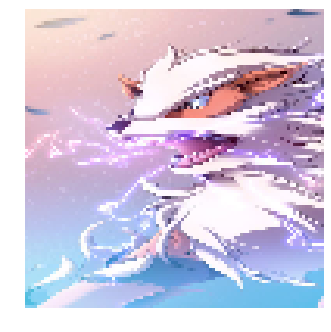

In [0]:
show_images(np.asarray(img_array[3119:3200], dtype = np.float32))
plt.show()

#Discriminator

In [0]:
def discriminator(x,isTrain,keep_prob):
  
    with tf.variable_scope("discriminator"):
        
        
        print(x.shape)
        #print([-1,tf.sqrt(tf.cast(x.shape[1],tf.float32)),tf.sqrt(tf.cast(x.shape[1],tf.float32)),1])
        #x = tf.reshape(x,[-1,(int)((int)(x.shape[1])**.5),(int)((int)(x.shape[1])**.5),1])
        
        x = tf.reshape(x,[-1,96,96,3])
        
        print(x.shape)
        
        logits = tf.layers.conv2d(x,128,5, kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        logits = tf.nn.leaky_relu(logits, alpha = 0.01)
        #logits = tf.layers.dropout(logits, rate=1-keep_prob,training=isTrain)
        #logits = tf.layers.batch_normalization(logits, training = isTrain)
        logits = tf.layers.max_pooling2d(logits,2,2)
        
        logits = tf.layers.conv2d(logits,256,5, kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        logits = tf.nn.leaky_relu(logits, alpha = 0.01)
        #logits = tf.layers.dropout(logits, rate=1-keep_prob,training=isTrain)
        #logits = tf.layers.batch_normalization(logits, training = isTrain)
        logits = tf.layers.max_pooling2d(logits,2,2)
        
        logits = tf.layers.conv2d(logits,512,5, kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        logits = tf.nn.leaky_relu(logits, alpha = 0.01)
        #logits = tf.layers.dropout(logits, rate=1-keep_prob,training=isTrain)
        #logits = tf.layers.batch_normalization(logits, training = isTrain)
        logits = tf.layers.max_pooling2d(logits,2,2)
        
        logits = tf.layers.conv2d(logits,1024,5, kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        logits = tf.nn.leaky_relu(logits, alpha = 0.01)
        #logits = tf.layers.dropout(logits, rate=1-keep_prob,training=isTrain)
        #logits = tf.layers.batch_normalization(logits, training = isTrain)
        logits = tf.layers.max_pooling2d(logits,2,2)
        
        logits = tf.layers.flatten(logits)
        
        logits = tf.layers.dense(logits, 1, name = 'discriminator_out', kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        
        return logits


# Generator

In [0]:
def generator(z,isTrain,keep_prob):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    with tf.variable_scope("generator"):
        # TODO: implement architecture
        
        #print(z.shape)     
        
        img = tf.layers.dense(z, 6*6*1024, activation = tf.nn.leaky_relu, kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        img = tf.layers.batch_normalization(img, training = isTrain)
        '''
        img = tf.layers.dense(img, 32*16*16, activation = tf.nn.relu, kernel_initializer=tf.random_normal_initializer(dtype=tf.float16) )
        img = tf.layers.batch_normalization(img, training = isTrain)
        '''
        img = tf.reshape(img,[-1,6,6,1024])
        
        img = tf.layers.conv2d_transpose(img, 512, 3, strides = 2, activation = tf.nn.leaky_relu, padding ='same', kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        #img = tf.nn.dropout(img, keep_prob=keep_prob)
        img = tf.layers.batch_normalization(img, training = isTrain)
        
        img = tf.layers.conv2d_transpose(img, 256, 3, strides = 2, activation = tf.nn.leaky_relu, padding ='same', kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        #img = tf.nn.dropout(img, keep_prob=keep_prob)
        img = tf.layers.batch_normalization(img, training = isTrain)
        
        img = tf.layers.conv2d_transpose(img, 128, 3, strides = 2, activation = tf.nn.leaky_relu, padding ='same', kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        #img = tf.nn.dropout(img, keep_prob=keep_prob)
        img = tf.layers.batch_normalization(img, training = isTrain)
        
        img = tf.layers.conv2d_transpose(img, 3, 3, strides = 2, padding ='same', name = 'generator_out', kernel_initializer=tf.variance_scaling_initializer(dtype = tf.float32))
        img = tf.nn.tanh(img)
        
        print(img.shape)
        
        #img  = tf.layers.flatten(img)
        
        pass
        return img

In [0]:
def get_solvers(learning_rate=1e-4, beta1=0, beta2=0.9):

    D_solver = None
    G_solver = None
    
    D_solver = tf.train.AdamOptimizer(learning_rate = learning_rate, beta1 = beta1, beta2=beta2, name = 'D_solver_adam')
    G_solver = tf.train.AdamOptimizer(learning_rate = learning_rate, beta1 = beta1, beta2=beta2, name = 'G_solver_adam')
    
    pass
    return D_solver, G_solver

In [0]:
def wgan_loss(logits_real, logits_fake, real_data, fake_data,keep_prob,isTrain, batch_size = 32):

  lambd = 10
  G_loss = -tf.reduce_mean(logits_fake)
  D_loss = tf.reduce_mean(logits_fake) - tf.reduce_mean(logits_real) 
  
  #Implement gradient penalty
  epsilon = tf.random_uniform([batch_size,1,1,1], minval = 0, maxval = 1)
  #interpolates = tf.multiply((1-epsilon),real_data)+tf.multiply(epsilon,fake_data) #introduce randomness using epsilon
  interpolates = (1-epsilon)*real_data + epsilon* fake_data
  with tf.variable_scope('', reuse =True):
      grads = tf.gradients(discriminator(interpolates,isTrain,keep_prob), [interpolates])[0] #why is this zero used?
  
  slopes = tf.sqrt(tf.reduce_sum(tf.square(grads))) #L2-norm
  grad_penalty = tf.reduce_mean((slopes-1.)**2)#penalty is a scalar
  
  D_loss += lambd*grad_penalty
    
  pass
  return D_loss, G_loss

In [0]:
tf.reset_default_graph()

batch_size = 32
# our noise dimension
noise_dim = 100

# placeholders for images from the training dataset
x = tf.placeholder(tf.float32, [None, 96, 96, 3])
isTrain = tf.placeholder(tf.bool, shape=(), name = 'isTrain')
keep_prob = tf.placeholder_with_default(1.0, shape=())

z = tf.random_uniform([batch_size,noise_dim],minval = -1, maxval = 1)
# generated images

G_sample = generator(z,isTrain,keep_prob)

#Variable to store D_loss of each epoch
d_losses = []

#Run when D_loss and G_loss are called
with tf.variable_scope("") as scope:
    logits_real = discriminator(x,isTrain,keep_prob)
    fake_data = G_sample
    scope.reuse_variables()
    logits_fake = discriminator(fake_data,isTrain,keep_prob)

# Get the list of variables for the discriminator and generator
D_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES,'discriminator')
G_vars = tf.get_collection(tf.GraphKeys.TRAINABLE_VARIABLES,'generator') 


D_solver,G_solver = get_solvers()
D_loss, G_loss = wgan_loss(logits_real, logits_fake, x, fake_data,keep_prob,isTrain, batch_size = batch_size)




#Update extra variables like batch_norm gamma and beta
D_extra_step = tf.get_collection(tf.GraphKeys.UPDATE_OPS,'discriminator')
G_extra_step = tf.get_collection(tf.GraphKeys.UPDATE_OPS,'generator')


with tf.control_dependencies(D_extra_step):
  D_train_step = D_solver.minimize(D_loss, var_list=D_vars)

with tf.control_dependencies(G_extra_step):
  G_train_step = G_solver.minimize(G_loss, var_list=G_vars)


(32, 96, 96, 3)
(?, 96, 96, 3)
(?, 96, 96, 3)
(32, 96, 96, 3)
(32, 96, 96, 3)
(32, 96, 96, 3)
(32, 96, 96, 3)


In [0]:
def minibatches(inputs, batchsize):
    indices = np.arange(inputs.shape[0])
    np.random.shuffle(indices)
    x = []
    for i in range(batchsize):
        x.append(inputs[indices[i]])
    return np.asarray(x)

In [0]:
def run_a_gan(sess, G_train_step, G_loss, D_train_step, D_loss, G_extra_step, D_extra_step, saver,
                     show_every=20, print_every=1, batch_size=32, num_epoch=10):
   
   
    for epoch in range(20399,20399+num_epoch):
        prob = 1 - 0.4**epoch #ranges from 0.6 to 1
        #X = minibatches(img_array,batch_size)
        # every so often, show a sample result
        if (epoch % show_every == 0):
            samples = sess.run(G_sample, feed_dict={isTrain:False})
            fig = show_images(samples[:4])
            plt.show()
            #Save image samples generated while training
            
            print()
        
        _, G_loss_curr = sess.run([G_train_step, G_loss], feed_dict={isTrain:True,keep_prob:prob})
           
        #Train critic 5 times per epoch
        for _ in range(5):
          X = minibatches(img_array,batch_size)
          _, D_loss_curr = sess.run([D_train_step, D_loss], feed_dict={x: X, isTrain:True,keep_prob:prob})
          

        #Various displays
        if (epoch % print_every == 0):
            print('Epoch: {}, D: {:.4}, G: {:.4}'.format(epoch,D_loss_curr,G_loss_curr))
        
        #Save stuff every 400 epochs
        if (epoch % 400 == 399):    
          try: 
            saver.save(sess, 'drive/Pokemon_Fire/Final_Checkpoints/Model_'+str(epoch)+'.ckpt')
            np.save('drive/Pokemon_Fire/Final_Discriminator_loss.npy', np.asarray(d_losses))
          except:
            pass
          
          
        d_losses.append(D_loss_curr)
          
        if(epoch%500 == 0):  
          try:
            if(epoch>=1000):
                 with h5py.File('drive/Pokemon_Fire/Final_gen_while_training.h5','a') as file:
                     file.create_dataset('Samples'+str(epoch),samples.shape, np.float32)
                     file['Samples'+str(epoch)][...] = np.asarray(samples, dtype = np.float32)
          except:
            pass

    
    saver.save(sess, 'drive/Pokemon_Fire/Final_Checkpoint_Complete/model.ckpt')
    
    print('Final images')
    samples = sess.run(G_sample, feed_dict={isTrain:False})
    fig = show_images(samples1[:4])
    plt.show()

drive/Pokemon_Fire/Final_Checkpoints/Model_20399.ckpt
INFO:tensorflow:Restoring parameters from drive/Pokemon_Fire/Final_Checkpoints/Model_20399.ckpt
Restored!
Epoch: 20399, D: -5.838, G: 3.632


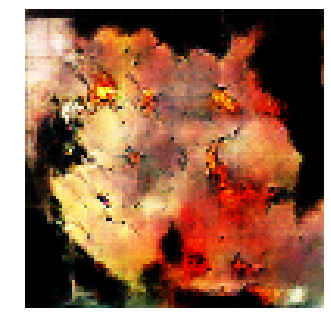


Epoch: 20400, D: -7.874, G: 3.666
Epoch: 20401, D: -5.259, G: 3.547
Epoch: 20402, D: -6.018, G: 5.345
Epoch: 20403, D: -7.179, G: 2.503
Epoch: 20404, D: -5.901, G: 2.847
Epoch: 20405, D: -6.359, G: 4.026
Epoch: 20406, D: -5.674, G: 2.94
Epoch: 20407, D: -6.659, G: 4.417
Epoch: 20408, D: -5.752, G: 2.591
Epoch: 20409, D: -7.011, G: 2.938
Epoch: 20410, D: -6.708, G: 3.873
Epoch: 20411, D: -5.951, G: 4.58
Epoch: 20412, D: -5.344, G: 3.97
Epoch: 20413, D: -5.037, G: 3.389
Epoch: 20414, D: -6.88, G: 4.892
Epoch: 20415, D: -7.312, G: 3.185
Epoch: 20416, D: -5.666, G: 4.868
Epoch: 20417, D: -5.712, G: 3.503
Epoch: 20418, D: -5.726, G: 6.908
Epoch: 20419, D: -5.897, G: 2.274


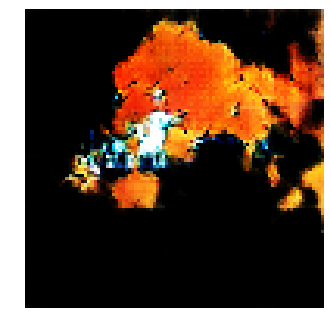


Epoch: 20420, D: -6.048, G: 4.431
Epoch: 20421, D: -6.559, G: 5.158
Epoch: 20422, D: -5.783, G: 3.951
Epoch: 20423, D: -6.491, G: 1.898
Epoch: 20424, D: -6.065, G: 3.043
Epoch: 20425, D: -5.06, G: 2.209
Epoch: 20426, D: -6.545, G: 3.525
Epoch: 20427, D: -6.261, G: 1.945
Epoch: 20428, D: -6.156, G: 4.2
Epoch: 20429, D: -5.964, G: 4.268
Epoch: 20430, D: -6.353, G: 2.375
Epoch: 20431, D: -6.607, G: 3.45
Epoch: 20432, D: -6.79, G: 4.648
Epoch: 20433, D: -6.644, G: 3.173
Epoch: 20434, D: -5.864, G: 4.467
Epoch: 20435, D: -7.02, G: 4.541
Epoch: 20436, D: -5.818, G: 4.279
Epoch: 20437, D: -6.324, G: 4.092
Epoch: 20438, D: -5.064, G: 3.069
Epoch: 20439, D: -6.218, G: 3.528


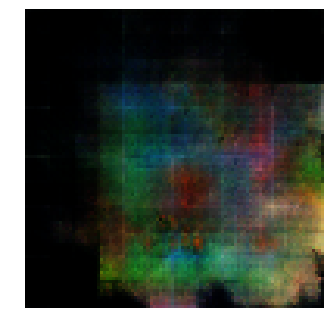


Epoch: 20440, D: -5.691, G: 3.494
Epoch: 20441, D: -6.544, G: 3.68
Epoch: 20442, D: -4.806, G: 3.992
Epoch: 20443, D: -4.942, G: 2.859
Epoch: 20444, D: -6.858, G: 3.482
Epoch: 20445, D: -6.43, G: 3.579
Epoch: 20446, D: -5.565, G: 3.88
Epoch: 20447, D: -5.169, G: 3.687
Epoch: 20448, D: -6.424, G: 4.385
Epoch: 20449, D: -5.23, G: 4.561
Epoch: 20450, D: -5.031, G: 3.175
Epoch: 20451, D: -4.986, G: 1.987
Epoch: 20452, D: -4.81, G: 2.776
Epoch: 20453, D: -5.647, G: 2.427
Epoch: 20454, D: -5.718, G: 2.92
Epoch: 20455, D: -6.057, G: 1.769
Epoch: 20456, D: -5.36, G: 1.055
Epoch: 20457, D: -6.547, G: 3.791
Epoch: 20458, D: -5.359, G: 1.919
Epoch: 20459, D: -5.193, G: 3.633


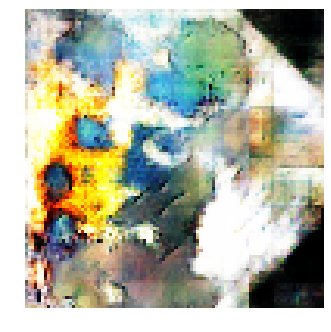


Epoch: 20460, D: -5.428, G: 2.72
Epoch: 20461, D: -5.402, G: 1.978
Epoch: 20462, D: -7.197, G: 4.03
Epoch: 20463, D: -7.11, G: 1.405
Epoch: 20464, D: -6.337, G: 1.869
Epoch: 20465, D: -6.48, G: 2.127
Epoch: 20466, D: -6.586, G: 4.512
Epoch: 20467, D: -5.485, G: 2.69
Epoch: 20468, D: -5.463, G: 2.96
Epoch: 20469, D: -6.874, G: 3.557
Epoch: 20470, D: -7.093, G: 5.752
Epoch: 20471, D: -6.598, G: 2.653
Epoch: 20472, D: -5.94, G: 3.912
Epoch: 20473, D: -5.95, G: 2.678
Epoch: 20474, D: -6.154, G: 3.887
Epoch: 20475, D: -7.809, G: 6.485
Epoch: 20476, D: -6.351, G: 5.044
Epoch: 20477, D: -6.323, G: 4.9
Epoch: 20478, D: -5.903, G: 1.901
Epoch: 20479, D: -6.463, G: 3.14


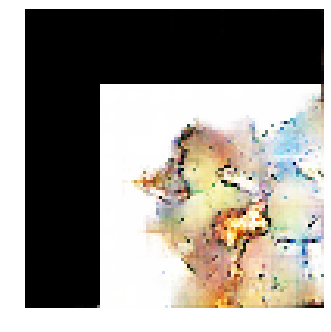


Epoch: 20480, D: -6.413, G: 4.234
Epoch: 20481, D: -4.773, G: 6.092
Epoch: 20482, D: -6.431, G: 5.686
Epoch: 20483, D: -5.545, G: 4.239
Epoch: 20484, D: -4.96, G: 4.181
Epoch: 20485, D: -5.099, G: 4.029
Epoch: 20486, D: -5.979, G: 2.491
Epoch: 20487, D: -5.771, G: 3.837
Epoch: 20488, D: -4.798, G: 4.689
Epoch: 20489, D: -6.969, G: 3.244
Epoch: 20490, D: -5.679, G: 2.187
Epoch: 20491, D: -5.58, G: 4.116
Epoch: 20492, D: -5.195, G: 2.98
Epoch: 20493, D: -5.47, G: 4.846
Epoch: 20494, D: -6.346, G: 4.445
Epoch: 20495, D: -6.313, G: 2.631
Epoch: 20496, D: -5.678, G: 1.97
Epoch: 20497, D: -6.271, G: 5.603
Epoch: 20498, D: -6.203, G: 4.015
Epoch: 20499, D: -6.863, G: 2.796


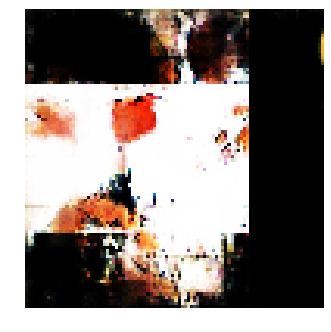


Epoch: 20500, D: -5.207, G: 2.721
Epoch: 20501, D: -5.645, G: 3.541
Epoch: 20502, D: -7.031, G: 2.72
Epoch: 20503, D: -6.861, G: 2.949
Epoch: 20504, D: -5.993, G: 5.321
Epoch: 20505, D: -5.65, G: 3.702
Epoch: 20506, D: -7.251, G: 6.542
Epoch: 20507, D: -6.594, G: 3.734
Epoch: 20508, D: -5.42, G: 4.845
Epoch: 20509, D: -6.316, G: 2.257
Epoch: 20510, D: -4.945, G: 5.032
Epoch: 20511, D: -5.851, G: 4.894
Epoch: 20512, D: -6.398, G: 5.882
Epoch: 20513, D: -6.305, G: 2.291
Epoch: 20514, D: -5.69, G: 3.841
Epoch: 20515, D: -5.956, G: 5.466
Epoch: 20516, D: -7.532, G: 5.71
Epoch: 20517, D: -5.147, G: 4.62
Epoch: 20518, D: -5.36, G: 4.047
Epoch: 20519, D: -5.037, G: 4.056


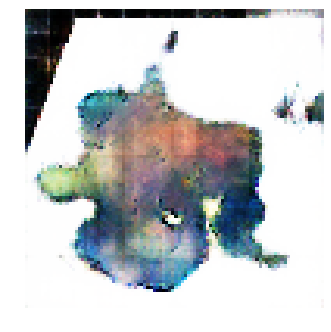


Epoch: 20520, D: -7.271, G: 2.958
Epoch: 20521, D: -6.297, G: 4.481
Epoch: 20522, D: -8.055, G: 2.043
Epoch: 20523, D: -6.105, G: 2.788
Epoch: 20524, D: -7.111, G: 3.846
Epoch: 20525, D: -7.441, G: 2.796
Epoch: 20526, D: -7.209, G: 4.957
Epoch: 20527, D: -7.7, G: 3.833
Epoch: 20528, D: -5.971, G: 2.298
Epoch: 20529, D: -5.662, G: 2.575
Epoch: 20530, D: -4.817, G: 5.317
Epoch: 20531, D: -4.937, G: 4.185
Epoch: 20532, D: -6.472, G: 4.574
Epoch: 20533, D: -6.493, G: 3.668
Epoch: 20534, D: -6.491, G: 4.185
Epoch: 20535, D: -6.004, G: 2.886
Epoch: 20536, D: -6.646, G: 4.714
Epoch: 20537, D: -5.794, G: 3.91
Epoch: 20538, D: -6.719, G: 5.338
Epoch: 20539, D: -5.233, G: 1.762


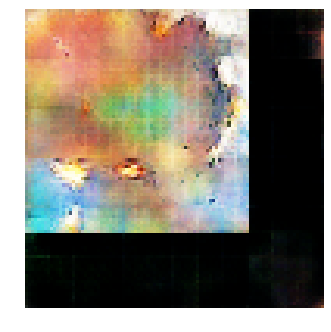


Epoch: 20540, D: -5.321, G: 5.863
Epoch: 20541, D: -5.962, G: 2.826
Epoch: 20542, D: -6.241, G: 3.995
Epoch: 20543, D: -6.397, G: 4.764
Epoch: 20544, D: -6.382, G: 3.526
Epoch: 20545, D: -6.02, G: 5.543
Epoch: 20546, D: -5.979, G: 3.985
Epoch: 20547, D: -7.475, G: 4.945
Epoch: 20548, D: -5.826, G: 3.485
Epoch: 20549, D: -5.875, G: 4.759
Epoch: 20550, D: -5.888, G: 3.362
Epoch: 20551, D: -7.096, G: 3.078
Epoch: 20552, D: -7.372, G: 3.297
Epoch: 20553, D: -6.301, G: 3.173
Epoch: 20554, D: -5.589, G: 3.222
Epoch: 20555, D: -7.717, G: 5.668
Epoch: 20556, D: -6.523, G: 5.076
Epoch: 20557, D: -6.571, G: 6.022
Epoch: 20558, D: -6.435, G: 3.207
Epoch: 20559, D: -6.239, G: 4.407


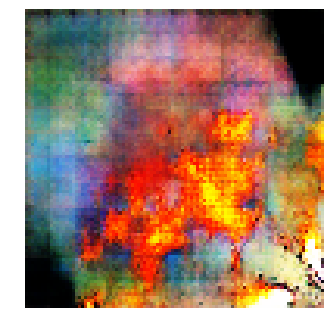


Epoch: 20560, D: -5.163, G: 3.909
Epoch: 20561, D: -6.512, G: 4.376
Epoch: 20562, D: -5.948, G: 2.73
Epoch: 20563, D: -5.825, G: 2.553
Epoch: 20564, D: -5.622, G: 3.652
Epoch: 20565, D: -5.808, G: 4.22
Epoch: 20566, D: -5.519, G: 3.285
Epoch: 20567, D: -4.883, G: 3.083
Epoch: 20568, D: -5.841, G: 3.459
Epoch: 20569, D: -5.998, G: 1.491
Epoch: 20570, D: -4.798, G: 5.389
Epoch: 20571, D: -6.768, G: 3.601
Epoch: 20572, D: -6.116, G: 3.404
Epoch: 20573, D: -6.186, G: 3.723
Epoch: 20574, D: -6.953, G: 5.086
Epoch: 20575, D: -7.652, G: 3.823
Epoch: 20576, D: -5.901, G: 7.175
Epoch: 20577, D: -7.192, G: 4.764
Epoch: 20578, D: -6.954, G: 4.902
Epoch: 20579, D: -5.478, G: 4.145


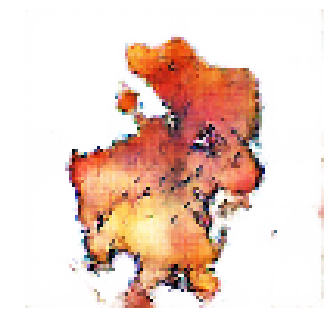


Epoch: 20580, D: -7.288, G: 5.622
Epoch: 20581, D: -5.383, G: 2.313
Epoch: 20582, D: -5.18, G: 5.335
Epoch: 20583, D: -5.756, G: 3.781
Epoch: 20584, D: -5.348, G: 5.254
Epoch: 20585, D: -4.25, G: 2.822
Epoch: 20586, D: -6.764, G: 4.814
Epoch: 20587, D: -6.12, G: 3.312
Epoch: 20588, D: -7.418, G: 3.637
Epoch: 20589, D: -6.369, G: 4.249
Epoch: 20590, D: -4.911, G: 4.67
Epoch: 20591, D: -4.813, G: 4.79
Epoch: 20592, D: -5.25, G: 3.494
Epoch: 20593, D: -6.401, G: 2.998
Epoch: 20594, D: -6.276, G: 1.681
Epoch: 20595, D: -5.833, G: 1.41
Epoch: 20596, D: -6.738, G: 2.669
Epoch: 20597, D: -6.307, G: 3.949
Epoch: 20598, D: -4.928, G: 4.326
Epoch: 20599, D: -5.739, G: 3.502


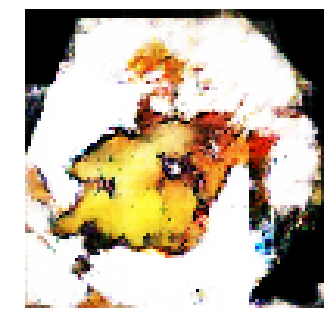


Epoch: 20600, D: -6.445, G: 3.782
Epoch: 20601, D: -7.036, G: 3.529
Epoch: 20602, D: -6.09, G: 3.945
Epoch: 20603, D: -6.442, G: 5.567
Epoch: 20604, D: -5.359, G: 4.986
Epoch: 20605, D: -5.37, G: 6.663
Epoch: 20606, D: -6.683, G: 4.086
Epoch: 20607, D: -7.08, G: 4.341
Epoch: 20608, D: -4.708, G: 4.716
Epoch: 20609, D: -5.093, G: 5.116
Epoch: 20610, D: -7.594, G: 5.15
Epoch: 20611, D: -5.708, G: 2.384
Epoch: 20612, D: -7.149, G: 3.138
Epoch: 20613, D: -6.971, G: 3.433
Epoch: 20614, D: -4.851, G: 4.497
Epoch: 20615, D: -6.902, G: 4.891
Epoch: 20616, D: -6.453, G: 1.932
Epoch: 20617, D: -6.994, G: 4.735
Epoch: 20618, D: -6.485, G: 4.561
Epoch: 20619, D: -6.928, G: 3.545


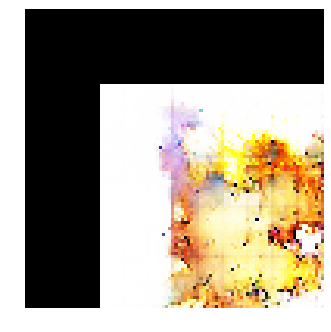


Epoch: 20620, D: -6.549, G: 5.848
Epoch: 20621, D: -5.782, G: 3.96
Epoch: 20622, D: -6.433, G: 4.071
Epoch: 20623, D: -5.28, G: 3.539
Epoch: 20624, D: -4.935, G: 3.351
Epoch: 20625, D: -6.995, G: 5.106
Epoch: 20626, D: -6.434, G: 2.49
Epoch: 20627, D: -5.306, G: 3.458
Epoch: 20628, D: -6.244, G: 3.389
Epoch: 20629, D: -7.09, G: 1.19
Epoch: 20630, D: -5.659, G: 2.846
Epoch: 20631, D: -5.329, G: 2.674
Epoch: 20632, D: -6.384, G: 1.466
Epoch: 20633, D: -5.316, G: 5.252
Epoch: 20634, D: -4.975, G: 3.177
Epoch: 20635, D: -5.696, G: 5.688
Epoch: 20636, D: -4.694, G: 5.245
Epoch: 20637, D: -5.55, G: 2.916
Epoch: 20638, D: -7.173, G: 4.589
Epoch: 20639, D: -5.981, G: 3.791


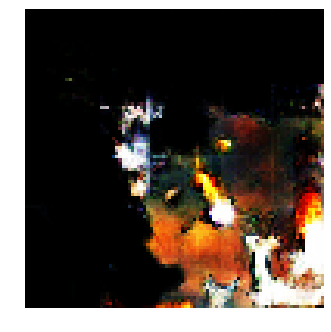


Epoch: 20640, D: -5.675, G: 2.913
Epoch: 20641, D: -6.399, G: 4.17
Epoch: 20642, D: -4.393, G: 3.549
Epoch: 20643, D: -5.988, G: 5.346
Epoch: 20644, D: -5.624, G: 2.846
Epoch: 20645, D: -5.631, G: 1.465
Epoch: 20646, D: -6.373, G: 4.035
Epoch: 20647, D: -5.546, G: 3.349
Epoch: 20648, D: -5.193, G: 5.218
Epoch: 20649, D: -5.981, G: 4.834
Epoch: 20650, D: -4.589, G: 3.559
Epoch: 20651, D: -5.273, G: 4.069
Epoch: 20652, D: -5.308, G: 3.844
Epoch: 20653, D: -7.666, G: 2.956
Epoch: 20654, D: -6.216, G: 2.537
Epoch: 20655, D: -6.2, G: 2.955
Epoch: 20656, D: -5.05, G: 3.461
Epoch: 20657, D: -5.801, G: 3.157
Epoch: 20658, D: -5.566, G: 3.174
Epoch: 20659, D: -6.094, G: 2.595


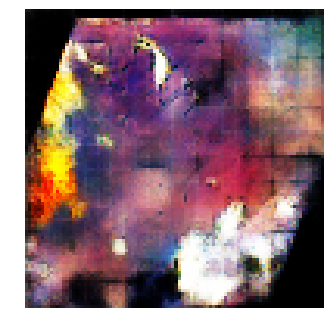


Epoch: 20660, D: -5.546, G: 2.248
Epoch: 20661, D: -5.532, G: 3.953
Epoch: 20662, D: -6.513, G: 4.559
Epoch: 20663, D: -6.779, G: 4.807
Epoch: 20664, D: -5.16, G: 1.566
Epoch: 20665, D: -5.561, G: 2.515
Epoch: 20666, D: -7.526, G: 2.906
Epoch: 20667, D: -7.428, G: 2.069
Epoch: 20668, D: -6.221, G: 5.291
Epoch: 20669, D: -6.214, G: 6.941
Epoch: 20670, D: -4.3, G: 3.868
Epoch: 20671, D: -5.258, G: 2.4
Epoch: 20672, D: -6.547, G: 5.464
Epoch: 20673, D: -6.213, G: 3.16
Epoch: 20674, D: -5.585, G: 2.787
Epoch: 20675, D: -5.817, G: 4.511
Epoch: 20676, D: -5.197, G: 2.651
Epoch: 20677, D: -5.749, G: 3.161
Epoch: 20678, D: -5.246, G: 4.253
Epoch: 20679, D: -4.555, G: 5.446


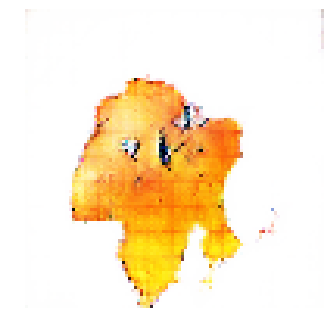


Epoch: 20680, D: -6.107, G: 3.428
Epoch: 20681, D: -6.685, G: 4.511
Epoch: 20682, D: -5.677, G: 0.868
Epoch: 20683, D: -5.925, G: 5.71
Epoch: 20684, D: -6.581, G: 4.726
Epoch: 20685, D: -5.61, G: 1.777
Epoch: 20686, D: -6.664, G: 4.133
Epoch: 20687, D: -5.698, G: 4.126
Epoch: 20688, D: -5.802, G: 4.385
Epoch: 20689, D: -6.582, G: 4.06
Epoch: 20690, D: -6.237, G: 3.925
Epoch: 20691, D: -5.359, G: 4.586
Epoch: 20692, D: -7.768, G: 4.541
Epoch: 20693, D: -4.705, G: 3.881
Epoch: 20694, D: -6.133, G: 4.118
Epoch: 20695, D: -6.197, G: 2.363
Epoch: 20696, D: -5.905, G: 2.196
Epoch: 20697, D: -6.259, G: 1.509
Epoch: 20698, D: -8.078, G: 3.209
Epoch: 20699, D: -5.262, G: 2.542


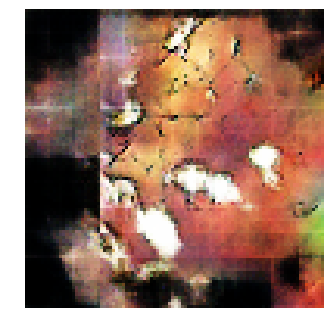


Epoch: 20700, D: -5.533, G: 3.638
Epoch: 20701, D: -5.495, G: 7.174
Epoch: 20702, D: -4.073, G: 3.776
Epoch: 20703, D: -7.384, G: 4.486
Epoch: 20704, D: -5.53, G: 5.169
Epoch: 20705, D: -4.382, G: 6.084
Epoch: 20706, D: -4.968, G: 2.943
Epoch: 20707, D: -5.351, G: 3.98
Epoch: 20708, D: -5.376, G: 4.485
Epoch: 20709, D: -6.338, G: 4.921
Epoch: 20710, D: -6.515, G: 3.587
Epoch: 20711, D: -6.548, G: 2.856
Epoch: 20712, D: -6.227, G: 3.076
Epoch: 20713, D: -6.31, G: 3.278
Epoch: 20714, D: -6.481, G: 5.031
Epoch: 20715, D: -6.287, G: 5.198
Epoch: 20716, D: -5.018, G: 2.245
Epoch: 20717, D: -7.548, G: 3.683
Epoch: 20718, D: -6.635, G: 2.933
Epoch: 20719, D: -5.045, G: 3.29


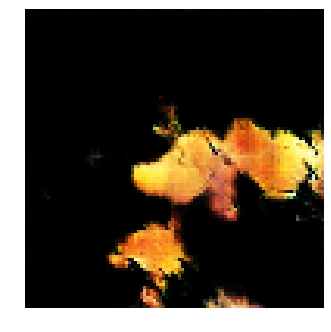


Epoch: 20720, D: -6.843, G: 3.236
Epoch: 20721, D: -5.724, G: 1.245
Epoch: 20722, D: -6.384, G: 4.214
Epoch: 20723, D: -6.467, G: 4.421
Epoch: 20724, D: -6.54, G: 2.894
Epoch: 20725, D: -4.501, G: 3.234
Epoch: 20726, D: -6.798, G: 5.703
Epoch: 20727, D: -5.015, G: 5.083
Epoch: 20728, D: -5.893, G: 2.311
Epoch: 20729, D: -5.35, G: 4.204
Epoch: 20730, D: -6.042, G: 2.109
Epoch: 20731, D: -5.468, G: 4.932
Epoch: 20732, D: -4.653, G: 2.105
Epoch: 20733, D: -4.368, G: 4.011
Epoch: 20734, D: -5.865, G: 3.832
Epoch: 20735, D: -5.226, G: 4.907
Epoch: 20736, D: -6.514, G: 4.459
Epoch: 20737, D: -6.875, G: 5.669
Epoch: 20738, D: -6.525, G: 2.214
Epoch: 20739, D: -5.935, G: 3.42


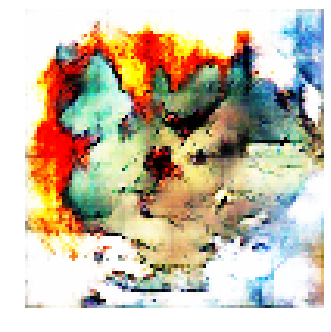


Epoch: 20740, D: -7.34, G: 6.167
Epoch: 20741, D: -5.66, G: 4.198
Epoch: 20742, D: -5.902, G: 5.936
Epoch: 20743, D: -6.181, G: 3.074
Epoch: 20744, D: -6.465, G: 3.414
Epoch: 20745, D: -4.53, G: 5.586
Epoch: 20746, D: -6.175, G: 4.198
Epoch: 20747, D: -4.435, G: 2.805
Epoch: 20748, D: -5.334, G: 3.383
Epoch: 20749, D: -6.212, G: 5.035
Epoch: 20750, D: -5.163, G: 2.503
Epoch: 20751, D: -4.933, G: 3.888
Epoch: 20752, D: -5.098, G: 5.879
Epoch: 20753, D: -6.883, G: 2.927
Epoch: 20754, D: -5.34, G: 3.755
Epoch: 20755, D: -6.921, G: 3.825
Epoch: 20756, D: -5.191, G: 3.013
Epoch: 20757, D: -6.808, G: 2.192
Epoch: 20758, D: -5.553, G: 2.688
Epoch: 20759, D: -7.476, G: 4.817


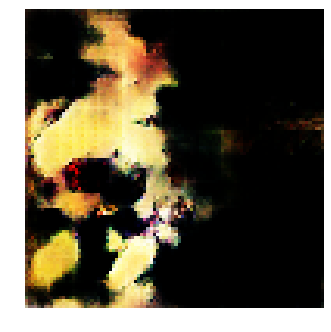


Epoch: 20760, D: -6.317, G: 3.812
Epoch: 20761, D: -5.75, G: 4.457
Epoch: 20762, D: -7.02, G: 3.893
Epoch: 20763, D: -5.939, G: 3.681
Epoch: 20764, D: -5.072, G: 3.581
Epoch: 20765, D: -5.554, G: 4.48
Epoch: 20766, D: -6.099, G: 2.043
Epoch: 20767, D: -6.061, G: 4.334
Epoch: 20768, D: -6.259, G: 2.606
Epoch: 20769, D: -5.393, G: 2.536
Epoch: 20770, D: -3.991, G: 4.903
Epoch: 20771, D: -6.325, G: 5.257
Epoch: 20772, D: -4.445, G: 3.053
Epoch: 20773, D: -5.728, G: 2.494
Epoch: 20774, D: -6.096, G: 5.676
Epoch: 20775, D: -5.79, G: 6.046
Epoch: 20776, D: -5.236, G: 4.484
Epoch: 20777, D: -7.236, G: 3.959
Epoch: 20778, D: -7.229, G: 5.199
Epoch: 20779, D: -5.032, G: 5.001


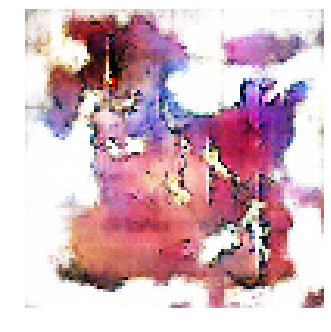


Epoch: 20780, D: -5.789, G: 5.204
Epoch: 20781, D: -5.535, G: 3.658
Epoch: 20782, D: -5.708, G: 2.786
Epoch: 20783, D: -5.965, G: 2.03
Epoch: 20784, D: -5.411, G: 3.394
Epoch: 20785, D: -6.012, G: 3.471
Epoch: 20786, D: -6.516, G: 3.438
Epoch: 20787, D: -6.234, G: 4.69
Epoch: 20788, D: -6.363, G: 1.936
Epoch: 20789, D: -5.626, G: 3.933
Epoch: 20790, D: -5.823, G: 3.6
Epoch: 20791, D: -4.689, G: 4.794
Epoch: 20792, D: -7.139, G: 3.798
Epoch: 20793, D: -5.938, G: 2.355
Epoch: 20794, D: -5.607, G: 3.664
Epoch: 20795, D: -6.46, G: 4.293
Epoch: 20796, D: -6.436, G: 3.609
Epoch: 20797, D: -4.715, G: 2.628
Epoch: 20798, D: -4.959, G: 4.639
Epoch: 20799, D: -5.012, G: 3.443


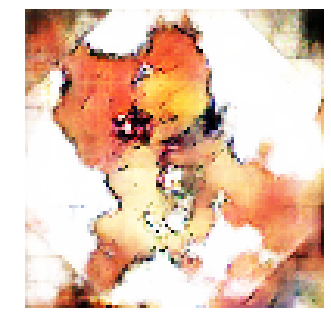


Epoch: 20800, D: -5.504, G: 5.402
Epoch: 20801, D: -6.615, G: 4.761
Epoch: 20802, D: -5.631, G: 3.1
Epoch: 20803, D: -6.774, G: 4.83
Epoch: 20804, D: -5.452, G: 2.705
Epoch: 20805, D: -5.425, G: 4.405
Epoch: 20806, D: -6.762, G: 5.825
Epoch: 20807, D: -6.398, G: 3.662
Epoch: 20808, D: -5.46, G: 1.322
Epoch: 20809, D: -5.745, G: 5.388
Epoch: 20810, D: -5.651, G: 4.823
Epoch: 20811, D: -4.489, G: 3.784
Epoch: 20812, D: -6.404, G: 3.064
Epoch: 20813, D: -6.518, G: 1.945
Epoch: 20814, D: -6.703, G: 6.129
Epoch: 20815, D: -5.926, G: 6.208
Epoch: 20816, D: -5.929, G: 3.369
Epoch: 20817, D: -6.146, G: 2.997
Epoch: 20818, D: -5.886, G: 2.915
Epoch: 20819, D: -5.707, G: 4.241


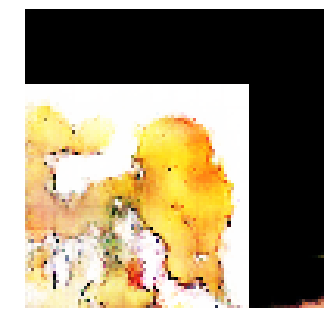


Epoch: 20820, D: -4.895, G: 2.468
Epoch: 20821, D: -7.012, G: 3.076
Epoch: 20822, D: -5.611, G: 2.308
Epoch: 20823, D: -4.808, G: 3.059
Epoch: 20824, D: -5.656, G: 3.556
Epoch: 20825, D: -5.72, G: 3.062
Epoch: 20826, D: -7.085, G: 5.388
Epoch: 20827, D: -6.207, G: 2.91
Epoch: 20828, D: -6.002, G: 3.082
Epoch: 20829, D: -5.152, G: 0.7381
Epoch: 20830, D: -6.34, G: 3.051
Epoch: 20831, D: -6.249, G: 4.599
Epoch: 20832, D: -6.198, G: 2.13
Epoch: 20833, D: -5.091, G: 3.536
Epoch: 20834, D: -4.981, G: 2.622
Epoch: 20835, D: -5.956, G: 3.721
Epoch: 20836, D: -7.023, G: 2.354
Epoch: 20837, D: -6.311, G: 3.178
Epoch: 20838, D: -5.91, G: 2.448
Epoch: 20839, D: -5.551, G: 1.841


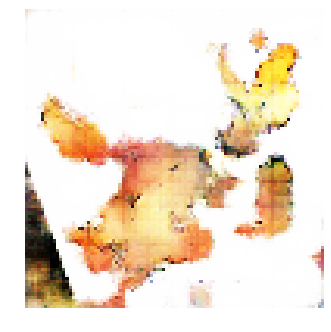


Epoch: 20840, D: -5.447, G: 2.998
Epoch: 20841, D: -5.054, G: 1.909
Epoch: 20842, D: -5.572, G: 1.989
Epoch: 20843, D: -6.329, G: 3.298
Epoch: 20844, D: -5.784, G: 4.802
Epoch: 20845, D: -6.006, G: 2.924
Epoch: 20846, D: -6.735, G: 3.501
Epoch: 20847, D: -7.701, G: 5.411
Epoch: 20848, D: -7.159, G: 4.95
Epoch: 20849, D: -6.452, G: 6.007
Epoch: 20850, D: -5.938, G: 4.559
Epoch: 20851, D: -5.757, G: 3.836
Epoch: 20852, D: -6.865, G: 4.023
Epoch: 20853, D: -6.205, G: 4.49
Epoch: 20854, D: -7.089, G: 5.822
Epoch: 20855, D: -6.707, G: 4.415
Epoch: 20856, D: -6.813, G: 3.839
Epoch: 20857, D: -3.661, G: 3.818
Epoch: 20858, D: -6.21, G: 3.73
Epoch: 20859, D: -6.863, G: 3.581


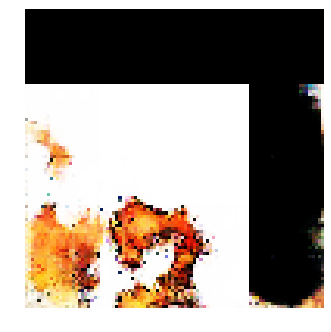


Epoch: 20860, D: -4.559, G: 3.431
Epoch: 20861, D: -5.355, G: 5.042
Epoch: 20862, D: -7.304, G: 5.951
Epoch: 20863, D: -5.961, G: 2.662
Epoch: 20864, D: -7.086, G: 4.56
Epoch: 20865, D: -5.456, G: 1.933
Epoch: 20866, D: -6.329, G: 4.389
Epoch: 20867, D: -6.265, G: 2.316
Epoch: 20868, D: -5.35, G: 4.033
Epoch: 20869, D: -5.617, G: 5.76
Epoch: 20870, D: -5.835, G: 3.713
Epoch: 20871, D: -7.259, G: 5.192
Epoch: 20872, D: -6.237, G: 3.32
Epoch: 20873, D: -6.891, G: 3.676
Epoch: 20874, D: -5.739, G: 5.195
Epoch: 20875, D: -6.829, G: 3.212
Epoch: 20876, D: -6.362, G: 2.523
Epoch: 20877, D: -6.491, G: 3.149
Epoch: 20878, D: -6.106, G: 4.343
Epoch: 20879, D: -6.064, G: 4.756


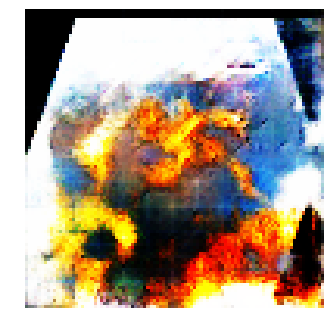


Epoch: 20880, D: -5.986, G: 5.643
Epoch: 20881, D: -6.144, G: 3.46
Epoch: 20882, D: -7.416, G: 2.325
Epoch: 20883, D: -5.685, G: 3.352
Epoch: 20884, D: -5.95, G: 3.339
Epoch: 20885, D: -7.455, G: 2.526
Epoch: 20886, D: -5.314, G: 2.943
Epoch: 20887, D: -4.628, G: 2.678
Epoch: 20888, D: -4.454, G: 3.655
Epoch: 20889, D: -6.231, G: 2.147
Epoch: 20890, D: -5.737, G: 3.36
Epoch: 20891, D: -5.693, G: 3.237
Epoch: 20892, D: -6.723, G: 3.702
Epoch: 20893, D: -6.436, G: 5.572
Epoch: 20894, D: -5.395, G: 2.75
Epoch: 20895, D: -6.916, G: 2.924
Epoch: 20896, D: -7.624, G: 3.324
Epoch: 20897, D: -5.812, G: 3.466
Epoch: 20898, D: -5.742, G: 2.779
Epoch: 20899, D: -6.29, G: 4.972


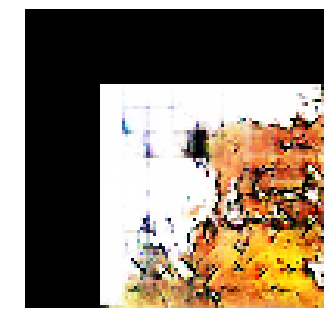


Epoch: 20900, D: -6.796, G: 3.552
Epoch: 20901, D: -6.793, G: 6.875
Epoch: 20902, D: -4.933, G: 4.352
Epoch: 20903, D: -5.51, G: 3.656
Epoch: 20904, D: -6.212, G: 4.076
Epoch: 20905, D: -6.325, G: 6.04
Epoch: 20906, D: -6.305, G: 3.008
Epoch: 20907, D: -6.109, G: 6.255
Epoch: 20908, D: -5.549, G: 4.08
Epoch: 20909, D: -5.246, G: 3.91
Epoch: 20910, D: -5.836, G: 5.197
Epoch: 20911, D: -6.235, G: 4.236
Epoch: 20912, D: -5.732, G: 5.032
Epoch: 20913, D: -4.765, G: 4.57
Epoch: 20914, D: -5.043, G: 5.826
Epoch: 20915, D: -5.25, G: 4.652
Epoch: 20916, D: -5.629, G: 3.619
Epoch: 20917, D: -5.077, G: 3.966
Epoch: 20918, D: -5.168, G: 3.067
Epoch: 20919, D: -5.557, G: 2.874


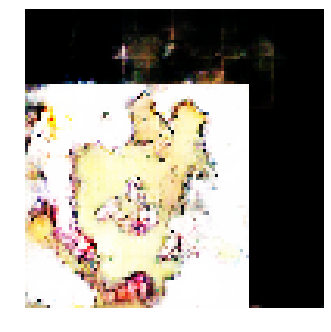


Epoch: 20920, D: -5.321, G: 2.898
Epoch: 20921, D: -5.311, G: 4.052
Epoch: 20922, D: -5.4, G: 2.964
Epoch: 20923, D: -6.681, G: 1.95
Epoch: 20924, D: -5.3, G: 3.423
Epoch: 20925, D: -7.061, G: 4.079
Epoch: 20926, D: -6.051, G: 2.018
Epoch: 20927, D: -5.969, G: 4.877
Epoch: 20928, D: -4.726, G: 5.133
Epoch: 20929, D: -5.932, G: 4.804
Epoch: 20930, D: -5.152, G: 4.999
Epoch: 20931, D: -7.038, G: 5.203
Epoch: 20932, D: -5.972, G: 2.542
Epoch: 20933, D: -5.474, G: 5.733
Epoch: 20934, D: -5.163, G: 4.935
Epoch: 20935, D: -5.587, G: 4.886
Epoch: 20936, D: -7.23, G: 3.933
Epoch: 20937, D: -6.058, G: 2.515
Epoch: 20938, D: -7.306, G: 2.959
Epoch: 20939, D: -7.413, G: 5.216


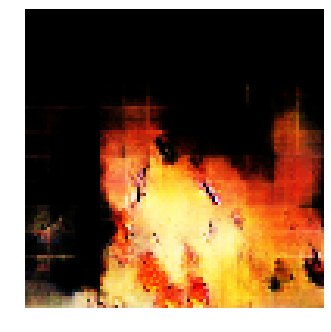


Epoch: 20940, D: -5.249, G: 2.594
Epoch: 20941, D: -6.524, G: 4.045
Epoch: 20942, D: -4.912, G: 2.948
Epoch: 20943, D: -6.29, G: 5.103
Epoch: 20944, D: -5.159, G: 3.498
Epoch: 20945, D: -5.252, G: 3.79
Epoch: 20946, D: -5.891, G: 3.051
Epoch: 20947, D: -5.866, G: 4.302
Epoch: 20948, D: -6.756, G: 3.708
Epoch: 20949, D: -6.39, G: 4.44
Epoch: 20950, D: -5.971, G: 2.81
Epoch: 20951, D: -6.3, G: 2.615
Epoch: 20952, D: -7.359, G: 3.517
Epoch: 20953, D: -3.848, G: 2.196
Epoch: 20954, D: -5.97, G: 4.182
Epoch: 20955, D: -7.196, G: 5.172
Epoch: 20956, D: -6.4, G: 1.416
Epoch: 20957, D: -6.818, G: 5.729
Epoch: 20958, D: -5.786, G: 6.147
Epoch: 20959, D: -5.779, G: 2.607


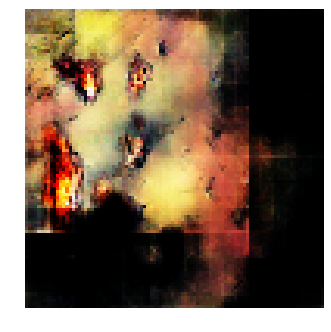


Epoch: 20960, D: -5.42, G: 2.767
Epoch: 20961, D: -5.552, G: 1.614
Epoch: 20962, D: -5.515, G: 3.18
Epoch: 20963, D: -5.376, G: 5.142
Epoch: 20964, D: -6.607, G: 1.423
Epoch: 20965, D: -6.055, G: 4.544
Epoch: 20966, D: -5.084, G: 3.391
Epoch: 20967, D: -6.176, G: 5.087
Epoch: 20968, D: -6.943, G: 3.983
Epoch: 20969, D: -6.3, G: 3.108
Epoch: 20970, D: -5.19, G: 4.873
Epoch: 20971, D: -6.431, G: 5.565
Epoch: 20972, D: -5.463, G: 4.578
Epoch: 20973, D: -5.62, G: 4.364
Epoch: 20974, D: -6.568, G: 5.414
Epoch: 20975, D: -5.914, G: 4.152
Epoch: 20976, D: -6.296, G: 3.809
Epoch: 20977, D: -5.672, G: 5.038
Epoch: 20978, D: -6.348, G: 4.26
Epoch: 20979, D: -5.314, G: 6.524


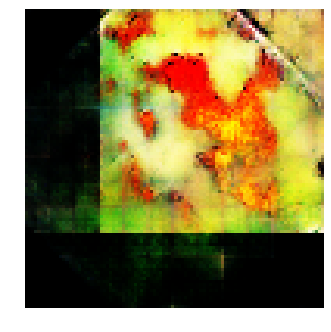


Epoch: 20980, D: -4.415, G: 4.348
Epoch: 20981, D: -6.568, G: 5.13
Epoch: 20982, D: -6.315, G: 4.895
Epoch: 20983, D: -6.237, G: 3.773
Epoch: 20984, D: -4.836, G: 3.562
Epoch: 20985, D: -5.687, G: 3.539
Epoch: 20986, D: -5.624, G: 2.872
Epoch: 20987, D: -4.709, G: 4.611
Epoch: 20988, D: -5.863, G: 2.07
Epoch: 20989, D: -5.778, G: 5.982
Epoch: 20990, D: -4.83, G: 3.835
Epoch: 20991, D: -5.864, G: 4.055
Epoch: 20992, D: -5.414, G: 3.613
Epoch: 20993, D: -6.058, G: 4.158
Epoch: 20994, D: -4.844, G: 4.053
Epoch: 20995, D: -6.205, G: 3.26
Epoch: 20996, D: -5.77, G: 2.385
Epoch: 20997, D: -5.328, G: 5.614
Epoch: 20998, D: -5.758, G: 3.958
Epoch: 20999, D: -6.411, G: 3.88


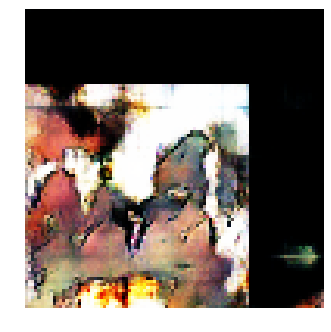


Epoch: 21000, D: -5.338, G: 3.711
Epoch: 21001, D: -5.107, G: 4.222
Epoch: 21002, D: -5.673, G: 4.238
Epoch: 21003, D: -6.338, G: 2.337
Epoch: 21004, D: -5.697, G: 1.567
Epoch: 21005, D: -5.409, G: 3.979
Epoch: 21006, D: -6.343, G: 4.927
Epoch: 21007, D: -6.477, G: 4.626
Epoch: 21008, D: -6.87, G: 3.045
Epoch: 21009, D: -5.597, G: 2.24
Epoch: 21010, D: -5.775, G: 1.855
Epoch: 21011, D: -6.769, G: 4.429
Epoch: 21012, D: -7.007, G: 4.153
Epoch: 21013, D: -5.591, G: 4.235
Epoch: 21014, D: -5.937, G: 3.989
Epoch: 21015, D: -5.772, G: 4.517
Epoch: 21016, D: -5.226, G: 4.03
Epoch: 21017, D: -7.004, G: 3.521
Epoch: 21018, D: -5.359, G: 5.532
Epoch: 21019, D: -5.655, G: 5.978


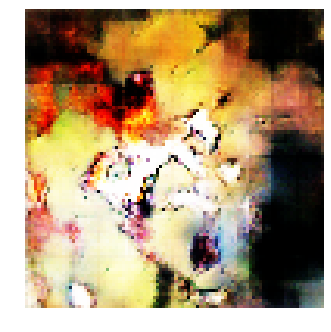


Epoch: 21020, D: -6.279, G: 2.306
Epoch: 21021, D: -5.597, G: 5.142
Epoch: 21022, D: -7.332, G: 4.402
Epoch: 21023, D: -6.359, G: 2.973
Epoch: 21024, D: -4.941, G: 3.629
Epoch: 21025, D: -5.559, G: 3.732
Epoch: 21026, D: -4.693, G: 2.502
Epoch: 21027, D: -5.9, G: 3.622
Epoch: 21028, D: -6.846, G: 2.487
Epoch: 21029, D: -5.332, G: 3.134
Epoch: 21030, D: -5.05, G: 4.406
Epoch: 21031, D: -4.956, G: 5.725
Epoch: 21032, D: -6.913, G: 4.753
Epoch: 21033, D: -5.199, G: 5.767
Epoch: 21034, D: -5.115, G: 5.846
Epoch: 21035, D: -5.853, G: 3.749
Epoch: 21036, D: -7.009, G: 3.333
Epoch: 21037, D: -7.48, G: 5.527
Epoch: 21038, D: -5.365, G: 4.797
Epoch: 21039, D: -2.285, G: 4.073


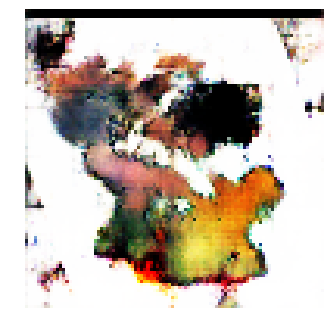


Epoch: 21040, D: -6.467, G: 3.893
Epoch: 21041, D: -4.824, G: 3.004
Epoch: 21042, D: -6.503, G: 5.151
Epoch: 21043, D: -4.667, G: 2.766
Epoch: 21044, D: -6.33, G: 3.351
Epoch: 21045, D: -5.28, G: 3.246
Epoch: 21046, D: -5.601, G: 1.076
Epoch: 21047, D: -6.03, G: 2.886
Epoch: 21048, D: -6.21, G: 3.052
Epoch: 21049, D: -5.948, G: 3.45
Epoch: 21050, D: -6.448, G: 3.21
Epoch: 21051, D: -6.362, G: 4.316
Epoch: 21052, D: -6.217, G: 4.95
Epoch: 21053, D: -5.208, G: 3.599
Epoch: 21054, D: -5.98, G: 2.888
Epoch: 21055, D: -6.889, G: 3.608
Epoch: 21056, D: -6.271, G: 3.39
Epoch: 21057, D: -6.657, G: 0.553
Epoch: 21058, D: -5.858, G: 3.297
Epoch: 21059, D: -6.704, G: 4.271


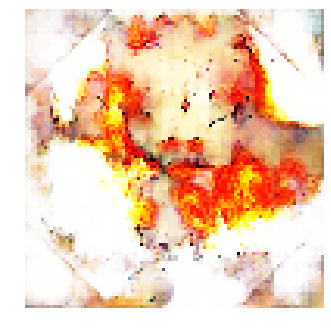


Epoch: 21060, D: -6.516, G: 0.8321
Epoch: 21061, D: -6.523, G: 1.679
Epoch: 21062, D: -6.347, G: 3.092
Epoch: 21063, D: -6.19, G: 4.405
Epoch: 21064, D: -5.781, G: 3.466
Epoch: 21065, D: -6.354, G: 3.284
Epoch: 21066, D: -5.71, G: 4.432
Epoch: 21067, D: -4.629, G: 2.462
Epoch: 21068, D: -6.519, G: 3.738
Epoch: 21069, D: -6.309, G: 5.013
Epoch: 21070, D: -4.723, G: 4.858
Epoch: 21071, D: -9.057, G: 2.816
Epoch: 21072, D: -5.792, G: 6.162
Epoch: 21073, D: -5.906, G: 4.361
Epoch: 21074, D: -6.736, G: 3.195
Epoch: 21075, D: -4.811, G: 3.253
Epoch: 21076, D: -5.376, G: 3.028
Epoch: 21077, D: -6.294, G: 3.509
Epoch: 21078, D: -7.361, G: 3.601
Epoch: 21079, D: -5.526, G: 2.277


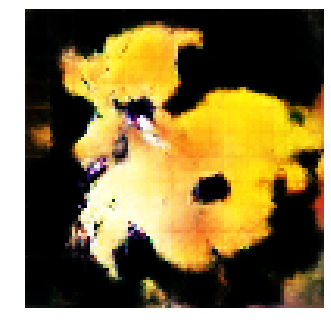


Epoch: 21080, D: -4.887, G: 3.217
Epoch: 21081, D: -6.69, G: 3.874
Epoch: 21082, D: -6.739, G: 1.919
Epoch: 21083, D: -8.014, G: 2.178
Epoch: 21084, D: -5.559, G: 2.138
Epoch: 21085, D: -6.005, G: 4.106
Epoch: 21086, D: -4.639, G: 4.522
Epoch: 21087, D: -5.509, G: 7.31
Epoch: 21088, D: -6.48, G: 3.653
Epoch: 21089, D: -6.804, G: 4.666
Epoch: 21090, D: -5.878, G: 4.368
Epoch: 21091, D: -6.621, G: 3.389
Epoch: 21092, D: -5.834, G: 4.712
Epoch: 21093, D: -5.303, G: 4.222
Epoch: 21094, D: -5.124, G: 4.825
Epoch: 21095, D: -6.481, G: 6.712
Epoch: 21096, D: -6.637, G: 4.587
Epoch: 21097, D: -7.086, G: 4.86
Epoch: 21098, D: -6.211, G: 4.93
Epoch: 21099, D: -5.67, G: 3.649


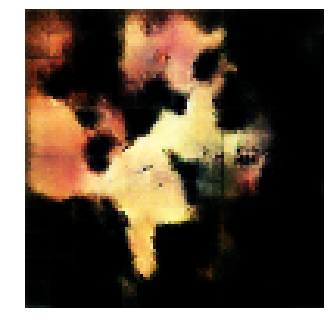


Epoch: 21100, D: -4.375, G: 2.078
Epoch: 21101, D: -4.955, G: 5.176
Epoch: 21102, D: -5.356, G: 3.507
Epoch: 21103, D: -6.664, G: 1.95
Epoch: 21104, D: -6.355, G: 2.927
Epoch: 21105, D: -5.605, G: 3.802
Epoch: 21106, D: -5.323, G: 4.146
Epoch: 21107, D: -6.843, G: 2.502
Epoch: 21108, D: -6.287, G: 1.589
Epoch: 21109, D: -6.258, G: 3.198
Epoch: 21110, D: -7.13, G: 4.282
Epoch: 21111, D: -6.642, G: 2.773
Epoch: 21112, D: -7.622, G: 4.732
Epoch: 21113, D: -6.455, G: 2.169
Epoch: 21114, D: -5.251, G: 4.205
Epoch: 21115, D: -5.581, G: 4.334
Epoch: 21116, D: -6.534, G: 2.856
Epoch: 21117, D: -5.346, G: 4.636
Epoch: 21118, D: -7.193, G: 3.614
Epoch: 21119, D: -7.908, G: 4.853


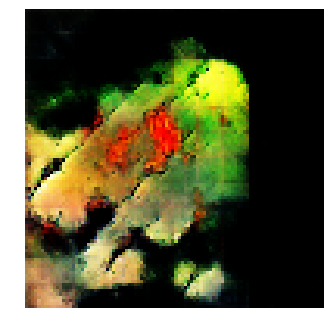


Epoch: 21120, D: -4.207, G: 4.358
Epoch: 21121, D: -6.925, G: 4.386
Epoch: 21122, D: -6.705, G: 1.95
Epoch: 21123, D: -5.384, G: 3.279
Epoch: 21124, D: -5.314, G: 5.093
Epoch: 21125, D: -6.604, G: 7.309
Epoch: 21126, D: -5.725, G: 4.344
Epoch: 21127, D: -6.207, G: 5.001
Epoch: 21128, D: -5.445, G: 4.515
Epoch: 21129, D: -4.484, G: 3.369
Epoch: 21130, D: -5.045, G: 5.427
Epoch: 21131, D: -6.602, G: 2.412
Epoch: 21132, D: -5.935, G: 2.793
Epoch: 21133, D: -5.858, G: 1.036
Epoch: 21134, D: -6.116, G: 5.442
Epoch: 21135, D: -6.317, G: 2.512
Epoch: 21136, D: -6.171, G: 4.207
Epoch: 21137, D: -5.644, G: 4.578
Epoch: 21138, D: -6.293, G: 3.127
Epoch: 21139, D: -4.633, G: 4.801


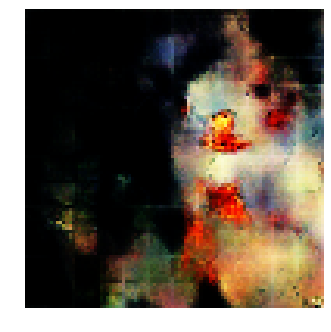


Epoch: 21140, D: -5.931, G: 3.998
Epoch: 21141, D: -5.592, G: 2.319
Epoch: 21142, D: -6.398, G: 3.774
Epoch: 21143, D: -7.047, G: 2.72
Epoch: 21144, D: -6.037, G: 2.946
Epoch: 21145, D: -5.739, G: 2.741
Epoch: 21146, D: -6.976, G: 5.164
Epoch: 21147, D: -5.895, G: 3.669
Epoch: 21148, D: -6.095, G: 4.594
Epoch: 21149, D: -4.887, G: 4.12
Epoch: 21150, D: -7.308, G: 4.316
Epoch: 21151, D: -5.661, G: 3.185
Epoch: 21152, D: -5.243, G: 3.473
Epoch: 21153, D: -4.925, G: 5.576
Epoch: 21154, D: -6.189, G: 2.522
Epoch: 21155, D: -6.315, G: 2.182
Epoch: 21156, D: -5.737, G: 4.32
Epoch: 21157, D: -5.823, G: 4.911
Epoch: 21158, D: -6.163, G: 3.649
Epoch: 21159, D: -6.932, G: 6.678


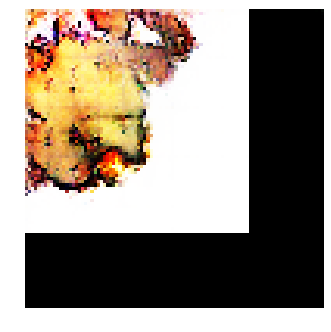


Epoch: 21160, D: -5.07, G: 4.547
Epoch: 21161, D: -5.438, G: 2.571
Epoch: 21162, D: -4.963, G: 4.684
Epoch: 21163, D: -5.791, G: 3.059
Epoch: 21164, D: -3.537, G: 7.023
Epoch: 21165, D: -6.305, G: 3.919
Epoch: 21166, D: -6.304, G: 1.63
Epoch: 21167, D: -5.573, G: 4.156
Epoch: 21168, D: -6.617, G: 2.333
Epoch: 21169, D: -5.256, G: 1.328
Epoch: 21170, D: -5.759, G: 3.211
Epoch: 21171, D: -6.808, G: 3.719
Epoch: 21172, D: -5.264, G: 3.346
Epoch: 21173, D: -6.791, G: 5.656
Epoch: 21174, D: -4.535, G: 5.312
Epoch: 21175, D: -5.419, G: 5.031
Epoch: 21176, D: -6.032, G: 5.446
Epoch: 21177, D: -6.73, G: 3.26
Epoch: 21178, D: -6.858, G: 0.6619
Epoch: 21179, D: -3.612, G: 3.41


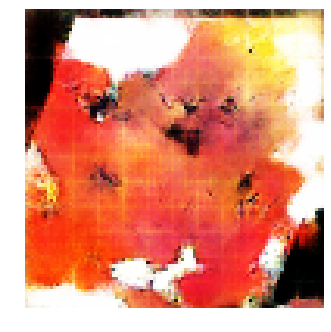


Epoch: 21180, D: -5.442, G: 4.264
Epoch: 21181, D: -5.411, G: 4.089
Epoch: 21182, D: -6.269, G: 4.273
Epoch: 21183, D: -6.676, G: 2.975
Epoch: 21184, D: -4.602, G: 3.528
Epoch: 21185, D: -5.273, G: 3.607
Epoch: 21186, D: -4.855, G: 4.44
Epoch: 21187, D: -6.633, G: 3.642
Epoch: 21188, D: -8.13, G: 4.33
Epoch: 21189, D: -5.093, G: 3.99
Epoch: 21190, D: -4.884, G: 3.772
Epoch: 21191, D: -6.318, G: 5.356
Epoch: 21192, D: -6.608, G: 5.654
Epoch: 21193, D: -5.494, G: 2.301
Epoch: 21194, D: -5.286, G: 4.172
Epoch: 21195, D: -6.179, G: 6.126
Epoch: 21196, D: -6.253, G: 4.52
Epoch: 21197, D: -6.023, G: 3.457
Epoch: 21198, D: -5.881, G: 4.462
Epoch: 21199, D: -5.122, G: 3.245


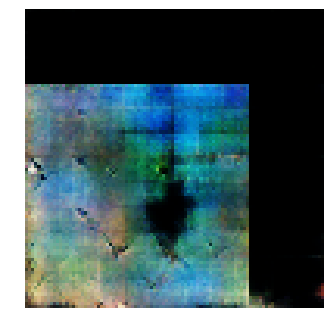


Epoch: 21200, D: -5.406, G: 3.653
Epoch: 21201, D: -5.938, G: 4.457
Epoch: 21202, D: -5.03, G: 5.191
Epoch: 21203, D: -5.338, G: 4.934
Epoch: 21204, D: -5.663, G: 3.31
Epoch: 21205, D: -6.068, G: 4.698
Epoch: 21206, D: -5.751, G: 3.343
Epoch: 21207, D: -6.681, G: 3.848
Epoch: 21208, D: -6.739, G: 4.776
Epoch: 21209, D: -6.313, G: 4.908
Epoch: 21210, D: -5.984, G: 4.699
Epoch: 21211, D: -5.124, G: 3.765
Epoch: 21212, D: -5.999, G: 3.678
Epoch: 21213, D: -6.276, G: 2.993
Epoch: 21214, D: -5.783, G: 4.913
Epoch: 21215, D: -5.669, G: 4.608
Epoch: 21216, D: -6.638, G: 3.087
Epoch: 21217, D: -6.48, G: 3.72
Epoch: 21218, D: -5.426, G: 4.537
Epoch: 21219, D: -6.956, G: 3.679


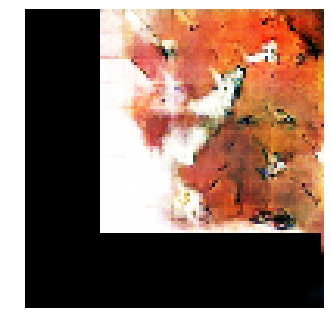


Epoch: 21220, D: -6.211, G: 3.786
Epoch: 21221, D: -5.037, G: 4.707
Epoch: 21222, D: -6.255, G: 1.933
Epoch: 21223, D: -4.411, G: 5.015
Epoch: 21224, D: -3.924, G: 5.575
Epoch: 21225, D: -6.478, G: 3.405
Epoch: 21226, D: -6.816, G: 4.354
Epoch: 21227, D: -6.199, G: 3.293
Epoch: 21228, D: -6.6, G: 3.807
Epoch: 21229, D: -6.172, G: 4.0
Epoch: 21230, D: -6.248, G: 4.412
Epoch: 21231, D: -4.373, G: 4.209
Epoch: 21232, D: -4.951, G: 5.77
Epoch: 21233, D: -6.105, G: 4.63
Epoch: 21234, D: -5.712, G: 2.802
Epoch: 21235, D: -5.893, G: 4.133
Epoch: 21236, D: -5.407, G: 4.115
Epoch: 21237, D: -6.604, G: 7.129
Epoch: 21238, D: -5.033, G: 2.981
Epoch: 21239, D: -5.519, G: 3.693


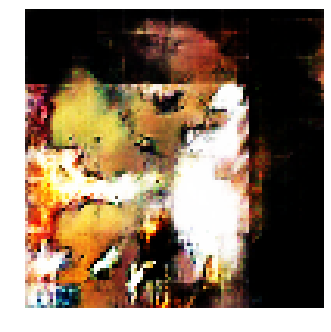


Epoch: 21240, D: -5.732, G: 3.787
Epoch: 21241, D: -6.149, G: 2.167
Epoch: 21242, D: -6.595, G: 5.113
Epoch: 21243, D: -4.683, G: 4.168
Epoch: 21244, D: -6.322, G: 4.451
Epoch: 21245, D: -5.257, G: 4.318
Epoch: 21246, D: -5.777, G: 3.811
Epoch: 21247, D: -5.521, G: 2.588
Epoch: 21248, D: -6.669, G: 4.564
Epoch: 21249, D: -7.693, G: 2.758
Epoch: 21250, D: -5.517, G: 3.71
Epoch: 21251, D: -5.974, G: 4.203
Epoch: 21252, D: -4.579, G: 6.787
Epoch: 21253, D: -6.066, G: 3.318
Epoch: 21254, D: -6.141, G: 3.98
Epoch: 21255, D: -6.331, G: 3.1
Epoch: 21256, D: -5.941, G: 5.429
Epoch: 21257, D: -6.491, G: 4.443
Epoch: 21258, D: -4.481, G: 3.899
Epoch: 21259, D: -6.482, G: 4.534


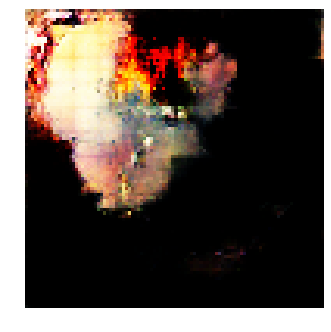


Epoch: 21260, D: -5.96, G: 2.755
Epoch: 21261, D: -5.556, G: 3.003
Epoch: 21262, D: -6.308, G: 5.349
Epoch: 21263, D: -6.128, G: 3.358
Epoch: 21264, D: -6.466, G: 2.309
Epoch: 21265, D: -6.002, G: 5.151
Epoch: 21266, D: -6.498, G: 2.815
Epoch: 21267, D: -4.876, G: 3.213
Epoch: 21268, D: -5.277, G: 4.464
Epoch: 21269, D: -5.713, G: 3.704
Epoch: 21270, D: -5.718, G: 5.435
Epoch: 21271, D: -6.253, G: 5.165
Epoch: 21272, D: -5.989, G: 3.986
Epoch: 21273, D: -5.877, G: 3.229
Epoch: 21274, D: -5.942, G: 5.161
Epoch: 21275, D: -6.216, G: 4.485
Epoch: 21276, D: -5.328, G: 4.424
Epoch: 21277, D: -6.484, G: 5.288
Epoch: 21278, D: -4.644, G: 4.935
Epoch: 21279, D: -5.428, G: 3.012


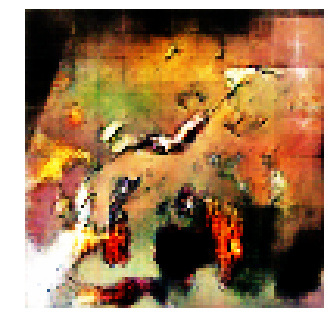


Epoch: 21280, D: -7.049, G: 4.745
Epoch: 21281, D: -5.772, G: 2.473
Epoch: 21282, D: -6.246, G: 2.075
Epoch: 21283, D: -6.749, G: 2.308
Epoch: 21284, D: -5.721, G: 2.113
Epoch: 21285, D: -5.042, G: 3.842
Epoch: 21286, D: -5.415, G: 1.917
Epoch: 21287, D: -5.303, G: 2.188
Epoch: 21288, D: -6.552, G: 2.292
Epoch: 21289, D: -6.259, G: 0.9199
Epoch: 21290, D: -6.573, G: 3.648
Epoch: 21291, D: -4.169, G: 3.703
Epoch: 21292, D: -6.485, G: 5.503
Epoch: 21293, D: -5.607, G: 3.447
Epoch: 21294, D: -6.273, G: 2.367
Epoch: 21295, D: -6.006, G: 3.683
Epoch: 21296, D: -5.12, G: 4.03
Epoch: 21297, D: -4.874, G: 4.375
Epoch: 21298, D: -5.197, G: 3.783
Epoch: 21299, D: -6.935, G: 3.72


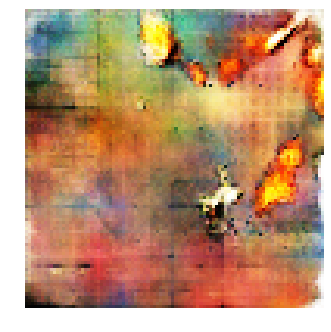


Epoch: 21300, D: -5.153, G: 5.0
Epoch: 21301, D: -6.27, G: 5.995
Epoch: 21302, D: -6.452, G: 3.26
Epoch: 21303, D: -5.929, G: 3.592
Epoch: 21304, D: -5.188, G: 2.502
Epoch: 21305, D: -5.903, G: 5.048
Epoch: 21306, D: -6.426, G: 2.59
Epoch: 21307, D: -6.482, G: 4.64
Epoch: 21308, D: -5.994, G: 4.6
Epoch: 21309, D: -6.163, G: 2.446
Epoch: 21310, D: -5.377, G: 3.793
Epoch: 21311, D: -5.962, G: 3.884
Epoch: 21312, D: -5.035, G: 3.897
Epoch: 21313, D: -5.327, G: 2.794
Epoch: 21314, D: -6.271, G: 2.936
Epoch: 21315, D: -6.029, G: 3.374
Epoch: 21316, D: -6.441, G: 2.374
Epoch: 21317, D: -5.84, G: 2.107
Epoch: 21318, D: -6.897, G: 5.604
Epoch: 21319, D: -6.959, G: 2.908


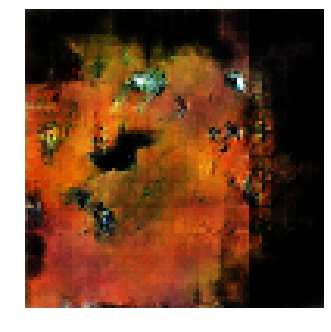


Epoch: 21320, D: -5.537, G: 3.958
Epoch: 21321, D: -5.618, G: 5.599
Epoch: 21322, D: -4.878, G: 5.4
Epoch: 21323, D: -5.053, G: 4.048
Epoch: 21324, D: -4.983, G: 3.707
Epoch: 21325, D: -6.305, G: 2.726
Epoch: 21326, D: -5.082, G: 4.838
Epoch: 21327, D: -6.159, G: 5.224
Epoch: 21328, D: -6.336, G: 3.962
Epoch: 21329, D: -5.787, G: 3.562
Epoch: 21330, D: -6.86, G: 2.405
Epoch: 21331, D: -6.358, G: 2.274
Epoch: 21332, D: -5.21, G: 3.814
Epoch: 21333, D: -5.12, G: 4.112
Epoch: 21334, D: -6.292, G: 4.399
Epoch: 21335, D: -5.396, G: 3.067
Epoch: 21336, D: -5.941, G: 5.175
Epoch: 21337, D: -5.915, G: 4.195
Epoch: 21338, D: -5.717, G: 5.03
Epoch: 21339, D: -5.449, G: 3.167


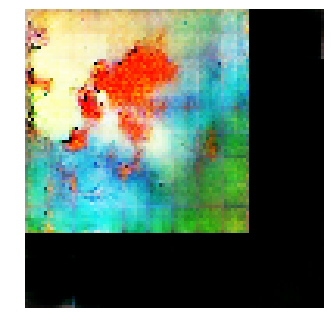


Epoch: 21340, D: -6.568, G: 3.264
Epoch: 21341, D: -5.685, G: 0.7599
Epoch: 21342, D: -5.592, G: 1.111
Epoch: 21343, D: -5.408, G: 2.961
Epoch: 21344, D: -6.231, G: 2.401
Epoch: 21345, D: -5.788, G: 2.489
Epoch: 21346, D: -5.979, G: 3.031
Epoch: 21347, D: -6.382, G: 4.716
Epoch: 21348, D: -6.989, G: 4.571
Epoch: 21349, D: -3.829, G: 4.895
Epoch: 21350, D: -5.222, G: 3.513
Epoch: 21351, D: -4.674, G: 4.316
Epoch: 21352, D: -6.387, G: 4.84
Epoch: 21353, D: -5.408, G: 4.015
Epoch: 21354, D: -6.799, G: 4.52
Epoch: 21355, D: -5.925, G: 2.602
Epoch: 21356, D: -5.751, G: 5.395
Epoch: 21357, D: -6.279, G: 3.664
Epoch: 21358, D: -5.338, G: 5.795
Epoch: 21359, D: -5.801, G: 4.397


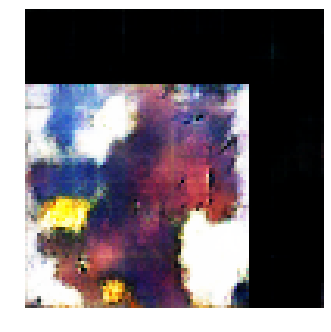


Epoch: 21360, D: -5.115, G: 3.671
Epoch: 21361, D: -7.031, G: 3.249
Epoch: 21362, D: -5.142, G: 4.134
Epoch: 21363, D: -6.01, G: 5.215
Epoch: 21364, D: -5.952, G: 3.909
Epoch: 21365, D: -5.051, G: 4.492
Epoch: 21366, D: -5.091, G: 3.591
Epoch: 21367, D: -5.983, G: 3.275
Epoch: 21368, D: -4.87, G: 5.341
Epoch: 21369, D: -5.888, G: 2.144
Epoch: 21370, D: -3.953, G: 3.232
Epoch: 21371, D: -5.261, G: 3.552
Epoch: 21372, D: -6.728, G: 4.467
Epoch: 21373, D: -5.429, G: 4.799
Epoch: 21374, D: -4.913, G: 5.734
Epoch: 21375, D: -6.282, G: 3.068
Epoch: 21376, D: -6.788, G: 4.51
Epoch: 21377, D: -6.417, G: 4.12
Epoch: 21378, D: -6.21, G: 3.699
Epoch: 21379, D: -7.07, G: 3.034


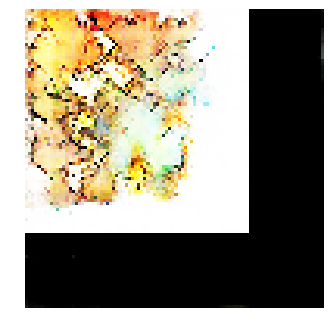


Epoch: 21380, D: -5.274, G: 4.416
Epoch: 21381, D: -4.826, G: 3.391
Epoch: 21382, D: -5.841, G: 1.152
Epoch: 21383, D: -5.483, G: 3.232
Epoch: 21384, D: -6.309, G: 3.647
Epoch: 21385, D: -5.979, G: 4.387
Epoch: 21386, D: -7.93, G: 1.632
Epoch: 21387, D: -5.314, G: 2.475
Epoch: 21388, D: -5.698, G: 3.32
Epoch: 21389, D: -6.168, G: 3.684
Epoch: 21390, D: -6.732, G: 3.592
Epoch: 21391, D: -7.516, G: 4.89
Epoch: 21392, D: -6.098, G: 3.363
Epoch: 21393, D: -7.148, G: 4.185
Epoch: 21394, D: -4.533, G: 7.572
Epoch: 21395, D: -6.482, G: 5.953
Epoch: 21396, D: -6.862, G: 5.571
Epoch: 21397, D: -6.599, G: 7.294
Epoch: 21398, D: -6.181, G: 4.22
Epoch: 21399, D: -5.935, G: 3.056


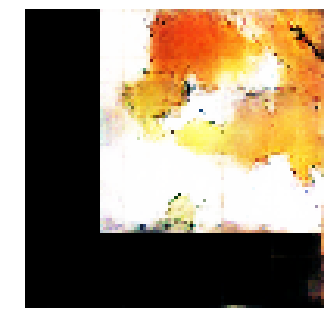


Epoch: 21400, D: -5.015, G: 3.831
Epoch: 21401, D: -5.721, G: 5.381
Epoch: 21402, D: -6.866, G: 3.805
Epoch: 21403, D: -5.047, G: 2.626
Epoch: 21404, D: -5.386, G: 4.128
Epoch: 21405, D: -5.778, G: 4.568
Epoch: 21406, D: -5.295, G: 6.506
Epoch: 21407, D: -5.357, G: 3.314
Epoch: 21408, D: -6.114, G: 4.167
Epoch: 21409, D: -5.592, G: 3.536
Epoch: 21410, D: -6.208, G: 2.579
Epoch: 21411, D: -5.736, G: 4.421
Epoch: 21412, D: -5.226, G: 4.306
Epoch: 21413, D: -5.98, G: 4.048
Epoch: 21414, D: -5.713, G: 3.311
Epoch: 21415, D: -5.203, G: 5.456
Epoch: 21416, D: -7.141, G: 3.464
Epoch: 21417, D: -6.231, G: 5.329
Epoch: 21418, D: -5.936, G: 4.309
Epoch: 21419, D: -5.184, G: 3.656


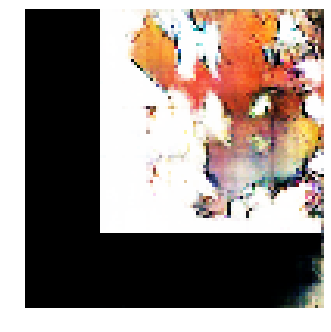


Epoch: 21420, D: -6.435, G: 4.261
Epoch: 21421, D: -7.204, G: 5.433
Epoch: 21422, D: -5.498, G: 5.79
Epoch: 21423, D: -7.012, G: 4.456
Epoch: 21424, D: -7.323, G: 4.608
Epoch: 21425, D: -7.17, G: 5.805
Epoch: 21426, D: -5.591, G: 5.685
Epoch: 21427, D: -6.387, G: 5.385
Epoch: 21428, D: -7.248, G: 5.431
Epoch: 21429, D: -5.621, G: 3.455
Epoch: 21430, D: -6.081, G: 5.213
Epoch: 21431, D: -5.643, G: 3.527
Epoch: 21432, D: -5.975, G: 5.22
Epoch: 21433, D: -6.206, G: 5.237
Epoch: 21434, D: -7.94, G: 4.14
Epoch: 21435, D: -5.563, G: 2.423
Epoch: 21436, D: -6.793, G: 4.753
Epoch: 21437, D: -5.034, G: 3.326
Epoch: 21438, D: -6.588, G: 3.815
Epoch: 21439, D: -5.943, G: 2.744


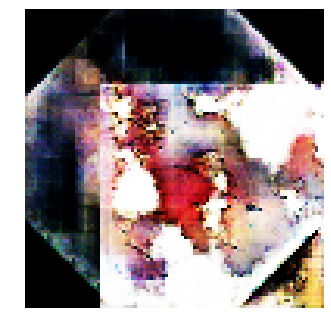


Epoch: 21440, D: -6.757, G: 3.898
Epoch: 21441, D: -5.598, G: 4.813
Epoch: 21442, D: -2.468, G: 5.963
Epoch: 21443, D: -5.805, G: 4.405
Epoch: 21444, D: -6.7, G: 4.467
Epoch: 21445, D: -6.323, G: 5.416
Epoch: 21446, D: -6.419, G: 3.572
Epoch: 21447, D: -5.082, G: 2.948
Epoch: 21448, D: -6.397, G: 4.064
Epoch: 21449, D: -6.38, G: 3.62
Epoch: 21450, D: -6.221, G: 4.017
Epoch: 21451, D: -6.462, G: 6.127
Epoch: 21452, D: -6.929, G: 3.146
Epoch: 21453, D: -4.949, G: 4.449
Epoch: 21454, D: -5.685, G: 3.774
Epoch: 21455, D: -5.206, G: 4.549
Epoch: 21456, D: -7.671, G: 3.103
Epoch: 21457, D: -6.282, G: 3.509
Epoch: 21458, D: -4.658, G: 5.307
Epoch: 21459, D: -5.747, G: 5.893


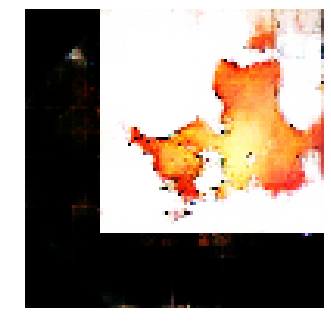


Epoch: 21460, D: -6.258, G: 3.524
Epoch: 21461, D: -5.907, G: 4.474
Epoch: 21462, D: -5.831, G: 3.693
Epoch: 21463, D: -4.631, G: 4.318
Epoch: 21464, D: -4.323, G: 4.122
Epoch: 21465, D: -4.924, G: 4.098
Epoch: 21466, D: -5.117, G: 4.287
Epoch: 21467, D: -4.829, G: 4.604
Epoch: 21468, D: -5.434, G: 3.931
Epoch: 21469, D: -6.056, G: 1.007
Epoch: 21470, D: -5.199, G: 3.709
Epoch: 21471, D: -6.127, G: 4.154
Epoch: 21472, D: -5.726, G: 4.141
Epoch: 21473, D: -5.999, G: 4.87
Epoch: 21474, D: -6.77, G: 3.714
Epoch: 21475, D: -5.55, G: 3.494
Epoch: 21476, D: -6.458, G: 3.719
Epoch: 21477, D: -5.229, G: 2.083
Epoch: 21478, D: -7.323, G: 3.536
Epoch: 21479, D: -5.967, G: 1.407


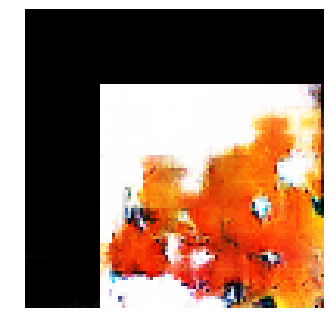


Epoch: 21480, D: -6.711, G: 4.538
Epoch: 21481, D: -7.294, G: 5.085
Epoch: 21482, D: -5.872, G: 5.354
Epoch: 21483, D: -6.568, G: 3.029
Epoch: 21484, D: -4.828, G: 5.471
Epoch: 21485, D: -4.91, G: 2.34
Epoch: 21486, D: -5.967, G: 3.051
Epoch: 21487, D: -6.157, G: 2.287
Epoch: 21488, D: -5.763, G: 4.208
Epoch: 21489, D: -6.879, G: 4.477
Epoch: 21490, D: -6.824, G: 2.209
Epoch: 21491, D: -6.58, G: 4.794
Epoch: 21492, D: -6.698, G: 3.944
Epoch: 21493, D: -5.584, G: 5.724
Epoch: 21494, D: -5.482, G: 5.078
Epoch: 21495, D: -7.169, G: 1.633
Epoch: 21496, D: -4.664, G: 3.357
Epoch: 21497, D: -5.767, G: 4.331
Epoch: 21498, D: -6.767, G: 5.985
Epoch: 21499, D: -6.624, G: 3.437


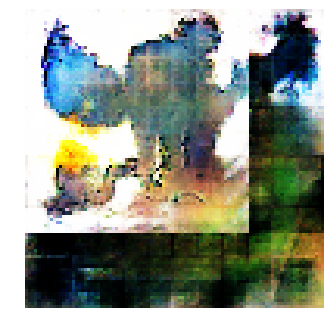


Epoch: 21500, D: -6.054, G: 2.799
Epoch: 21501, D: -5.863, G: 2.906
Epoch: 21502, D: -4.815, G: 3.719
Epoch: 21503, D: -7.218, G: 4.242
Epoch: 21504, D: -5.762, G: 5.069
Epoch: 21505, D: -6.788, G: 4.147
Epoch: 21506, D: -5.679, G: 3.666
Epoch: 21507, D: -7.247, G: 0.6519
Epoch: 21508, D: -6.381, G: 3.578
Epoch: 21509, D: -5.32, G: 3.079
Epoch: 21510, D: -5.82, G: 3.374
Epoch: 21511, D: -5.799, G: 3.984
Epoch: 21512, D: -6.598, G: 4.601
Epoch: 21513, D: -6.836, G: 2.875
Epoch: 21514, D: -5.765, G: 2.928
Epoch: 21515, D: -5.726, G: 2.86
Epoch: 21516, D: -5.597, G: 2.261
Epoch: 21517, D: -6.225, G: 3.816
Epoch: 21518, D: -4.999, G: 3.49
Epoch: 21519, D: -5.849, G: 4.354


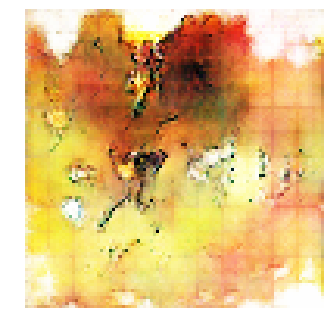


Epoch: 21520, D: -6.246, G: 4.35
Epoch: 21521, D: -5.41, G: 3.771
Epoch: 21522, D: -4.964, G: 3.164
Epoch: 21523, D: -5.77, G: 3.411
Epoch: 21524, D: -6.153, G: 4.112
Epoch: 21525, D: -5.124, G: 5.538
Epoch: 21526, D: -4.4, G: 3.943
Epoch: 21527, D: -6.108, G: 4.026
Epoch: 21528, D: -4.704, G: 2.525
Epoch: 21529, D: -7.842, G: 5.274
Epoch: 21530, D: -5.601, G: 5.549
Epoch: 21531, D: -6.343, G: 5.572
Epoch: 21532, D: -5.597, G: 3.931
Epoch: 21533, D: -6.122, G: 4.838
Epoch: 21534, D: -5.83, G: 2.212
Epoch: 21535, D: -6.502, G: 3.005
Epoch: 21536, D: -6.902, G: 4.269
Epoch: 21537, D: -5.856, G: 5.878
Epoch: 21538, D: -5.272, G: 6.199
Epoch: 21539, D: -6.045, G: 3.356


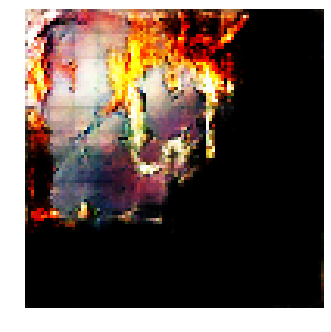


Epoch: 21540, D: -6.131, G: 3.325
Epoch: 21541, D: -6.493, G: 1.854
Epoch: 21542, D: -5.882, G: 3.53
Epoch: 21543, D: -5.612, G: 3.716
Epoch: 21544, D: -5.87, G: 3.192
Epoch: 21545, D: -5.588, G: 3.868
Epoch: 21546, D: -4.887, G: 3.529
Epoch: 21547, D: -4.567, G: 3.119
Epoch: 21548, D: -6.616, G: 4.851
Epoch: 21549, D: -6.083, G: 3.614
Epoch: 21550, D: -6.044, G: 3.648
Epoch: 21551, D: -5.477, G: 3.53
Epoch: 21552, D: -5.965, G: 3.425
Epoch: 21553, D: -5.67, G: 4.057
Epoch: 21554, D: -6.773, G: 3.517
Epoch: 21555, D: -5.888, G: 3.754
Epoch: 21556, D: -6.83, G: 4.49
Epoch: 21557, D: -6.808, G: 5.433
Epoch: 21558, D: -6.152, G: 4.929
Epoch: 21559, D: -6.143, G: 4.21


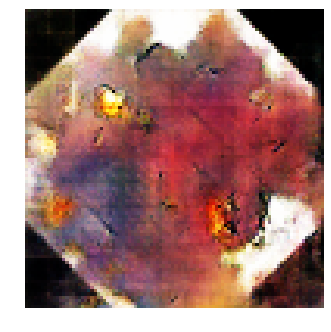


Epoch: 21560, D: -5.832, G: 5.063
Epoch: 21561, D: -5.043, G: 3.883
Epoch: 21562, D: -5.945, G: 3.309
Epoch: 21563, D: -5.761, G: 4.635
Epoch: 21564, D: -5.604, G: 2.612
Epoch: 21565, D: -4.218, G: 4.672
Epoch: 21566, D: -6.586, G: 4.383
Epoch: 21567, D: -5.541, G: 4.651
Epoch: 21568, D: -4.694, G: 4.079
Epoch: 21569, D: -6.84, G: 4.638
Epoch: 21570, D: -6.446, G: 3.505
Epoch: 21571, D: -5.655, G: 5.194
Epoch: 21572, D: -5.912, G: 4.583
Epoch: 21573, D: -5.719, G: 4.987
Epoch: 21574, D: -5.947, G: 3.433
Epoch: 21575, D: -5.05, G: 4.441
Epoch: 21576, D: -6.658, G: 4.086
Epoch: 21577, D: -5.805, G: 2.957
Epoch: 21578, D: -5.427, G: 4.095
Epoch: 21579, D: -5.008, G: 3.235


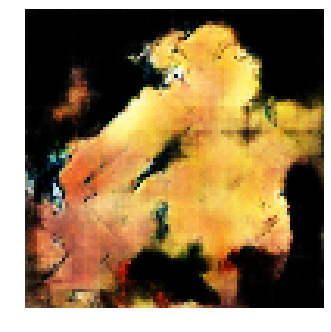


Epoch: 21580, D: -6.148, G: 4.888
Epoch: 21581, D: -5.4, G: 4.367
Epoch: 21582, D: -5.497, G: 4.14
Epoch: 21583, D: -6.219, G: 2.208
Epoch: 21584, D: -5.693, G: 2.755
Epoch: 21585, D: -6.48, G: 4.123
Epoch: 21586, D: -6.865, G: 3.442
Epoch: 21587, D: -7.21, G: 3.687
Epoch: 21588, D: -4.682, G: 2.892
Epoch: 21589, D: -6.875, G: 4.401
Epoch: 21590, D: -5.189, G: 3.367
Epoch: 21591, D: -6.486, G: 4.789
Epoch: 21592, D: -5.479, G: 3.809
Epoch: 21593, D: -5.035, G: 3.936
Epoch: 21594, D: -5.795, G: 5.079
Epoch: 21595, D: -7.404, G: 3.603
Epoch: 21596, D: -5.474, G: 2.657
Epoch: 21597, D: -6.043, G: 3.314
Epoch: 21598, D: -4.926, G: 2.273
Epoch: 21599, D: -6.722, G: 3.719


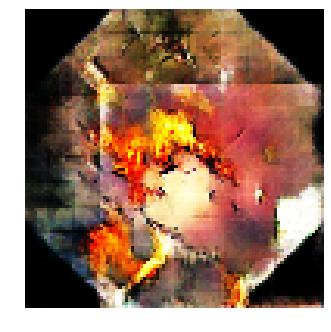


Epoch: 21600, D: -4.832, G: 4.459
Epoch: 21601, D: -5.847, G: 6.176
Epoch: 21602, D: -6.256, G: 4.596
Epoch: 21603, D: -7.02, G: 4.674
Epoch: 21604, D: -7.29, G: 4.408
Epoch: 21605, D: -5.794, G: 4.0
Epoch: 21606, D: -4.835, G: 4.824
Epoch: 21607, D: -6.101, G: 3.457
Epoch: 21608, D: -6.49, G: 4.712
Epoch: 21609, D: -5.658, G: 6.391
Epoch: 21610, D: -6.268, G: 3.16
Epoch: 21611, D: -5.774, G: 5.107
Epoch: 21612, D: -7.057, G: 3.336
Epoch: 21613, D: -5.604, G: 3.882
Epoch: 21614, D: -6.063, G: 3.898
Epoch: 21615, D: -6.364, G: 3.865
Epoch: 21616, D: -5.9, G: 3.008
Epoch: 21617, D: -6.218, G: 6.329
Epoch: 21618, D: -5.838, G: 3.224
Epoch: 21619, D: -5.807, G: 4.345


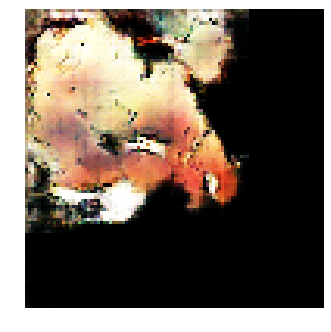


Epoch: 21620, D: -6.106, G: 5.855
Epoch: 21621, D: -6.343, G: 5.712
Epoch: 21622, D: -4.918, G: 0.8458
Epoch: 21623, D: -5.939, G: 2.689
Epoch: 21624, D: -6.681, G: 3.415
Epoch: 21625, D: -6.008, G: 3.295
Epoch: 21626, D: -6.445, G: 3.111
Epoch: 21627, D: -6.645, G: 3.557
Epoch: 21628, D: -6.537, G: 1.064
Epoch: 21629, D: -6.286, G: 4.283
Epoch: 21630, D: -5.843, G: 4.169
Epoch: 21631, D: -5.597, G: 4.649
Epoch: 21632, D: -6.569, G: 2.122
Epoch: 21633, D: -5.056, G: 3.063
Epoch: 21634, D: -3.878, G: 5.643
Epoch: 21635, D: -4.631, G: 5.359
Epoch: 21636, D: -5.095, G: 5.798
Epoch: 21637, D: -6.3, G: 3.973
Epoch: 21638, D: -8.275, G: 5.915
Epoch: 21639, D: -7.399, G: 3.368


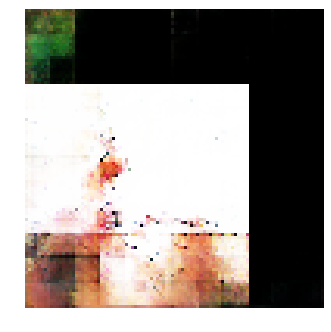


Epoch: 21640, D: -6.419, G: 3.411
Epoch: 21641, D: -5.796, G: 3.277
Epoch: 21642, D: -6.61, G: 4.692
Epoch: 21643, D: -5.554, G: 1.559
Epoch: 21644, D: -6.639, G: 5.504
Epoch: 21645, D: -5.823, G: 4.785
Epoch: 21646, D: -5.546, G: 3.924
Epoch: 21647, D: -6.652, G: 4.686
Epoch: 21648, D: -4.252, G: 3.607
Epoch: 21649, D: -6.526, G: 3.904
Epoch: 21650, D: -6.311, G: 3.12
Epoch: 21651, D: -6.346, G: 2.846
Epoch: 21652, D: -5.948, G: 3.575
Epoch: 21653, D: -3.974, G: 4.275
Epoch: 21654, D: -4.556, G: 3.147
Epoch: 21655, D: -6.113, G: 3.436
Epoch: 21656, D: -5.693, G: 4.014
Epoch: 21657, D: -5.782, G: 6.491
Epoch: 21658, D: -6.595, G: 2.439
Epoch: 21659, D: -5.197, G: 2.878


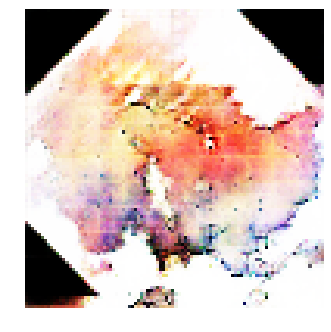


Epoch: 21660, D: -5.912, G: 4.655
Epoch: 21661, D: -5.582, G: 2.32
Epoch: 21662, D: -6.496, G: 3.606
Epoch: 21663, D: -5.944, G: 2.92
Epoch: 21664, D: -6.335, G: 5.42
Epoch: 21665, D: -4.925, G: 3.915
Epoch: 21666, D: -6.378, G: 2.984
Epoch: 21667, D: -6.594, G: 4.259
Epoch: 21668, D: -6.597, G: 4.848
Epoch: 21669, D: -6.887, G: 4.166
Epoch: 21670, D: -6.345, G: 4.95
Epoch: 21671, D: -6.991, G: 3.992
Epoch: 21672, D: -6.277, G: 3.389
Epoch: 21673, D: -6.865, G: 2.558
Epoch: 21674, D: -5.048, G: 4.151
Epoch: 21675, D: -5.143, G: 3.165
Epoch: 21676, D: -5.591, G: 2.436
Epoch: 21677, D: -4.036, G: 3.649
Epoch: 21678, D: -5.361, G: 4.67
Epoch: 21679, D: -4.9, G: 4.58


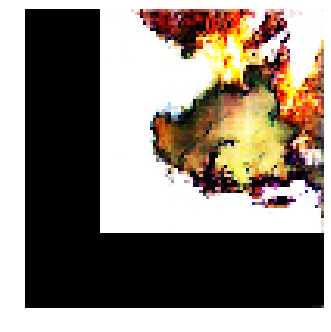


Epoch: 21680, D: -6.266, G: 3.77
Epoch: 21681, D: -6.035, G: 4.386
Epoch: 21682, D: -5.931, G: 4.24
Epoch: 21683, D: -6.353, G: 3.589
Epoch: 21684, D: -6.485, G: 3.094
Epoch: 21685, D: -6.385, G: 2.861
Epoch: 21686, D: -5.659, G: 3.072
Epoch: 21687, D: -5.741, G: 4.382
Epoch: 21688, D: -8.815, G: 4.014
Epoch: 21689, D: -4.321, G: 5.916
Epoch: 21690, D: -5.218, G: 3.602
Epoch: 21691, D: -5.939, G: 2.185
Epoch: 21692, D: -7.029, G: 3.451
Epoch: 21693, D: -6.019, G: 2.893
Epoch: 21694, D: -6.149, G: 3.029
Epoch: 21695, D: -7.215, G: 3.592
Epoch: 21696, D: -5.684, G: 5.426
Epoch: 21697, D: -6.376, G: 4.293
Epoch: 21698, D: -7.026, G: 4.573
Epoch: 21699, D: -5.846, G: 4.101


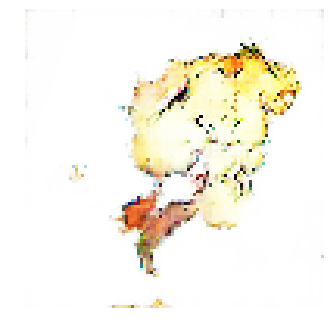


Epoch: 21700, D: -6.097, G: 2.599
Epoch: 21701, D: -6.246, G: 4.37
Epoch: 21702, D: -5.418, G: 3.733
Epoch: 21703, D: -6.461, G: 4.078
Epoch: 21704, D: -6.81, G: 5.259
Epoch: 21705, D: -5.832, G: 4.305
Epoch: 21706, D: -5.927, G: 5.75
Epoch: 21707, D: -6.263, G: 5.112
Epoch: 21708, D: -5.913, G: 3.788
Epoch: 21709, D: -5.686, G: 6.317
Epoch: 21710, D: -6.815, G: 4.174
Epoch: 21711, D: -5.829, G: 4.441
Epoch: 21712, D: -5.27, G: 3.651
Epoch: 21713, D: -5.985, G: 2.459
Epoch: 21714, D: -5.503, G: 4.303
Epoch: 21715, D: -6.8, G: 4.795
Epoch: 21716, D: -5.642, G: 4.718
Epoch: 21717, D: -4.856, G: 3.042
Epoch: 21718, D: -6.697, G: 3.561
Epoch: 21719, D: -5.482, G: 5.889


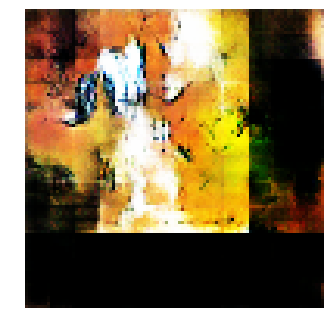


Epoch: 21720, D: -7.303, G: 2.362
Epoch: 21721, D: -5.586, G: 4.374
Epoch: 21722, D: -6.46, G: 3.567
Epoch: 21723, D: -6.114, G: 3.871
Epoch: 21724, D: -6.422, G: 2.859
Epoch: 21725, D: -6.333, G: 4.601
Epoch: 21726, D: -5.834, G: 2.714
Epoch: 21727, D: -5.791, G: 3.856
Epoch: 21728, D: -5.535, G: 3.246
Epoch: 21729, D: -5.36, G: 3.571
Epoch: 21730, D: -4.564, G: 4.458
Epoch: 21731, D: -4.921, G: 1.82
Epoch: 21732, D: -5.123, G: 3.129
Epoch: 21733, D: -5.521, G: 4.814
Epoch: 21734, D: -6.178, G: 2.094
Epoch: 21735, D: -4.94, G: 2.7
Epoch: 21736, D: -5.297, G: 4.35
Epoch: 21737, D: -5.65, G: 4.528
Epoch: 21738, D: -6.117, G: 5.049
Epoch: 21739, D: -4.79, G: 3.62


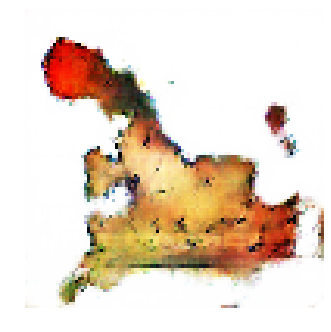


Epoch: 21740, D: -5.689, G: 2.965
Epoch: 21741, D: -6.193, G: 4.912
Epoch: 21742, D: -6.151, G: 3.989
Epoch: 21743, D: -6.211, G: 5.794
Epoch: 21744, D: -5.702, G: 3.288
Epoch: 21745, D: -5.116, G: 5.016
Epoch: 21746, D: -6.623, G: 4.147
Epoch: 21747, D: -6.147, G: 5.699
Epoch: 21748, D: -5.944, G: 2.165
Epoch: 21749, D: -4.891, G: 4.242
Epoch: 21750, D: -5.485, G: 4.458
Epoch: 21751, D: -5.225, G: 3.729
Epoch: 21752, D: -6.559, G: 3.723
Epoch: 21753, D: -5.569, G: 4.512
Epoch: 21754, D: -6.222, G: 2.565
Epoch: 21755, D: -4.756, G: 5.19
Epoch: 21756, D: -6.507, G: 2.949
Epoch: 21757, D: -6.296, G: 4.337
Epoch: 21758, D: -5.246, G: 3.937
Epoch: 21759, D: -4.306, G: 4.903


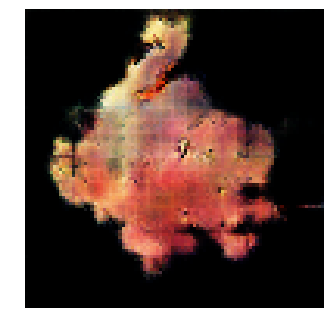


Epoch: 21760, D: -4.477, G: 3.484
Epoch: 21761, D: -5.922, G: 2.673
Epoch: 21762, D: -5.716, G: 3.056
Epoch: 21763, D: -5.49, G: 2.123
Epoch: 21764, D: -6.062, G: 4.823
Epoch: 21765, D: -7.531, G: 5.14
Epoch: 21766, D: -4.742, G: 4.362
Epoch: 21767, D: -6.287, G: 3.332
Epoch: 21768, D: -6.839, G: 4.348
Epoch: 21769, D: -5.723, G: 4.51
Epoch: 21770, D: -6.867, G: 2.703
Epoch: 21771, D: -6.854, G: 1.935
Epoch: 21772, D: -6.862, G: 3.226
Epoch: 21773, D: -6.617, G: 3.72
Epoch: 21774, D: -4.666, G: 5.858
Epoch: 21775, D: -5.175, G: 4.081
Epoch: 21776, D: -5.099, G: 5.127
Epoch: 21777, D: -5.668, G: 4.623
Epoch: 21778, D: -7.334, G: 4.066
Epoch: 21779, D: -6.143, G: 3.013


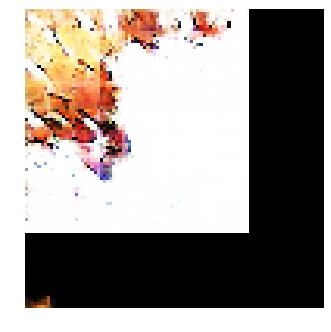


Epoch: 21780, D: -5.443, G: 3.027
Epoch: 21781, D: -6.467, G: 6.25
Epoch: 21782, D: -6.184, G: 5.077
Epoch: 21783, D: -5.737, G: 6.417
Epoch: 21784, D: -5.887, G: 4.688
Epoch: 21785, D: -6.148, G: 4.324
Epoch: 21786, D: -5.503, G: 4.105
Epoch: 21787, D: -6.299, G: 4.53
Epoch: 21788, D: -5.456, G: 2.739
Epoch: 21789, D: -5.318, G: 3.055
Epoch: 21790, D: -5.892, G: 6.773
Epoch: 21791, D: -7.087, G: 3.135
Epoch: 21792, D: -5.563, G: 3.779
Epoch: 21793, D: -5.414, G: 2.583
Epoch: 21794, D: -5.201, G: 2.377
Epoch: 21795, D: -6.313, G: 3.929
Epoch: 21796, D: -6.214, G: 2.773
Epoch: 21797, D: -7.26, G: 4.839
Epoch: 21798, D: -5.206, G: 1.272
Epoch: 21799, D: -5.979, G: 4.951


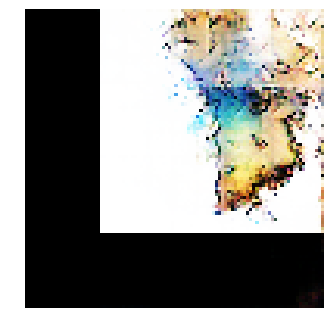


Epoch: 21800, D: -4.958, G: 5.639
Epoch: 21801, D: -7.178, G: 5.092
Epoch: 21802, D: -6.493, G: 6.943
Epoch: 21803, D: -6.947, G: 5.888
Epoch: 21804, D: -7.659, G: 3.22
Epoch: 21805, D: -6.831, G: 2.585
Epoch: 21806, D: -6.513, G: 3.175
Epoch: 21807, D: -7.394, G: 4.697
Epoch: 21808, D: -6.35, G: 4.546
Epoch: 21809, D: -5.732, G: 2.525
Epoch: 21810, D: -4.476, G: 7.471
Epoch: 21811, D: -6.003, G: 5.069
Epoch: 21812, D: -6.205, G: 4.097
Epoch: 21813, D: -5.892, G: 2.434
Epoch: 21814, D: -6.791, G: 3.111
Epoch: 21815, D: -6.094, G: 4.705
Epoch: 21816, D: -5.444, G: 3.753
Epoch: 21817, D: -6.109, G: 3.607
Epoch: 21818, D: -5.183, G: 3.824
Epoch: 21819, D: -4.381, G: 3.283


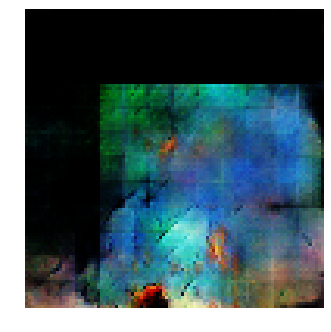


Epoch: 21820, D: -6.951, G: 3.92
Epoch: 21821, D: -4.8, G: 2.981
Epoch: 21822, D: -6.261, G: 5.442
Epoch: 21823, D: -4.806, G: 4.883
Epoch: 21824, D: -5.661, G: 3.404
Epoch: 21825, D: -4.214, G: 3.43
Epoch: 21826, D: -5.723, G: 3.02
Epoch: 21827, D: -5.67, G: 3.085
Epoch: 21828, D: -5.67, G: 2.094
Epoch: 21829, D: -5.889, G: 4.592
Epoch: 21830, D: -5.365, G: 3.741
Epoch: 21831, D: -5.315, G: 3.121
Epoch: 21832, D: -5.375, G: 4.333
Epoch: 21833, D: -5.651, G: 3.742
Epoch: 21834, D: -6.103, G: 3.645
Epoch: 21835, D: -5.735, G: 5.398
Epoch: 21836, D: -7.358, G: 3.132
Epoch: 21837, D: -6.595, G: 3.001
Epoch: 21838, D: -5.351, G: 2.882
Epoch: 21839, D: -5.646, G: 3.663


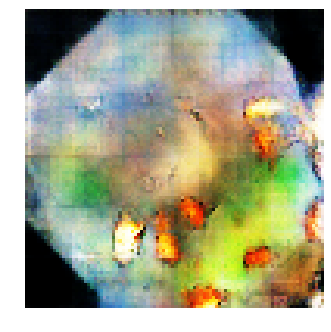


Epoch: 21840, D: -6.485, G: 1.92
Epoch: 21841, D: -5.303, G: 3.78
Epoch: 21842, D: -6.465, G: 2.647
Epoch: 21843, D: -6.114, G: 6.005
Epoch: 21844, D: -5.36, G: 6.507
Epoch: 21845, D: -7.816, G: 2.715
Epoch: 21846, D: -5.536, G: 6.622
Epoch: 21847, D: -5.222, G: 6.861
Epoch: 21848, D: -7.045, G: 3.249
Epoch: 21849, D: -6.114, G: 2.309
Epoch: 21850, D: -5.858, G: 3.127
Epoch: 21851, D: -3.427, G: 5.629
Epoch: 21852, D: -6.22, G: 5.034
Epoch: 21853, D: -6.467, G: 5.661
Epoch: 21854, D: -6.493, G: 4.083
Epoch: 21855, D: -7.752, G: 4.398
Epoch: 21856, D: -5.293, G: 4.151
Epoch: 21857, D: -7.254, G: 3.766
Epoch: 21858, D: -5.708, G: 4.759
Epoch: 21859, D: -7.645, G: 2.843


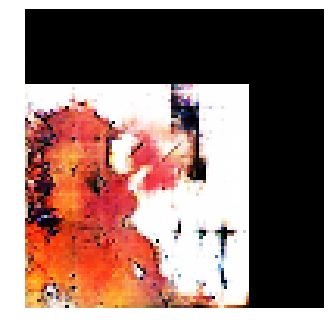


Epoch: 21860, D: -5.684, G: 4.752
Epoch: 21861, D: -6.298, G: 4.321
Epoch: 21862, D: -5.577, G: 2.508
Epoch: 21863, D: -6.926, G: 3.347
Epoch: 21864, D: -6.301, G: 4.438
Epoch: 21865, D: -8.052, G: 5.333
Epoch: 21866, D: -6.676, G: 2.083
Epoch: 21867, D: -6.319, G: 4.752
Epoch: 21868, D: -5.715, G: 5.013
Epoch: 21869, D: -4.86, G: 4.665
Epoch: 21870, D: -5.515, G: 4.556
Epoch: 21871, D: -5.377, G: 3.074
Epoch: 21872, D: -5.318, G: 4.132
Epoch: 21873, D: -5.232, G: 4.105
Epoch: 21874, D: -6.624, G: 2.732
Epoch: 21875, D: -4.951, G: 3.969
Epoch: 21876, D: -5.223, G: 3.196
Epoch: 21877, D: -6.476, G: 4.589
Epoch: 21878, D: -6.061, G: 2.78
Epoch: 21879, D: -6.209, G: 5.236


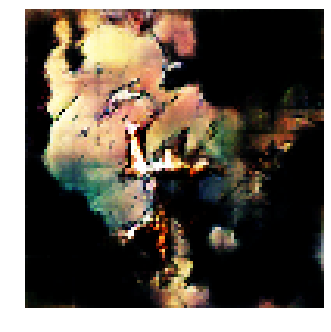


Epoch: 21880, D: -7.162, G: 2.989
Epoch: 21881, D: -5.865, G: 2.541
Epoch: 21882, D: -5.388, G: 3.597
Epoch: 21883, D: -6.903, G: 2.119
Epoch: 21884, D: -6.227, G: 2.354
Epoch: 21885, D: -5.842, G: 5.873
Epoch: 21886, D: -5.563, G: 3.155
Epoch: 21887, D: -5.829, G: 4.396
Epoch: 21888, D: -5.52, G: 3.151
Epoch: 21889, D: -6.185, G: 3.342
Epoch: 21890, D: -5.288, G: 4.084
Epoch: 21891, D: -4.92, G: 4.107
Epoch: 21892, D: -6.467, G: 5.557
Epoch: 21893, D: -5.415, G: 3.212
Epoch: 21894, D: -5.175, G: 4.093
Epoch: 21895, D: -5.098, G: 3.247
Epoch: 21896, D: -5.011, G: 3.68
Epoch: 21897, D: -4.992, G: 4.77
Epoch: 21898, D: -5.779, G: 3.991
Epoch: 21899, D: -5.951, G: 5.015


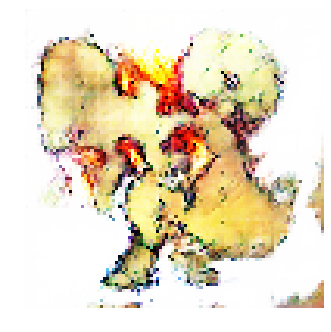


Epoch: 21900, D: -7.823, G: 5.349
Epoch: 21901, D: -6.294, G: 2.623
Epoch: 21902, D: -5.569, G: 2.538
Epoch: 21903, D: -5.936, G: 4.364
Epoch: 21904, D: -6.417, G: 3.643
Epoch: 21905, D: -5.704, G: 5.046
Epoch: 21906, D: -6.007, G: 4.031
Epoch: 21907, D: -5.541, G: 5.63
Epoch: 21908, D: -6.023, G: 5.772
Epoch: 21909, D: -5.6, G: 3.659
Epoch: 21910, D: -4.894, G: 5.324
Epoch: 21911, D: -5.537, G: 3.918
Epoch: 21912, D: -7.243, G: 5.523
Epoch: 21913, D: -7.408, G: 3.777
Epoch: 21914, D: -5.346, G: 3.899
Epoch: 21915, D: -5.726, G: 5.351
Epoch: 21916, D: -7.164, G: 4.413
Epoch: 21917, D: -5.165, G: 2.761
Epoch: 21918, D: -6.296, G: 2.922
Epoch: 21919, D: -5.77, G: 4.973


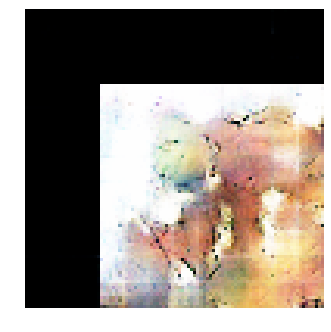


Epoch: 21920, D: -7.238, G: 3.387
Epoch: 21921, D: -6.793, G: 2.948
Epoch: 21922, D: -5.532, G: 4.122
Epoch: 21923, D: -6.137, G: 5.315
Epoch: 21924, D: -7.64, G: 4.75
Epoch: 21925, D: -7.046, G: 5.072
Epoch: 21926, D: -5.324, G: 3.918
Epoch: 21927, D: -5.801, G: 4.241
Epoch: 21928, D: -4.867, G: 3.3
Epoch: 21929, D: -5.38, G: 2.937
Epoch: 21930, D: -6.986, G: 3.117
Epoch: 21931, D: -7.011, G: 6.368
Epoch: 21932, D: -5.98, G: 4.905
Epoch: 21933, D: -5.988, G: 6.944
Epoch: 21934, D: -6.865, G: 3.637
Epoch: 21935, D: -6.27, G: 3.155
Epoch: 21936, D: -5.106, G: 4.866
Epoch: 21937, D: -6.145, G: 4.286
Epoch: 21938, D: -5.987, G: 3.266
Epoch: 21939, D: -6.259, G: 2.673


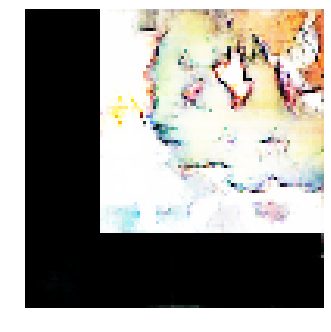


Epoch: 21940, D: -6.641, G: 4.265
Epoch: 21941, D: -5.141, G: 2.957
Epoch: 21942, D: -7.627, G: 3.11
Epoch: 21943, D: -4.641, G: 2.939
Epoch: 21944, D: -5.969, G: 2.562
Epoch: 21945, D: -5.349, G: 2.808
Epoch: 21946, D: -5.596, G: 4.012
Epoch: 21947, D: -5.776, G: 2.972
Epoch: 21948, D: -4.877, G: 4.781
Epoch: 21949, D: -5.082, G: 4.922
Epoch: 21950, D: -5.51, G: 2.099
Epoch: 21951, D: -6.346, G: 2.981
Epoch: 21952, D: -6.505, G: 5.321
Epoch: 21953, D: -5.877, G: 2.956
Epoch: 21954, D: -6.365, G: 5.231
Epoch: 21955, D: -6.372, G: 4.825
Epoch: 21956, D: -7.273, G: 3.314
Epoch: 21957, D: -5.767, G: 3.807
Epoch: 21958, D: -5.073, G: 3.978
Epoch: 21959, D: -7.715, G: 3.77


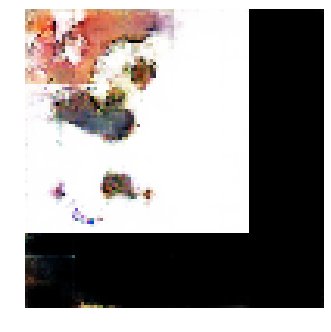


Epoch: 21960, D: -7.436, G: 4.716
Epoch: 21961, D: -5.271, G: 4.615
Epoch: 21962, D: -7.726, G: 4.852
Epoch: 21963, D: -6.254, G: 2.332
Epoch: 21964, D: -5.938, G: 4.459
Epoch: 21965, D: -5.741, G: 5.106
Epoch: 21966, D: -6.233, G: 5.988
Epoch: 21967, D: -4.817, G: 2.915
Epoch: 21968, D: -5.873, G: 2.9
Epoch: 21969, D: -5.74, G: 3.781
Epoch: 21970, D: -5.705, G: 4.575
Epoch: 21971, D: -5.238, G: 3.996
Epoch: 21972, D: -5.787, G: 4.082
Epoch: 21973, D: -7.508, G: 4.196
Epoch: 21974, D: -6.233, G: 2.385
Epoch: 21975, D: -5.902, G: 4.186
Epoch: 21976, D: -6.516, G: 4.237
Epoch: 21977, D: -6.057, G: 4.865
Epoch: 21978, D: -6.811, G: 4.036
Epoch: 21979, D: -5.841, G: 3.0


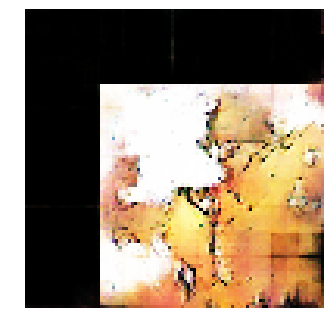


Epoch: 21980, D: -5.649, G: 3.239
Epoch: 21981, D: -5.938, G: 5.047
Epoch: 21982, D: -4.21, G: 5.835
Epoch: 21983, D: -6.993, G: 4.293
Epoch: 21984, D: -6.437, G: 3.981
Epoch: 21985, D: -5.759, G: 3.931
Epoch: 21986, D: -7.214, G: 4.263
Epoch: 21987, D: -5.538, G: 4.433
Epoch: 21988, D: -7.139, G: 4.574
Epoch: 21989, D: -7.094, G: 3.909
Epoch: 21990, D: -6.786, G: 2.198
Epoch: 21991, D: -5.711, G: 4.1
Epoch: 21992, D: -6.295, G: 4.78
Epoch: 21993, D: -5.612, G: 2.612
Epoch: 21994, D: -5.661, G: 2.258
Epoch: 21995, D: -5.497, G: 1.571
Epoch: 21996, D: -7.105, G: 3.472
Epoch: 21997, D: -7.545, G: 4.186
Epoch: 21998, D: -7.16, G: 5.514
Epoch: 21999, D: -5.008, G: 2.779


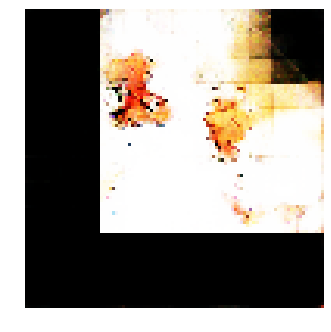


Epoch: 22000, D: -5.361, G: 4.705
Epoch: 22001, D: -6.794, G: 4.534
Epoch: 22002, D: -6.662, G: 3.536
Epoch: 22003, D: -5.096, G: 2.412
Epoch: 22004, D: -4.834, G: 2.963
Epoch: 22005, D: -6.36, G: 4.883
Epoch: 22006, D: -5.248, G: 4.064
Epoch: 22007, D: -7.258, G: 1.871
Epoch: 22008, D: -5.318, G: 4.408
Epoch: 22009, D: -5.97, G: 3.499
Epoch: 22010, D: -6.404, G: 3.39
Epoch: 22011, D: -6.349, G: 2.707
Epoch: 22012, D: -5.34, G: 4.293
Epoch: 22013, D: -5.054, G: 2.714
Epoch: 22014, D: -7.116, G: 2.445
Epoch: 22015, D: -6.048, G: 3.455
Epoch: 22016, D: -5.436, G: 1.11
Epoch: 22017, D: -5.478, G: 3.514
Epoch: 22018, D: -5.633, G: 2.945
Epoch: 22019, D: -5.367, G: 4.748


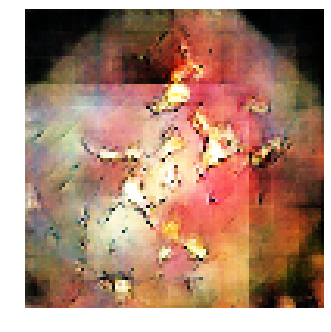


Epoch: 22020, D: -7.251, G: 2.843
Epoch: 22021, D: -5.995, G: 3.046
Epoch: 22022, D: -6.465, G: 5.514
Epoch: 22023, D: -5.322, G: 4.547
Epoch: 22024, D: -6.427, G: 6.585
Epoch: 22025, D: -4.605, G: 3.808
Epoch: 22026, D: -6.761, G: 3.65
Epoch: 22027, D: -5.481, G: 3.286
Epoch: 22028, D: -6.366, G: 4.743
Epoch: 22029, D: -5.827, G: 2.456
Epoch: 22030, D: -6.04, G: 2.863
Epoch: 22031, D: -5.561, G: 2.879
Epoch: 22032, D: -7.437, G: 3.868
Epoch: 22033, D: -5.001, G: 3.37
Epoch: 22034, D: -6.531, G: 4.326
Epoch: 22035, D: -6.387, G: 0.8286
Epoch: 22036, D: -7.85, G: 3.642
Epoch: 22037, D: -6.095, G: 3.826
Epoch: 22038, D: -5.857, G: 4.684
Epoch: 22039, D: -6.114, G: 4.046


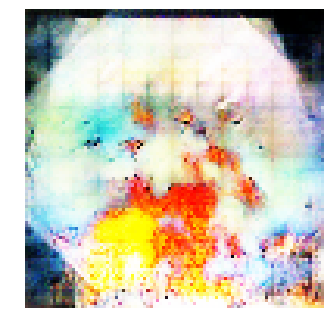


Epoch: 22040, D: -6.508, G: 5.139
Epoch: 22041, D: -5.353, G: 3.504
Epoch: 22042, D: -7.215, G: 2.923
Epoch: 22043, D: -6.709, G: 3.05
Epoch: 22044, D: -5.612, G: 3.623
Epoch: 22045, D: -5.686, G: 2.267
Epoch: 22046, D: -5.477, G: 4.242
Epoch: 22047, D: -6.363, G: 4.337
Epoch: 22048, D: -6.232, G: 5.032
Epoch: 22049, D: -6.505, G: 3.917
Epoch: 22050, D: -5.077, G: 3.334
Epoch: 22051, D: -7.674, G: 4.774
Epoch: 22052, D: -6.3, G: 2.212
Epoch: 22053, D: -6.872, G: 3.094
Epoch: 22054, D: -5.749, G: 3.316
Epoch: 22055, D: -6.273, G: 4.38
Epoch: 22056, D: -6.243, G: 5.805
Epoch: 22057, D: -5.125, G: 5.1
Epoch: 22058, D: -6.231, G: 3.255
Epoch: 22059, D: -5.814, G: 4.661


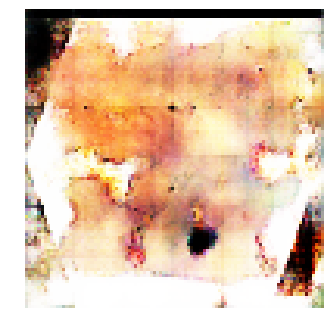


Epoch: 22060, D: -5.159, G: 5.754
Epoch: 22061, D: -5.599, G: 3.9
Epoch: 22062, D: -6.468, G: 3.484
Epoch: 22063, D: -5.736, G: 0.1816
Epoch: 22064, D: -4.682, G: 2.743
Epoch: 22065, D: -6.305, G: 4.345
Epoch: 22066, D: -5.055, G: 4.287
Epoch: 22067, D: -6.686, G: 3.89
Epoch: 22068, D: -6.408, G: 3.544
Epoch: 22069, D: -8.472, G: 4.477
Epoch: 22070, D: -5.508, G: 3.791
Epoch: 22071, D: -6.098, G: 0.9848
Epoch: 22072, D: -6.72, G: 4.287
Epoch: 22073, D: -5.645, G: 4.931
Epoch: 22074, D: -6.049, G: 4.671
Epoch: 22075, D: -7.256, G: 5.1
Epoch: 22076, D: -5.537, G: 3.49
Epoch: 22077, D: -4.289, G: 1.744
Epoch: 22078, D: -5.334, G: 2.377
Epoch: 22079, D: -7.166, G: 3.658


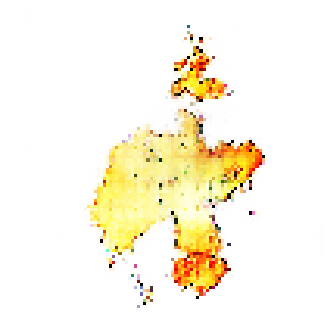


Epoch: 22080, D: -4.851, G: 4.262
Epoch: 22081, D: -5.453, G: 5.168
Epoch: 22082, D: -4.822, G: 2.335
Epoch: 22083, D: -5.807, G: 5.348
Epoch: 22084, D: -6.867, G: 3.473
Epoch: 22085, D: -6.411, G: 3.122
Epoch: 22086, D: -6.14, G: 5.018
Epoch: 22087, D: -7.22, G: 3.965
Epoch: 22088, D: -7.428, G: 4.086
Epoch: 22089, D: -6.003, G: 2.359
Epoch: 22090, D: -6.115, G: 1.478
Epoch: 22091, D: -6.077, G: 4.578
Epoch: 22092, D: -5.881, G: 4.662
Epoch: 22093, D: -6.351, G: 3.278
Epoch: 22094, D: -6.466, G: 4.982
Epoch: 22095, D: -5.797, G: 5.943
Epoch: 22096, D: -5.815, G: 2.993
Epoch: 22097, D: -6.848, G: 4.262
Epoch: 22098, D: -6.306, G: 4.229
Epoch: 22099, D: -5.603, G: 2.196


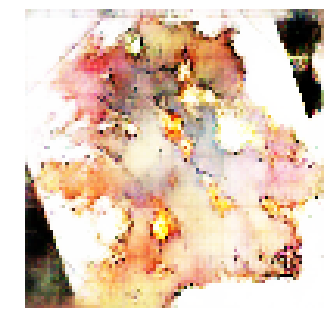


Epoch: 22100, D: -7.224, G: 3.504
Epoch: 22101, D: -5.085, G: 4.522
Epoch: 22102, D: -6.005, G: 3.483
Epoch: 22103, D: -6.381, G: 4.634
Epoch: 22104, D: -5.643, G: 3.852
Epoch: 22105, D: -7.687, G: 6.438
Epoch: 22106, D: -5.949, G: 2.268
Epoch: 22107, D: -4.477, G: 2.758
Epoch: 22108, D: -6.159, G: 4.044
Epoch: 22109, D: -4.806, G: 3.534
Epoch: 22110, D: -6.117, G: 3.717
Epoch: 22111, D: -4.893, G: 3.762
Epoch: 22112, D: -6.674, G: 2.317
Epoch: 22113, D: -4.987, G: 2.312
Epoch: 22114, D: -6.71, G: 6.204
Epoch: 22115, D: -5.907, G: 3.954
Epoch: 22116, D: -5.074, G: 3.647
Epoch: 22117, D: -6.236, G: 2.232
Epoch: 22118, D: -5.409, G: 1.648
Epoch: 22119, D: -6.224, G: 1.472


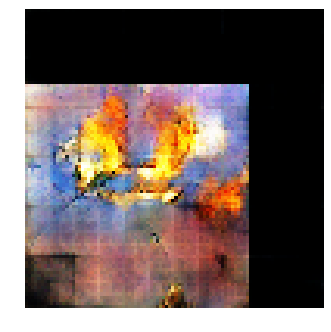


Epoch: 22120, D: -5.657, G: 6.239
Epoch: 22121, D: -4.763, G: 3.8
Epoch: 22122, D: -6.439, G: 2.756
Epoch: 22123, D: -6.463, G: 3.873
Epoch: 22124, D: -5.068, G: 1.963
Epoch: 22125, D: -5.46, G: 3.351
Epoch: 22126, D: -7.549, G: 2.738
Epoch: 22127, D: -7.313, G: 3.382
Epoch: 22128, D: -6.467, G: 6.456
Epoch: 22129, D: -5.471, G: 2.196
Epoch: 22130, D: -5.734, G: 5.039
Epoch: 22131, D: -6.76, G: 4.525
Epoch: 22132, D: -6.455, G: 4.718
Epoch: 22133, D: -6.369, G: 3.736
Epoch: 22134, D: -5.531, G: 3.657
Epoch: 22135, D: -5.738, G: 3.531
Epoch: 22136, D: -6.415, G: 3.588
Epoch: 22137, D: -7.29, G: 2.652
Epoch: 22138, D: -5.163, G: 3.08
Epoch: 22139, D: -7.822, G: 3.476


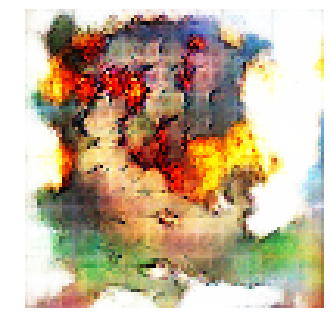


Epoch: 22140, D: -5.244, G: 3.796
Epoch: 22141, D: -6.112, G: 4.352
Epoch: 22142, D: -5.349, G: 3.459
Epoch: 22143, D: -5.758, G: 3.375
Epoch: 22144, D: -5.166, G: 4.465
Epoch: 22145, D: -6.363, G: 2.0
Epoch: 22146, D: -4.788, G: 4.719
Epoch: 22147, D: -5.449, G: 4.08
Epoch: 22148, D: -4.098, G: 1.196
Epoch: 22149, D: -5.144, G: 3.308
Epoch: 22150, D: -6.982, G: 3.533
Epoch: 22151, D: -6.359, G: 5.025
Epoch: 22152, D: -5.384, G: 3.481
Epoch: 22153, D: -5.379, G: 3.086
Epoch: 22154, D: -6.664, G: 2.444
Epoch: 22155, D: -5.691, G: 2.955
Epoch: 22156, D: -5.681, G: 3.386
Epoch: 22157, D: -4.552, G: 3.987
Epoch: 22158, D: -4.354, G: 2.727
Epoch: 22159, D: -4.528, G: 4.455


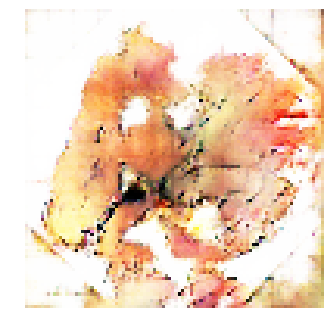


Epoch: 22160, D: -7.683, G: 5.418
Epoch: 22161, D: -5.175, G: 1.343
Epoch: 22162, D: -6.601, G: 4.769
Epoch: 22163, D: -7.461, G: 3.702
Epoch: 22164, D: -6.334, G: 2.402
Epoch: 22165, D: -5.554, G: 5.316
Epoch: 22166, D: -5.485, G: 3.475
Epoch: 22167, D: -4.649, G: 3.34
Epoch: 22168, D: -4.736, G: 5.787
Epoch: 22169, D: -5.264, G: 3.817
Epoch: 22170, D: -5.419, G: 4.389
Epoch: 22171, D: -6.333, G: 3.429
Epoch: 22172, D: -6.347, G: 5.947
Epoch: 22173, D: -4.812, G: 3.25
Epoch: 22174, D: -7.105, G: 2.056
Epoch: 22175, D: -5.941, G: 2.179
Epoch: 22176, D: -5.386, G: 2.165
Epoch: 22177, D: -5.811, G: 2.795
Epoch: 22178, D: -6.482, G: 3.557
Epoch: 22179, D: -4.965, G: 2.564


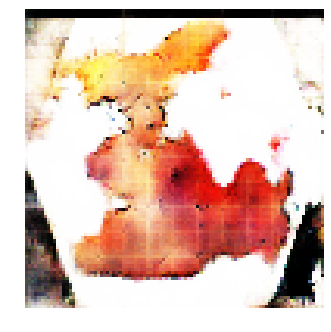


Epoch: 22180, D: -6.574, G: 2.33
Epoch: 22181, D: -7.542, G: 5.529
Epoch: 22182, D: -5.908, G: 4.238
Epoch: 22183, D: -6.064, G: 5.823
Epoch: 22184, D: -5.483, G: 3.181
Epoch: 22185, D: -5.534, G: 3.835
Epoch: 22186, D: -6.1, G: 4.162
Epoch: 22187, D: -7.617, G: 5.257
Epoch: 22188, D: -6.47, G: 3.269
Epoch: 22189, D: -6.897, G: 2.009
Epoch: 22190, D: -6.192, G: 4.004
Epoch: 22191, D: -6.08, G: 2.303
Epoch: 22192, D: -5.656, G: 2.691
Epoch: 22193, D: -5.489, G: 4.253
Epoch: 22194, D: -5.237, G: 5.339
Epoch: 22195, D: -5.806, G: 5.327
Epoch: 22196, D: -5.613, G: 5.444
Epoch: 22197, D: -6.364, G: 2.766
Epoch: 22198, D: -5.218, G: 4.132
Epoch: 22199, D: -6.62, G: 4.325


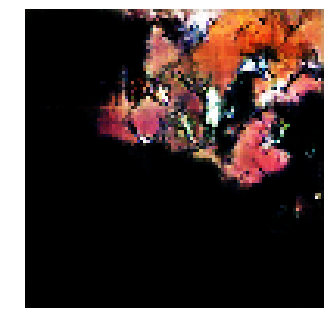


Epoch: 22200, D: -6.017, G: 3.953
Epoch: 22201, D: -5.747, G: 4.343
Epoch: 22202, D: -6.86, G: 4.137
Epoch: 22203, D: -5.822, G: 4.152
Epoch: 22204, D: -5.701, G: 3.367
Epoch: 22205, D: -6.325, G: 4.446
Epoch: 22206, D: -6.568, G: 2.091
Epoch: 22207, D: -4.911, G: 4.941
Epoch: 22208, D: -7.022, G: 3.43
Epoch: 22209, D: -4.942, G: 1.501
Epoch: 22210, D: -5.986, G: 3.869
Epoch: 22211, D: -6.832, G: 4.789
Epoch: 22212, D: -5.871, G: 3.73
Epoch: 22213, D: -6.509, G: 3.717
Epoch: 22214, D: -4.783, G: 3.043
Epoch: 22215, D: -5.87, G: 3.42
Epoch: 22216, D: -6.987, G: 5.324
Epoch: 22217, D: -5.833, G: 6.734
Epoch: 22218, D: -5.947, G: 2.922
Epoch: 22219, D: -7.201, G: 3.988


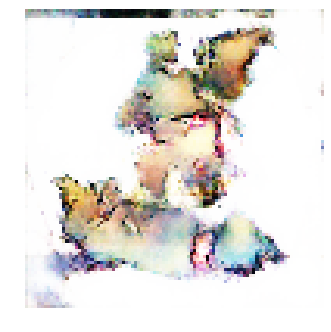


Epoch: 22220, D: -6.53, G: 3.691
Epoch: 22221, D: -5.293, G: 6.11
Epoch: 22222, D: -4.702, G: 4.354
Epoch: 22223, D: -7.034, G: 3.463
Epoch: 22224, D: -6.02, G: 3.065
Epoch: 22225, D: -4.775, G: 5.206
Epoch: 22226, D: -5.18, G: 5.608
Epoch: 22227, D: -5.586, G: 5.032
Epoch: 22228, D: -4.263, G: 5.057
Epoch: 22229, D: -5.664, G: 4.517
Epoch: 22230, D: -6.813, G: 4.071
Epoch: 22231, D: -5.731, G: 5.215
Epoch: 22232, D: -1.784, G: 3.635
Epoch: 22233, D: -5.269, G: 4.949
Epoch: 22234, D: -4.624, G: 2.981
Epoch: 22235, D: -5.551, G: 4.332
Epoch: 22236, D: -6.095, G: 3.59
Epoch: 22237, D: -7.545, G: 3.446
Epoch: 22238, D: -5.443, G: 2.693
Epoch: 22239, D: -5.643, G: 3.285


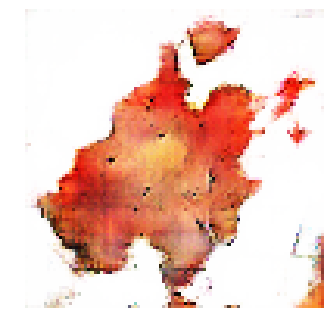


Epoch: 22240, D: -5.293, G: 4.39
Epoch: 22241, D: -5.345, G: 1.981
Epoch: 22242, D: -5.541, G: 4.276
Epoch: 22243, D: -5.59, G: 4.194
Epoch: 22244, D: -6.024, G: 4.668
Epoch: 22245, D: -6.693, G: 3.812
Epoch: 22246, D: -6.129, G: 3.235
Epoch: 22247, D: -5.948, G: 2.191
Epoch: 22248, D: -7.146, G: 4.848
Epoch: 22249, D: -5.748, G: 4.816
Epoch: 22250, D: -5.696, G: 1.751
Epoch: 22251, D: -5.378, G: 3.844
Epoch: 22252, D: -7.351, G: 1.617
Epoch: 22253, D: -4.604, G: 1.282
Epoch: 22254, D: -6.087, G: 4.231
Epoch: 22255, D: -5.562, G: 4.862
Epoch: 22256, D: -6.17, G: 1.912
Epoch: 22257, D: -5.346, G: 3.456
Epoch: 22258, D: -6.374, G: 2.887
Epoch: 22259, D: -6.703, G: 4.582


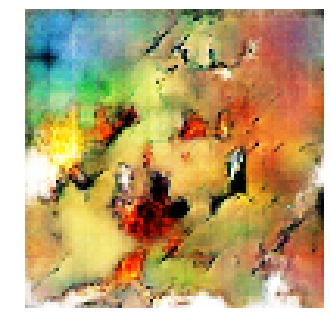


Epoch: 22260, D: -5.963, G: 4.104
Epoch: 22261, D: -5.526, G: 3.671
Epoch: 22262, D: -6.689, G: 5.959
Epoch: 22263, D: -6.243, G: 2.957
Epoch: 22264, D: -5.665, G: 3.303
Epoch: 22265, D: -6.678, G: 3.762
Epoch: 22266, D: -5.872, G: 5.298
Epoch: 22267, D: -5.04, G: 5.167
Epoch: 22268, D: -5.648, G: 5.419
Epoch: 22269, D: -6.343, G: 3.597
Epoch: 22270, D: -4.956, G: 4.006
Epoch: 22271, D: -5.017, G: 2.254
Epoch: 22272, D: -5.491, G: 4.39
Epoch: 22273, D: -5.514, G: 4.799
Epoch: 22274, D: -4.942, G: 4.948
Epoch: 22275, D: -6.076, G: 2.977
Epoch: 22276, D: -4.696, G: 2.921
Epoch: 22277, D: -6.577, G: 4.893
Epoch: 22278, D: -6.279, G: 5.232
Epoch: 22279, D: -6.533, G: 3.951


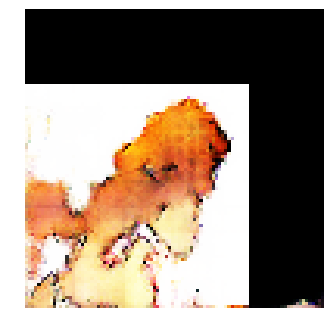


Epoch: 22280, D: -5.009, G: 2.407
Epoch: 22281, D: -6.411, G: 3.414
Epoch: 22282, D: -6.385, G: 5.39
Epoch: 22283, D: -6.222, G: 3.617
Epoch: 22284, D: -4.894, G: 3.796
Epoch: 22285, D: -5.637, G: 4.371
Epoch: 22286, D: -5.359, G: 4.345
Epoch: 22287, D: -6.099, G: 3.158
Epoch: 22288, D: -4.492, G: 2.936
Epoch: 22289, D: -5.997, G: 3.162
Epoch: 22290, D: -5.212, G: 2.204
Epoch: 22291, D: -5.653, G: 4.206
Epoch: 22292, D: -6.606, G: 3.413
Epoch: 22293, D: -5.803, G: 3.028
Epoch: 22294, D: -6.301, G: 2.871
Epoch: 22295, D: -7.229, G: 3.808
Epoch: 22296, D: -5.429, G: 3.876
Epoch: 22297, D: -7.199, G: 4.536
Epoch: 22298, D: -5.954, G: 2.067
Epoch: 22299, D: -5.709, G: 4.515


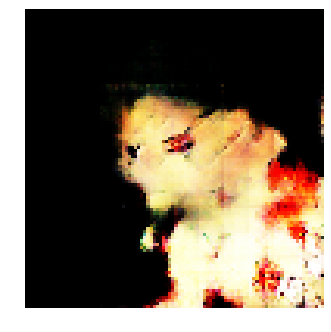


Epoch: 22300, D: -5.644, G: 3.317
Epoch: 22301, D: -5.86, G: 5.929
Epoch: 22302, D: -5.072, G: 6.445
Epoch: 22303, D: -6.992, G: 4.781
Epoch: 22304, D: -6.158, G: 2.921
Epoch: 22305, D: -5.334, G: 3.344
Epoch: 22306, D: -5.244, G: 4.138
Epoch: 22307, D: -5.096, G: 3.538
Epoch: 22308, D: -5.554, G: 2.999
Epoch: 22309, D: -5.693, G: 4.215
Epoch: 22310, D: -5.881, G: 2.693
Epoch: 22311, D: -7.133, G: 3.012
Epoch: 22312, D: -6.406, G: 4.376
Epoch: 22313, D: -6.377, G: 4.725
Epoch: 22314, D: -7.122, G: 3.246
Epoch: 22315, D: -4.678, G: 3.369
Epoch: 22316, D: -6.256, G: 3.748
Epoch: 22317, D: -5.549, G: 4.054
Epoch: 22318, D: -5.639, G: 3.504
Epoch: 22319, D: -5.955, G: 5.637


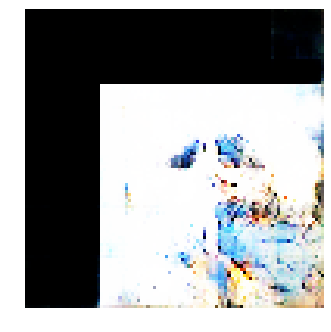


Epoch: 22320, D: -5.557, G: 3.108
Epoch: 22321, D: -5.296, G: 4.843
Epoch: 22322, D: -6.63, G: 4.136
Epoch: 22323, D: -5.501, G: 3.491
Epoch: 22324, D: -5.342, G: 4.374
Epoch: 22325, D: -6.882, G: 3.778
Epoch: 22326, D: -6.11, G: 3.969
Epoch: 22327, D: -6.026, G: 2.32
Epoch: 22328, D: -5.284, G: 1.886
Epoch: 22329, D: -4.633, G: 2.478
Epoch: 22330, D: -6.065, G: 3.061
Epoch: 22331, D: -5.641, G: 3.143
Epoch: 22332, D: -5.115, G: 4.305
Epoch: 22333, D: -5.525, G: 4.249
Epoch: 22334, D: -6.531, G: 3.668
Epoch: 22335, D: -5.652, G: 4.698
Epoch: 22336, D: -6.085, G: 2.664
Epoch: 22337, D: -5.368, G: 6.123
Epoch: 22338, D: -6.361, G: 5.12
Epoch: 22339, D: -5.659, G: 3.216


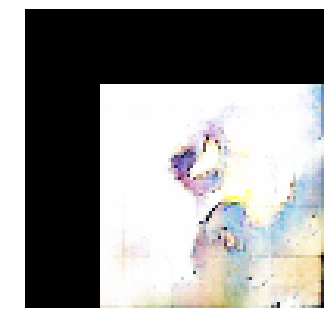


Epoch: 22340, D: -5.171, G: 3.268
Epoch: 22341, D: -5.685, G: 5.06
Epoch: 22342, D: -6.483, G: 3.072
Epoch: 22343, D: -4.935, G: 3.854
Epoch: 22344, D: -6.356, G: 5.286
Epoch: 22345, D: -6.009, G: 4.698
Epoch: 22346, D: -6.116, G: 4.711
Epoch: 22347, D: -6.126, G: 4.254
Epoch: 22348, D: -6.284, G: 2.899
Epoch: 22349, D: -6.107, G: 2.767
Epoch: 22350, D: -6.466, G: 4.497
Epoch: 22351, D: -5.068, G: 2.377
Epoch: 22352, D: -6.467, G: 5.132
Epoch: 22353, D: -5.427, G: 4.226
Epoch: 22354, D: -5.522, G: 4.19
Epoch: 22355, D: -6.137, G: 3.349
Epoch: 22356, D: -6.53, G: 4.544
Epoch: 22357, D: -5.325, G: 3.439
Epoch: 22358, D: -6.279, G: 3.354
Epoch: 22359, D: -5.89, G: 5.048


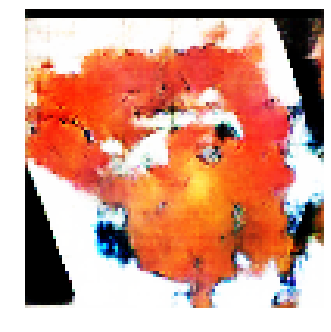


Epoch: 22360, D: -5.503, G: 2.303
Epoch: 22361, D: -5.994, G: 4.52
Epoch: 22362, D: -4.759, G: 5.017
Epoch: 22363, D: -6.403, G: 5.207
Epoch: 22364, D: -4.814, G: 4.494
Epoch: 22365, D: -5.714, G: 4.736
Epoch: 22366, D: -5.985, G: 3.588
Epoch: 22367, D: -5.546, G: 2.619
Epoch: 22368, D: -7.203, G: 3.314
Epoch: 22369, D: -5.183, G: 3.295
Epoch: 22370, D: -5.328, G: 4.053
Epoch: 22371, D: -5.436, G: 4.968
Epoch: 22372, D: -5.635, G: 2.481
Epoch: 22373, D: -5.463, G: 4.259
Epoch: 22374, D: -6.202, G: 1.793
Epoch: 22375, D: -5.616, G: 4.805
Epoch: 22376, D: -7.906, G: 3.226
Epoch: 22377, D: -6.363, G: 1.443
Epoch: 22378, D: -6.231, G: 6.291
Epoch: 22379, D: -7.281, G: 2.285


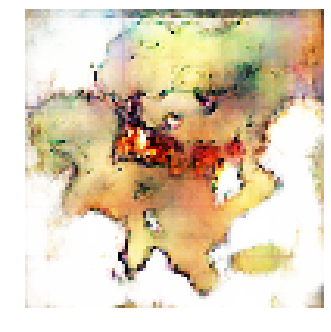


Epoch: 22380, D: -7.299, G: 5.929
Epoch: 22381, D: -5.237, G: 3.212
Epoch: 22382, D: -7.098, G: 2.788
Epoch: 22383, D: -8.048, G: 3.53
Epoch: 22384, D: -5.859, G: 4.693
Epoch: 22385, D: -5.173, G: 5.071
Epoch: 22386, D: -5.106, G: 5.488
Epoch: 22387, D: -6.213, G: 5.187
Epoch: 22388, D: -5.65, G: 3.32
Epoch: 22389, D: -6.652, G: 3.027
Epoch: 22390, D: -5.138, G: 2.696
Epoch: 22391, D: -5.565, G: 5.198
Epoch: 22392, D: -5.331, G: 2.859
Epoch: 22393, D: -5.971, G: 5.976
Epoch: 22394, D: -5.729, G: 2.776
Epoch: 22395, D: -6.225, G: 2.804
Epoch: 22396, D: -5.573, G: 3.977
Epoch: 22397, D: -4.689, G: 2.601
Epoch: 22398, D: -6.33, G: 3.724
Epoch: 22399, D: -5.091, G: 1.721


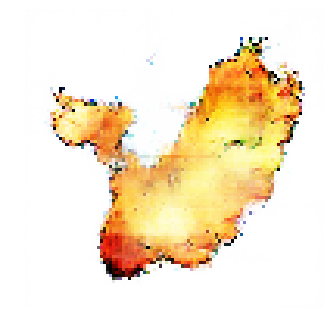


Epoch: 22400, D: -7.114, G: 4.73
Epoch: 22401, D: -5.984, G: 3.978
Epoch: 22402, D: -5.023, G: 5.468
Epoch: 22403, D: -5.666, G: 3.842
Epoch: 22404, D: -6.267, G: 4.863
Epoch: 22405, D: -6.483, G: 4.611
Epoch: 22406, D: -4.945, G: 2.312
Epoch: 22407, D: -5.607, G: 3.985
Epoch: 22408, D: -5.754, G: 3.418
Epoch: 22409, D: -5.934, G: 4.555
Epoch: 22410, D: -6.661, G: 4.876
Epoch: 22411, D: -5.708, G: 3.391
Epoch: 22412, D: -5.97, G: 4.613
Epoch: 22413, D: -6.613, G: 3.686
Epoch: 22414, D: -5.336, G: 2.662
Epoch: 22415, D: -6.516, G: 3.31
Epoch: 22416, D: -5.559, G: 2.963
Epoch: 22417, D: -6.492, G: 2.878
Epoch: 22418, D: -7.39, G: 1.482
Epoch: 22419, D: -6.55, G: 2.304


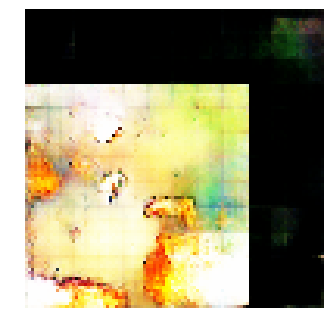


Epoch: 22420, D: -6.573, G: 2.205
Epoch: 22421, D: -5.545, G: 3.469
Epoch: 22422, D: -5.911, G: 3.766
Epoch: 22423, D: -7.262, G: 2.879
Epoch: 22424, D: -6.756, G: 3.446
Epoch: 22425, D: -5.937, G: 3.655
Epoch: 22426, D: -5.846, G: 4.526
Epoch: 22427, D: -6.014, G: 4.498
Epoch: 22428, D: -5.996, G: 6.244
Epoch: 22429, D: -6.391, G: 2.817
Epoch: 22430, D: -4.002, G: 3.966
Epoch: 22431, D: -7.115, G: 2.743
Epoch: 22432, D: -5.931, G: 2.692
Epoch: 22433, D: -6.012, G: 3.769
Epoch: 22434, D: -5.661, G: 4.021
Epoch: 22435, D: -5.855, G: 2.476
Epoch: 22436, D: -5.727, G: 4.554
Epoch: 22437, D: -3.986, G: 3.28
Epoch: 22438, D: -4.746, G: 3.917
Epoch: 22439, D: -5.917, G: 5.72


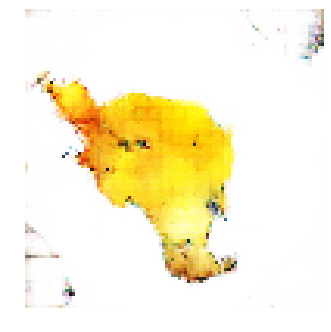


Epoch: 22440, D: -5.356, G: 3.517
Epoch: 22441, D: -4.792, G: 3.701
Epoch: 22442, D: -7.652, G: 2.038
Epoch: 22443, D: -5.702, G: 3.562
Epoch: 22444, D: -8.448, G: 3.572
Epoch: 22445, D: -6.486, G: 5.484
Epoch: 22446, D: -5.358, G: -0.1067
Epoch: 22447, D: -5.009, G: 1.834
Epoch: 22448, D: -5.034, G: 3.55
Epoch: 22449, D: -5.689, G: 4.843
Epoch: 22450, D: -6.426, G: 3.841
Epoch: 22451, D: -5.902, G: 5.192
Epoch: 22452, D: -5.718, G: 2.891
Epoch: 22453, D: -5.804, G: 4.563
Epoch: 22454, D: -6.732, G: 4.212
Epoch: 22455, D: -5.023, G: 2.807
Epoch: 22456, D: -6.042, G: 3.042
Epoch: 22457, D: -5.311, G: 4.95
Epoch: 22458, D: -6.804, G: 3.778
Epoch: 22459, D: -5.635, G: 6.366


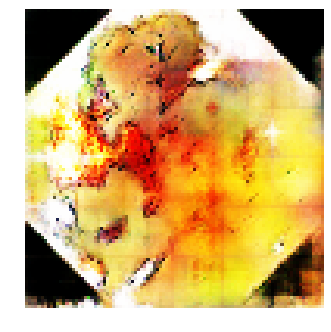


Epoch: 22460, D: -6.075, G: 5.911
Epoch: 22461, D: -6.351, G: 4.374
Epoch: 22462, D: -5.534, G: 5.076
Epoch: 22463, D: -4.174, G: 5.105
Epoch: 22464, D: -5.591, G: 3.714
Epoch: 22465, D: -6.172, G: 4.812
Epoch: 22466, D: -5.692, G: 2.377
Epoch: 22467, D: -6.284, G: 1.563
Epoch: 22468, D: -6.785, G: 1.837
Epoch: 22469, D: -5.609, G: 1.267
Epoch: 22470, D: -7.913, G: 3.638
Epoch: 22471, D: -6.085, G: 4.397
Epoch: 22472, D: -5.188, G: 4.507
Epoch: 22473, D: -5.647, G: 5.011
Epoch: 22474, D: -5.367, G: 3.987
Epoch: 22475, D: -6.142, G: 2.864
Epoch: 22476, D: -5.99, G: 1.29
Epoch: 22477, D: -5.821, G: 3.508
Epoch: 22478, D: -5.977, G: 1.924
Epoch: 22479, D: -6.572, G: 1.629


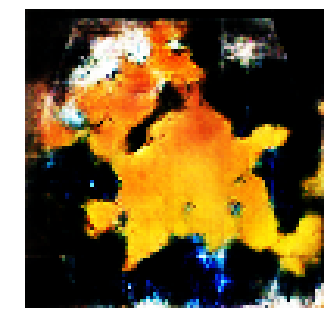


Epoch: 22480, D: -6.46, G: 3.586
Epoch: 22481, D: -6.406, G: 4.018
Epoch: 22482, D: -7.147, G: 4.092
Epoch: 22483, D: -6.727, G: 3.024
Epoch: 22484, D: -6.394, G: 5.191
Epoch: 22485, D: -6.422, G: 4.131
Epoch: 22486, D: -8.41, G: 3.557
Epoch: 22487, D: -5.631, G: 4.15
Epoch: 22488, D: -6.342, G: 4.508
Epoch: 22489, D: -6.015, G: 3.107
Epoch: 22490, D: -4.978, G: 3.662
Epoch: 22491, D: -5.415, G: 3.031
Epoch: 22492, D: -6.486, G: 4.682
Epoch: 22493, D: -5.161, G: 2.654
Epoch: 22494, D: -6.675, G: 2.414
Epoch: 22495, D: -6.555, G: 4.228
Epoch: 22496, D: -6.432, G: 3.908
Epoch: 22497, D: -5.768, G: 4.835
Epoch: 22498, D: -5.613, G: 4.651
Epoch: 22499, D: -5.773, G: 3.357


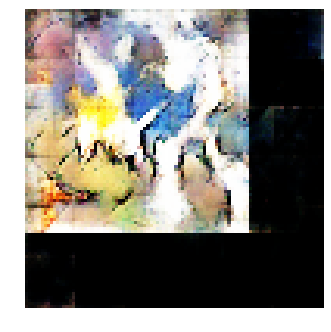


Epoch: 22500, D: -5.612, G: 4.133
Epoch: 22501, D: -5.412, G: 5.821
Epoch: 22502, D: -5.826, G: 4.621
Epoch: 22503, D: -6.351, G: 6.242
Epoch: 22504, D: -5.198, G: 4.5
Epoch: 22505, D: -5.861, G: 3.881
Epoch: 22506, D: -8.178, G: 5.976
Epoch: 22507, D: -5.193, G: 2.931
Epoch: 22508, D: -6.008, G: 5.345
Epoch: 22509, D: -6.659, G: 5.605
Epoch: 22510, D: -5.32, G: 5.878
Epoch: 22511, D: -6.453, G: 4.674
Epoch: 22512, D: -5.697, G: 3.566
Epoch: 22513, D: -6.403, G: 4.859
Epoch: 22514, D: -6.197, G: 3.722
Epoch: 22515, D: -5.61, G: 3.228
Epoch: 22516, D: -5.209, G: 4.766
Epoch: 22517, D: -5.746, G: 3.592
Epoch: 22518, D: -5.412, G: 4.072
Epoch: 22519, D: -7.037, G: 3.198


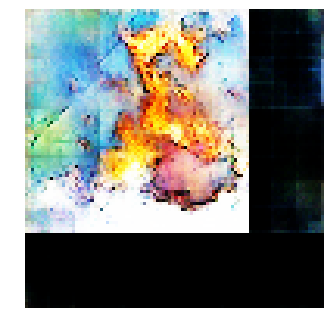


Epoch: 22520, D: -5.797, G: 4.763
Epoch: 22521, D: -5.489, G: 4.921
Epoch: 22522, D: -5.629, G: 4.728
Epoch: 22523, D: -7.583, G: 4.331
Epoch: 22524, D: -7.112, G: 4.305
Epoch: 22525, D: -6.6, G: 5.642
Epoch: 22526, D: -6.776, G: 5.781
Epoch: 22527, D: -6.088, G: 3.267
Epoch: 22528, D: -5.437, G: 3.46
Epoch: 22529, D: -4.246, G: 2.513
Epoch: 22530, D: -5.76, G: 2.554
Epoch: 22531, D: -6.886, G: 4.233
Epoch: 22532, D: -3.726, G: 1.598
Epoch: 22533, D: -5.346, G: 3.685
Epoch: 22534, D: -6.066, G: 3.401
Epoch: 22535, D: -5.962, G: 1.783
Epoch: 22536, D: -4.479, G: 3.951
Epoch: 22537, D: -5.446, G: 2.988
Epoch: 22538, D: -6.269, G: 2.103
Epoch: 22539, D: -5.44, G: 3.244


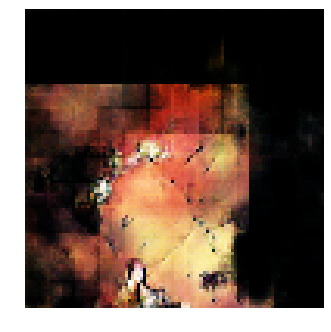


Epoch: 22540, D: -6.568, G: 2.014
Epoch: 22541, D: -5.546, G: 2.354
Epoch: 22542, D: -5.842, G: 3.847
Epoch: 22543, D: -4.945, G: 3.36
Epoch: 22544, D: -6.101, G: 4.141
Epoch: 22545, D: -5.386, G: 3.972
Epoch: 22546, D: -6.596, G: 4.026
Epoch: 22547, D: -5.923, G: 4.253
Epoch: 22548, D: -6.634, G: 3.266
Epoch: 22549, D: -5.42, G: 2.943
Epoch: 22550, D: -6.68, G: 6.46
Epoch: 22551, D: -6.394, G: 5.14
Epoch: 22552, D: -6.656, G: 4.462
Epoch: 22553, D: -5.382, G: 3.402
Epoch: 22554, D: -4.907, G: 4.809
Epoch: 22555, D: -5.717, G: 5.759
Epoch: 22556, D: -6.478, G: 4.844
Epoch: 22557, D: -5.244, G: 2.339
Epoch: 22558, D: -5.478, G: 3.508
Epoch: 22559, D: -5.996, G: 3.558


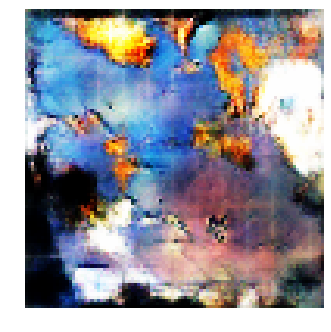


Epoch: 22560, D: -5.245, G: 2.558
Epoch: 22561, D: -6.107, G: 3.891
Epoch: 22562, D: -5.543, G: 5.822
Epoch: 22563, D: -7.218, G: 5.693
Epoch: 22564, D: -7.556, G: 2.38
Epoch: 22565, D: -6.248, G: 4.365
Epoch: 22566, D: -5.735, G: 2.838
Epoch: 22567, D: -6.655, G: 3.212
Epoch: 22568, D: -7.007, G: 3.653
Epoch: 22569, D: -4.472, G: 2.957
Epoch: 22570, D: -6.561, G: 4.41
Epoch: 22571, D: -6.253, G: 2.929
Epoch: 22572, D: -6.136, G: 5.123
Epoch: 22573, D: -6.23, G: 2.777
Epoch: 22574, D: -6.24, G: 3.631
Epoch: 22575, D: -5.902, G: 2.542
Epoch: 22576, D: -5.599, G: 3.08
Epoch: 22577, D: -6.105, G: 4.176
Epoch: 22578, D: -6.51, G: 3.3
Epoch: 22579, D: -7.222, G: 3.42


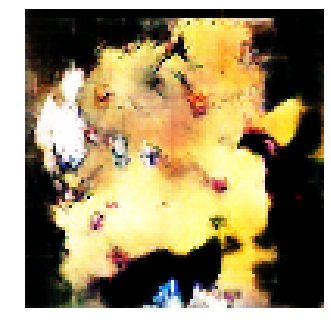


Epoch: 22580, D: -5.7, G: 2.75
Epoch: 22581, D: -7.051, G: 3.77
Epoch: 22582, D: -5.787, G: 1.525
Epoch: 22583, D: -5.127, G: 1.413
Epoch: 22584, D: -5.83, G: 3.354
Epoch: 22585, D: -6.816, G: 4.141
Epoch: 22586, D: -6.303, G: 5.496
Epoch: 22587, D: -5.399, G: 3.336
Epoch: 22588, D: -5.826, G: 4.659
Epoch: 22589, D: -6.027, G: 5.541
Epoch: 22590, D: -7.36, G: 3.827
Epoch: 22591, D: -6.578, G: 2.983
Epoch: 22592, D: -5.657, G: 3.032
Epoch: 22593, D: -6.688, G: 3.552
Epoch: 22594, D: -6.09, G: 4.502
Epoch: 22595, D: -6.118, G: 5.548
Epoch: 22596, D: -5.491, G: 6.138
Epoch: 22597, D: -6.239, G: 3.925
Epoch: 22598, D: -6.207, G: 3.012
Epoch: 22599, D: -5.447, G: 4.352


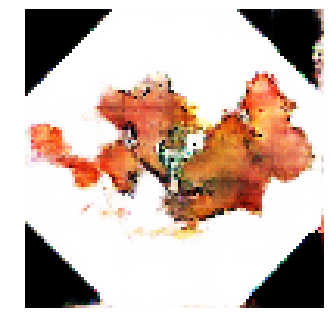


Epoch: 22600, D: -6.041, G: 3.326
Epoch: 22601, D: -6.497, G: 3.059
Epoch: 22602, D: -4.196, G: 1.839
Epoch: 22603, D: -5.924, G: 4.655
Epoch: 22604, D: -7.409, G: 3.678
Epoch: 22605, D: -6.629, G: 2.637
Epoch: 22606, D: -5.941, G: 4.974
Epoch: 22607, D: -6.544, G: 4.339
Epoch: 22608, D: -6.538, G: 4.935
Epoch: 22609, D: -5.613, G: 2.697
Epoch: 22610, D: -6.962, G: 2.477
Epoch: 22611, D: -5.634, G: 3.018
Epoch: 22612, D: -8.04, G: 4.015
Epoch: 22613, D: -7.995, G: 2.524
Epoch: 22614, D: -5.805, G: 4.221
Epoch: 22615, D: -5.796, G: 5.405
Epoch: 22616, D: -4.774, G: 4.931
Epoch: 22617, D: -5.807, G: 6.767
Epoch: 22618, D: -7.15, G: 4.462
Epoch: 22619, D: -5.574, G: 1.183


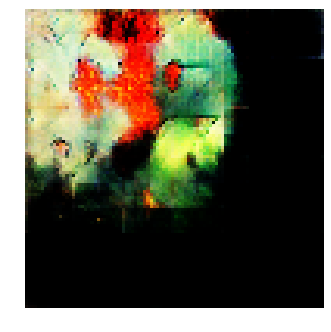


Epoch: 22620, D: -6.104, G: 3.832
Epoch: 22621, D: -6.265, G: 2.664
Epoch: 22622, D: -5.284, G: 5.46
Epoch: 22623, D: -5.825, G: 5.058
Epoch: 22624, D: -4.969, G: 3.7
Epoch: 22625, D: -6.67, G: 4.433
Epoch: 22626, D: -5.408, G: 4.505
Epoch: 22627, D: -6.267, G: 3.095
Epoch: 22628, D: -6.66, G: 3.016
Epoch: 22629, D: -6.39, G: 4.046
Epoch: 22630, D: -5.232, G: 4.931
Epoch: 22631, D: -5.964, G: 5.07
Epoch: 22632, D: -5.54, G: 2.229
Epoch: 22633, D: -6.01, G: 2.434
Epoch: 22634, D: -5.713, G: 4.341
Epoch: 22635, D: -6.007, G: 4.594
Epoch: 22636, D: -5.451, G: 2.575
Epoch: 22637, D: -6.577, G: 3.269
Epoch: 22638, D: -5.776, G: 2.913
Epoch: 22639, D: -6.617, G: 4.107


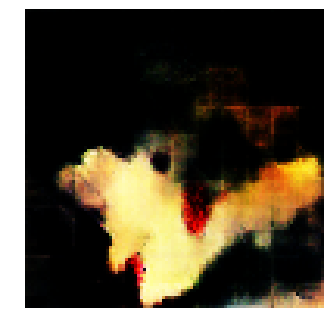


Epoch: 22640, D: -6.479, G: 2.205
Epoch: 22641, D: -7.046, G: 0.9064
Epoch: 22642, D: -5.665, G: 1.63
Epoch: 22643, D: -5.849, G: 3.156
Epoch: 22644, D: -7.229, G: 4.994
Epoch: 22645, D: -5.951, G: 3.355
Epoch: 22646, D: -4.473, G: 3.934
Epoch: 22647, D: -6.804, G: 4.594
Epoch: 22648, D: -6.36, G: 5.203
Epoch: 22649, D: -6.394, G: 4.984
Epoch: 22650, D: -5.771, G: 3.792
Epoch: 22651, D: -7.394, G: 3.869
Epoch: 22652, D: -5.003, G: 1.833
Epoch: 22653, D: -6.327, G: 5.116
Epoch: 22654, D: -6.271, G: 4.236
Epoch: 22655, D: -5.96, G: 3.04
Epoch: 22656, D: -6.965, G: 2.359
Epoch: 22657, D: -4.958, G: 4.64
Epoch: 22658, D: -6.995, G: 2.004
Epoch: 22659, D: -6.507, G: 4.453


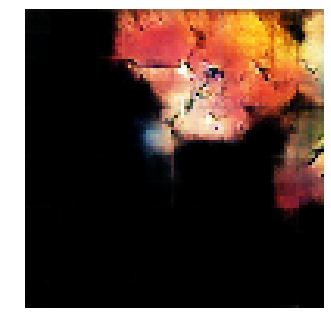


Epoch: 22660, D: -5.305, G: 4.047
Epoch: 22661, D: -6.048, G: 4.788
Epoch: 22662, D: -5.367, G: 3.053
Epoch: 22663, D: -6.948, G: 3.997
Epoch: 22664, D: -5.706, G: 4.018
Epoch: 22665, D: -7.296, G: 5.413
Epoch: 22666, D: -5.434, G: 3.017
Epoch: 22667, D: -4.982, G: 5.619
Epoch: 22668, D: -5.377, G: 5.182
Epoch: 22669, D: -6.991, G: 7.033
Epoch: 22670, D: -5.883, G: 4.61
Epoch: 22671, D: -4.616, G: 4.333
Epoch: 22672, D: -5.079, G: 3.846
Epoch: 22673, D: -6.668, G: 4.659
Epoch: 22674, D: -5.68, G: 4.221
Epoch: 22675, D: -5.976, G: 3.776
Epoch: 22676, D: -6.107, G: 3.352
Epoch: 22677, D: -5.709, G: 3.943
Epoch: 22678, D: -5.43, G: 2.919
Epoch: 22679, D: -3.935, G: 3.225


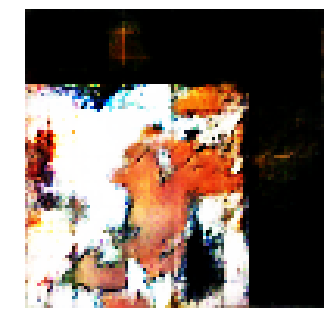


Epoch: 22680, D: -6.751, G: 5.24
Epoch: 22681, D: -7.247, G: 3.616
Epoch: 22682, D: -6.287, G: 2.604
Epoch: 22683, D: -8.083, G: 3.254
Epoch: 22684, D: -5.79, G: 5.05
Epoch: 22685, D: -6.196, G: 4.099
Epoch: 22686, D: -6.485, G: 3.954
Epoch: 22687, D: -4.573, G: 5.109
Epoch: 22688, D: -6.322, G: 4.225
Epoch: 22689, D: -5.028, G: 2.982
Epoch: 22690, D: -6.027, G: 3.713
Epoch: 22691, D: -5.922, G: 3.195
Epoch: 22692, D: -6.838, G: 2.893
Epoch: 22693, D: -6.461, G: 0.6926
Epoch: 22694, D: -7.149, G: 2.863
Epoch: 22695, D: -5.645, G: 2.465
Epoch: 22696, D: -4.743, G: 5.791
Epoch: 22697, D: -5.508, G: 3.701
Epoch: 22698, D: -6.164, G: 1.901
Epoch: 22699, D: -5.622, G: 1.734


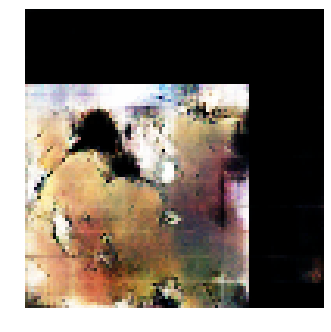


Epoch: 22700, D: -5.314, G: 2.641
Epoch: 22701, D: -5.96, G: 2.929
Epoch: 22702, D: -4.807, G: 5.007
Epoch: 22703, D: -5.525, G: 4.505
Epoch: 22704, D: -5.097, G: 5.367
Epoch: 22705, D: -6.467, G: 4.328
Epoch: 22706, D: -6.598, G: 4.108
Epoch: 22707, D: -5.667, G: 3.72
Epoch: 22708, D: -5.393, G: 3.911
Epoch: 22709, D: -7.312, G: 4.495
Epoch: 22710, D: -5.816, G: 1.796
Epoch: 22711, D: -6.585, G: 3.563
Epoch: 22712, D: -6.055, G: 5.224
Epoch: 22713, D: -5.671, G: 4.581
Epoch: 22714, D: -5.155, G: 5.691
Epoch: 22715, D: -5.922, G: 5.153
Epoch: 22716, D: -5.246, G: 3.659
Epoch: 22717, D: -6.889, G: 3.446
Epoch: 22718, D: -5.332, G: 3.15
Epoch: 22719, D: -6.5, G: 3.444


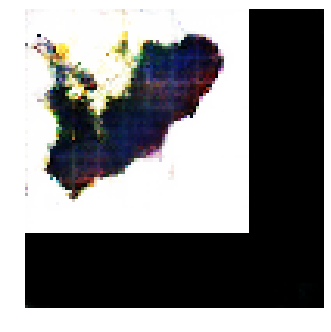


Epoch: 22720, D: -5.303, G: 3.365
Epoch: 22721, D: -7.214, G: 3.548
Epoch: 22722, D: -8.039, G: 4.493
Epoch: 22723, D: -6.007, G: 2.966
Epoch: 22724, D: -6.167, G: 3.57
Epoch: 22725, D: -6.778, G: 2.735
Epoch: 22726, D: -5.463, G: 5.845
Epoch: 22727, D: -5.734, G: 3.515
Epoch: 22728, D: -5.539, G: 2.385
Epoch: 22729, D: -6.65, G: 3.267
Epoch: 22730, D: -6.588, G: 3.493
Epoch: 22731, D: -7.042, G: 3.143
Epoch: 22732, D: -6.915, G: 4.167
Epoch: 22733, D: -6.273, G: 2.961
Epoch: 22734, D: -6.091, G: 0.5593
Epoch: 22735, D: -6.345, G: 2.503
Epoch: 22736, D: -5.289, G: 4.08
Epoch: 22737, D: -6.693, G: 3.71
Epoch: 22738, D: -5.87, G: 4.759
Epoch: 22739, D: -5.666, G: 3.478


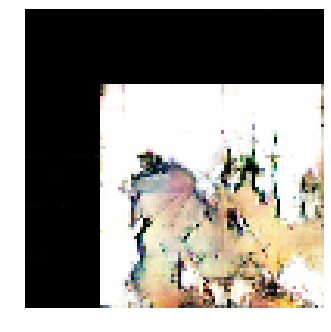


Epoch: 22740, D: -6.722, G: 4.012
Epoch: 22741, D: -5.696, G: 5.36
Epoch: 22742, D: -4.17, G: 5.384
Epoch: 22743, D: -5.627, G: 4.926
Epoch: 22744, D: -6.068, G: 5.165
Epoch: 22745, D: -6.91, G: 5.695
Epoch: 22746, D: -7.179, G: 1.36
Epoch: 22747, D: -6.027, G: 5.262
Epoch: 22748, D: -6.103, G: 3.916
Epoch: 22749, D: -5.289, G: 4.074
Epoch: 22750, D: -7.293, G: 5.237
Epoch: 22751, D: -5.082, G: 5.258
Epoch: 22752, D: -4.966, G: 4.147
Epoch: 22753, D: -5.6, G: 3.451
Epoch: 22754, D: -6.396, G: 4.435
Epoch: 22755, D: -5.026, G: 3.395
Epoch: 22756, D: -6.414, G: 2.85
Epoch: 22757, D: -4.952, G: 3.457
Epoch: 22758, D: -6.445, G: 2.918
Epoch: 22759, D: -5.308, G: 4.705


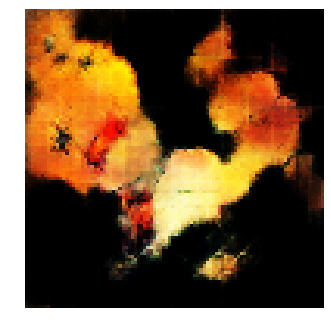


Epoch: 22760, D: -5.567, G: 4.423
Epoch: 22761, D: -4.831, G: 5.894
Epoch: 22762, D: -4.755, G: 6.418
Epoch: 22763, D: -5.98, G: 5.289
Epoch: 22764, D: -5.892, G: 4.868
Epoch: 22765, D: -6.169, G: 4.508
Epoch: 22766, D: -5.927, G: 5.785
Epoch: 22767, D: -6.037, G: 4.565
Epoch: 22768, D: -6.229, G: 5.024
Epoch: 22769, D: -5.976, G: 3.153
Epoch: 22770, D: -5.875, G: 4.303
Epoch: 22771, D: -6.464, G: 3.644
Epoch: 22772, D: -5.732, G: 5.627
Epoch: 22773, D: -7.168, G: 4.458
Epoch: 22774, D: -4.648, G: 1.628
Epoch: 22775, D: -6.282, G: 3.06
Epoch: 22776, D: -5.597, G: 2.352
Epoch: 22777, D: -6.78, G: 3.661
Epoch: 22778, D: -5.268, G: 3.882
Epoch: 22779, D: -4.874, G: 4.291


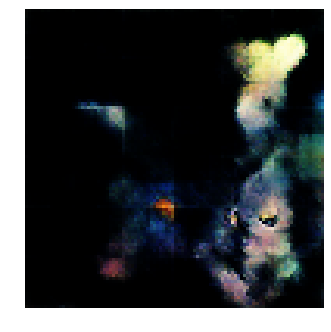


Epoch: 22780, D: -5.641, G: 2.436
Epoch: 22781, D: -4.712, G: 3.991
Epoch: 22782, D: -6.18, G: 2.949
Epoch: 22783, D: -5.415, G: 4.989
Epoch: 22784, D: -6.746, G: 3.996
Epoch: 22785, D: -6.489, G: 2.928
Epoch: 22786, D: -4.75, G: 3.97
Epoch: 22787, D: -5.605, G: 2.693
Epoch: 22788, D: -5.977, G: 3.471
Epoch: 22789, D: -5.363, G: 2.421
Epoch: 22790, D: -6.382, G: 2.735
Epoch: 22791, D: -7.381, G: 1.908
Epoch: 22792, D: -5.579, G: 2.747
Epoch: 22793, D: -7.445, G: 3.293
Epoch: 22794, D: -7.945, G: 4.872
Epoch: 22795, D: -5.739, G: 4.165
Epoch: 22796, D: -4.478, G: 3.567
Epoch: 22797, D: -5.555, G: 2.819
Epoch: 22798, D: -5.418, G: 4.665
Epoch: 22799, D: -5.287, G: 3.203


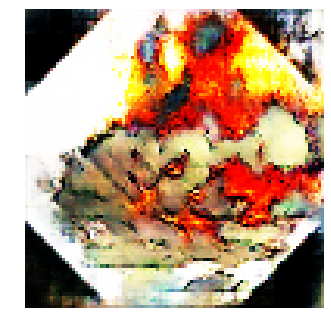


Epoch: 22800, D: -7.307, G: 3.372
Epoch: 22801, D: -4.16, G: 3.484
Epoch: 22802, D: -5.4, G: 2.121
Epoch: 22803, D: -5.187, G: 1.925
Epoch: 22804, D: -5.02, G: 4.042
Epoch: 22805, D: -6.351, G: 4.58
Epoch: 22806, D: -5.021, G: 3.55
Epoch: 22807, D: -6.363, G: 4.121
Epoch: 22808, D: -6.864, G: 4.249
Epoch: 22809, D: -5.659, G: 3.433
Epoch: 22810, D: -7.307, G: 5.369
Epoch: 22811, D: -5.93, G: 3.768
Epoch: 22812, D: -6.223, G: 1.856
Epoch: 22813, D: -6.467, G: 5.193
Epoch: 22814, D: -5.929, G: 0.5935
Epoch: 22815, D: -5.52, G: 2.944
Epoch: 22816, D: -6.034, G: 3.137
Epoch: 22817, D: -4.986, G: 3.596
Epoch: 22818, D: -5.415, G: 3.651
Epoch: 22819, D: -5.336, G: 5.423


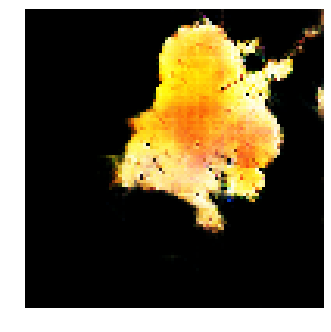


Epoch: 22820, D: -6.212, G: 2.642
Epoch: 22821, D: -5.745, G: 3.583
Epoch: 22822, D: -5.018, G: 5.06
Epoch: 22823, D: -6.048, G: 3.887
Epoch: 22824, D: -5.487, G: 2.544
Epoch: 22825, D: -5.767, G: 3.337
Epoch: 22826, D: -5.729, G: 2.033
Epoch: 22827, D: -5.574, G: 3.894
Epoch: 22828, D: -7.061, G: 5.25
Epoch: 22829, D: -6.804, G: 2.951
Epoch: 22830, D: -5.957, G: 1.968
Epoch: 22831, D: -6.268, G: 5.521
Epoch: 22832, D: -5.644, G: 3.507
Epoch: 22833, D: -5.791, G: 3.678
Epoch: 22834, D: -6.176, G: 4.76
Epoch: 22835, D: -5.759, G: 1.785
Epoch: 22836, D: -6.921, G: 2.488
Epoch: 22837, D: -7.236, G: 1.488
Epoch: 22838, D: -7.326, G: 5.267
Epoch: 22839, D: -6.025, G: 5.966


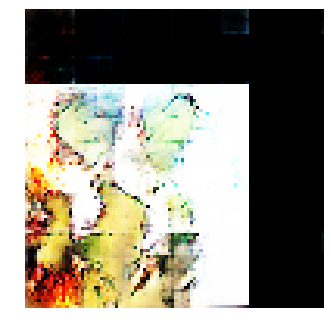


Epoch: 22840, D: -5.772, G: 5.442
Epoch: 22841, D: -5.39, G: 3.684
Epoch: 22842, D: -5.397, G: 4.029
Epoch: 22843, D: -5.529, G: 4.611
Epoch: 22844, D: -5.571, G: 4.377
Epoch: 22845, D: -6.72, G: 2.485
Epoch: 22846, D: -5.228, G: 3.694
Epoch: 22847, D: -5.262, G: 5.236
Epoch: 22848, D: -6.714, G: 6.382
Epoch: 22849, D: -7.244, G: 3.611
Epoch: 22850, D: -5.989, G: 3.788
Epoch: 22851, D: -6.762, G: 5.44
Epoch: 22852, D: -6.534, G: 2.35
Epoch: 22853, D: -6.129, G: 4.55
Epoch: 22854, D: -5.209, G: 3.65
Epoch: 22855, D: -5.827, G: 5.139
Epoch: 22856, D: -5.765, G: 3.291
Epoch: 22857, D: -6.074, G: 5.164
Epoch: 22858, D: -6.174, G: 3.894
Epoch: 22859, D: -6.93, G: 3.296


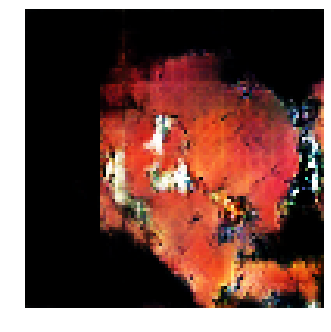


Epoch: 22860, D: -6.213, G: 1.474
Epoch: 22861, D: -6.78, G: 4.565
Epoch: 22862, D: -6.895, G: 3.282
Epoch: 22863, D: -5.405, G: 2.95
Epoch: 22864, D: -4.205, G: 1.903
Epoch: 22865, D: -5.571, G: 2.128
Epoch: 22866, D: -6.023, G: 1.489
Epoch: 22867, D: -5.503, G: 5.105
Epoch: 22868, D: -6.162, G: 4.006
Epoch: 22869, D: -6.566, G: 5.807
Epoch: 22870, D: -6.989, G: 4.319
Epoch: 22871, D: -6.479, G: 3.667
Epoch: 22872, D: -3.892, G: 5.048
Epoch: 22873, D: -5.494, G: 5.503
Epoch: 22874, D: -5.246, G: 2.733
Epoch: 22875, D: -6.574, G: 4.187
Epoch: 22876, D: -7.042, G: 3.171
Epoch: 22877, D: -5.81, G: 3.648
Epoch: 22878, D: -4.974, G: 3.22
Epoch: 22879, D: -5.182, G: 6.204


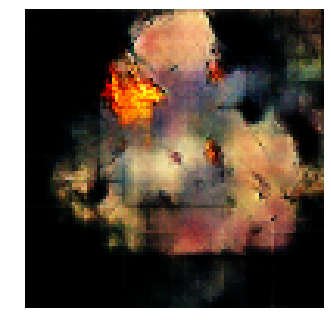


Epoch: 22880, D: -5.259, G: 3.527
Epoch: 22881, D: -6.205, G: 2.769
Epoch: 22882, D: -4.801, G: 2.683
Epoch: 22883, D: -5.502, G: 4.955
Epoch: 22884, D: -5.979, G: 5.144
Epoch: 22885, D: -6.212, G: 3.533
Epoch: 22886, D: -6.863, G: 3.608
Epoch: 22887, D: -6.691, G: 2.382
Epoch: 22888, D: -6.206, G: 2.422
Epoch: 22889, D: -5.969, G: 1.912
Epoch: 22890, D: -5.947, G: 3.36
Epoch: 22891, D: -5.601, G: 4.78
Epoch: 22892, D: -5.092, G: 3.341
Epoch: 22893, D: -6.775, G: 2.458
Epoch: 22894, D: -5.904, G: 2.989
Epoch: 22895, D: -6.003, G: 2.315
Epoch: 22896, D: -4.935, G: 6.28
Epoch: 22897, D: -6.17, G: 4.442
Epoch: 22898, D: -5.271, G: 4.284
Epoch: 22899, D: -5.788, G: 4.187


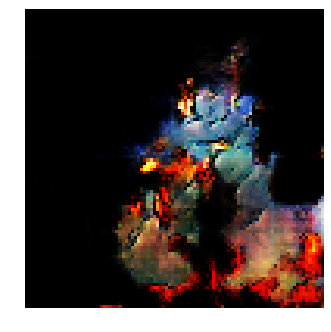


Epoch: 22900, D: -5.265, G: 4.172
Epoch: 22901, D: -4.957, G: 3.1
Epoch: 22902, D: -5.745, G: 3.827
Epoch: 22903, D: -5.633, G: 4.058
Epoch: 22904, D: -6.118, G: 3.351
Epoch: 22905, D: -6.76, G: 1.853
Epoch: 22906, D: -5.528, G: 3.044
Epoch: 22907, D: -5.672, G: 4.388
Epoch: 22908, D: -4.812, G: 2.763
Epoch: 22909, D: -7.504, G: 2.374
Epoch: 22910, D: -5.298, G: 2.551
Epoch: 22911, D: -6.852, G: 2.774
Epoch: 22912, D: -5.68, G: 4.724
Epoch: 22913, D: -6.032, G: 1.946
Epoch: 22914, D: -5.506, G: 1.914
Epoch: 22915, D: -5.284, G: 1.871
Epoch: 22916, D: -6.07, G: 4.236
Epoch: 22917, D: -5.822, G: 4.317
Epoch: 22918, D: -4.876, G: 1.68
Epoch: 22919, D: -5.36, G: 2.959


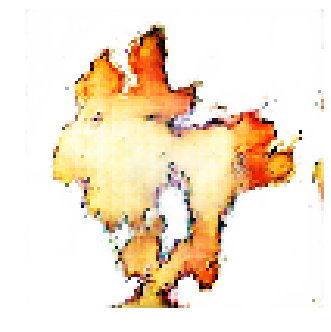


Epoch: 22920, D: -6.024, G: 5.301
Epoch: 22921, D: -8.473, G: 3.994
Epoch: 22922, D: -5.814, G: 3.378
Epoch: 22923, D: -5.823, G: 3.689
Epoch: 22924, D: -3.263, G: 3.515
Epoch: 22925, D: -6.388, G: 2.892
Epoch: 22926, D: -6.14, G: 5.388
Epoch: 22927, D: -4.554, G: 3.576
Epoch: 22928, D: -6.097, G: 5.13
Epoch: 22929, D: -5.681, G: 4.091
Epoch: 22930, D: -6.488, G: 4.486
Epoch: 22931, D: -5.501, G: 4.429
Epoch: 22932, D: -5.46, G: 3.358
Epoch: 22933, D: -5.533, G: 4.626
Epoch: 22934, D: -5.271, G: 3.826
Epoch: 22935, D: -6.492, G: 5.459
Epoch: 22936, D: -6.511, G: 5.949
Epoch: 22937, D: -5.711, G: 3.741
Epoch: 22938, D: -7.055, G: 4.681
Epoch: 22939, D: -5.531, G: 4.212


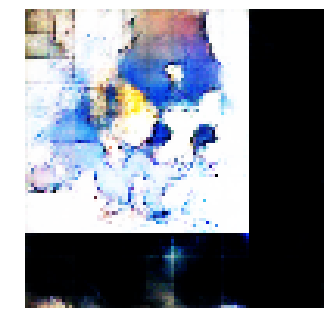


Epoch: 22940, D: -6.41, G: 6.285
Epoch: 22941, D: -4.856, G: 6.303
Epoch: 22942, D: -5.458, G: 5.077
Epoch: 22943, D: -6.039, G: 5.985
Epoch: 22944, D: -6.547, G: 3.482
Epoch: 22945, D: -5.392, G: 2.441
Epoch: 22946, D: -5.922, G: 3.322
Epoch: 22947, D: -6.296, G: 4.242
Epoch: 22948, D: -5.588, G: 3.582
Epoch: 22949, D: -5.835, G: 3.269
Epoch: 22950, D: -5.835, G: 2.988
Epoch: 22951, D: -6.104, G: 5.766
Epoch: 22952, D: -5.72, G: 4.42
Epoch: 22953, D: -6.807, G: 3.271
Epoch: 22954, D: -5.352, G: 3.724
Epoch: 22955, D: -6.341, G: 3.817
Epoch: 22956, D: -5.887, G: 2.499
Epoch: 22957, D: -3.998, G: 1.192
Epoch: 22958, D: -6.826, G: 2.114
Epoch: 22959, D: -5.696, G: 3.713


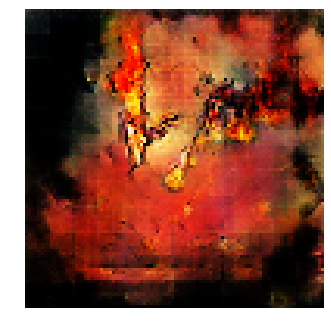


Epoch: 22960, D: -5.45, G: 2.149
Epoch: 22961, D: -8.35, G: 5.001
Epoch: 22962, D: -5.733, G: 3.303
Epoch: 22963, D: -5.114, G: 4.378
Epoch: 22964, D: -5.83, G: 4.203
Epoch: 22965, D: -5.197, G: 4.501
Epoch: 22966, D: -6.892, G: 5.109
Epoch: 22967, D: -6.748, G: 1.402
Epoch: 22968, D: -6.814, G: 1.774
Epoch: 22969, D: -6.823, G: 2.805
Epoch: 22970, D: -6.668, G: 4.041
Epoch: 22971, D: -5.776, G: 5.237
Epoch: 22972, D: -6.334, G: 3.102
Epoch: 22973, D: -7.147, G: 4.626
Epoch: 22974, D: -7.018, G: 2.848
Epoch: 22975, D: -5.277, G: 3.504
Epoch: 22976, D: -5.715, G: 5.079
Epoch: 22977, D: -7.367, G: 3.156
Epoch: 22978, D: -5.82, G: 3.773
Epoch: 22979, D: -5.706, G: 4.898


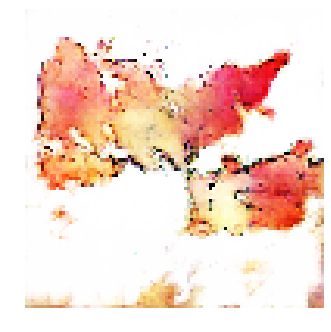


Epoch: 22980, D: -5.891, G: 2.074
Epoch: 22981, D: -5.897, G: 4.038
Epoch: 22982, D: -5.928, G: 4.239
Epoch: 22983, D: -5.0, G: 3.576
Epoch: 22984, D: -6.884, G: 4.676
Epoch: 22985, D: -4.775, G: 1.565
Epoch: 22986, D: -6.881, G: 2.741
Epoch: 22987, D: -5.918, G: 3.709
Epoch: 22988, D: -6.553, G: 2.558
Epoch: 22989, D: -5.356, G: 3.794
Epoch: 22990, D: -5.969, G: 5.304
Epoch: 22991, D: -6.55, G: 4.784
Epoch: 22992, D: -6.092, G: 4.217
Epoch: 22993, D: -6.308, G: 2.532
Epoch: 22994, D: -5.089, G: 4.965
Epoch: 22995, D: -5.846, G: 2.363
Epoch: 22996, D: -5.175, G: 3.57
Epoch: 22997, D: -5.676, G: 4.191
Epoch: 22998, D: -5.996, G: 5.033
Epoch: 22999, D: -7.336, G: 4.54


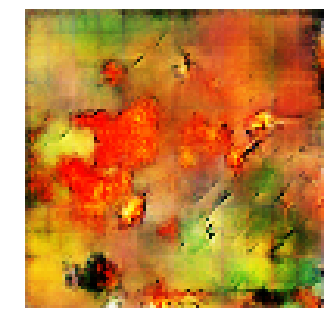


Epoch: 23000, D: -6.837, G: 2.063
Epoch: 23001, D: -5.86, G: 5.235
Epoch: 23002, D: -5.525, G: 3.323
Epoch: 23003, D: -5.352, G: 2.856
Epoch: 23004, D: -5.984, G: 4.968
Epoch: 23005, D: -6.108, G: 4.985
Epoch: 23006, D: -6.523, G: 7.284
Epoch: 23007, D: -6.103, G: 4.182
Epoch: 23008, D: -6.202, G: 4.02
Epoch: 23009, D: -6.045, G: 3.064
Epoch: 23010, D: -6.157, G: 3.228
Epoch: 23011, D: -6.57, G: 4.535
Epoch: 23012, D: -4.408, G: 3.906
Epoch: 23013, D: -6.545, G: 5.603
Epoch: 23014, D: -6.85, G: 5.418
Epoch: 23015, D: -4.884, G: 4.621
Epoch: 23016, D: -5.649, G: 5.621
Epoch: 23017, D: -6.588, G: 3.056
Epoch: 23018, D: -5.428, G: 1.759
Epoch: 23019, D: -5.591, G: 3.61


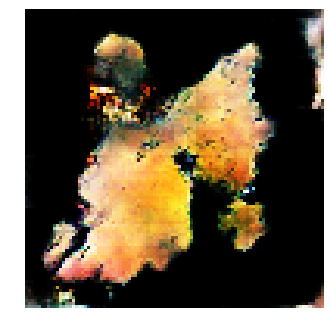


Epoch: 23020, D: -4.919, G: 3.156
Epoch: 23021, D: -5.311, G: 5.517
Epoch: 23022, D: -6.697, G: 2.773
Epoch: 23023, D: -5.494, G: 2.614
Epoch: 23024, D: -5.114, G: 5.242
Epoch: 23025, D: -6.806, G: 2.154
Epoch: 23026, D: -7.363, G: 4.187
Epoch: 23027, D: -6.426, G: 4.494
Epoch: 23028, D: -6.2, G: 3.059
Epoch: 23029, D: -5.386, G: 3.535
Epoch: 23030, D: -5.684, G: 4.14
Epoch: 23031, D: -6.152, G: 3.472
Epoch: 23032, D: -6.605, G: 5.072
Epoch: 23033, D: -6.347, G: 3.878
Epoch: 23034, D: -6.454, G: 2.708
Epoch: 23035, D: -4.498, G: 5.281
Epoch: 23036, D: -6.886, G: 4.592
Epoch: 23037, D: -6.269, G: 4.77
Epoch: 23038, D: -6.542, G: 3.302
Epoch: 23039, D: -6.564, G: 3.195


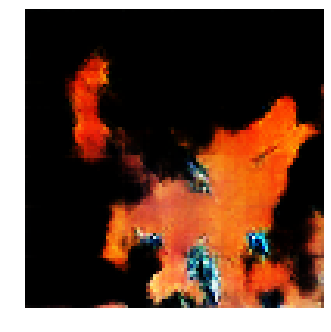


Epoch: 23040, D: -6.093, G: 4.063
Epoch: 23041, D: -5.974, G: 4.136
Epoch: 23042, D: -5.148, G: 3.851
Epoch: 23043, D: -6.534, G: 3.699
Epoch: 23044, D: -5.092, G: 2.582
Epoch: 23045, D: -5.211, G: 2.851
Epoch: 23046, D: -6.689, G: 4.499
Epoch: 23047, D: -5.679, G: 1.558
Epoch: 23048, D: -6.559, G: 2.756
Epoch: 23049, D: -4.68, G: 3.717
Epoch: 23050, D: -7.008, G: 4.097
Epoch: 23051, D: -5.959, G: 3.684
Epoch: 23052, D: -5.018, G: 3.424
Epoch: 23053, D: -6.924, G: 4.107
Epoch: 23054, D: -5.491, G: 5.397
Epoch: 23055, D: -7.301, G: 4.168
Epoch: 23056, D: -2.981, G: 3.728
Epoch: 23057, D: -5.224, G: 3.911
Epoch: 23058, D: -5.579, G: 3.737
Epoch: 23059, D: -5.356, G: 3.007


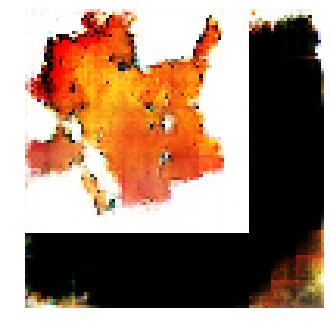


Epoch: 23060, D: -5.464, G: 4.47
Epoch: 23061, D: -5.932, G: 5.144
Epoch: 23062, D: -5.498, G: 3.832
Epoch: 23063, D: -5.479, G: 3.534
Epoch: 23064, D: -6.607, G: 3.869
Epoch: 23065, D: -4.957, G: 3.95
Epoch: 23066, D: -5.721, G: 3.091
Epoch: 23067, D: -4.467, G: 1.739
Epoch: 23068, D: -6.583, G: 2.798
Epoch: 23069, D: -5.176, G: 4.582
Epoch: 23070, D: -7.119, G: 3.464
Epoch: 23071, D: -5.899, G: 4.037
Epoch: 23072, D: -5.101, G: 4.164
Epoch: 23073, D: -7.199, G: 3.2
Epoch: 23074, D: -6.162, G: 3.931
Epoch: 23075, D: -5.174, G: 4.984
Epoch: 23076, D: -6.128, G: 3.908
Epoch: 23077, D: -4.755, G: 3.798
Epoch: 23078, D: -6.104, G: 3.23
Epoch: 23079, D: -6.792, G: 2.703


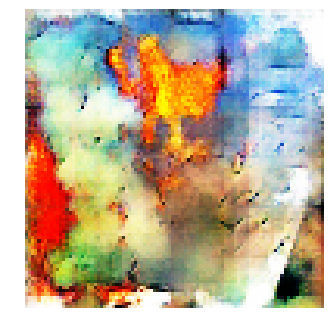


Epoch: 23080, D: -4.426, G: 3.229
Epoch: 23081, D: -5.916, G: 3.896
Epoch: 23082, D: -7.34, G: 1.809
Epoch: 23083, D: -5.666, G: 1.896
Epoch: 23084, D: -6.786, G: 5.669
Epoch: 23085, D: -6.257, G: 5.13
Epoch: 23086, D: -5.706, G: 1.869
Epoch: 23087, D: -2.668, G: 2.206
Epoch: 23088, D: -6.749, G: 3.545
Epoch: 23089, D: -6.416, G: 2.657
Epoch: 23090, D: -6.264, G: 3.581
Epoch: 23091, D: -7.065, G: 3.701
Epoch: 23092, D: -6.085, G: 3.213
Epoch: 23093, D: -4.256, G: 1.26
Epoch: 23094, D: -5.831, G: 3.863
Epoch: 23095, D: -6.55, G: 3.199
Epoch: 23096, D: -7.327, G: 4.711
Epoch: 23097, D: -5.581, G: 3.992
Epoch: 23098, D: -5.618, G: 4.751
Epoch: 23099, D: -6.67, G: 2.96


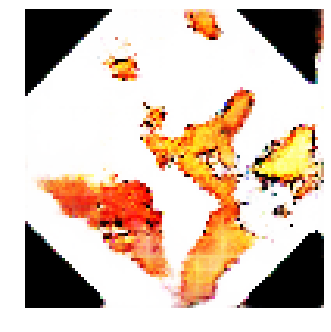


Epoch: 23100, D: -6.644, G: 4.415
Epoch: 23101, D: -7.069, G: 3.285
Epoch: 23102, D: -6.082, G: 2.521
Epoch: 23103, D: -7.174, G: 4.682
Epoch: 23104, D: -5.748, G: 3.623
Epoch: 23105, D: -5.888, G: 3.955
Epoch: 23106, D: -6.849, G: 2.762
Epoch: 23107, D: -5.703, G: 3.391
Epoch: 23108, D: -5.829, G: 3.333
Epoch: 23109, D: -5.721, G: 3.1
Epoch: 23110, D: -5.54, G: 4.32
Epoch: 23111, D: -4.729, G: 4.823
Epoch: 23112, D: -5.67, G: 5.012
Epoch: 23113, D: -6.028, G: 5.662
Epoch: 23114, D: -5.51, G: 3.562
Epoch: 23115, D: -6.768, G: 4.659
Epoch: 23116, D: -5.316, G: 4.657
Epoch: 23117, D: -6.41, G: 3.605
Epoch: 23118, D: -6.098, G: 4.434
Epoch: 23119, D: -5.613, G: 3.764


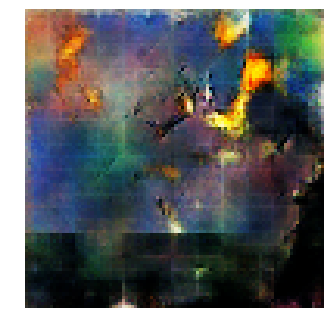


Epoch: 23120, D: -5.861, G: 4.595
Epoch: 23121, D: -5.782, G: 1.471
Epoch: 23122, D: -6.299, G: 5.321
Epoch: 23123, D: -6.192, G: 5.15
Epoch: 23124, D: -6.334, G: 3.402
Epoch: 23125, D: -5.153, G: 6.419
Epoch: 23126, D: -6.569, G: 3.286
Epoch: 23127, D: -5.351, G: 4.154
Epoch: 23128, D: -5.751, G: 3.801
Epoch: 23129, D: -7.381, G: 4.42
Epoch: 23130, D: -6.955, G: 5.693
Epoch: 23131, D: -5.674, G: 3.583
Epoch: 23132, D: -6.28, G: 5.247
Epoch: 23133, D: -5.373, G: 5.059
Epoch: 23134, D: -6.58, G: 4.103
Epoch: 23135, D: -6.259, G: 4.004
Epoch: 23136, D: -5.774, G: 4.045
Epoch: 23137, D: -6.485, G: 3.808
Epoch: 23138, D: -7.061, G: 4.262
Epoch: 23139, D: -6.727, G: 1.425


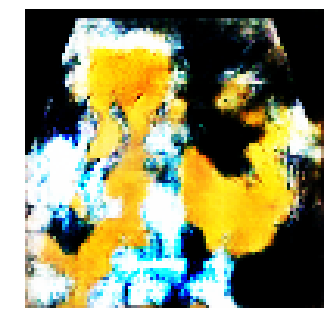


Epoch: 23140, D: -7.279, G: 1.9
Epoch: 23141, D: -6.452, G: 3.043
Epoch: 23142, D: -4.775, G: 4.393
Epoch: 23143, D: -5.621, G: 4.454
Epoch: 23144, D: -6.218, G: 1.504
Epoch: 23145, D: -5.885, G: 5.572
Epoch: 23146, D: -5.933, G: 4.971
Epoch: 23147, D: -6.068, G: 4.102
Epoch: 23148, D: -3.452, G: 3.321
Epoch: 23149, D: -6.363, G: 3.594
Epoch: 23150, D: -5.608, G: 3.629
Epoch: 23151, D: -5.035, G: 4.44
Epoch: 23152, D: -6.091, G: 3.394
Epoch: 23153, D: -8.183, G: 2.768
Epoch: 23154, D: -6.339, G: 3.086
Epoch: 23155, D: -4.979, G: 4.03
Epoch: 23156, D: -6.434, G: 4.186
Epoch: 23157, D: -4.013, G: 3.799
Epoch: 23158, D: -5.922, G: 2.802
Epoch: 23159, D: -5.377, G: 3.647


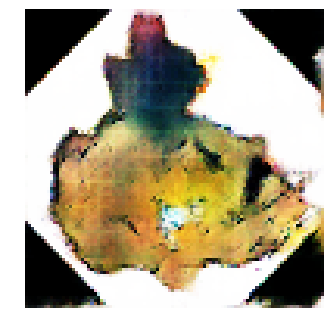


Epoch: 23160, D: -6.639, G: 3.609
Epoch: 23161, D: -5.906, G: 5.122
Epoch: 23162, D: -6.082, G: 2.727
Epoch: 23163, D: -6.688, G: 3.402
Epoch: 23164, D: -5.472, G: 4.875
Epoch: 23165, D: -5.215, G: 3.897
Epoch: 23166, D: -5.193, G: 5.348
Epoch: 23167, D: -6.677, G: 4.177
Epoch: 23168, D: -7.014, G: 2.953
Epoch: 23169, D: -5.617, G: 4.155
Epoch: 23170, D: -6.146, G: 3.22
Epoch: 23171, D: -5.483, G: 6.301
Epoch: 23172, D: -5.782, G: 5.736
Epoch: 23173, D: -6.075, G: 3.866
Epoch: 23174, D: -7.614, G: 3.565
Epoch: 23175, D: -5.418, G: 4.697
Epoch: 23176, D: -5.366, G: 5.111
Epoch: 23177, D: -6.525, G: 6.39
Epoch: 23178, D: -6.337, G: 2.799
Epoch: 23179, D: -5.408, G: 3.168


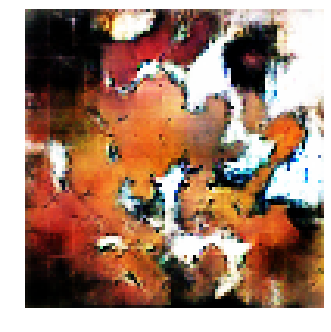


Epoch: 23180, D: -5.789, G: 4.51
Epoch: 23181, D: -6.175, G: 2.982
Epoch: 23182, D: -6.401, G: 1.336
Epoch: 23183, D: -6.434, G: 3.721
Epoch: 23184, D: -6.166, G: 4.16
Epoch: 23185, D: -5.869, G: 5.227
Epoch: 23186, D: -5.15, G: 2.706
Epoch: 23187, D: -5.93, G: 3.32
Epoch: 23188, D: -5.478, G: 4.262
Epoch: 23189, D: -5.276, G: 3.832
Epoch: 23190, D: -4.347, G: 6.174
Epoch: 23191, D: -7.056, G: 2.513
Epoch: 23192, D: -6.824, G: 3.126
Epoch: 23193, D: -6.324, G: 1.089
Epoch: 23194, D: -6.611, G: 4.908
Epoch: 23195, D: -5.422, G: 3.407
Epoch: 23196, D: -5.116, G: 4.208
Epoch: 23197, D: -5.765, G: 4.393
Epoch: 23198, D: -7.07, G: 3.456
Epoch: 23199, D: -5.946, G: 2.029


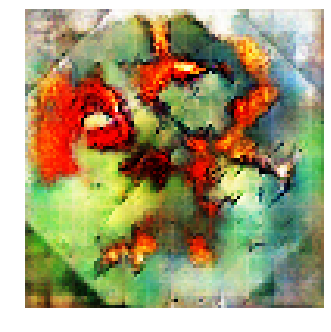


Epoch: 23200, D: -6.295, G: 5.389
Epoch: 23201, D: -6.355, G: 5.329
Epoch: 23202, D: -5.706, G: 4.668
Epoch: 23203, D: -5.105, G: 5.519
Epoch: 23204, D: -7.427, G: 5.09
Epoch: 23205, D: -6.479, G: 5.918
Epoch: 23206, D: -6.317, G: 3.07
Epoch: 23207, D: -5.321, G: 3.197
Epoch: 23208, D: -6.305, G: 6.059
Epoch: 23209, D: -5.413, G: 3.99
Epoch: 23210, D: -5.482, G: 3.87
Epoch: 23211, D: -6.761, G: 3.897
Epoch: 23212, D: -6.11, G: 5.21
Epoch: 23213, D: -5.458, G: 6.162
Epoch: 23214, D: -6.394, G: 4.213
Epoch: 23215, D: -6.851, G: 3.838
Epoch: 23216, D: -6.15, G: 2.872
Epoch: 23217, D: -5.186, G: 3.738
Epoch: 23218, D: -6.525, G: 4.966
Epoch: 23219, D: -5.326, G: 4.216


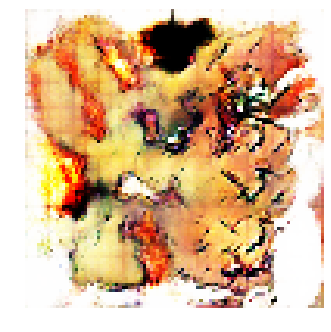


Epoch: 23220, D: -5.963, G: 3.244
Epoch: 23221, D: -6.128, G: 3.044
Epoch: 23222, D: -7.206, G: 2.485
Epoch: 23223, D: -4.733, G: 1.664
Epoch: 23224, D: -5.691, G: 4.362
Epoch: 23225, D: -4.251, G: 2.599
Epoch: 23226, D: -3.399, G: 3.582
Epoch: 23227, D: -6.592, G: 4.245
Epoch: 23228, D: -6.92, G: 2.086
Epoch: 23229, D: -5.333, G: 3.583
Epoch: 23230, D: -5.306, G: 4.518
Epoch: 23231, D: -4.644, G: 2.511
Epoch: 23232, D: -4.93, G: 3.417
Epoch: 23233, D: -4.249, G: 3.029
Epoch: 23234, D: -6.401, G: 5.057
Epoch: 23235, D: -5.387, G: 4.047
Epoch: 23236, D: -6.374, G: 2.744
Epoch: 23237, D: -6.177, G: 3.953
Epoch: 23238, D: -6.399, G: 3.236
Epoch: 23239, D: -4.689, G: 5.039


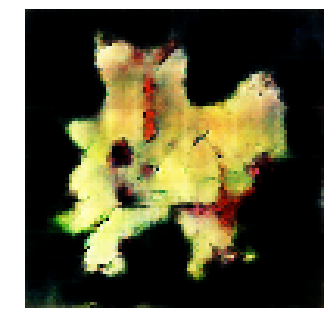


Epoch: 23240, D: -5.411, G: 4.48
Epoch: 23241, D: -5.282, G: 3.759
Epoch: 23242, D: -7.005, G: 2.611
Epoch: 23243, D: -6.187, G: 1.385
Epoch: 23244, D: -5.073, G: 4.454
Epoch: 23245, D: -7.523, G: 3.691
Epoch: 23246, D: -4.943, G: 0.2042
Epoch: 23247, D: -5.524, G: 3.428
Epoch: 23248, D: -5.03, G: 4.791
Epoch: 23249, D: -5.847, G: 3.579
Epoch: 23250, D: -5.522, G: 3.405
Epoch: 23251, D: -7.323, G: 5.83
Epoch: 23252, D: -6.399, G: 3.084
Epoch: 23253, D: -5.147, G: 2.902
Epoch: 23254, D: -6.375, G: 4.797
Epoch: 23255, D: -5.737, G: 3.895
Epoch: 23256, D: -4.773, G: 3.949
Epoch: 23257, D: -6.903, G: 5.41
Epoch: 23258, D: -6.692, G: 3.02
Epoch: 23259, D: -6.202, G: 2.998


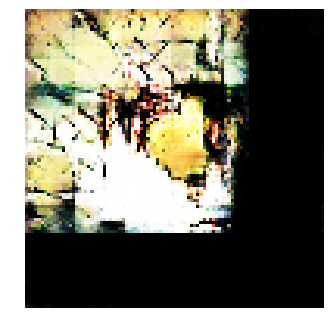


Epoch: 23260, D: -6.642, G: 2.224
Epoch: 23261, D: -5.429, G: 3.436
Epoch: 23262, D: -6.193, G: 3.593
Epoch: 23263, D: -5.861, G: 1.67
Epoch: 23264, D: -3.959, G: 3.312
Epoch: 23265, D: -6.201, G: 2.704
Epoch: 23266, D: -6.07, G: 3.51
Epoch: 23267, D: -6.285, G: 5.098
Epoch: 23268, D: -6.189, G: 3.51
Epoch: 23269, D: -6.647, G: 2.884
Epoch: 23270, D: -5.807, G: 4.345
Epoch: 23271, D: -7.266, G: 1.908
Epoch: 23272, D: -5.949, G: 3.879
Epoch: 23273, D: -5.388, G: 3.293
Epoch: 23274, D: -6.212, G: 5.613
Epoch: 23275, D: -5.084, G: 4.211
Epoch: 23276, D: -5.367, G: 5.166
Epoch: 23277, D: -7.109, G: 5.74
Epoch: 23278, D: -5.712, G: 4.066
Epoch: 23279, D: -6.391, G: 4.41


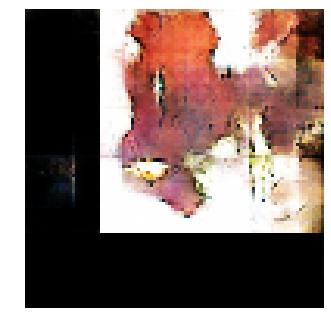


Epoch: 23280, D: -5.885, G: 3.525
Epoch: 23281, D: -5.989, G: 5.089
Epoch: 23282, D: -6.091, G: 3.562
Epoch: 23283, D: -5.057, G: 4.876
Epoch: 23284, D: -6.308, G: 4.537
Epoch: 23285, D: -5.479, G: 4.559
Epoch: 23286, D: -6.667, G: 2.216
Epoch: 23287, D: -7.015, G: 3.733
Epoch: 23288, D: -6.244, G: 4.049
Epoch: 23289, D: -6.888, G: 5.156
Epoch: 23290, D: -7.328, G: 4.849
Epoch: 23291, D: -6.481, G: 5.058
Epoch: 23292, D: -6.321, G: 5.645
Epoch: 23293, D: -6.456, G: 3.481
Epoch: 23294, D: -5.935, G: 3.746
Epoch: 23295, D: -6.253, G: 5.026
Epoch: 23296, D: -5.869, G: 5.368
Epoch: 23297, D: -7.101, G: 3.227
Epoch: 23298, D: -6.758, G: 2.629
Epoch: 23299, D: -5.981, G: 4.684


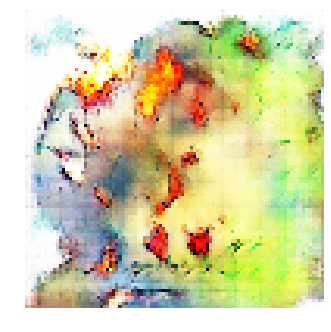


Epoch: 23300, D: -6.622, G: 4.686
Epoch: 23301, D: -6.372, G: 3.508
Epoch: 23302, D: -4.967, G: 4.765
Epoch: 23303, D: -4.9, G: 4.563
Epoch: 23304, D: -6.759, G: 3.849
Epoch: 23305, D: -5.533, G: 2.4
Epoch: 23306, D: -6.088, G: 3.389
Epoch: 23307, D: -4.844, G: 5.016
Epoch: 23308, D: -6.224, G: 1.71
Epoch: 23309, D: -6.887, G: 4.153
Epoch: 23310, D: -7.387, G: 5.533
Epoch: 23311, D: -5.431, G: 1.781
Epoch: 23312, D: -5.808, G: 4.541
Epoch: 23313, D: -6.962, G: 3.058
Epoch: 23314, D: -5.951, G: 4.468
Epoch: 23315, D: -6.283, G: 3.136
Epoch: 23316, D: -5.836, G: 4.473
Epoch: 23317, D: -5.868, G: 3.055
Epoch: 23318, D: -5.756, G: 4.488
Epoch: 23319, D: -5.3, G: 4.414


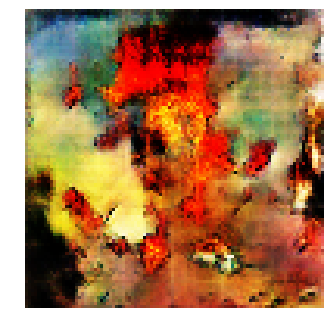


Epoch: 23320, D: -4.767, G: 3.936
Epoch: 23321, D: -4.674, G: 5.906
Epoch: 23322, D: -7.332, G: 5.416
Epoch: 23323, D: -5.005, G: 3.513
Epoch: 23324, D: -4.898, G: 3.963
Epoch: 23325, D: -6.318, G: 2.217
Epoch: 23326, D: -6.092, G: 2.962
Epoch: 23327, D: -6.283, G: 4.121
Epoch: 23328, D: -7.398, G: 3.525
Epoch: 23329, D: -4.928, G: 3.207
Epoch: 23330, D: -5.58, G: 7.039
Epoch: 23331, D: -6.199, G: 4.207
Epoch: 23332, D: -5.521, G: 3.908
Epoch: 23333, D: -5.724, G: 3.025
Epoch: 23334, D: -5.206, G: 2.605
Epoch: 23335, D: -6.506, G: 3.41
Epoch: 23336, D: -6.699, G: 4.767
Epoch: 23337, D: -6.461, G: 1.568
Epoch: 23338, D: -4.979, G: 2.926
Epoch: 23339, D: -5.963, G: 3.615


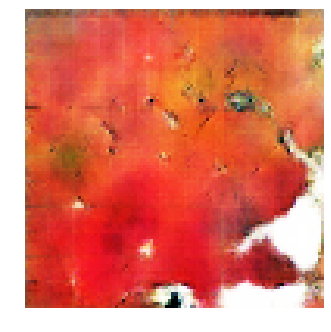


Epoch: 23340, D: -6.048, G: 4.635
Epoch: 23341, D: -5.961, G: 4.425
Epoch: 23342, D: -5.186, G: 3.191
Epoch: 23343, D: -6.053, G: 4.061
Epoch: 23344, D: -5.361, G: 3.175
Epoch: 23345, D: -5.091, G: 2.642
Epoch: 23346, D: -8.033, G: 5.112
Epoch: 23347, D: -5.512, G: 3.573
Epoch: 23348, D: -6.953, G: 4.227
Epoch: 23349, D: -6.475, G: 3.419
Epoch: 23350, D: -6.379, G: 3.418
Epoch: 23351, D: -6.134, G: 3.495
Epoch: 23352, D: -5.846, G: 1.914
Epoch: 23353, D: -4.999, G: 3.922
Epoch: 23354, D: -6.845, G: 5.403
Epoch: 23355, D: -5.768, G: 5.175
Epoch: 23356, D: -5.812, G: 3.376
Epoch: 23357, D: -5.241, G: 4.617
Epoch: 23358, D: -5.03, G: 3.942
Epoch: 23359, D: -5.326, G: 4.21


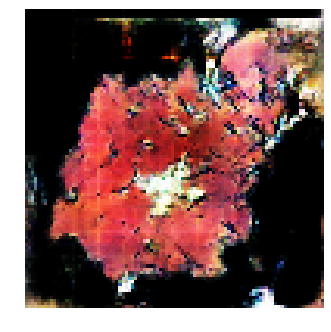


Epoch: 23360, D: -6.73, G: 3.801
Epoch: 23361, D: -6.242, G: 2.826
Epoch: 23362, D: -5.35, G: 3.099
Epoch: 23363, D: -6.413, G: 4.941
Epoch: 23364, D: -4.895, G: 3.921
Epoch: 23365, D: -6.661, G: 4.617
Epoch: 23366, D: -6.183, G: 4.307
Epoch: 23367, D: -5.604, G: 5.71
Epoch: 23368, D: -5.064, G: 5.091
Epoch: 23369, D: -6.749, G: 4.011
Epoch: 23370, D: -4.413, G: 2.496
Epoch: 23371, D: -6.329, G: 3.203
Epoch: 23372, D: -5.727, G: 5.036
Epoch: 23373, D: -5.842, G: 2.82
Epoch: 23374, D: -7.319, G: 3.096
Epoch: 23375, D: -4.191, G: 2.298
Epoch: 23376, D: -5.715, G: 4.848
Epoch: 23377, D: -6.769, G: 3.181
Epoch: 23378, D: -6.165, G: 3.724
Epoch: 23379, D: -6.209, G: 4.624


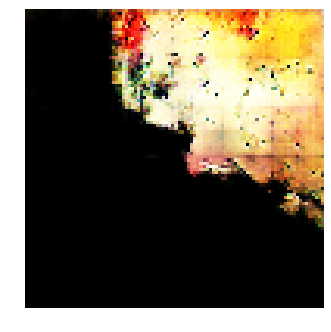


Epoch: 23380, D: -5.915, G: 4.474
Epoch: 23381, D: -7.299, G: 3.381
Epoch: 23382, D: -6.099, G: 2.649
Epoch: 23383, D: -6.343, G: 5.362
Epoch: 23384, D: -6.097, G: 1.981
Epoch: 23385, D: -5.838, G: 5.69
Epoch: 23386, D: -6.556, G: 4.254
Epoch: 23387, D: -6.028, G: 3.607
Epoch: 23388, D: -5.849, G: 3.425
Epoch: 23389, D: -7.003, G: 4.984
Epoch: 23390, D: -6.705, G: 3.955
Epoch: 23391, D: -6.624, G: 3.963
Epoch: 23392, D: -6.039, G: 3.328
Epoch: 23393, D: -5.504, G: 4.907
Epoch: 23394, D: -6.477, G: 4.169
Epoch: 23395, D: -5.966, G: 4.428
Epoch: 23396, D: -6.083, G: 4.797
Epoch: 23397, D: -5.59, G: 3.416
Epoch: 23398, D: -4.756, G: 4.645
Epoch: 23399, D: -6.602, G: 3.308


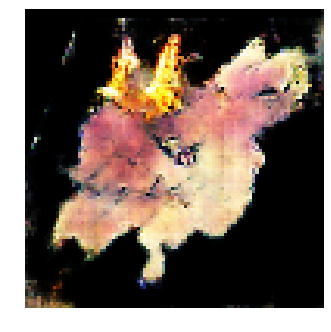


Epoch: 23400, D: -4.726, G: 6.039
Epoch: 23401, D: -5.276, G: 3.703
Epoch: 23402, D: -5.583, G: 4.378
Epoch: 23403, D: -6.69, G: 3.989
Epoch: 23404, D: -4.762, G: 4.131
Epoch: 23405, D: -6.637, G: 3.769
Epoch: 23406, D: -6.743, G: 3.611
Epoch: 23407, D: -6.787, G: 3.194
Epoch: 23408, D: -5.22, G: 1.024
Epoch: 23409, D: -6.358, G: 3.642
Epoch: 23410, D: -3.746, G: 4.405
Epoch: 23411, D: -5.695, G: 3.358
Epoch: 23412, D: -7.321, G: 2.546
Epoch: 23413, D: -7.166, G: 2.909
Epoch: 23414, D: -6.13, G: 4.086
Epoch: 23415, D: -5.406, G: 3.998
Epoch: 23416, D: -6.55, G: 4.95
Epoch: 23417, D: -5.577, G: 5.041
Epoch: 23418, D: -6.719, G: 4.071
Epoch: 23419, D: -4.832, G: 2.836


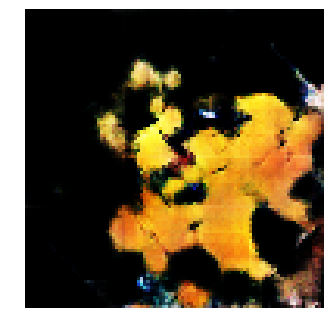


Epoch: 23420, D: -5.632, G: 2.563
Epoch: 23421, D: -6.117, G: 2.952
Epoch: 23422, D: -8.053, G: 3.851
Epoch: 23423, D: -6.504, G: 3.109
Epoch: 23424, D: -7.046, G: 3.692
Epoch: 23425, D: -6.623, G: 5.573
Epoch: 23426, D: -6.359, G: 5.088
Epoch: 23427, D: -5.9, G: 4.272
Epoch: 23428, D: -7.735, G: 4.076
Epoch: 23429, D: -5.097, G: 4.666
Epoch: 23430, D: -7.222, G: 4.432
Epoch: 23431, D: -4.323, G: 4.182
Epoch: 23432, D: -5.515, G: 5.474
Epoch: 23433, D: -6.598, G: 5.174
Epoch: 23434, D: -6.354, G: 4.611
Epoch: 23435, D: -5.295, G: 4.787
Epoch: 23436, D: -5.846, G: 2.399
Epoch: 23437, D: -5.605, G: 3.814
Epoch: 23438, D: -5.305, G: 1.374
Epoch: 23439, D: -5.245, G: 1.837


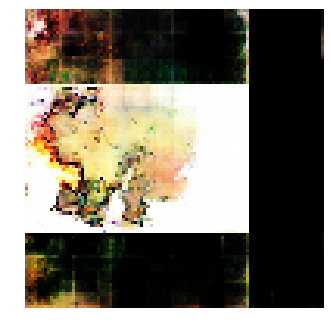


Epoch: 23440, D: -5.522, G: 4.186
Epoch: 23441, D: -6.314, G: 4.25
Epoch: 23442, D: -7.603, G: 3.756
Epoch: 23443, D: -6.798, G: 2.67
Epoch: 23444, D: -6.474, G: 3.59
Epoch: 23445, D: -5.731, G: 3.963
Epoch: 23446, D: -5.983, G: 3.618
Epoch: 23447, D: -7.13, G: 2.247
Epoch: 23448, D: -6.591, G: 3.497
Epoch: 23449, D: -5.629, G: 3.659
Epoch: 23450, D: -5.096, G: 4.989
Epoch: 23451, D: -4.694, G: 5.096
Epoch: 23452, D: -6.3, G: 6.045
Epoch: 23453, D: -6.467, G: 4.35
Epoch: 23454, D: -4.399, G: 4.296
Epoch: 23455, D: -5.266, G: 4.157
Epoch: 23456, D: -5.997, G: 3.298
Epoch: 23457, D: -6.185, G: 3.887
Epoch: 23458, D: -5.898, G: 3.415
Epoch: 23459, D: -5.513, G: 3.956


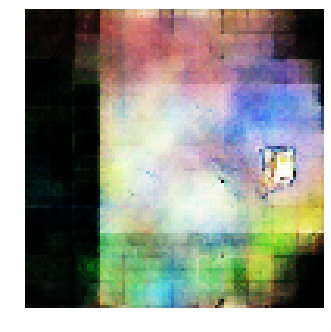


Epoch: 23460, D: -5.796, G: 5.123
Epoch: 23461, D: -7.504, G: 3.106
Epoch: 23462, D: -8.18, G: 3.341
Epoch: 23463, D: -6.018, G: 3.886
Epoch: 23464, D: -5.355, G: 3.344
Epoch: 23465, D: -5.137, G: 5.186
Epoch: 23466, D: -6.191, G: 3.586
Epoch: 23467, D: -6.499, G: 3.402
Epoch: 23468, D: -7.371, G: 2.379
Epoch: 23469, D: -7.058, G: 3.697
Epoch: 23470, D: -4.751, G: 2.583
Epoch: 23471, D: -6.598, G: 3.859
Epoch: 23472, D: -5.586, G: 4.115
Epoch: 23473, D: -6.831, G: 3.213
Epoch: 23474, D: -6.967, G: 3.931
Epoch: 23475, D: -6.809, G: 1.738
Epoch: 23476, D: -7.543, G: 4.215
Epoch: 23477, D: -7.095, G: 3.021
Epoch: 23478, D: -4.978, G: 3.39
Epoch: 23479, D: -6.444, G: 4.363


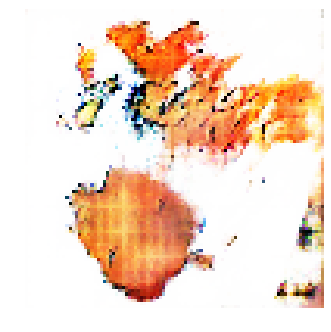


Epoch: 23480, D: -5.343, G: 3.814
Epoch: 23481, D: -5.599, G: 3.367
Epoch: 23482, D: -6.84, G: 4.847
Epoch: 23483, D: -5.309, G: 4.35
Epoch: 23484, D: -4.863, G: 5.285
Epoch: 23485, D: -6.124, G: 2.776
Epoch: 23486, D: -6.259, G: 3.145
Epoch: 23487, D: -7.531, G: 4.319
Epoch: 23488, D: -4.978, G: 3.125
Epoch: 23489, D: -5.671, G: 3.829
Epoch: 23490, D: -6.282, G: 4.804
Epoch: 23491, D: -6.116, G: 2.88
Epoch: 23492, D: -6.137, G: 2.95
Epoch: 23493, D: -5.448, G: 2.478
Epoch: 23494, D: -5.475, G: 3.552
Epoch: 23495, D: -6.716, G: 3.439
Epoch: 23496, D: -5.915, G: 2.409
Epoch: 23497, D: -6.25, G: 3.344
Epoch: 23498, D: -5.172, G: 2.747
Epoch: 23499, D: -6.237, G: 3.745


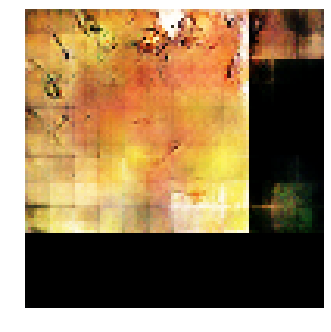


Epoch: 23500, D: -5.355, G: 3.413
Epoch: 23501, D: -5.734, G: 5.212
Epoch: 23502, D: -5.713, G: 3.463
Epoch: 23503, D: -7.15, G: 1.985
Epoch: 23504, D: -6.831, G: 3.742
Epoch: 23505, D: -5.87, G: 3.257
Epoch: 23506, D: -5.724, G: 3.907
Epoch: 23507, D: -6.771, G: 3.839
Epoch: 23508, D: -5.434, G: 4.638
Epoch: 23509, D: -6.796, G: 5.788
Epoch: 23510, D: -5.867, G: 4.264
Epoch: 23511, D: -5.86, G: 6.141
Epoch: 23512, D: -6.028, G: 5.068
Epoch: 23513, D: -6.762, G: 4.792
Epoch: 23514, D: -5.662, G: 7.084
Epoch: 23515, D: -4.763, G: 4.176
Epoch: 23516, D: -7.013, G: 4.659
Epoch: 23517, D: -5.32, G: 1.804
Epoch: 23518, D: -6.379, G: 3.985
Epoch: 23519, D: -5.255, G: 5.911


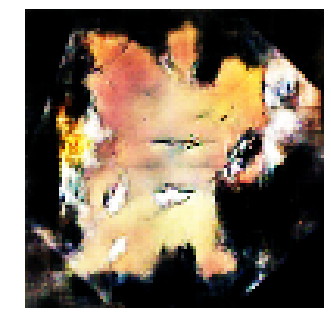


Epoch: 23520, D: -5.896, G: 4.884
Epoch: 23521, D: -6.13, G: 6.016
Epoch: 23522, D: -5.633, G: 6.064
Epoch: 23523, D: -6.785, G: 2.892
Epoch: 23524, D: -5.394, G: 4.653
Epoch: 23525, D: -6.463, G: 6.235
Epoch: 23526, D: -6.279, G: 3.674
Epoch: 23527, D: -6.536, G: 3.026
Epoch: 23528, D: -6.771, G: 4.635
Epoch: 23529, D: -6.011, G: 5.581
Epoch: 23530, D: -6.507, G: 3.705
Epoch: 23531, D: -6.329, G: 3.05
Epoch: 23532, D: -5.45, G: 2.502
Epoch: 23533, D: -5.785, G: 4.468
Epoch: 23534, D: -6.867, G: 3.928
Epoch: 23535, D: -6.273, G: 5.492
Epoch: 23536, D: -6.439, G: 3.518
Epoch: 23537, D: -5.219, G: 3.622
Epoch: 23538, D: -4.938, G: 3.356
Epoch: 23539, D: -7.358, G: 1.749


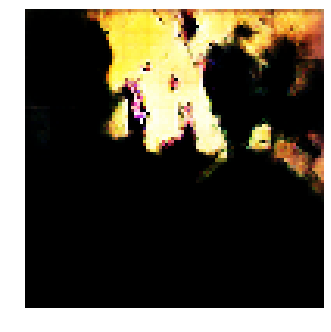


Epoch: 23540, D: -6.14, G: 4.99
Epoch: 23541, D: -5.795, G: 3.899
Epoch: 23542, D: -6.24, G: 4.182
Epoch: 23543, D: -6.511, G: 2.647
Epoch: 23544, D: -5.34, G: 5.737
Epoch: 23545, D: -6.311, G: 4.99
Epoch: 23546, D: -6.372, G: 4.788
Epoch: 23547, D: -6.992, G: 2.686
Epoch: 23548, D: -5.853, G: 3.484
Epoch: 23549, D: -7.175, G: 3.427
Epoch: 23550, D: -7.008, G: 4.516
Epoch: 23551, D: -5.743, G: 3.896
Epoch: 23552, D: -6.996, G: 4.086
Epoch: 23553, D: -5.962, G: 4.309
Epoch: 23554, D: -5.607, G: 3.091
Epoch: 23555, D: -5.166, G: 2.538
Epoch: 23556, D: -7.01, G: 4.184
Epoch: 23557, D: -6.893, G: 5.52
Epoch: 23558, D: -5.124, G: 3.158
Epoch: 23559, D: -5.021, G: 4.53


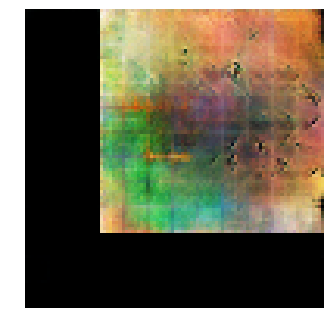


Epoch: 23560, D: -5.486, G: 3.566
Epoch: 23561, D: -6.869, G: 2.107
Epoch: 23562, D: -7.39, G: 4.086
Epoch: 23563, D: -6.601, G: 3.656
Epoch: 23564, D: -6.234, G: 3.468
Epoch: 23565, D: -7.79, G: 4.628
Epoch: 23566, D: -7.623, G: 2.337
Epoch: 23567, D: -4.623, G: 2.443
Epoch: 23568, D: -5.359, G: 4.791
Epoch: 23569, D: -7.003, G: 4.701
Epoch: 23570, D: -6.169, G: 5.182
Epoch: 23571, D: -5.112, G: 4.459
Epoch: 23572, D: -5.291, G: 4.622
Epoch: 23573, D: -5.612, G: 7.499
Epoch: 23574, D: -5.86, G: 4.403
Epoch: 23575, D: -4.951, G: 2.289
Epoch: 23576, D: -6.225, G: 5.445
Epoch: 23577, D: -6.42, G: 2.319
Epoch: 23578, D: -6.073, G: 4.967
Epoch: 23579, D: -6.4, G: 4.221


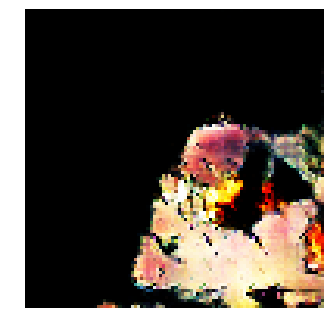


Epoch: 23580, D: -6.742, G: 5.157
Epoch: 23581, D: -5.765, G: 3.627
Epoch: 23582, D: -5.574, G: 3.851
Epoch: 23583, D: -6.037, G: 2.867
Epoch: 23584, D: -6.97, G: 4.034
Epoch: 23585, D: -7.526, G: 1.456
Epoch: 23586, D: -7.191, G: 3.268
Epoch: 23587, D: -6.066, G: 6.217
Epoch: 23588, D: -6.009, G: 4.25
Epoch: 23589, D: -5.173, G: 3.746
Epoch: 23590, D: -6.243, G: 3.481
Epoch: 23591, D: -6.096, G: 1.188
Epoch: 23592, D: -6.14, G: 5.016
Epoch: 23593, D: -6.735, G: 4.382
Epoch: 23594, D: -5.688, G: 4.589
Epoch: 23595, D: -6.031, G: 6.016
Epoch: 23596, D: -5.71, G: 4.125
Epoch: 23597, D: -5.979, G: 4.211
Epoch: 23598, D: -5.084, G: 3.801
Epoch: 23599, D: -6.627, G: 4.57


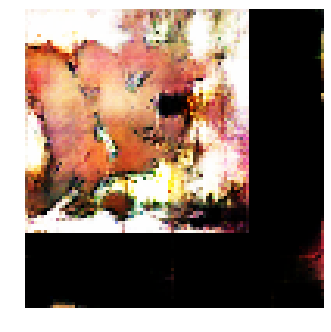


Epoch: 23600, D: -5.816, G: 3.446
Epoch: 23601, D: -5.578, G: 3.442
Epoch: 23602, D: -7.122, G: 4.012
Epoch: 23603, D: -6.931, G: 4.84
Epoch: 23604, D: -5.601, G: 3.479
Epoch: 23605, D: -4.054, G: 2.719
Epoch: 23606, D: -5.965, G: 4.64
Epoch: 23607, D: -6.262, G: 4.692
Epoch: 23608, D: -5.179, G: 2.832
Epoch: 23609, D: -6.267, G: 5.426
Epoch: 23610, D: -5.335, G: 4.301
Epoch: 23611, D: -7.054, G: 3.447
Epoch: 23612, D: -6.725, G: 5.616
Epoch: 23613, D: -5.688, G: 4.908
Epoch: 23614, D: -5.664, G: 1.937
Epoch: 23615, D: -5.847, G: 2.123
Epoch: 23616, D: -5.439, G: 3.943
Epoch: 23617, D: -6.57, G: 3.706
Epoch: 23618, D: -7.933, G: 3.735
Epoch: 23619, D: -7.076, G: 4.943


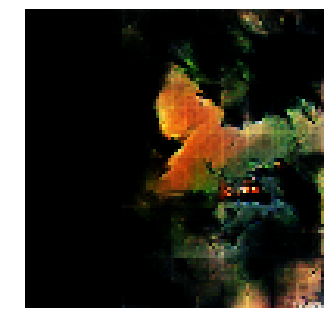


Epoch: 23620, D: -5.795, G: 3.558
Epoch: 23621, D: -7.25, G: 5.843
Epoch: 23622, D: -5.92, G: 2.497
Epoch: 23623, D: -5.486, G: 3.864
Epoch: 23624, D: -6.739, G: 2.851
Epoch: 23625, D: -5.798, G: 2.114
Epoch: 23626, D: -4.782, G: 3.333
Epoch: 23627, D: -5.195, G: 4.064
Epoch: 23628, D: -5.219, G: 3.683
Epoch: 23629, D: -6.084, G: 3.622
Epoch: 23630, D: -5.484, G: 3.184
Epoch: 23631, D: -5.558, G: 3.307
Epoch: 23632, D: -4.356, G: 3.594
Epoch: 23633, D: -7.01, G: 4.839
Epoch: 23634, D: -6.033, G: 2.381
Epoch: 23635, D: -5.693, G: 3.22
Epoch: 23636, D: -6.173, G: 3.927
Epoch: 23637, D: -5.47, G: 4.986
Epoch: 23638, D: -5.885, G: 2.871
Epoch: 23639, D: -4.797, G: 4.481


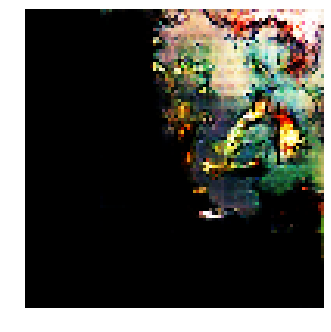


Epoch: 23640, D: -5.821, G: 3.925
Epoch: 23641, D: -6.287, G: 2.24
Epoch: 23642, D: -5.853, G: 2.393
Epoch: 23643, D: -5.275, G: 3.302
Epoch: 23644, D: -7.206, G: 5.694
Epoch: 23645, D: -6.712, G: 5.46
Epoch: 23646, D: -5.342, G: 3.941
Epoch: 23647, D: -6.038, G: 4.235
Epoch: 23648, D: -6.683, G: 4.288
Epoch: 23649, D: -5.154, G: 3.024
Epoch: 23650, D: -7.092, G: 4.532
Epoch: 23651, D: -4.827, G: 2.8
Epoch: 23652, D: -5.871, G: 4.191
Epoch: 23653, D: -6.585, G: 3.603
Epoch: 23654, D: -5.645, G: 3.569
Epoch: 23655, D: -6.755, G: 5.026
Epoch: 23656, D: -6.146, G: 2.918
Epoch: 23657, D: -7.132, G: 3.893
Epoch: 23658, D: -4.981, G: 2.093
Epoch: 23659, D: -6.339, G: 4.902


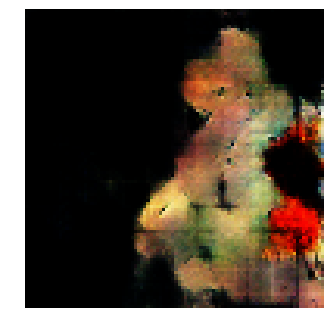


Epoch: 23660, D: -6.629, G: 3.116
Epoch: 23661, D: -7.481, G: 5.417
Epoch: 23662, D: -5.102, G: 4.235
Epoch: 23663, D: -5.644, G: 2.834
Epoch: 23664, D: -6.193, G: 3.963
Epoch: 23665, D: -5.233, G: 3.572
Epoch: 23666, D: -5.341, G: 4.68
Epoch: 23667, D: -6.43, G: 3.327
Epoch: 23668, D: -5.792, G: 2.483
Epoch: 23669, D: -6.505, G: 4.322
Epoch: 23670, D: -6.034, G: 4.509
Epoch: 23671, D: -6.547, G: 4.738
Epoch: 23672, D: -5.424, G: 3.877
Epoch: 23673, D: -5.699, G: 2.415
Epoch: 23674, D: -5.442, G: 4.837
Epoch: 23675, D: -5.402, G: 3.978
Epoch: 23676, D: -6.125, G: 5.4
Epoch: 23677, D: -5.58, G: 3.193
Epoch: 23678, D: -5.618, G: 2.392
Epoch: 23679, D: -6.312, G: 2.093


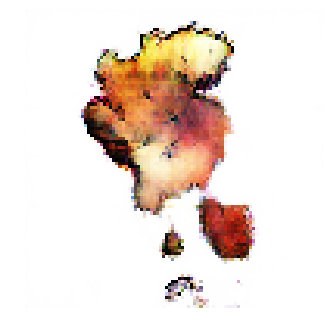


Epoch: 23680, D: -6.103, G: 4.284
Epoch: 23681, D: -6.51, G: 4.219
Epoch: 23682, D: -5.031, G: 4.881
Epoch: 23683, D: -5.523, G: 5.653
Epoch: 23684, D: -6.721, G: 3.488
Epoch: 23685, D: -6.171, G: 3.775
Epoch: 23686, D: -5.158, G: 5.646
Epoch: 23687, D: -5.942, G: 4.727
Epoch: 23688, D: -6.883, G: 5.998
Epoch: 23689, D: -5.586, G: 4.246
Epoch: 23690, D: -5.823, G: 3.142
Epoch: 23691, D: -5.76, G: 5.925
Epoch: 23692, D: -6.809, G: 4.902
Epoch: 23693, D: -5.016, G: 4.204
Epoch: 23694, D: -6.255, G: 5.356
Epoch: 23695, D: -6.475, G: 3.233
Epoch: 23696, D: -6.523, G: 4.454
Epoch: 23697, D: -5.166, G: 5.061
Epoch: 23698, D: -6.173, G: 4.836
Epoch: 23699, D: -5.006, G: 4.356


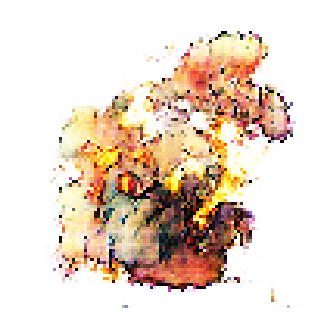


Epoch: 23700, D: -5.915, G: 4.211
Epoch: 23701, D: -5.888, G: 4.041
Epoch: 23702, D: -5.715, G: 2.14
Epoch: 23703, D: -5.249, G: 4.625
Epoch: 23704, D: -4.821, G: 4.669
Epoch: 23705, D: -5.272, G: 6.666
Epoch: 23706, D: -5.974, G: 5.832
Epoch: 23707, D: -6.465, G: 3.207
Epoch: 23708, D: -5.948, G: 4.041
Epoch: 23709, D: -5.253, G: 4.27
Epoch: 23710, D: -6.122, G: 2.864
Epoch: 23711, D: -5.526, G: 2.808
Epoch: 23712, D: -6.303, G: 3.056
Epoch: 23713, D: -6.001, G: 1.185
Epoch: 23714, D: -6.432, G: 4.131
Epoch: 23715, D: -6.448, G: 3.76
Epoch: 23716, D: -5.98, G: 2.72
Epoch: 23717, D: -5.34, G: 3.621
Epoch: 23718, D: -6.009, G: 3.0
Epoch: 23719, D: -4.923, G: 3.858


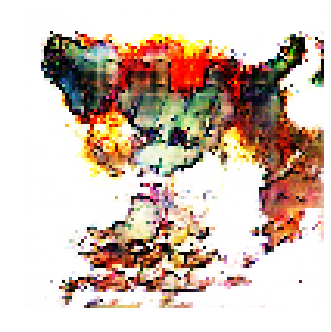


Epoch: 23720, D: -5.191, G: 3.215
Epoch: 23721, D: -6.295, G: 4.176
Epoch: 23722, D: -6.163, G: 3.051
Epoch: 23723, D: -5.124, G: 3.865
Epoch: 23724, D: -5.982, G: 2.232
Epoch: 23725, D: -5.312, G: 4.725
Epoch: 23726, D: -5.219, G: 5.104
Epoch: 23727, D: -5.555, G: 4.02
Epoch: 23728, D: -5.414, G: 3.825
Epoch: 23729, D: -6.804, G: 3.058
Epoch: 23730, D: -5.742, G: 3.715
Epoch: 23731, D: -5.494, G: 4.244
Epoch: 23732, D: -7.559, G: 3.981
Epoch: 23733, D: -6.791, G: 4.012
Epoch: 23734, D: -5.831, G: 4.384
Epoch: 23735, D: -6.627, G: 4.316
Epoch: 23736, D: -6.453, G: 3.88
Epoch: 23737, D: -6.225, G: 4.602
Epoch: 23738, D: -5.043, G: 2.9
Epoch: 23739, D: -5.584, G: 2.968


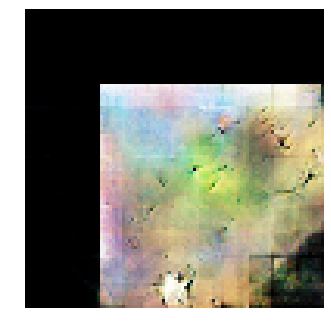


Epoch: 23740, D: -6.597, G: 4.915
Epoch: 23741, D: -6.443, G: 3.017
Epoch: 23742, D: -6.121, G: 3.327
Epoch: 23743, D: -6.183, G: 2.915
Epoch: 23744, D: -5.755, G: 2.671
Epoch: 23745, D: -5.121, G: 6.704
Epoch: 23746, D: -6.318, G: 3.39
Epoch: 23747, D: -6.128, G: 3.973
Epoch: 23748, D: -6.283, G: 3.408
Epoch: 23749, D: -6.263, G: 2.337
Epoch: 23750, D: -4.425, G: 3.293
Epoch: 23751, D: -5.92, G: 2.998
Epoch: 23752, D: -5.582, G: 3.629
Epoch: 23753, D: -5.696, G: 0.4042
Epoch: 23754, D: -6.105, G: 3.016
Epoch: 23755, D: -5.235, G: 3.169
Epoch: 23756, D: -6.82, G: 4.974
Epoch: 23757, D: -5.277, G: 3.931
Epoch: 23758, D: -5.215, G: 2.714
Epoch: 23759, D: -5.476, G: 4.006


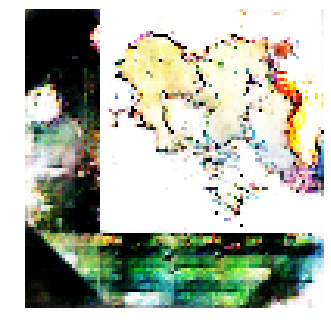


Epoch: 23760, D: -4.993, G: 2.864
Epoch: 23761, D: -6.14, G: 3.185
Epoch: 23762, D: -5.695, G: 3.454
Epoch: 23763, D: -6.028, G: 7.074
Epoch: 23764, D: -6.79, G: 3.822
Epoch: 23765, D: -6.317, G: 2.883
Epoch: 23766, D: -6.717, G: 1.972
Epoch: 23767, D: -6.586, G: 3.135
Epoch: 23768, D: -5.364, G: 3.772
Epoch: 23769, D: -7.702, G: 3.347
Epoch: 23770, D: -7.419, G: 1.996
Epoch: 23771, D: -6.419, G: 2.278
Epoch: 23772, D: -6.445, G: 4.393
Epoch: 23773, D: -6.44, G: 5.172
Epoch: 23774, D: -6.183, G: 3.833
Epoch: 23775, D: -6.327, G: 4.116
Epoch: 23776, D: -6.197, G: 3.552
Epoch: 23777, D: -5.258, G: 3.859
Epoch: 23778, D: -5.647, G: 5.728
Epoch: 23779, D: -4.98, G: 3.186


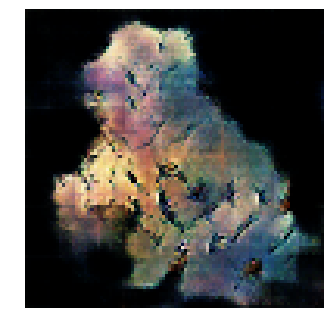


Epoch: 23780, D: -6.714, G: 4.294
Epoch: 23781, D: -6.829, G: 4.556
Epoch: 23782, D: -6.063, G: 0.5009
Epoch: 23783, D: -6.115, G: 2.619
Epoch: 23784, D: -5.291, G: 4.76
Epoch: 23785, D: -4.87, G: 5.009
Epoch: 23786, D: -6.315, G: 4.485
Epoch: 23787, D: -5.707, G: 5.109
Epoch: 23788, D: -5.981, G: 2.784
Epoch: 23789, D: -6.565, G: 2.925
Epoch: 23790, D: -6.135, G: 3.429
Epoch: 23791, D: -6.07, G: 4.01
Epoch: 23792, D: -6.444, G: 2.798
Epoch: 23793, D: -7.928, G: 4.099
Epoch: 23794, D: -5.391, G: 3.671
Epoch: 23795, D: -6.498, G: 3.595
Epoch: 23796, D: -5.543, G: 5.808
Epoch: 23797, D: -5.641, G: 4.283
Epoch: 23798, D: -5.353, G: 5.254
Epoch: 23799, D: -6.745, G: 3.814


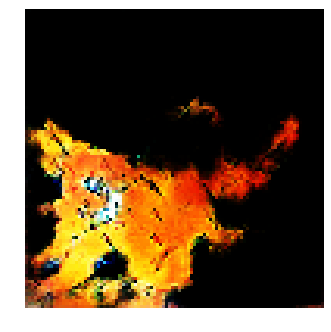


Epoch: 23800, D: -5.466, G: 3.677
Epoch: 23801, D: -5.606, G: 5.412
Epoch: 23802, D: -7.88, G: 6.777
Epoch: 23803, D: -5.029, G: 4.161
Epoch: 23804, D: -5.64, G: 6.563
Epoch: 23805, D: -4.925, G: 4.288
Epoch: 23806, D: -5.069, G: 2.616
Epoch: 23807, D: -6.814, G: 2.292
Epoch: 23808, D: -5.514, G: 1.785
Epoch: 23809, D: -5.28, G: 5.82
Epoch: 23810, D: -5.319, G: 5.626
Epoch: 23811, D: -6.022, G: 4.094
Epoch: 23812, D: -4.369, G: 3.66
Epoch: 23813, D: -6.766, G: 3.487
Epoch: 23814, D: -4.77, G: 3.744
Epoch: 23815, D: -8.303, G: 3.762
Epoch: 23816, D: -5.149, G: 1.077
Epoch: 23817, D: -4.717, G: 3.163
Epoch: 23818, D: -5.641, G: 4.866
Epoch: 23819, D: -5.876, G: 4.006


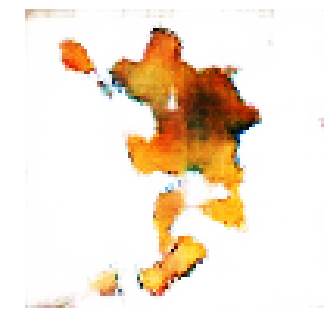


Epoch: 23820, D: -4.844, G: 3.922
Epoch: 23821, D: -6.272, G: 5.208
Epoch: 23822, D: -6.416, G: 3.689
Epoch: 23823, D: -5.437, G: 3.273
Epoch: 23824, D: -5.31, G: 4.369
Epoch: 23825, D: -7.136, G: 3.601
Epoch: 23826, D: -5.401, G: 3.303
Epoch: 23827, D: -5.612, G: 3.064
Epoch: 23828, D: -6.284, G: 3.794
Epoch: 23829, D: -6.315, G: 4.493
Epoch: 23830, D: -6.264, G: 4.343
Epoch: 23831, D: -6.49, G: 3.098
Epoch: 23832, D: -6.5, G: 5.739
Epoch: 23833, D: -5.149, G: 5.438
Epoch: 23834, D: -5.99, G: 5.36
Epoch: 23835, D: -5.542, G: 4.011
Epoch: 23836, D: -5.66, G: 3.506
Epoch: 23837, D: -6.487, G: 2.82
Epoch: 23838, D: -5.72, G: 1.215
Epoch: 23839, D: -6.753, G: 4.682


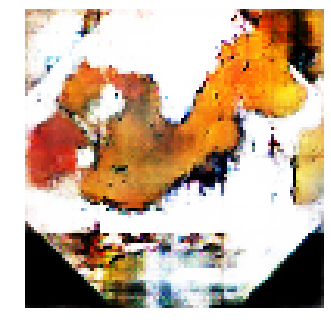


Epoch: 23840, D: -6.647, G: 3.04
Epoch: 23841, D: -5.91, G: 3.707
Epoch: 23842, D: -4.902, G: 3.03
Epoch: 23843, D: -5.031, G: 3.575
Epoch: 23844, D: -7.006, G: 4.921
Epoch: 23845, D: -6.203, G: 5.55
Epoch: 23846, D: -5.442, G: 3.725
Epoch: 23847, D: -6.03, G: 4.856
Epoch: 23848, D: -6.145, G: 2.556
Epoch: 23849, D: -6.237, G: 2.875
Epoch: 23850, D: -5.802, G: 3.97
Epoch: 23851, D: -6.157, G: 3.236
Epoch: 23852, D: -6.511, G: 5.324
Epoch: 23853, D: -7.09, G: 4.013
Epoch: 23854, D: -7.063, G: 3.98
Epoch: 23855, D: -5.251, G: 4.746
Epoch: 23856, D: -5.438, G: 4.927
Epoch: 23857, D: -7.43, G: 4.183
Epoch: 23858, D: -5.817, G: 6.003
Epoch: 23859, D: -6.41, G: 4.554


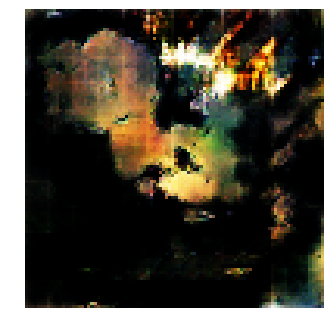


Epoch: 23860, D: -5.851, G: 3.098
Epoch: 23861, D: -7.16, G: 3.96
Epoch: 23862, D: -6.512, G: 7.083
Epoch: 23863, D: -5.97, G: 3.688
Epoch: 23864, D: -5.776, G: 3.703
Epoch: 23865, D: -6.076, G: 5.006
Epoch: 23866, D: -6.681, G: 3.764
Epoch: 23867, D: -6.646, G: 1.199
Epoch: 23868, D: -5.393, G: 4.513
Epoch: 23869, D: -7.229, G: 3.953
Epoch: 23870, D: -5.374, G: 1.652
Epoch: 23871, D: -6.545, G: 2.929
Epoch: 23872, D: -5.861, G: 2.638
Epoch: 23873, D: -6.589, G: 3.279
Epoch: 23874, D: -5.744, G: 4.675
Epoch: 23875, D: -5.759, G: 3.445
Epoch: 23876, D: -5.117, G: 3.793
Epoch: 23877, D: -7.067, G: 3.108
Epoch: 23878, D: -5.497, G: 3.827
Epoch: 23879, D: -5.359, G: 1.222


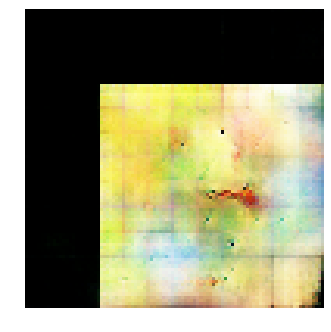


Epoch: 23880, D: -7.663, G: 4.899
Epoch: 23881, D: -5.465, G: 4.237
Epoch: 23882, D: -5.916, G: 6.214
Epoch: 23883, D: -5.8, G: 4.398
Epoch: 23884, D: -5.589, G: 2.142
Epoch: 23885, D: -6.319, G: 2.843
Epoch: 23886, D: -6.399, G: 2.108
Epoch: 23887, D: -4.059, G: 3.81
Epoch: 23888, D: -6.791, G: 6.186
Epoch: 23889, D: -5.578, G: 1.416
Epoch: 23890, D: -5.347, G: 3.466
Epoch: 23891, D: -6.824, G: 3.761
Epoch: 23892, D: -7.63, G: 5.367
Epoch: 23893, D: -6.667, G: 2.887
Epoch: 23894, D: -6.519, G: 3.074
Epoch: 23895, D: -6.043, G: 2.791
Epoch: 23896, D: -7.053, G: 4.383
Epoch: 23897, D: -5.465, G: 3.681
Epoch: 23898, D: -5.802, G: 3.957
Epoch: 23899, D: -6.586, G: 3.278


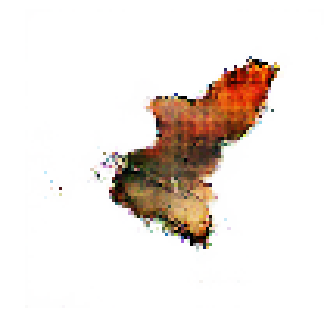


Epoch: 23900, D: -5.175, G: 3.578
Epoch: 23901, D: -6.104, G: 4.55
Epoch: 23902, D: -5.308, G: 5.392
Epoch: 23903, D: -5.549, G: 3.567
Epoch: 23904, D: -6.0, G: 4.556
Epoch: 23905, D: -5.539, G: 3.242
Epoch: 23906, D: -6.032, G: 5.547
Epoch: 23907, D: -7.721, G: 3.51
Epoch: 23908, D: -6.318, G: 2.494
Epoch: 23909, D: -5.721, G: 4.011
Epoch: 23910, D: -7.624, G: 4.711
Epoch: 23911, D: -6.547, G: 2.02
Epoch: 23912, D: -5.768, G: 4.477
Epoch: 23913, D: -6.121, G: 5.449
Epoch: 23914, D: -4.92, G: 4.818
Epoch: 23915, D: -6.242, G: 1.818
Epoch: 23916, D: -4.85, G: 1.731
Epoch: 23917, D: -5.539, G: 4.004
Epoch: 23918, D: -5.835, G: 2.632
Epoch: 23919, D: -5.178, G: 2.745


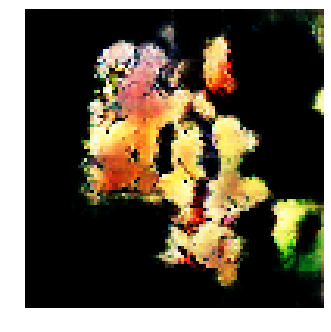


Epoch: 23920, D: -6.762, G: 2.619
Epoch: 23921, D: -6.062, G: 3.705
Epoch: 23922, D: -4.886, G: 1.57
Epoch: 23923, D: -5.403, G: 3.524
Epoch: 23924, D: -6.468, G: 4.949
Epoch: 23925, D: -4.79, G: 2.446
Epoch: 23926, D: -5.722, G: 0.8815
Epoch: 23927, D: -6.108, G: 2.172
Epoch: 23928, D: -6.411, G: 3.307
Epoch: 23929, D: -6.55, G: 4.213
Epoch: 23930, D: -6.99, G: 2.892
Epoch: 23931, D: -5.807, G: 3.368
Epoch: 23932, D: -6.007, G: 4.608
Epoch: 23933, D: -5.443, G: 3.61
Epoch: 23934, D: -5.792, G: 4.474
Epoch: 23935, D: -6.484, G: 5.46
Epoch: 23936, D: -7.158, G: 4.412
Epoch: 23937, D: -5.526, G: 5.697
Epoch: 23938, D: -5.894, G: 5.201
Epoch: 23939, D: -5.732, G: 3.617


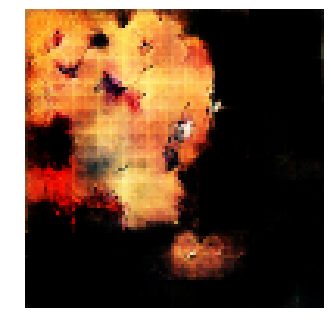


Epoch: 23940, D: -5.121, G: 4.286
Epoch: 23941, D: -6.493, G: 5.056
Epoch: 23942, D: -6.883, G: 3.348
Epoch: 23943, D: -5.809, G: 3.865
Epoch: 23944, D: -6.664, G: 2.761
Epoch: 23945, D: -5.282, G: 3.771
Epoch: 23946, D: -6.52, G: 3.589
Epoch: 23947, D: -5.531, G: 3.515
Epoch: 23948, D: -6.861, G: 3.101
Epoch: 23949, D: -6.085, G: 1.702
Epoch: 23950, D: -7.401, G: 4.113
Epoch: 23951, D: -4.722, G: 2.971
Epoch: 23952, D: -6.425, G: 4.534
Epoch: 23953, D: -5.918, G: 4.153
Epoch: 23954, D: -6.231, G: 6.202
Epoch: 23955, D: -6.525, G: 4.674
Epoch: 23956, D: -5.797, G: 1.997
Epoch: 23957, D: -5.833, G: 5.185
Epoch: 23958, D: -6.587, G: 5.095
Epoch: 23959, D: -4.316, G: 3.021


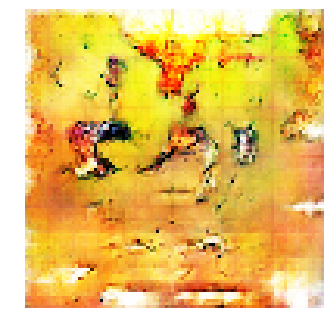


Epoch: 23960, D: -5.386, G: 4.875
Epoch: 23961, D: -6.901, G: 5.273
Epoch: 23962, D: -5.104, G: 4.308
Epoch: 23963, D: -7.898, G: 2.377
Epoch: 23964, D: -6.74, G: 4.341
Epoch: 23965, D: -5.649, G: 3.742
Epoch: 23966, D: -5.711, G: 3.078
Epoch: 23967, D: -6.393, G: 3.807
Epoch: 23968, D: -6.574, G: 4.616
Epoch: 23969, D: -5.135, G: 2.668
Epoch: 23970, D: -5.269, G: 3.272
Epoch: 23971, D: -6.169, G: 3.99
Epoch: 23972, D: -5.912, G: 1.63
Epoch: 23973, D: -6.082, G: 3.069
Epoch: 23974, D: -6.075, G: 4.93
Epoch: 23975, D: -4.739, G: 5.287
Epoch: 23976, D: -6.683, G: 4.726
Epoch: 23977, D: -4.737, G: 4.383
Epoch: 23978, D: -6.332, G: 3.964
Epoch: 23979, D: -5.45, G: 2.153


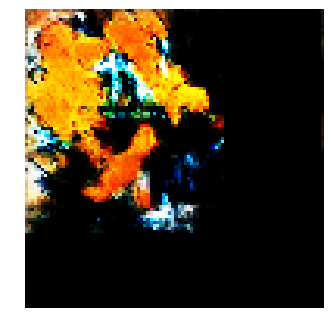


Epoch: 23980, D: -7.28, G: 4.816
Epoch: 23981, D: -6.707, G: 4.889
Epoch: 23982, D: -5.681, G: 3.509
Epoch: 23983, D: -5.896, G: 6.037
Epoch: 23984, D: -6.784, G: 5.145
Epoch: 23985, D: -6.574, G: 2.138
Epoch: 23986, D: -5.85, G: 6.162
Epoch: 23987, D: -6.556, G: 4.688
Epoch: 23988, D: -6.139, G: 3.089
Epoch: 23989, D: -5.474, G: 3.79
Epoch: 23990, D: -6.557, G: 5.376
Epoch: 23991, D: -5.676, G: 1.8
Epoch: 23992, D: -7.734, G: 2.859
Epoch: 23993, D: -5.506, G: 4.876
Epoch: 23994, D: -6.41, G: 3.995
Epoch: 23995, D: -6.935, G: 4.147
Epoch: 23996, D: -5.058, G: 5.087
Epoch: 23997, D: -6.548, G: 6.079
Epoch: 23998, D: -5.434, G: 5.452
Epoch: 23999, D: -5.85, G: 5.487


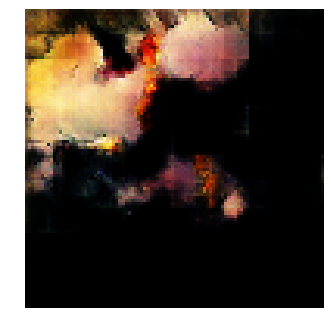


Epoch: 24000, D: -7.211, G: 5.339
Epoch: 24001, D: -7.181, G: 4.98
Epoch: 24002, D: -4.739, G: 3.049
Epoch: 24003, D: -6.322, G: 6.458
Epoch: 24004, D: -6.777, G: 3.656
Epoch: 24005, D: -7.266, G: 2.834
Epoch: 24006, D: -6.212, G: 3.418
Epoch: 24007, D: -5.395, G: 5.38
Epoch: 24008, D: -5.997, G: 3.842
Epoch: 24009, D: -5.22, G: 4.054
Epoch: 24010, D: -7.257, G: 4.462
Epoch: 24011, D: -5.955, G: 3.284
Epoch: 24012, D: -7.107, G: 3.66
Epoch: 24013, D: -4.4, G: 4.099
Epoch: 24014, D: -5.994, G: 4.956
Epoch: 24015, D: -5.948, G: 4.776
Epoch: 24016, D: -4.927, G: 4.188
Epoch: 24017, D: -5.973, G: 4.783
Epoch: 24018, D: -5.443, G: 4.505
Epoch: 24019, D: -6.599, G: 5.527


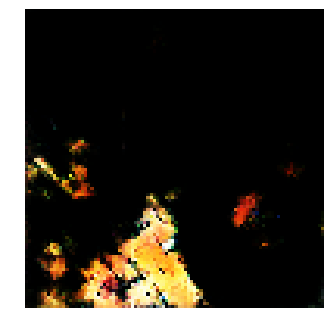


Epoch: 24020, D: -6.469, G: 3.859
Epoch: 24021, D: -5.307, G: 4.129
Epoch: 24022, D: -6.311, G: 4.443
Epoch: 24023, D: -5.494, G: 3.493
Epoch: 24024, D: -7.018, G: 3.912
Epoch: 24025, D: -5.881, G: 4.021
Epoch: 24026, D: -5.756, G: 4.108
Epoch: 24027, D: -7.035, G: 3.246
Epoch: 24028, D: -5.941, G: 2.424
Epoch: 24029, D: -5.549, G: 2.44
Epoch: 24030, D: -6.576, G: 3.963
Epoch: 24031, D: -4.892, G: 3.472
Epoch: 24032, D: -5.035, G: 1.556
Epoch: 24033, D: -4.54, G: 2.001
Epoch: 24034, D: -6.436, G: 5.67
Epoch: 24035, D: -5.658, G: 3.944
Epoch: 24036, D: -6.017, G: 2.948
Epoch: 24037, D: -6.35, G: 3.698
Epoch: 24038, D: -6.234, G: 3.646
Epoch: 24039, D: -5.691, G: 3.922


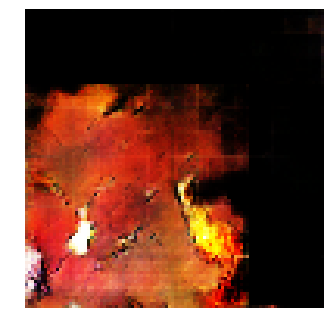


Epoch: 24040, D: -5.579, G: 3.469
Epoch: 24041, D: -6.435, G: 2.762
Epoch: 24042, D: -5.919, G: 4.012
Epoch: 24043, D: -5.933, G: 2.009
Epoch: 24044, D: -6.803, G: 2.584
Epoch: 24045, D: -6.649, G: 1.462
Epoch: 24046, D: -6.511, G: 2.363
Epoch: 24047, D: -5.801, G: 4.267
Epoch: 24048, D: -5.488, G: 3.649
Epoch: 24049, D: -6.389, G: 4.519
Epoch: 24050, D: -5.892, G: 2.174
Epoch: 24051, D: -6.188, G: 3.02
Epoch: 24052, D: -5.334, G: 6.001
Epoch: 24053, D: -6.144, G: 3.006
Epoch: 24054, D: -6.107, G: 3.526
Epoch: 24055, D: -5.435, G: 3.041
Epoch: 24056, D: -6.614, G: 2.172
Epoch: 24057, D: -5.839, G: 3.42
Epoch: 24058, D: -6.287, G: 4.384
Epoch: 24059, D: -5.156, G: 6.863


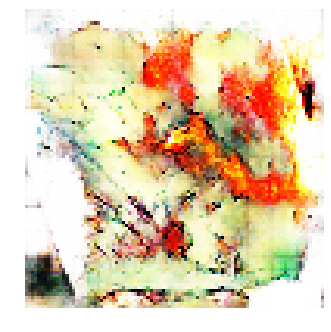


Epoch: 24060, D: -8.002, G: 1.424
Epoch: 24061, D: -6.324, G: 2.361
Epoch: 24062, D: -4.838, G: 3.877
Epoch: 24063, D: -5.412, G: 4.834
Epoch: 24064, D: -6.7, G: 4.574
Epoch: 24065, D: -6.831, G: 3.657
Epoch: 24066, D: -6.279, G: 4.604
Epoch: 24067, D: -5.977, G: 5.016
Epoch: 24068, D: -6.049, G: 4.873
Epoch: 24069, D: -6.579, G: 4.669
Epoch: 24070, D: -6.345, G: 2.576
Epoch: 24071, D: -4.821, G: 3.728
Epoch: 24072, D: -5.594, G: 4.751
Epoch: 24073, D: -5.221, G: 2.918
Epoch: 24074, D: -4.621, G: 3.278
Epoch: 24075, D: -7.008, G: 3.876
Epoch: 24076, D: -5.319, G: 3.785
Epoch: 24077, D: -6.235, G: 4.662
Epoch: 24078, D: -5.173, G: 1.532
Epoch: 24079, D: -5.668, G: 2.89


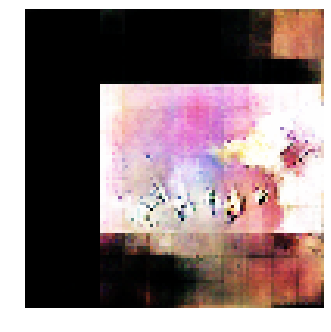


Epoch: 24080, D: -7.189, G: 2.289
Epoch: 24081, D: -6.819, G: 4.482
Epoch: 24082, D: -5.775, G: 2.534
Epoch: 24083, D: -5.882, G: 7.0
Epoch: 24084, D: -4.633, G: 4.234
Epoch: 24085, D: -6.282, G: 3.647
Epoch: 24086, D: -5.685, G: 3.048
Epoch: 24087, D: -6.037, G: 3.669
Epoch: 24088, D: -7.258, G: 5.792
Epoch: 24089, D: -5.953, G: 3.302
Epoch: 24090, D: -5.827, G: 3.034
Epoch: 24091, D: -6.007, G: 4.367
Epoch: 24092, D: -8.019, G: 3.372
Epoch: 24093, D: -4.306, G: 2.199
Epoch: 24094, D: -6.315, G: 2.782
Epoch: 24095, D: -5.77, G: 4.351
Epoch: 24096, D: -5.303, G: 4.986
Epoch: 24097, D: -5.903, G: 4.695
Epoch: 24098, D: -5.118, G: 2.236
Epoch: 24099, D: -6.999, G: 3.855


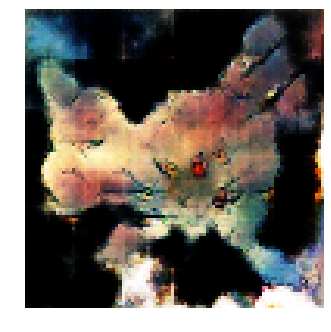


Epoch: 24100, D: -5.782, G: 3.872
Epoch: 24101, D: -5.616, G: 3.537
Epoch: 24102, D: -5.739, G: 3.284
Epoch: 24103, D: -6.494, G: 1.953
Epoch: 24104, D: -5.509, G: 5.9
Epoch: 24105, D: -8.183, G: 3.087
Epoch: 24106, D: -7.2, G: 3.777
Epoch: 24107, D: -6.171, G: 4.076
Epoch: 24108, D: -6.564, G: 6.705
Epoch: 24109, D: -7.334, G: 4.493
Epoch: 24110, D: -6.022, G: 2.982
Epoch: 24111, D: -6.577, G: 2.907
Epoch: 24112, D: -6.143, G: 5.777
Epoch: 24113, D: -5.826, G: 3.495
Epoch: 24114, D: -5.023, G: 5.905
Epoch: 24115, D: -5.677, G: 3.816
Epoch: 24116, D: -6.1, G: 3.603
Epoch: 24117, D: -5.382, G: 4.298
Epoch: 24118, D: -6.421, G: 6.431
Epoch: 24119, D: -5.928, G: 5.363


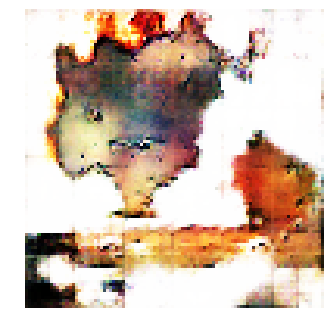


Epoch: 24120, D: -5.948, G: 4.073
Epoch: 24121, D: -5.143, G: 3.826
Epoch: 24122, D: -5.659, G: 5.919
Epoch: 24123, D: -6.385, G: 2.063
Epoch: 24124, D: -5.659, G: 5.316
Epoch: 24125, D: -6.335, G: 3.41
Epoch: 24126, D: -7.045, G: 3.695
Epoch: 24127, D: -5.429, G: 5.158
Epoch: 24128, D: -6.505, G: 4.336
Epoch: 24129, D: -6.65, G: 4.799
Epoch: 24130, D: -6.426, G: 3.361
Epoch: 24131, D: -7.201, G: 2.354
Epoch: 24132, D: -5.044, G: 3.849
Epoch: 24133, D: -5.263, G: 3.465
Epoch: 24134, D: -5.931, G: 3.06
Epoch: 24135, D: -6.814, G: 2.344
Epoch: 24136, D: -5.814, G: 3.374
Epoch: 24137, D: -6.055, G: 3.059
Epoch: 24138, D: -5.937, G: 4.979
Epoch: 24139, D: -6.754, G: 4.273


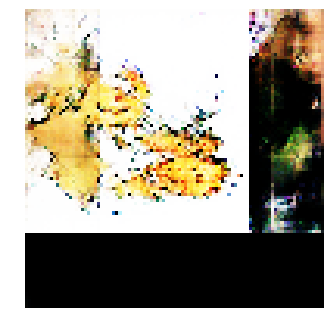


Epoch: 24140, D: -4.923, G: 3.183
Epoch: 24141, D: -6.239, G: 3.592
Epoch: 24142, D: -6.732, G: 3.506
Epoch: 24143, D: -5.679, G: 2.194
Epoch: 24144, D: -5.528, G: 3.695
Epoch: 24145, D: -7.023, G: 3.551
Epoch: 24146, D: -5.716, G: 3.487
Epoch: 24147, D: -6.117, G: 3.369
Epoch: 24148, D: -7.712, G: 2.863
Epoch: 24149, D: -5.725, G: 5.215
Epoch: 24150, D: -7.413, G: 2.876
Epoch: 24151, D: -6.372, G: 3.501
Epoch: 24152, D: -4.981, G: 4.998
Epoch: 24153, D: -5.674, G: 3.473
Epoch: 24154, D: -5.311, G: 3.856
Epoch: 24155, D: -5.855, G: 3.763
Epoch: 24156, D: -6.465, G: 3.701
Epoch: 24157, D: -5.78, G: 4.013
Epoch: 24158, D: -5.429, G: 3.795
Epoch: 24159, D: -5.02, G: 3.712


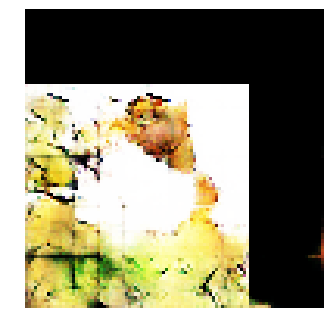


Epoch: 24160, D: -5.614, G: 5.208
Epoch: 24161, D: -5.721, G: 4.611
Epoch: 24162, D: -5.689, G: 4.581
Epoch: 24163, D: -6.165, G: 4.371
Epoch: 24164, D: -6.295, G: 2.754
Epoch: 24165, D: -5.726, G: 2.102
Epoch: 24166, D: -6.564, G: 1.679
Epoch: 24167, D: -5.281, G: 1.958
Epoch: 24168, D: -6.391, G: 2.562
Epoch: 24169, D: -6.038, G: 3.653
Epoch: 24170, D: -6.394, G: 4.014
Epoch: 24171, D: -6.855, G: 1.661
Epoch: 24172, D: -6.353, G: 3.313
Epoch: 24173, D: -5.23, G: 4.255
Epoch: 24174, D: -6.08, G: 3.165
Epoch: 24175, D: -6.385, G: 4.598
Epoch: 24176, D: -6.818, G: 3.499
Epoch: 24177, D: -6.359, G: 3.604
Epoch: 24178, D: -5.997, G: 5.102
Epoch: 24179, D: -5.887, G: 3.536


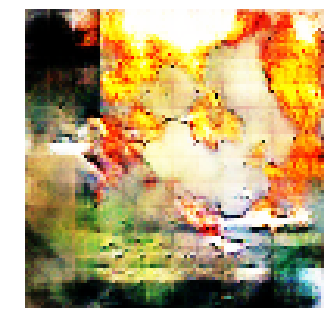


Epoch: 24180, D: -6.686, G: 5.627
Epoch: 24181, D: -5.595, G: 3.601
Epoch: 24182, D: -6.292, G: 5.279
Epoch: 24183, D: -6.935, G: 3.474
Epoch: 24184, D: -4.748, G: 2.926
Epoch: 24185, D: -5.909, G: 4.588
Epoch: 24186, D: -5.705, G: 3.885
Epoch: 24187, D: -6.895, G: 5.074
Epoch: 24188, D: -5.381, G: 3.122
Epoch: 24189, D: -5.995, G: 2.884
Epoch: 24190, D: -6.329, G: 3.654
Epoch: 24191, D: -6.15, G: 3.074
Epoch: 24192, D: -6.848, G: 2.942
Epoch: 24193, D: -6.152, G: 3.937
Epoch: 24194, D: -6.003, G: 5.087
Epoch: 24195, D: -5.93, G: 2.375
Epoch: 24196, D: -7.138, G: 2.571
Epoch: 24197, D: -5.683, G: 3.506
Epoch: 24198, D: -6.312, G: 4.355
Epoch: 24199, D: -5.035, G: 2.998


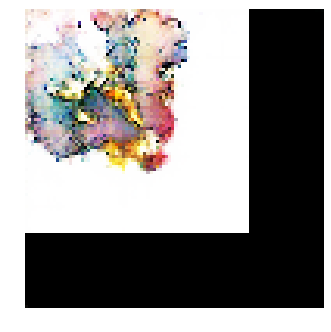


Epoch: 24200, D: -7.454, G: 3.969
Epoch: 24201, D: -4.72, G: 3.94
Epoch: 24202, D: -4.747, G: 5.698
Epoch: 24203, D: -6.998, G: 4.4
Epoch: 24204, D: -5.326, G: 5.254
Epoch: 24205, D: -6.212, G: 3.185
Epoch: 24206, D: -5.484, G: 3.442
Epoch: 24207, D: -5.877, G: 7.474
Epoch: 24208, D: -5.909, G: 3.422
Epoch: 24209, D: -5.784, G: 2.145
Epoch: 24210, D: -7.302, G: 4.998
Epoch: 24211, D: -6.136, G: 3.548
Epoch: 24212, D: -6.681, G: 4.239
Epoch: 24213, D: -5.308, G: 3.271
Epoch: 24214, D: -7.771, G: 4.447
Epoch: 24215, D: -5.995, G: 5.853
Epoch: 24216, D: -7.436, G: 3.353
Epoch: 24217, D: -5.945, G: 4.909
Epoch: 24218, D: -4.942, G: 2.976
Epoch: 24219, D: -6.361, G: 6.086


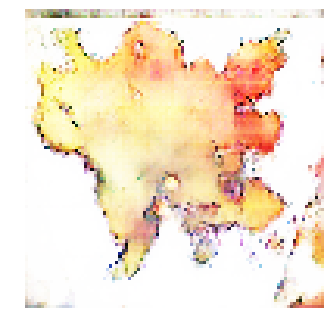


Epoch: 24220, D: -5.848, G: 4.049
Epoch: 24221, D: -5.173, G: 4.981
Epoch: 24222, D: -5.898, G: 3.886
Epoch: 24223, D: -8.118, G: 4.586
Epoch: 24224, D: -5.629, G: 4.084
Epoch: 24225, D: -6.508, G: 6.817
Epoch: 24226, D: -6.077, G: 2.317
Epoch: 24227, D: -5.875, G: 3.151
Epoch: 24228, D: -6.647, G: 4.97
Epoch: 24229, D: -7.432, G: 3.402
Epoch: 24230, D: -5.649, G: 4.231
Epoch: 24231, D: -7.03, G: 4.042
Epoch: 24232, D: -5.291, G: 6.441
Epoch: 24233, D: -7.33, G: 4.757
Epoch: 24234, D: -6.332, G: 3.628
Epoch: 24235, D: -6.285, G: 3.663
Epoch: 24236, D: -6.094, G: 3.719
Epoch: 24237, D: -6.832, G: 4.036
Epoch: 24238, D: -5.931, G: 4.879
Epoch: 24239, D: -6.096, G: 3.975


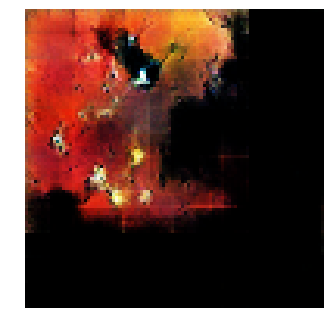


Epoch: 24240, D: -5.732, G: 3.455
Epoch: 24241, D: -7.287, G: 5.043
Epoch: 24242, D: -6.797, G: 2.905
Epoch: 24243, D: -7.228, G: 3.18
Epoch: 24244, D: -5.687, G: 3.735
Epoch: 24245, D: -5.627, G: 3.321
Epoch: 24246, D: -6.062, G: 4.042
Epoch: 24247, D: -4.813, G: 2.358
Epoch: 24248, D: -7.137, G: 4.885
Epoch: 24249, D: -5.547, G: 1.504
Epoch: 24250, D: -6.934, G: 3.138
Epoch: 24251, D: -5.647, G: 2.943
Epoch: 24252, D: -5.841, G: 2.579
Epoch: 24253, D: -6.172, G: 2.763
Epoch: 24254, D: -5.421, G: 4.067
Epoch: 24255, D: -6.511, G: 4.003
Epoch: 24256, D: -5.147, G: 3.881
Epoch: 24257, D: -6.03, G: 4.817
Epoch: 24258, D: -6.94, G: 3.518
Epoch: 24259, D: -6.228, G: 5.149


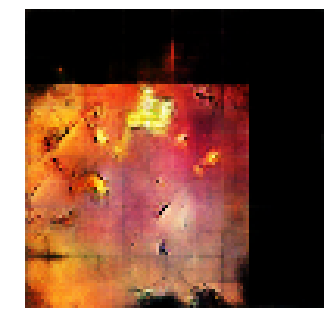


Epoch: 24260, D: -7.378, G: 5.707
Epoch: 24261, D: -5.927, G: 5.348
Epoch: 24262, D: -6.93, G: 3.519
Epoch: 24263, D: -6.022, G: 3.258
Epoch: 24264, D: -6.669, G: 3.741
Epoch: 24265, D: -4.785, G: 2.698
Epoch: 24266, D: -5.773, G: 2.085
Epoch: 24267, D: -5.834, G: 2.59
Epoch: 24268, D: -6.226, G: 3.538
Epoch: 24269, D: -6.835, G: 2.994
Epoch: 24270, D: -5.608, G: 2.846
Epoch: 24271, D: -5.586, G: 1.171
Epoch: 24272, D: -6.505, G: 4.262
Epoch: 24273, D: -6.279, G: 3.744
Epoch: 24274, D: -5.291, G: 2.834
Epoch: 24275, D: -5.98, G: 4.442
Epoch: 24276, D: -5.951, G: 2.605
Epoch: 24277, D: -6.763, G: 3.712
Epoch: 24278, D: -5.717, G: 2.735
Epoch: 24279, D: -5.95, G: 3.608


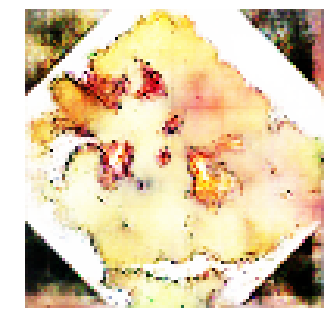


Epoch: 24280, D: -7.107, G: 2.836
Epoch: 24281, D: -5.73, G: 1.944
Epoch: 24282, D: -6.466, G: 5.207
Epoch: 24283, D: -5.17, G: 3.428
Epoch: 24284, D: -6.886, G: 2.751
Epoch: 24285, D: -5.63, G: 1.997
Epoch: 24286, D: -6.396, G: 4.344
Epoch: 24287, D: -6.906, G: 2.304
Epoch: 24288, D: -5.811, G: 4.023
Epoch: 24289, D: -6.755, G: 5.24
Epoch: 24290, D: -4.59, G: 3.036
Epoch: 24291, D: -5.434, G: 4.107
Epoch: 24292, D: -7.391, G: 7.37
Epoch: 24293, D: -7.459, G: 3.464
Epoch: 24294, D: -6.563, G: 4.582
Epoch: 24295, D: -6.986, G: 2.703
Epoch: 24296, D: -5.889, G: 2.941
Epoch: 24297, D: -5.232, G: 4.733
Epoch: 24298, D: -5.856, G: 4.485
Epoch: 24299, D: -4.098, G: 3.556


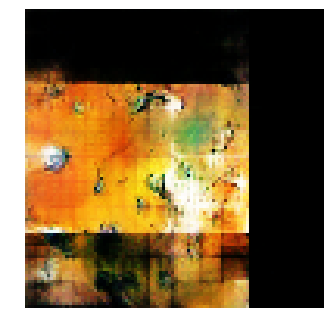


Epoch: 24300, D: -6.965, G: 4.477
Epoch: 24301, D: -6.197, G: 2.613
Epoch: 24302, D: -6.331, G: 3.69
Epoch: 24303, D: -5.963, G: 2.6
Epoch: 24304, D: -4.949, G: 1.633
Epoch: 24305, D: -7.625, G: 3.519
Epoch: 24306, D: -6.858, G: 4.766
Epoch: 24307, D: -6.19, G: 3.504
Epoch: 24308, D: -6.375, G: 4.527
Epoch: 24309, D: -7.37, G: 3.001
Epoch: 24310, D: -5.277, G: 2.813
Epoch: 24311, D: -6.228, G: 4.899
Epoch: 24312, D: -4.964, G: 4.354
Epoch: 24313, D: -5.542, G: 4.54
Epoch: 24314, D: -6.612, G: 5.638
Epoch: 24315, D: -3.535, G: 3.867
Epoch: 24316, D: -5.076, G: 4.859
Epoch: 24317, D: -6.48, G: 4.955
Epoch: 24318, D: -7.186, G: 2.815
Epoch: 24319, D: -6.194, G: 4.746


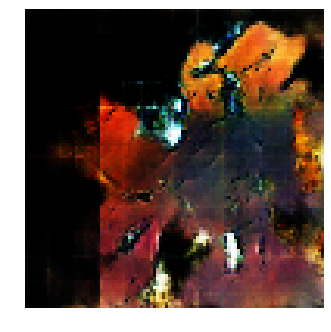


Epoch: 24320, D: -5.182, G: 3.587
Epoch: 24321, D: -6.32, G: 3.812
Epoch: 24322, D: -5.287, G: 3.323
Epoch: 24323, D: -6.639, G: 4.664
Epoch: 24324, D: -5.337, G: 3.662
Epoch: 24325, D: -5.616, G: 5.189
Epoch: 24326, D: -5.706, G: 3.367
Epoch: 24327, D: -4.71, G: 4.843
Epoch: 24328, D: -5.613, G: 3.021
Epoch: 24329, D: -5.936, G: 3.294
Epoch: 24330, D: -6.008, G: 1.913
Epoch: 24331, D: -5.736, G: 3.33
Epoch: 24332, D: -7.46, G: 3.778
Epoch: 24333, D: -5.002, G: 3.005
Epoch: 24334, D: -5.919, G: 3.428
Epoch: 24335, D: -4.851, G: 2.987
Epoch: 24336, D: -5.284, G: 3.52
Epoch: 24337, D: -6.677, G: 3.957
Epoch: 24338, D: -6.539, G: 3.447
Epoch: 24339, D: -6.242, G: 3.68


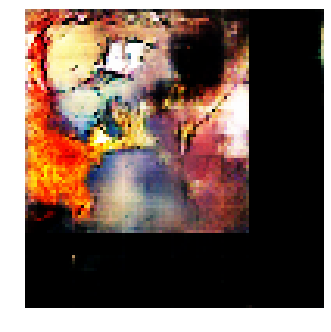


Epoch: 24340, D: -7.29, G: 5.056
Epoch: 24341, D: -7.208, G: 4.245
Epoch: 24342, D: -9.521, G: 4.909
Epoch: 24343, D: -5.387, G: 2.715
Epoch: 24344, D: -6.134, G: 4.183
Epoch: 24345, D: -6.975, G: 2.413
Epoch: 24346, D: -6.542, G: 5.569
Epoch: 24347, D: -6.671, G: 4.376
Epoch: 24348, D: -5.778, G: 3.805
Epoch: 24349, D: -5.411, G: 3.556
Epoch: 24350, D: -4.831, G: 4.451
Epoch: 24351, D: -6.507, G: 4.087
Epoch: 24352, D: -6.332, G: 4.371
Epoch: 24353, D: -6.077, G: 2.859
Epoch: 24354, D: -5.448, G: 5.098
Epoch: 24355, D: -6.608, G: 4.17
Epoch: 24356, D: -5.518, G: 3.965
Epoch: 24357, D: -7.212, G: 4.085
Epoch: 24358, D: -7.332, G: 2.99
Epoch: 24359, D: -5.096, G: 4.702


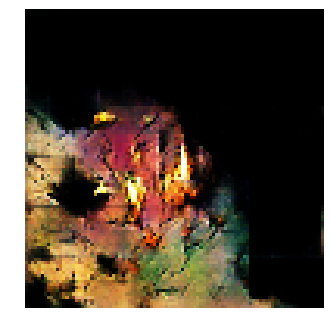


Epoch: 24360, D: -6.196, G: 6.402
Epoch: 24361, D: -5.346, G: 3.286
Epoch: 24362, D: -5.316, G: 3.61
Epoch: 24363, D: -5.422, G: 4.303
Epoch: 24364, D: -5.685, G: 3.608
Epoch: 24365, D: -5.918, G: 3.192
Epoch: 24366, D: -5.37, G: 4.53
Epoch: 24367, D: -6.599, G: 3.661
Epoch: 24368, D: -4.036, G: 3.928
Epoch: 24369, D: -6.815, G: 4.414
Epoch: 24370, D: -7.201, G: 3.489
Epoch: 24371, D: -5.879, G: 6.358
Epoch: 24372, D: -6.93, G: 4.907
Epoch: 24373, D: -6.357, G: 3.56
Epoch: 24374, D: -6.354, G: 1.598
Epoch: 24375, D: -5.858, G: 3.486
Epoch: 24376, D: -6.228, G: 3.171
Epoch: 24377, D: -5.223, G: 2.703
Epoch: 24378, D: -6.566, G: 5.994
Epoch: 24379, D: -6.811, G: 1.43


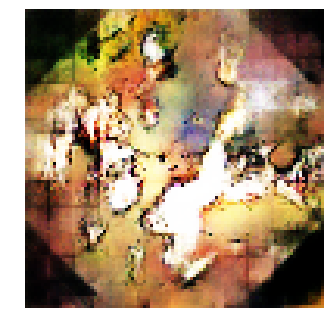


Epoch: 24380, D: -7.169, G: 4.86
Epoch: 24381, D: -6.472, G: 4.911
Epoch: 24382, D: -5.504, G: 4.865
Epoch: 24383, D: -5.764, G: 4.191
Epoch: 24384, D: -6.983, G: 3.509
Epoch: 24385, D: -6.417, G: 4.544
Epoch: 24386, D: -4.928, G: 3.991
Epoch: 24387, D: -6.288, G: 4.131
Epoch: 24388, D: -6.613, G: 3.183
Epoch: 24389, D: -5.218, G: 5.843
Epoch: 24390, D: -7.02, G: 2.447
Epoch: 24391, D: -4.732, G: 4.375
Epoch: 24392, D: -6.199, G: 2.163
Epoch: 24393, D: -6.698, G: 4.253
Epoch: 24394, D: -6.116, G: 3.519
Epoch: 24395, D: -5.392, G: 3.168
Epoch: 24396, D: -7.722, G: 6.698
Epoch: 24397, D: -5.209, G: 1.907
Epoch: 24398, D: -6.266, G: 3.211
Epoch: 24399, D: -5.827, G: 2.208


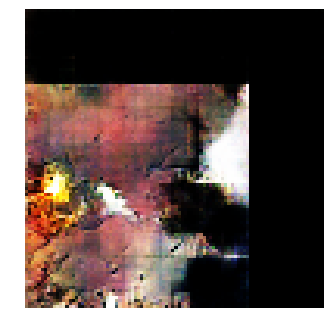


Epoch: 24400, D: -5.99, G: 5.319
Epoch: 24401, D: -4.988, G: 3.612
Epoch: 24402, D: -4.185, G: 3.472
Epoch: 24403, D: -4.648, G: 2.451
Epoch: 24404, D: -6.911, G: 3.982
Epoch: 24405, D: -7.014, G: 2.46
Epoch: 24406, D: -6.986, G: 2.854
Epoch: 24407, D: -5.943, G: 2.478
Epoch: 24408, D: -5.962, G: 3.315
Epoch: 24409, D: -5.517, G: 3.11
Epoch: 24410, D: -5.724, G: 4.691
Epoch: 24411, D: -6.311, G: 4.672
Epoch: 24412, D: -5.158, G: 2.743
Epoch: 24413, D: -7.064, G: 4.608
Epoch: 24414, D: -5.766, G: 4.565
Epoch: 24415, D: -7.722, G: 4.402
Epoch: 24416, D: -5.476, G: 5.447
Epoch: 24417, D: -6.231, G: 2.82
Epoch: 24418, D: -4.754, G: 4.178
Epoch: 24419, D: -6.991, G: 5.38


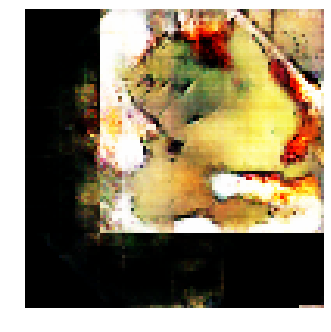


Epoch: 24420, D: -5.748, G: 3.903
Epoch: 24421, D: -5.783, G: 3.859
Epoch: 24422, D: -6.75, G: 4.494
Epoch: 24423, D: -6.714, G: 4.426
Epoch: 24424, D: -5.941, G: 2.498
Epoch: 24425, D: -4.896, G: 3.981
Epoch: 24426, D: -7.038, G: 2.947
Epoch: 24427, D: -6.528, G: 3.664
Epoch: 24428, D: -6.863, G: 3.711
Epoch: 24429, D: -7.305, G: 6.002
Epoch: 24430, D: -5.639, G: 7.103
Epoch: 24431, D: -6.133, G: 6.078
Epoch: 24432, D: -6.521, G: 3.399
Epoch: 24433, D: -5.9, G: 2.595
Epoch: 24434, D: -5.951, G: 5.317
Epoch: 24435, D: -5.797, G: 5.252
Epoch: 24436, D: -4.551, G: 6.437
Epoch: 24437, D: -6.699, G: 3.239
Epoch: 24438, D: -3.924, G: 3.626
Epoch: 24439, D: -6.326, G: 4.552


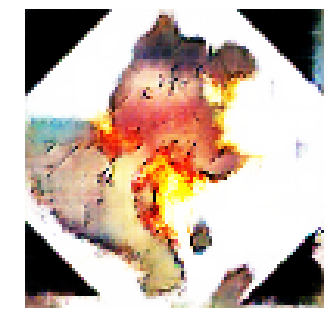


Epoch: 24440, D: -5.126, G: 3.286
Epoch: 24441, D: -6.864, G: 2.988
Epoch: 24442, D: -6.566, G: 3.651
Epoch: 24443, D: -5.115, G: 5.713
Epoch: 24444, D: -6.222, G: 5.147
Epoch: 24445, D: -6.932, G: 3.056
Epoch: 24446, D: -5.578, G: 4.488
Epoch: 24447, D: -4.594, G: 4.952
Epoch: 24448, D: -6.26, G: 4.233
Epoch: 24449, D: -4.822, G: 4.898
Epoch: 24450, D: -5.722, G: 4.537
Epoch: 24451, D: -6.863, G: 5.039
Epoch: 24452, D: -6.252, G: 2.91
Epoch: 24453, D: -4.229, G: 6.119
Epoch: 24454, D: -6.21, G: 3.47
Epoch: 24455, D: -6.855, G: 3.134
Epoch: 24456, D: -6.317, G: 1.998
Epoch: 24457, D: -6.808, G: 3.983
Epoch: 24458, D: -6.234, G: 1.294
Epoch: 24459, D: -6.138, G: 2.868


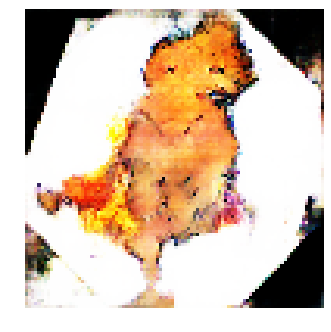


Epoch: 24460, D: -7.864, G: 4.241
Epoch: 24461, D: -6.515, G: 3.138
Epoch: 24462, D: -6.287, G: 3.337
Epoch: 24463, D: -8.028, G: 4.203
Epoch: 24464, D: -4.894, G: 2.642
Epoch: 24465, D: -7.041, G: 5.436
Epoch: 24466, D: -6.889, G: 7.286
Epoch: 24467, D: -5.908, G: 6.166
Epoch: 24468, D: -6.014, G: 3.86
Epoch: 24469, D: -6.238, G: 4.401
Epoch: 24470, D: -4.896, G: 3.268
Epoch: 24471, D: -5.596, G: 3.861
Epoch: 24472, D: -5.967, G: 3.47
Epoch: 24473, D: -4.687, G: 3.157
Epoch: 24474, D: -5.956, G: 4.251
Epoch: 24475, D: -6.413, G: 3.61
Epoch: 24476, D: -5.516, G: 2.714
Epoch: 24477, D: -6.105, G: 5.56
Epoch: 24478, D: -6.513, G: 5.981
Epoch: 24479, D: -5.753, G: 3.995


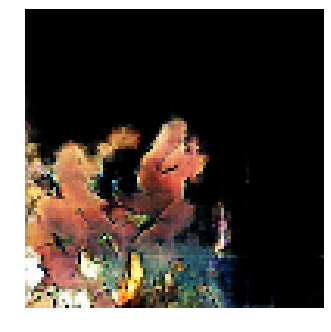


Epoch: 24480, D: -5.806, G: 3.627
Epoch: 24481, D: -6.607, G: 3.516
Epoch: 24482, D: -5.164, G: 2.847
Epoch: 24483, D: -6.239, G: 4.679
Epoch: 24484, D: -5.067, G: 2.686
Epoch: 24485, D: -6.713, G: 4.119
Epoch: 24486, D: -5.129, G: 4.042
Epoch: 24487, D: -5.761, G: 6.421
Epoch: 24488, D: -5.453, G: 4.927
Epoch: 24489, D: -7.306, G: 6.53
Epoch: 24490, D: -6.123, G: 5.715
Epoch: 24491, D: -7.306, G: 5.088
Epoch: 24492, D: -6.761, G: 5.576
Epoch: 24493, D: -5.474, G: 5.182
Epoch: 24494, D: -5.309, G: 4.6
Epoch: 24495, D: -7.019, G: 2.969
Epoch: 24496, D: -6.905, G: 3.985
Epoch: 24497, D: -6.652, G: 3.839
Epoch: 24498, D: -5.876, G: 2.718
Epoch: 24499, D: -5.134, G: 1.36


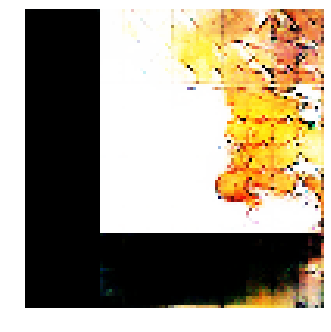


Epoch: 24500, D: -6.068, G: 1.799
Epoch: 24501, D: -5.407, G: 3.735
Epoch: 24502, D: -7.466, G: 2.143
Epoch: 24503, D: -7.035, G: 1.972
Epoch: 24504, D: -4.724, G: 2.694
Epoch: 24505, D: -7.387, G: 3.569
Epoch: 24506, D: -6.149, G: 3.572
Epoch: 24507, D: -6.035, G: 4.136
Epoch: 24508, D: -6.651, G: 4.396
Epoch: 24509, D: -7.253, G: 4.131
Epoch: 24510, D: -6.674, G: 2.326
Epoch: 24511, D: -5.297, G: 5.35
Epoch: 24512, D: -6.061, G: 4.086
Epoch: 24513, D: -6.428, G: 3.296
Epoch: 24514, D: -5.479, G: 4.579
Epoch: 24515, D: -5.948, G: 4.189
Epoch: 24516, D: -5.521, G: 3.658
Epoch: 24517, D: -8.059, G: 5.233
Epoch: 24518, D: -6.311, G: 3.327
Epoch: 24519, D: -6.177, G: 3.049


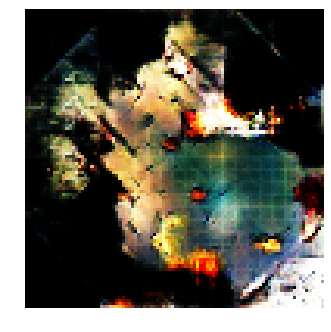


Epoch: 24520, D: -4.651, G: 4.314
Epoch: 24521, D: -6.509, G: 3.338
Epoch: 24522, D: -7.521, G: 5.481
Epoch: 24523, D: -6.379, G: 5.262
Epoch: 24524, D: -7.406, G: 4.31
Epoch: 24525, D: -5.172, G: 3.185
Epoch: 24526, D: -6.865, G: 3.322
Epoch: 24527, D: -5.863, G: 2.379
Epoch: 24528, D: -7.143, G: 2.589
Epoch: 24529, D: -4.593, G: 5.189
Epoch: 24530, D: -6.668, G: 5.64
Epoch: 24531, D: -5.628, G: 3.116
Epoch: 24532, D: -6.787, G: 3.478
Epoch: 24533, D: -5.853, G: 4.525
Epoch: 24534, D: -6.135, G: 6.049
Epoch: 24535, D: -6.431, G: 3.573
Epoch: 24536, D: -7.069, G: 3.602
Epoch: 24537, D: -5.708, G: 1.693
Epoch: 24538, D: -5.641, G: 4.123
Epoch: 24539, D: -5.999, G: 2.717


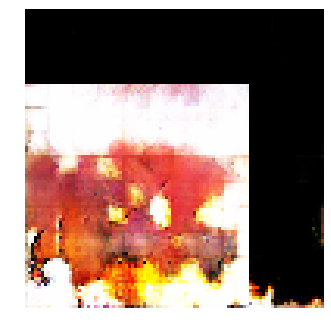


Epoch: 24540, D: -5.296, G: 2.449
Epoch: 24541, D: -7.09, G: 4.795
Epoch: 24542, D: -5.647, G: 2.83
Epoch: 24543, D: -5.222, G: 3.008
Epoch: 24544, D: -5.912, G: 3.399
Epoch: 24545, D: -5.715, G: 1.044
Epoch: 24546, D: -6.362, G: 4.141
Epoch: 24547, D: -7.351, G: 3.799
Epoch: 24548, D: -6.497, G: 3.806
Epoch: 24549, D: -5.532, G: 4.099
Epoch: 24550, D: -6.315, G: 3.37
Epoch: 24551, D: -5.952, G: 5.126
Epoch: 24552, D: -6.891, G: 4.804
Epoch: 24553, D: -6.561, G: 5.592
Epoch: 24554, D: -6.694, G: 3.822
Epoch: 24555, D: -6.456, G: 4.801
Epoch: 24556, D: -6.494, G: 3.807
Epoch: 24557, D: -6.565, G: 1.616
Epoch: 24558, D: -5.099, G: 3.595
Epoch: 24559, D: -5.66, G: 4.798


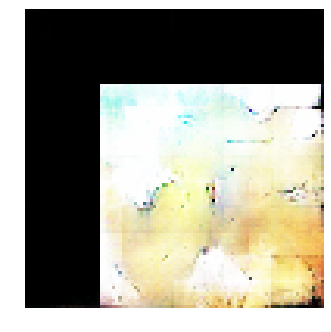


Epoch: 24560, D: -5.465, G: 4.599
Epoch: 24561, D: -6.376, G: 4.731
Epoch: 24562, D: -5.87, G: 2.205
Epoch: 24563, D: -4.567, G: 4.3
Epoch: 24564, D: -5.908, G: 4.896
Epoch: 24565, D: -5.496, G: 3.182
Epoch: 24566, D: -5.389, G: 4.822
Epoch: 24567, D: -7.252, G: 3.745
Epoch: 24568, D: -6.168, G: 2.156
Epoch: 24569, D: -4.835, G: 4.997
Epoch: 24570, D: -7.59, G: 3.086
Epoch: 24571, D: -5.607, G: 6.34
Epoch: 24572, D: -5.468, G: 3.693
Epoch: 24573, D: -5.673, G: 4.542
Epoch: 24574, D: -5.949, G: 4.102
Epoch: 24575, D: -6.819, G: 3.536
Epoch: 24576, D: -4.686, G: 4.168
Epoch: 24577, D: -5.304, G: 3.367
Epoch: 24578, D: -6.516, G: 4.897
Epoch: 24579, D: -6.098, G: 3.646


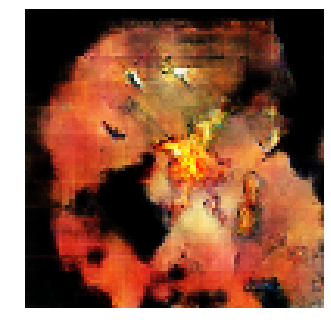


Epoch: 24580, D: -4.94, G: 5.45
Epoch: 24581, D: -5.813, G: 4.505
Epoch: 24582, D: -4.847, G: 4.045
Epoch: 24583, D: -7.157, G: 3.952
Epoch: 24584, D: -7.23, G: 4.468
Epoch: 24585, D: -6.694, G: 2.484
Epoch: 24586, D: -6.246, G: 5.322
Epoch: 24587, D: -5.885, G: 2.303
Epoch: 24588, D: -5.593, G: 3.926
Epoch: 24589, D: -5.76, G: 3.926
Epoch: 24590, D: -5.55, G: 3.032
Epoch: 24591, D: -6.143, G: 3.339
Epoch: 24592, D: -5.184, G: 2.839
Epoch: 24593, D: -6.068, G: 2.206
Epoch: 24594, D: -5.225, G: 4.846
Epoch: 24595, D: -5.534, G: 4.838
Epoch: 24596, D: -7.586, G: 3.808
Epoch: 24597, D: -5.277, G: 2.301
Epoch: 24598, D: -5.478, G: 3.218
Epoch: 24599, D: -6.322, G: 2.582


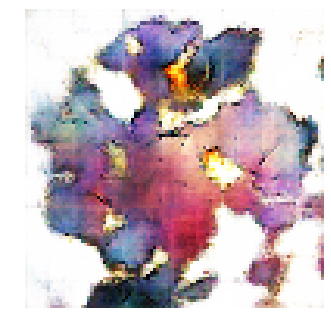


Epoch: 24600, D: -4.55, G: 5.811
Epoch: 24601, D: -5.893, G: 4.782
Epoch: 24602, D: -6.048, G: 3.998
Epoch: 24603, D: -6.947, G: 4.89
Epoch: 24604, D: -6.004, G: 2.27
Epoch: 24605, D: -5.0, G: 4.709
Epoch: 24606, D: -5.222, G: 4.546
Epoch: 24607, D: -6.391, G: 3.401
Epoch: 24608, D: -6.16, G: 3.077
Epoch: 24609, D: -5.319, G: 3.633
Epoch: 24610, D: -6.361, G: 3.334
Epoch: 24611, D: -5.033, G: 4.687
Epoch: 24612, D: -5.693, G: 2.981
Epoch: 24613, D: -5.822, G: 5.047
Epoch: 24614, D: -7.201, G: 4.833
Epoch: 24615, D: -7.505, G: 3.52
Epoch: 24616, D: -4.415, G: 3.606
Epoch: 24617, D: -5.85, G: 5.594
Epoch: 24618, D: -5.036, G: 3.161
Epoch: 24619, D: -6.02, G: 3.328


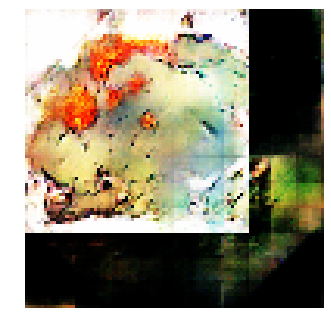


Epoch: 24620, D: -5.984, G: 3.854
Epoch: 24621, D: -6.745, G: 3.748
Epoch: 24622, D: -5.008, G: 3.764
Epoch: 24623, D: -5.28, G: 3.011
Epoch: 24624, D: -6.151, G: 3.579
Epoch: 24625, D: -6.248, G: 3.874
Epoch: 24626, D: -5.45, G: 3.481
Epoch: 24627, D: -7.171, G: 4.043
Epoch: 24628, D: -4.918, G: 3.94
Epoch: 24629, D: -3.948, G: 3.126
Epoch: 24630, D: -6.23, G: 5.332
Epoch: 24631, D: -5.654, G: 4.336
Epoch: 24632, D: -6.073, G: 3.397
Epoch: 24633, D: -4.992, G: 4.314
Epoch: 24634, D: -6.951, G: 4.497
Epoch: 24635, D: -6.816, G: 3.762
Epoch: 24636, D: -6.259, G: 3.016
Epoch: 24637, D: -5.379, G: 3.146
Epoch: 24638, D: -5.883, G: 3.19
Epoch: 24639, D: -6.457, G: 4.119


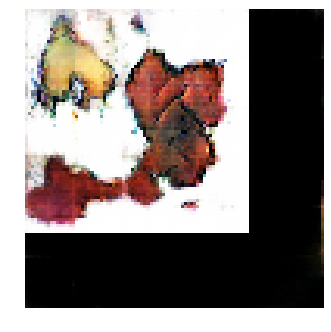


Epoch: 24640, D: -5.606, G: 3.206
Epoch: 24641, D: -5.904, G: 4.941
Epoch: 24642, D: -5.413, G: 4.113
Epoch: 24643, D: -7.3, G: 1.624
Epoch: 24644, D: -5.594, G: 3.739
Epoch: 24645, D: -5.572, G: 2.821
Epoch: 24646, D: -5.178, G: 3.588
Epoch: 24647, D: -6.379, G: 5.118
Epoch: 24648, D: -5.498, G: 6.425
Epoch: 24649, D: -6.574, G: 4.46
Epoch: 24650, D: -6.12, G: 4.033
Epoch: 24651, D: -6.074, G: 3.702
Epoch: 24652, D: -6.162, G: 5.348
Epoch: 24653, D: -6.17, G: 4.651
Epoch: 24654, D: -6.712, G: 6.177
Epoch: 24655, D: -5.872, G: 4.702
Epoch: 24656, D: -5.77, G: 2.972
Epoch: 24657, D: -6.098, G: 4.831
Epoch: 24658, D: -5.621, G: 3.514
Epoch: 24659, D: -7.204, G: 3.722


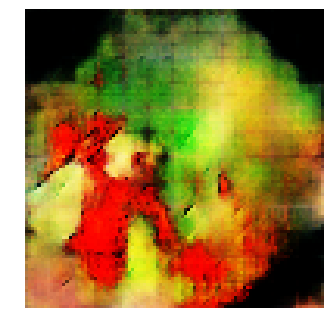


Epoch: 24660, D: -5.945, G: 5.101
Epoch: 24661, D: -5.266, G: 5.661
Epoch: 24662, D: -5.731, G: 4.737
Epoch: 24663, D: -6.032, G: 5.355
Epoch: 24664, D: -6.5, G: 4.262
Epoch: 24665, D: -6.302, G: 4.139
Epoch: 24666, D: -6.088, G: 4.424
Epoch: 24667, D: -6.392, G: 6.247
Epoch: 24668, D: -6.052, G: 2.599
Epoch: 24669, D: -7.294, G: 3.174
Epoch: 24670, D: -5.871, G: 2.932
Epoch: 24671, D: -4.829, G: 3.672
Epoch: 24672, D: -6.109, G: 4.049
Epoch: 24673, D: -5.106, G: 4.66
Epoch: 24674, D: -6.015, G: 2.827
Epoch: 24675, D: -5.839, G: 3.211
Epoch: 24676, D: -6.118, G: 2.988
Epoch: 24677, D: -6.108, G: 3.853
Epoch: 24678, D: -6.031, G: 3.793
Epoch: 24679, D: -5.613, G: 2.051


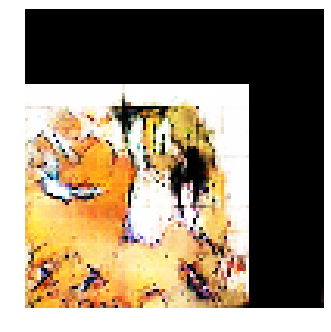


Epoch: 24680, D: -4.914, G: 3.582
Epoch: 24681, D: -7.017, G: 4.638
Epoch: 24682, D: -5.609, G: 2.547
Epoch: 24683, D: -5.618, G: 4.764
Epoch: 24684, D: -5.078, G: 4.502
Epoch: 24685, D: -6.397, G: 3.428
Epoch: 24686, D: -6.578, G: 3.634
Epoch: 24687, D: -5.146, G: 2.996
Epoch: 24688, D: -5.172, G: 3.449
Epoch: 24689, D: -5.869, G: 4.58
Epoch: 24690, D: -6.787, G: 3.512
Epoch: 24691, D: -6.392, G: 3.213
Epoch: 24692, D: -6.559, G: 4.359
Epoch: 24693, D: -6.197, G: 6.132
Epoch: 24694, D: -6.161, G: 3.084
Epoch: 24695, D: -6.029, G: 4.241
Epoch: 24696, D: -5.576, G: 4.65
Epoch: 24697, D: -5.337, G: 3.858
Epoch: 24698, D: -6.545, G: 4.724
Epoch: 24699, D: -7.362, G: 5.176


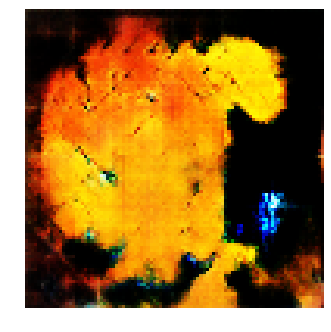


Epoch: 24700, D: -6.243, G: 3.453
Epoch: 24701, D: -4.98, G: 4.87
Epoch: 24702, D: -5.898, G: 5.189
Epoch: 24703, D: -4.967, G: 3.451
Epoch: 24704, D: -6.139, G: 3.141
Epoch: 24705, D: -5.998, G: 1.535
Epoch: 24706, D: -5.581, G: 4.618
Epoch: 24707, D: -5.765, G: 3.581
Epoch: 24708, D: -6.07, G: 3.126
Epoch: 24709, D: -6.511, G: 7.116
Epoch: 24710, D: -6.804, G: 3.115
Epoch: 24711, D: -6.062, G: 2.745
Epoch: 24712, D: -4.939, G: 6.345
Epoch: 24713, D: -5.623, G: 3.853
Epoch: 24714, D: -7.157, G: 2.988
Epoch: 24715, D: -6.132, G: 2.976
Epoch: 24716, D: -7.881, G: 3.31
Epoch: 24717, D: -5.275, G: 3.378
Epoch: 24718, D: -4.975, G: 5.204
Epoch: 24719, D: -6.373, G: 4.362


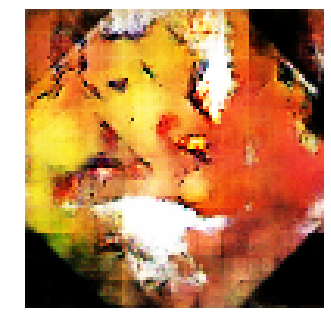


Epoch: 24720, D: -6.882, G: 3.018
Epoch: 24721, D: -6.563, G: 4.237
Epoch: 24722, D: -6.004, G: 3.956
Epoch: 24723, D: -5.63, G: 3.523
Epoch: 24724, D: -7.331, G: 4.253
Epoch: 24725, D: -5.418, G: 4.675
Epoch: 24726, D: -5.422, G: 5.443
Epoch: 24727, D: -3.89, G: 3.426
Epoch: 24728, D: -5.62, G: 3.342
Epoch: 24729, D: -5.57, G: 3.796
Epoch: 24730, D: -6.1, G: 3.658
Epoch: 24731, D: -6.752, G: 4.62
Epoch: 24732, D: -5.098, G: 5.472
Epoch: 24733, D: -4.652, G: 3.932
Epoch: 24734, D: -5.015, G: 4.475
Epoch: 24735, D: -6.395, G: 3.261
Epoch: 24736, D: -6.051, G: 2.839
Epoch: 24737, D: -5.875, G: 3.564
Epoch: 24738, D: -7.648, G: 5.823
Epoch: 24739, D: -6.577, G: 6.124


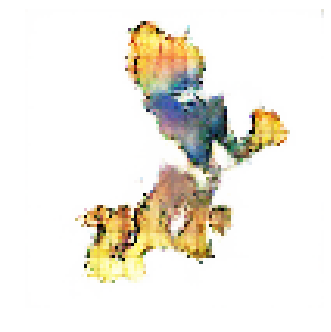


Epoch: 24740, D: -6.314, G: 3.141
Epoch: 24741, D: -6.484, G: 3.83
Epoch: 24742, D: -6.323, G: 1.642
Epoch: 24743, D: -6.349, G: 4.295
Epoch: 24744, D: -6.489, G: 3.072
Epoch: 24745, D: -5.699, G: 2.821
Epoch: 24746, D: -7.065, G: 3.503
Epoch: 24747, D: -4.981, G: 4.238
Epoch: 24748, D: -6.196, G: 5.817
Epoch: 24749, D: -6.461, G: 5.473
Epoch: 24750, D: -6.089, G: 4.144
Epoch: 24751, D: -6.888, G: 6.318
Epoch: 24752, D: -7.018, G: 4.213
Epoch: 24753, D: -5.733, G: 3.749
Epoch: 24754, D: -5.363, G: 4.678
Epoch: 24755, D: -7.132, G: 3.767
Epoch: 24756, D: -6.569, G: 4.796
Epoch: 24757, D: -6.152, G: 4.266
Epoch: 24758, D: -6.355, G: 4.024
Epoch: 24759, D: -4.819, G: 5.342


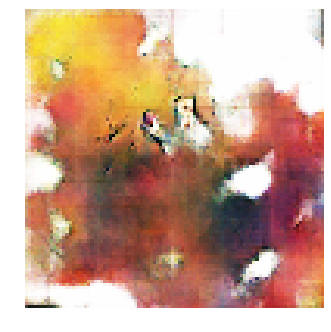


Epoch: 24760, D: -3.8, G: 3.378
Epoch: 24761, D: -6.038, G: 2.807
Epoch: 24762, D: -6.55, G: 3.96
Epoch: 24763, D: -6.193, G: 5.272
Epoch: 24764, D: -7.764, G: 5.129
Epoch: 24765, D: -6.367, G: 3.037
Epoch: 24766, D: -5.239, G: 6.234
Epoch: 24767, D: -6.349, G: 2.762
Epoch: 24768, D: -6.554, G: 4.928
Epoch: 24769, D: -6.838, G: 2.079
Epoch: 24770, D: -5.524, G: 3.546
Epoch: 24771, D: -4.928, G: 2.837
Epoch: 24772, D: -5.45, G: 1.435
Epoch: 24773, D: -4.378, G: 1.552
Epoch: 24774, D: -6.764, G: 4.079
Epoch: 24775, D: -6.416, G: 3.224
Epoch: 24776, D: -6.506, G: 3.021
Epoch: 24777, D: -5.56, G: 3.577
Epoch: 24778, D: -5.438, G: 4.688
Epoch: 24779, D: -6.93, G: 3.832


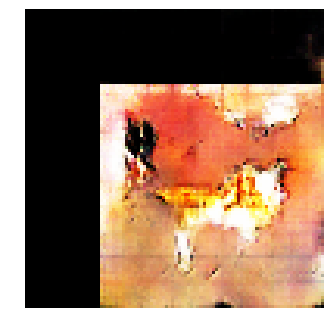


Epoch: 24780, D: -5.667, G: 3.377
Epoch: 24781, D: -5.765, G: 4.796
Epoch: 24782, D: -6.936, G: 2.85
Epoch: 24783, D: -5.69, G: 2.109
Epoch: 24784, D: -3.977, G: 3.247
Epoch: 24785, D: -5.486, G: 3.172
Epoch: 24786, D: -6.175, G: 4.302
Epoch: 24787, D: -5.883, G: 4.892
Epoch: 24788, D: -6.518, G: 3.954
Epoch: 24789, D: -5.113, G: 3.041
Epoch: 24790, D: -6.834, G: 4.074
Epoch: 24791, D: -7.01, G: 3.411
Epoch: 24792, D: -4.873, G: 4.444
Epoch: 24793, D: -6.467, G: 3.791
Epoch: 24794, D: -6.899, G: 4.085
Epoch: 24795, D: -6.215, G: 4.778
Epoch: 24796, D: -5.512, G: 3.856
Epoch: 24797, D: -5.168, G: 3.948
Epoch: 24798, D: -5.889, G: 1.939
Epoch: 24799, D: -6.269, G: 4.294


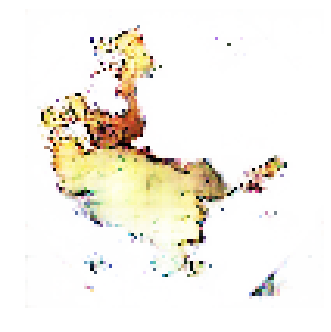


Epoch: 24800, D: -6.782, G: 3.881
Epoch: 24801, D: -6.129, G: 2.21
Epoch: 24802, D: -5.908, G: 3.009
Epoch: 24803, D: -3.871, G: 6.869
Epoch: 24804, D: -7.173, G: 3.952
Epoch: 24805, D: -6.821, G: 5.061
Epoch: 24806, D: -5.269, G: 3.202
Epoch: 24807, D: -4.707, G: 5.355
Epoch: 24808, D: -6.679, G: 4.729
Epoch: 24809, D: -5.066, G: 6.095
Epoch: 24810, D: -7.599, G: 6.764
Epoch: 24811, D: -6.561, G: 2.307
Epoch: 24812, D: -6.084, G: 4.804
Epoch: 24813, D: -7.672, G: 3.068
Epoch: 24814, D: -6.33, G: 2.271
Epoch: 24815, D: -6.813, G: 5.652
Epoch: 24816, D: -7.601, G: 4.843
Epoch: 24817, D: -7.27, G: 4.08
Epoch: 24818, D: -6.496, G: 5.728
Epoch: 24819, D: -5.934, G: 4.771


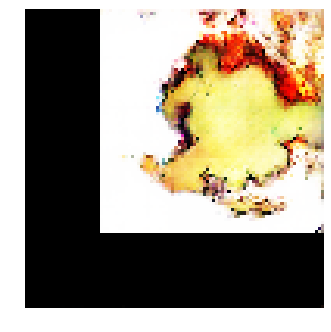


Epoch: 24820, D: -5.906, G: 2.528
Epoch: 24821, D: -6.461, G: 2.929
Epoch: 24822, D: -6.664, G: 3.409
Epoch: 24823, D: -5.735, G: 5.8
Epoch: 24824, D: -5.658, G: 3.122
Epoch: 24825, D: -6.647, G: 5.125
Epoch: 24826, D: -7.598, G: 3.806
Epoch: 24827, D: -4.518, G: 2.689
Epoch: 24828, D: -5.773, G: 4.431
Epoch: 24829, D: -6.124, G: 6.59
Epoch: 24830, D: -5.213, G: 3.534
Epoch: 24831, D: -6.199, G: 3.542
Epoch: 24832, D: -7.872, G: 3.884
Epoch: 24833, D: -5.721, G: 5.156
Epoch: 24834, D: -4.345, G: 4.972
Epoch: 24835, D: -6.533, G: 5.239
Epoch: 24836, D: -5.78, G: 4.852
Epoch: 24837, D: -7.073, G: 3.284
Epoch: 24838, D: -5.934, G: 3.329
Epoch: 24839, D: -5.75, G: 3.739


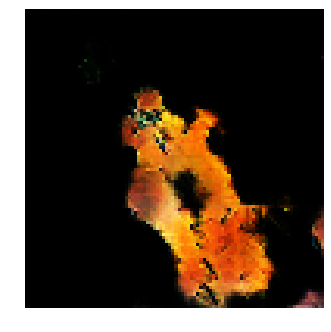


Epoch: 24840, D: -7.154, G: 6.957
Epoch: 24841, D: -7.125, G: 3.707
Epoch: 24842, D: -5.497, G: 2.443
Epoch: 24843, D: -5.971, G: 4.614
Epoch: 24844, D: -5.34, G: 3.71
Epoch: 24845, D: -6.341, G: 4.285
Epoch: 24846, D: -5.53, G: 4.094
Epoch: 24847, D: -7.493, G: 4.88
Epoch: 24848, D: -6.791, G: 4.201
Epoch: 24849, D: -4.965, G: 3.946
Epoch: 24850, D: -6.591, G: 3.468
Epoch: 24851, D: -5.361, G: 3.696
Epoch: 24852, D: -5.975, G: 4.58
Epoch: 24853, D: -5.383, G: 4.714
Epoch: 24854, D: -6.386, G: 3.195
Epoch: 24855, D: -5.64, G: 3.767
Epoch: 24856, D: -5.59, G: 3.108
Epoch: 24857, D: -7.108, G: 5.221
Epoch: 24858, D: -5.984, G: 3.902
Epoch: 24859, D: -7.05, G: 4.611


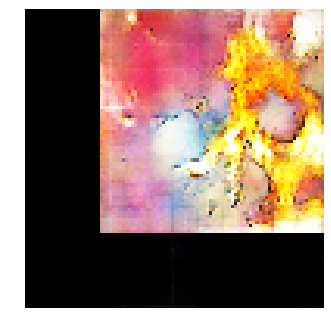


Epoch: 24860, D: -6.305, G: 3.472
Epoch: 24861, D: -5.286, G: 4.449
Epoch: 24862, D: -5.716, G: 4.681
Epoch: 24863, D: -6.526, G: 3.572
Epoch: 24864, D: -7.225, G: 2.761
Epoch: 24865, D: -6.625, G: 3.583
Epoch: 24866, D: -5.405, G: 2.593
Epoch: 24867, D: -7.084, G: 3.077
Epoch: 24868, D: -5.852, G: 2.582
Epoch: 24869, D: -6.424, G: 3.638
Epoch: 24870, D: -5.901, G: 4.493
Epoch: 24871, D: -6.642, G: 5.175
Epoch: 24872, D: -5.697, G: 2.385
Epoch: 24873, D: -5.696, G: 3.465
Epoch: 24874, D: -4.996, G: 3.758
Epoch: 24875, D: -6.498, G: 4.355
Epoch: 24876, D: -5.481, G: 5.175
Epoch: 24877, D: -5.409, G: 4.277
Epoch: 24878, D: -5.555, G: 6.448
Epoch: 24879, D: -6.476, G: 3.886


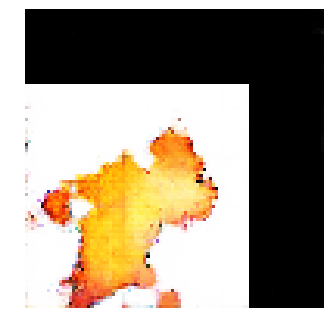


Epoch: 24880, D: -5.473, G: 2.058
Epoch: 24881, D: -6.563, G: 3.219
Epoch: 24882, D: -5.305, G: 1.752
Epoch: 24883, D: -4.552, G: 4.221
Epoch: 24884, D: -6.571, G: 3.152
Epoch: 24885, D: -6.466, G: 0.4386
Epoch: 24886, D: -6.219, G: 5.307
Epoch: 24887, D: -6.561, G: 3.365
Epoch: 24888, D: -6.714, G: 3.586
Epoch: 24889, D: -6.357, G: 6.501
Epoch: 24890, D: -5.302, G: 3.759
Epoch: 24891, D: -5.52, G: 3.646
Epoch: 24892, D: -5.449, G: 2.446
Epoch: 24893, D: -5.908, G: 5.04
Epoch: 24894, D: -5.242, G: 3.115
Epoch: 24895, D: -5.712, G: 3.465
Epoch: 24896, D: -5.519, G: 6.979
Epoch: 24897, D: -5.826, G: 5.094
Epoch: 24898, D: -5.733, G: 5.321
Epoch: 24899, D: -5.713, G: 5.455


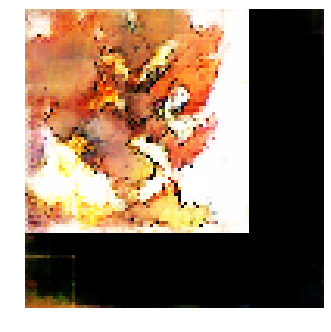


Epoch: 24900, D: -5.52, G: 3.78
Epoch: 24901, D: -6.961, G: 2.977
Epoch: 24902, D: -5.894, G: 1.84
Epoch: 24903, D: -6.092, G: 3.172
Epoch: 24904, D: -6.129, G: 4.139
Epoch: 24905, D: -7.277, G: 3.609
Epoch: 24906, D: -6.646, G: 2.238
Epoch: 24907, D: -6.516, G: 2.937
Epoch: 24908, D: -6.01, G: 4.678
Epoch: 24909, D: -6.116, G: 4.724
Epoch: 24910, D: -5.972, G: 5.273
Epoch: 24911, D: -6.011, G: 3.196
Epoch: 24912, D: -5.546, G: 4.444
Epoch: 24913, D: -6.487, G: 6.295
Epoch: 24914, D: -5.783, G: 4.02
Epoch: 24915, D: -5.839, G: 4.852
Epoch: 24916, D: -6.805, G: 6.046
Epoch: 24917, D: -5.553, G: 3.704
Epoch: 24918, D: -5.547, G: 5.848
Epoch: 24919, D: -5.033, G: 3.549


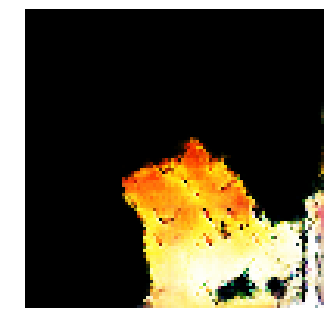


Epoch: 24920, D: -6.616, G: 4.351
Epoch: 24921, D: -6.309, G: 4.308
Epoch: 24922, D: -6.708, G: 4.351
Epoch: 24923, D: -6.784, G: 4.58
Epoch: 24924, D: -5.215, G: 5.472
Epoch: 24925, D: -6.172, G: 3.087
Epoch: 24926, D: -5.354, G: 2.804
Epoch: 24927, D: -5.545, G: 3.398
Epoch: 24928, D: -5.492, G: 2.027
Epoch: 24929, D: -6.524, G: 3.889
Epoch: 24930, D: -6.461, G: 3.452
Epoch: 24931, D: -5.852, G: 3.404
Epoch: 24932, D: -6.229, G: 3.637
Epoch: 24933, D: -5.925, G: 3.006
Epoch: 24934, D: -5.922, G: 4.649
Epoch: 24935, D: -5.979, G: 5.713
Epoch: 24936, D: -5.413, G: 4.442
Epoch: 24937, D: -5.41, G: 5.787
Epoch: 24938, D: -6.599, G: 3.523
Epoch: 24939, D: -5.454, G: 3.909


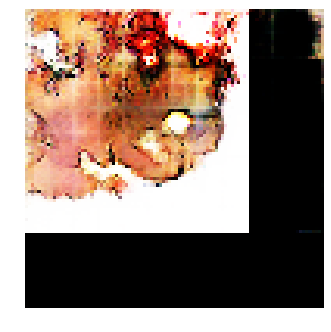


Epoch: 24940, D: -5.691, G: 4.549
Epoch: 24941, D: -5.46, G: 3.949
Epoch: 24942, D: -6.23, G: 6.582
Epoch: 24943, D: -6.639, G: 3.072
Epoch: 24944, D: -5.875, G: 5.674
Epoch: 24945, D: -5.551, G: 1.76
Epoch: 24946, D: -6.028, G: 3.656
Epoch: 24947, D: -6.11, G: 2.668
Epoch: 24948, D: -5.293, G: 3.128
Epoch: 24949, D: -6.609, G: 5.838
Epoch: 24950, D: -4.754, G: 4.538
Epoch: 24951, D: -7.29, G: 5.429
Epoch: 24952, D: -5.716, G: 1.664
Epoch: 24953, D: -4.75, G: 4.617
Epoch: 24954, D: -6.633, G: 3.408
Epoch: 24955, D: -5.966, G: 2.243
Epoch: 24956, D: -6.185, G: 3.746
Epoch: 24957, D: -6.356, G: 3.778
Epoch: 24958, D: -5.567, G: 4.059
Epoch: 24959, D: -5.47, G: 3.081


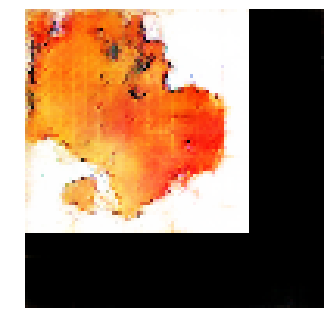


Epoch: 24960, D: -6.879, G: 5.46
Epoch: 24961, D: -5.806, G: 5.011
Epoch: 24962, D: -4.863, G: 4.143
Epoch: 24963, D: -5.664, G: 5.107
Epoch: 24964, D: -6.45, G: 2.478
Epoch: 24965, D: -6.489, G: 2.553
Epoch: 24966, D: -6.543, G: 4.339
Epoch: 24967, D: -5.661, G: 3.156
Epoch: 24968, D: -6.821, G: 3.498
Epoch: 24969, D: -4.72, G: 3.676
Epoch: 24970, D: -6.147, G: 2.119
Epoch: 24971, D: -6.146, G: 3.922
Epoch: 24972, D: -5.551, G: 3.025
Epoch: 24973, D: -5.763, G: 3.887
Epoch: 24974, D: -6.668, G: 4.737
Epoch: 24975, D: -6.039, G: 2.401
Epoch: 24976, D: -5.407, G: 5.24
Epoch: 24977, D: -5.111, G: 4.72
Epoch: 24978, D: -6.895, G: 2.543
Epoch: 24979, D: -5.942, G: 2.265


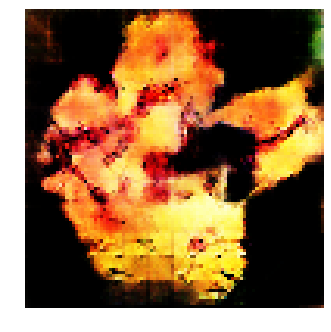


Epoch: 24980, D: -5.447, G: 3.971
Epoch: 24981, D: -6.469, G: 3.602
Epoch: 24982, D: -6.796, G: 6.0
Epoch: 24983, D: -4.522, G: 4.97
Epoch: 24984, D: -6.277, G: 3.656
Epoch: 24985, D: -6.998, G: 2.912
Epoch: 24986, D: -4.999, G: 3.48
Epoch: 24987, D: -6.445, G: 3.151
Epoch: 24988, D: -6.419, G: 3.495
Epoch: 24989, D: -6.591, G: 3.76
Epoch: 24990, D: -5.861, G: 2.88
Epoch: 24991, D: -6.263, G: 4.405
Epoch: 24992, D: -6.1, G: 4.778
Epoch: 24993, D: -6.587, G: 2.163
Epoch: 24994, D: -6.668, G: 2.625
Epoch: 24995, D: -6.291, G: 2.39
Epoch: 24996, D: -6.151, G: 2.865
Epoch: 24997, D: -5.564, G: 4.791
Epoch: 24998, D: -6.018, G: 4.253
Epoch: 24999, D: -6.492, G: 4.833


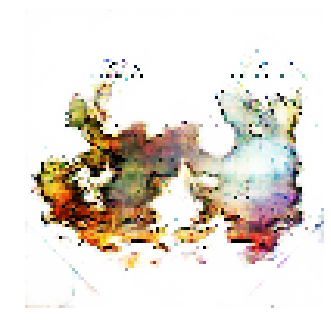


Epoch: 25000, D: -7.029, G: 4.38
Epoch: 25001, D: -5.593, G: 3.536
Epoch: 25002, D: -5.666, G: 4.864
Epoch: 25003, D: -7.796, G: 2.239
Epoch: 25004, D: -5.443, G: 2.847
Epoch: 25005, D: -6.625, G: 4.185
Epoch: 25006, D: -5.812, G: 2.818
Epoch: 25007, D: -5.302, G: 3.496
Epoch: 25008, D: -5.51, G: 3.17
Epoch: 25009, D: -6.004, G: 2.351
Epoch: 25010, D: -5.979, G: 4.073
Epoch: 25011, D: -4.9, G: 3.915
Epoch: 25012, D: -6.191, G: 4.235
Epoch: 25013, D: -5.114, G: 3.109
Epoch: 25014, D: -5.72, G: 6.03
Epoch: 25015, D: -6.105, G: 3.611
Epoch: 25016, D: -5.462, G: 2.532
Epoch: 25017, D: -6.924, G: 4.388
Epoch: 25018, D: -6.21, G: 5.951
Epoch: 25019, D: -4.889, G: 4.584


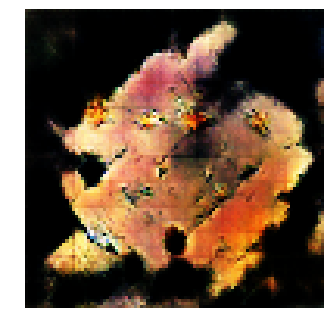


Epoch: 25020, D: -4.209, G: 4.307
Epoch: 25021, D: -5.926, G: 4.166
Epoch: 25022, D: -6.849, G: 3.252
Epoch: 25023, D: -5.979, G: 4.331
Epoch: 25024, D: -5.091, G: 3.512
Epoch: 25025, D: -4.968, G: 4.343
Epoch: 25026, D: -6.778, G: 3.889
Epoch: 25027, D: -7.129, G: 3.306
Epoch: 25028, D: -5.724, G: 2.844
Epoch: 25029, D: -5.162, G: 4.209
Epoch: 25030, D: -7.146, G: 3.013
Epoch: 25031, D: -5.411, G: 4.034
Epoch: 25032, D: -5.886, G: 4.389
Epoch: 25033, D: -5.388, G: 7.123
Epoch: 25034, D: -6.976, G: 7.135
Epoch: 25035, D: -5.416, G: 3.733
Epoch: 25036, D: -7.002, G: 2.636
Epoch: 25037, D: -7.444, G: 3.183
Epoch: 25038, D: -5.496, G: 3.474
Epoch: 25039, D: -5.659, G: 4.563


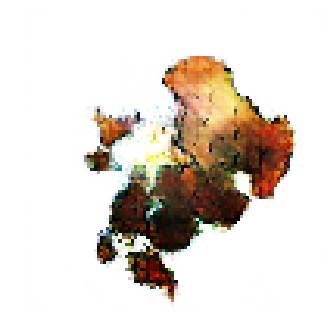


Epoch: 25040, D: -6.339, G: 3.633
Epoch: 25041, D: -7.266, G: 2.662
Epoch: 25042, D: -6.132, G: 3.1
Epoch: 25043, D: -6.276, G: 4.391
Epoch: 25044, D: -5.739, G: 4.604
Epoch: 25045, D: -6.137, G: 4.764
Epoch: 25046, D: -6.091, G: 3.6
Epoch: 25047, D: -6.145, G: 3.643
Epoch: 25048, D: -5.317, G: 2.63
Epoch: 25049, D: -5.878, G: 3.509
Epoch: 25050, D: -5.914, G: 2.388
Epoch: 25051, D: -6.158, G: 3.715
Epoch: 25052, D: -6.123, G: 3.28
Epoch: 25053, D: -4.827, G: 5.78
Epoch: 25054, D: -5.835, G: 4.919
Epoch: 25055, D: -5.37, G: 1.58
Epoch: 25056, D: -6.309, G: 1.953
Epoch: 25057, D: -5.786, G: 2.63
Epoch: 25058, D: -5.72, G: 4.144
Epoch: 25059, D: -7.053, G: 2.383


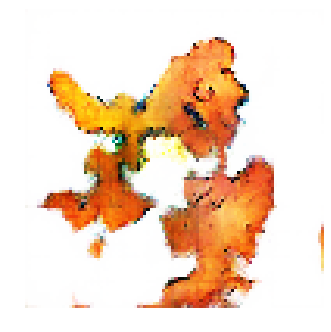


Epoch: 25060, D: -5.023, G: 3.431
Epoch: 25061, D: -4.927, G: 4.199
Epoch: 25062, D: -6.073, G: 2.798
Epoch: 25063, D: -5.655, G: 3.778
Epoch: 25064, D: -6.354, G: 2.223
Epoch: 25065, D: -8.943, G: 3.827
Epoch: 25066, D: -4.873, G: 2.911
Epoch: 25067, D: -6.126, G: 2.687
Epoch: 25068, D: -6.957, G: 5.249
Epoch: 25069, D: -5.838, G: 3.503
Epoch: 25070, D: -6.637, G: 3.963
Epoch: 25071, D: -6.944, G: 3.738
Epoch: 25072, D: -6.191, G: 5.999
Epoch: 25073, D: -6.625, G: 3.944
Epoch: 25074, D: -5.777, G: 5.643
Epoch: 25075, D: -6.404, G: 2.989
Epoch: 25076, D: -7.061, G: 6.907
Epoch: 25077, D: -6.024, G: 5.679
Epoch: 25078, D: -5.828, G: 4.548
Epoch: 25079, D: -6.616, G: 5.282


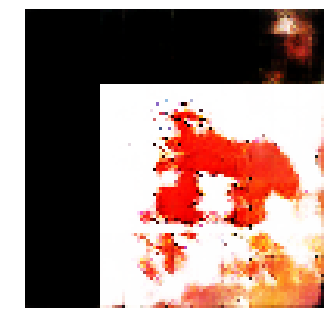


Epoch: 25080, D: -7.098, G: 6.166
Epoch: 25081, D: -6.447, G: 3.467
Epoch: 25082, D: -7.302, G: 3.584
Epoch: 25083, D: -6.899, G: 3.61
Epoch: 25084, D: -7.299, G: 4.089
Epoch: 25085, D: -6.838, G: 6.076
Epoch: 25086, D: -7.607, G: 4.354
Epoch: 25087, D: -4.705, G: 5.95
Epoch: 25088, D: -6.277, G: 4.887
Epoch: 25089, D: -6.719, G: 3.861
Epoch: 25090, D: -6.001, G: 2.08
Epoch: 25091, D: -5.268, G: 3.217
Epoch: 25092, D: -4.988, G: 3.825
Epoch: 25093, D: -6.225, G: 1.273
Epoch: 25094, D: -5.279, G: 3.913
Epoch: 25095, D: -7.586, G: 3.962
Epoch: 25096, D: -4.812, G: 5.36
Epoch: 25097, D: -3.878, G: 2.531
Epoch: 25098, D: -7.311, G: 5.385
Epoch: 25099, D: -4.95, G: 3.346


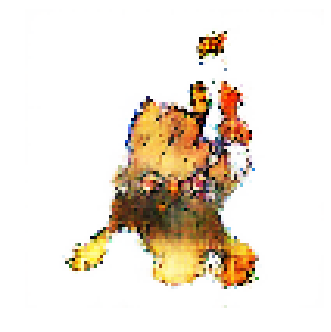


Epoch: 25100, D: -6.664, G: 4.123
Epoch: 25101, D: -5.722, G: 5.558
Epoch: 25102, D: -7.266, G: 4.109
Epoch: 25103, D: -6.649, G: 4.498
Epoch: 25104, D: -5.875, G: 3.519
Epoch: 25105, D: -5.562, G: 3.347
Epoch: 25106, D: -6.43, G: 1.819
Epoch: 25107, D: -7.917, G: 4.193
Epoch: 25108, D: -7.405, G: 4.716
Epoch: 25109, D: -6.375, G: 4.15
Epoch: 25110, D: -5.749, G: 4.076
Epoch: 25111, D: -7.158, G: 5.564
Epoch: 25112, D: -5.939, G: 5.042
Epoch: 25113, D: -6.82, G: 2.68
Epoch: 25114, D: -6.003, G: 1.98
Epoch: 25115, D: -5.933, G: 3.508
Epoch: 25116, D: -6.831, G: 3.348
Epoch: 25117, D: -6.281, G: 1.568
Epoch: 25118, D: -6.198, G: 4.138
Epoch: 25119, D: -5.193, G: 5.591


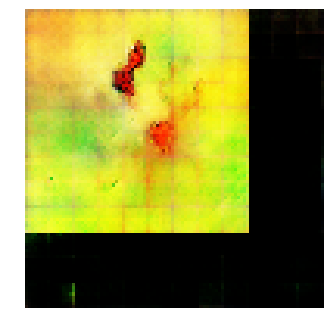


Epoch: 25120, D: -4.295, G: 3.526
Epoch: 25121, D: -6.396, G: 3.849
Epoch: 25122, D: -6.856, G: 3.177
Epoch: 25123, D: -8.094, G: 2.177
Epoch: 25124, D: -5.696, G: 1.804
Epoch: 25125, D: -4.611, G: 4.83
Epoch: 25126, D: -6.403, G: 5.594
Epoch: 25127, D: -6.127, G: 3.598
Epoch: 25128, D: -5.857, G: 4.713
Epoch: 25129, D: -6.493, G: 0.7872
Epoch: 25130, D: -6.63, G: 2.682
Epoch: 25131, D: -5.233, G: 3.264
Epoch: 25132, D: -5.004, G: 4.888
Epoch: 25133, D: -6.795, G: 4.795
Epoch: 25134, D: -6.542, G: 4.049
Epoch: 25135, D: -5.063, G: 4.689
Epoch: 25136, D: -6.291, G: 3.223
Epoch: 25137, D: -5.994, G: 3.51
Epoch: 25138, D: -6.481, G: 3.957
Epoch: 25139, D: -5.783, G: 3.757


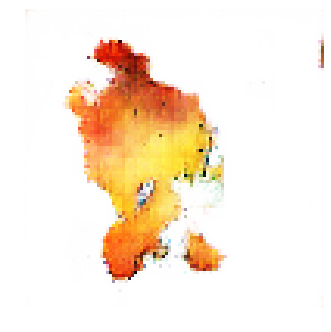


Epoch: 25140, D: -6.508, G: 3.378
Epoch: 25141, D: -5.635, G: 2.958
Epoch: 25142, D: -8.226, G: 3.723
Epoch: 25143, D: -7.513, G: 3.274
Epoch: 25144, D: -7.577, G: 1.645
Epoch: 25145, D: -7.102, G: 4.905
Epoch: 25146, D: -5.459, G: 4.993
Epoch: 25147, D: -5.737, G: 3.196
Epoch: 25148, D: -5.08, G: 2.953
Epoch: 25149, D: -5.577, G: 3.596
Epoch: 25150, D: -5.396, G: 5.641
Epoch: 25151, D: -4.935, G: 3.628
Epoch: 25152, D: -5.25, G: 3.37
Epoch: 25153, D: -5.776, G: 3.785
Epoch: 25154, D: -4.724, G: 3.406
Epoch: 25155, D: -6.73, G: 2.452
Epoch: 25156, D: -5.649, G: 3.049
Epoch: 25157, D: -6.582, G: 2.127
Epoch: 25158, D: -5.053, G: 3.886
Epoch: 25159, D: -5.493, G: 7.545


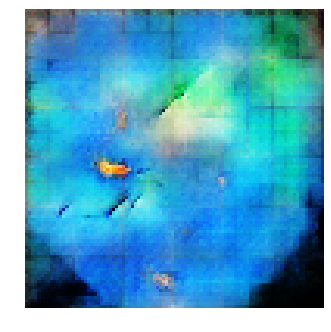


Epoch: 25160, D: -6.307, G: 3.41
Epoch: 25161, D: -7.274, G: 3.957
Epoch: 25162, D: -6.655, G: 1.59
Epoch: 25163, D: -6.195, G: 4.254
Epoch: 25164, D: -6.036, G: 6.065
Epoch: 25165, D: -5.986, G: 2.373
Epoch: 25166, D: -5.923, G: 2.219
Epoch: 25167, D: -5.853, G: 4.919
Epoch: 25168, D: -5.679, G: 4.307
Epoch: 25169, D: -5.328, G: 3.474
Epoch: 25170, D: -5.374, G: 3.706
Epoch: 25171, D: -5.801, G: 5.9
Epoch: 25172, D: -5.19, G: 4.494
Epoch: 25173, D: -7.012, G: 5.386
Epoch: 25174, D: -5.142, G: 4.077
Epoch: 25175, D: -6.174, G: 3.026
Epoch: 25176, D: -6.298, G: 4.204
Epoch: 25177, D: -6.358, G: 1.789
Epoch: 25178, D: -7.398, G: 3.284
Epoch: 25179, D: -6.284, G: 3.007


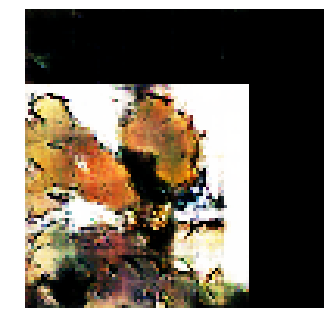


Epoch: 25180, D: -6.365, G: 4.568
Epoch: 25181, D: -4.627, G: 5.08
Epoch: 25182, D: -5.637, G: 5.499
Epoch: 25183, D: -6.308, G: 5.904
Epoch: 25184, D: -6.454, G: 5.76
Epoch: 25185, D: -5.668, G: 4.317
Epoch: 25186, D: -5.634, G: 4.143
Epoch: 25187, D: -6.979, G: 5.634
Epoch: 25188, D: -6.844, G: 4.52
Epoch: 25189, D: -4.923, G: 4.986
Epoch: 25190, D: -5.254, G: 3.029
Epoch: 25191, D: -5.579, G: 1.857
Epoch: 25192, D: -5.512, G: 4.502
Epoch: 25193, D: -8.278, G: 4.285
Epoch: 25194, D: -5.355, G: 4.424
Epoch: 25195, D: -7.681, G: 5.58
Epoch: 25196, D: -5.413, G: 2.678
Epoch: 25197, D: -5.073, G: 4.999
Epoch: 25198, D: -5.512, G: 3.912
Epoch: 25199, D: -5.85, G: 7.213


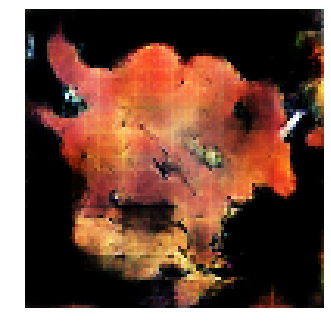


Epoch: 25200, D: -4.767, G: 3.358
Epoch: 25201, D: -6.616, G: 4.7
Epoch: 25202, D: -4.746, G: 4.346
Epoch: 25203, D: -6.21, G: 2.695
Epoch: 25204, D: -5.106, G: 5.135
Epoch: 25205, D: -3.281, G: 6.264
Epoch: 25206, D: -5.794, G: 5.554
Epoch: 25207, D: -6.15, G: 3.851
Epoch: 25208, D: -6.318, G: 4.238
Epoch: 25209, D: -4.289, G: 4.908
Epoch: 25210, D: -6.275, G: 3.628
Epoch: 25211, D: -5.63, G: 4.003
Epoch: 25212, D: -6.589, G: 4.595
Epoch: 25213, D: -5.585, G: 3.331
Epoch: 25214, D: -5.771, G: 2.86
Epoch: 25215, D: -4.763, G: 4.042
Epoch: 25216, D: -6.089, G: 5.218
Epoch: 25217, D: -5.412, G: 7.077
Epoch: 25218, D: -5.431, G: 2.373
Epoch: 25219, D: -5.379, G: 3.909


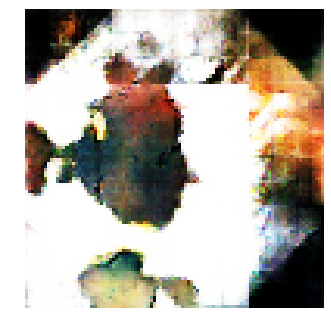


Epoch: 25220, D: -4.4, G: 3.384
Epoch: 25221, D: -5.409, G: 3.447
Epoch: 25222, D: -6.463, G: 4.665
Epoch: 25223, D: -6.223, G: 6.036
Epoch: 25224, D: -7.26, G: 4.636
Epoch: 25225, D: -5.993, G: 4.323
Epoch: 25226, D: -5.329, G: 2.902
Epoch: 25227, D: -6.446, G: 3.651
Epoch: 25228, D: -7.157, G: 3.614
Epoch: 25229, D: -7.281, G: 2.975
Epoch: 25230, D: -6.777, G: 3.545
Epoch: 25231, D: -6.381, G: 3.027
Epoch: 25232, D: -6.004, G: 4.153
Epoch: 25233, D: -7.313, G: 5.069
Epoch: 25234, D: -5.747, G: 2.893
Epoch: 25235, D: -6.306, G: 4.07
Epoch: 25236, D: -6.704, G: 4.527
Epoch: 25237, D: -5.964, G: 3.331
Epoch: 25238, D: -5.333, G: 6.397
Epoch: 25239, D: -5.73, G: 5.998


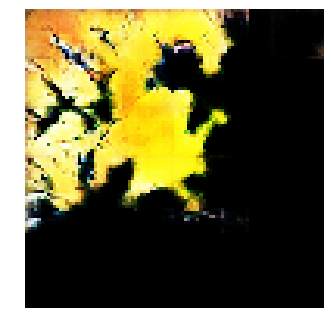


Epoch: 25240, D: -6.342, G: 5.907
Epoch: 25241, D: -5.22, G: 6.04
Epoch: 25242, D: -6.572, G: 4.014
Epoch: 25243, D: -6.609, G: 2.394
Epoch: 25244, D: -6.564, G: 5.518
Epoch: 25245, D: -5.342, G: 3.73
Epoch: 25246, D: -5.103, G: 2.225
Epoch: 25247, D: -4.987, G: 3.358
Epoch: 25248, D: -5.116, G: 2.912
Epoch: 25249, D: -5.751, G: 3.433
Epoch: 25250, D: -6.809, G: 2.86
Epoch: 25251, D: -6.256, G: 2.475
Epoch: 25252, D: -6.536, G: 5.375
Epoch: 25253, D: -5.75, G: 5.429
Epoch: 25254, D: -5.948, G: 3.14
Epoch: 25255, D: -5.283, G: 3.647
Epoch: 25256, D: -4.172, G: 3.619
Epoch: 25257, D: -6.701, G: 4.966
Epoch: 25258, D: -4.918, G: 3.484
Epoch: 25259, D: -6.598, G: 4.382


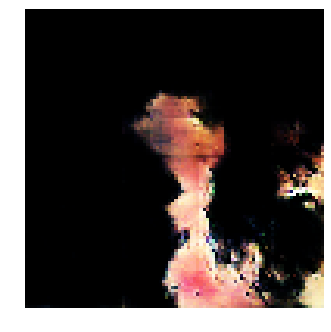


Epoch: 25260, D: -6.27, G: 5.994
Epoch: 25261, D: -5.38, G: 5.372
Epoch: 25262, D: -4.28, G: 3.413
Epoch: 25263, D: -5.912, G: 4.533
Epoch: 25264, D: -6.282, G: 4.341
Epoch: 25265, D: -5.325, G: 5.85
Epoch: 25266, D: -5.024, G: 5.362
Epoch: 25267, D: -5.639, G: 2.971
Epoch: 25268, D: -6.725, G: 1.618
Epoch: 25269, D: -5.694, G: 2.861
Epoch: 25270, D: -5.212, G: 3.662
Epoch: 25271, D: -6.145, G: 3.429
Epoch: 25272, D: -7.5, G: 2.813
Epoch: 25273, D: -6.281, G: 5.037
Epoch: 25274, D: -5.762, G: 7.45
Epoch: 25275, D: -6.984, G: 2.965
Epoch: 25276, D: -6.102, G: 4.391
Epoch: 25277, D: -6.314, G: 2.771
Epoch: 25278, D: -7.098, G: 3.133
Epoch: 25279, D: -6.284, G: 1.416


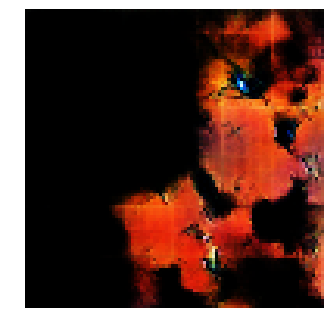


Epoch: 25280, D: -5.218, G: 5.136
Epoch: 25281, D: -6.61, G: 1.085
Epoch: 25282, D: -4.943, G: 3.951
Epoch: 25283, D: -6.378, G: 4.494
Epoch: 25284, D: -5.777, G: 4.147
Epoch: 25285, D: -4.651, G: 3.141
Epoch: 25286, D: -6.318, G: 4.699
Epoch: 25287, D: -5.171, G: 3.76
Epoch: 25288, D: -6.56, G: 3.296
Epoch: 25289, D: -6.35, G: 4.251
Epoch: 25290, D: -7.255, G: 1.531
Epoch: 25291, D: -7.58, G: 1.997
Epoch: 25292, D: -5.978, G: 3.414
Epoch: 25293, D: -7.613, G: 1.009
Epoch: 25294, D: -5.365, G: 4.024
Epoch: 25295, D: -4.8, G: 3.496
Epoch: 25296, D: -5.867, G: 3.403
Epoch: 25297, D: -5.872, G: 3.117
Epoch: 25298, D: -5.178, G: 3.581
Epoch: 25299, D: -6.711, G: 3.956


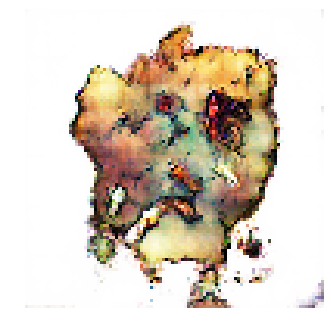


Epoch: 25300, D: -4.823, G: 1.501
Epoch: 25301, D: -7.658, G: 4.106
Epoch: 25302, D: -6.292, G: 3.209
Epoch: 25303, D: -6.889, G: 3.272
Epoch: 25304, D: -6.333, G: 2.408
Epoch: 25305, D: -7.547, G: 3.525
Epoch: 25306, D: -5.405, G: 2.961
Epoch: 25307, D: -5.193, G: 4.18
Epoch: 25308, D: -6.623, G: 3.794
Epoch: 25309, D: -6.126, G: 4.717
Epoch: 25310, D: -6.747, G: 6.221
Epoch: 25311, D: -5.53, G: 2.431
Epoch: 25312, D: -5.2, G: 4.515
Epoch: 25313, D: -5.754, G: 3.563
Epoch: 25314, D: -5.56, G: 6.035
Epoch: 25315, D: -4.543, G: 3.679
Epoch: 25316, D: -5.472, G: 3.366
Epoch: 25317, D: -5.235, G: 4.203
Epoch: 25318, D: -5.581, G: 5.02
Epoch: 25319, D: -5.413, G: 3.939


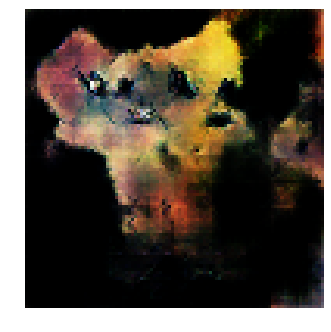


Epoch: 25320, D: -7.315, G: 4.376
Epoch: 25321, D: -6.327, G: 3.839
Epoch: 25322, D: -6.124, G: 2.552
Epoch: 25323, D: -5.96, G: 3.651
Epoch: 25324, D: -5.156, G: 4.632
Epoch: 25325, D: -6.618, G: 3.593
Epoch: 25326, D: -4.814, G: 2.422
Epoch: 25327, D: -5.938, G: 3.755
Epoch: 25328, D: -6.548, G: 3.338
Epoch: 25329, D: -6.423, G: 3.241
Epoch: 25330, D: -5.096, G: 2.484
Epoch: 25331, D: -5.942, G: 4.865
Epoch: 25332, D: -5.964, G: 4.511
Epoch: 25333, D: -7.828, G: 5.276
Epoch: 25334, D: -6.53, G: 1.194
Epoch: 25335, D: -5.624, G: 2.352
Epoch: 25336, D: -6.617, G: 2.181
Epoch: 25337, D: -6.057, G: 4.457
Epoch: 25338, D: -7.226, G: 2.544
Epoch: 25339, D: -6.813, G: 4.577


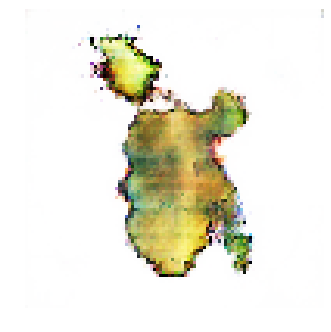


Epoch: 25340, D: -6.802, G: 4.531
Epoch: 25341, D: -4.42, G: 5.139
Epoch: 25342, D: -6.052, G: 2.978
Epoch: 25343, D: -5.827, G: 2.049
Epoch: 25344, D: -6.979, G: 3.664
Epoch: 25345, D: -5.486, G: 4.811
Epoch: 25346, D: -6.298, G: 5.939
Epoch: 25347, D: -5.702, G: 3.668
Epoch: 25348, D: -7.745, G: 3.51
Epoch: 25349, D: -6.029, G: 4.693
Epoch: 25350, D: -4.51, G: 3.919
Epoch: 25351, D: -6.335, G: 3.919
Epoch: 25352, D: -7.235, G: 4.475
Epoch: 25353, D: -7.244, G: 2.291
Epoch: 25354, D: -5.655, G: 3.55
Epoch: 25355, D: -5.624, G: 3.017
Epoch: 25356, D: -5.55, G: 3.269
Epoch: 25357, D: -6.993, G: 3.638
Epoch: 25358, D: -4.503, G: 4.041
Epoch: 25359, D: -6.514, G: 5.385


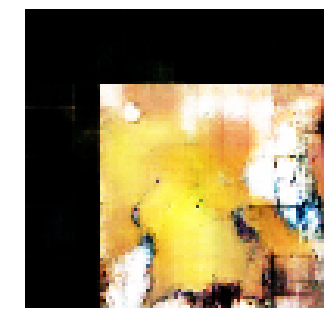


Epoch: 25360, D: -5.954, G: 3.616
Epoch: 25361, D: -7.215, G: 4.958
Epoch: 25362, D: -5.886, G: 2.419
Epoch: 25363, D: -4.715, G: 4.884
Epoch: 25364, D: -4.693, G: 4.959
Epoch: 25365, D: -5.727, G: 4.156
Epoch: 25366, D: -5.725, G: 4.659
Epoch: 25367, D: -7.437, G: 5.48
Epoch: 25368, D: -6.637, G: 1.823
Epoch: 25369, D: -6.111, G: 4.562
Epoch: 25370, D: -6.681, G: 4.49
Epoch: 25371, D: -5.848, G: 5.097
Epoch: 25372, D: -6.004, G: 3.684
Epoch: 25373, D: -6.636, G: 2.535
Epoch: 25374, D: -6.773, G: 5.333
Epoch: 25375, D: -6.236, G: 3.534
Epoch: 25376, D: -5.562, G: 3.96
Epoch: 25377, D: -7.385, G: 4.419
Epoch: 25378, D: -7.419, G: 3.336
Epoch: 25379, D: -6.74, G: 4.666


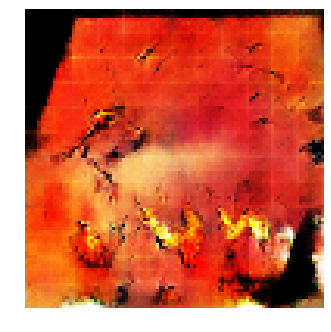


Epoch: 25380, D: -5.276, G: 4.251
Epoch: 25381, D: -5.636, G: 3.242
Epoch: 25382, D: -5.072, G: 3.033
Epoch: 25383, D: -6.856, G: 5.547
Epoch: 25384, D: -5.812, G: 3.453
Epoch: 25385, D: -6.462, G: 2.512
Epoch: 25386, D: -6.013, G: 5.383
Epoch: 25387, D: -6.756, G: 3.615
Epoch: 25388, D: -5.929, G: 0.8581
Epoch: 25389, D: -5.983, G: 3.671
Epoch: 25390, D: -5.429, G: 4.746
Epoch: 25391, D: -5.439, G: 3.958
Epoch: 25392, D: -7.094, G: 3.425
Epoch: 25393, D: -6.693, G: 3.723
Epoch: 25394, D: -6.194, G: 2.017
Epoch: 25395, D: -6.177, G: 2.031
Epoch: 25396, D: -7.365, G: 3.205
Epoch: 25397, D: -7.06, G: 3.064
Epoch: 25398, D: -6.875, G: 4.745
Epoch: 25399, D: -6.185, G: 2.903


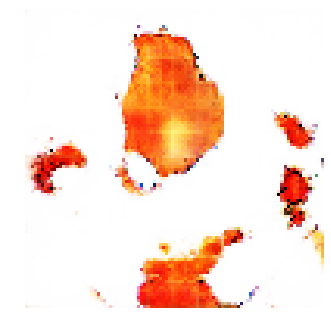


Epoch: 25400, D: -5.584, G: 5.32
Epoch: 25401, D: -6.973, G: 3.127
Epoch: 25402, D: -6.531, G: 6.1
Epoch: 25403, D: -6.622, G: 3.957
Epoch: 25404, D: -5.735, G: 5.246
Epoch: 25405, D: -4.895, G: 3.262
Epoch: 25406, D: -7.237, G: 3.723
Epoch: 25407, D: -7.527, G: 4.327
Epoch: 25408, D: -6.057, G: 3.183
Epoch: 25409, D: -4.51, G: 4.473
Epoch: 25410, D: -6.303, G: 5.203
Epoch: 25411, D: -5.751, G: 4.073
Epoch: 25412, D: -6.685, G: 3.296
Epoch: 25413, D: -4.275, G: 4.097
Epoch: 25414, D: -5.407, G: 4.831
Epoch: 25415, D: -6.595, G: 4.544
Epoch: 25416, D: -6.831, G: 2.66
Epoch: 25417, D: -5.756, G: 4.988
Epoch: 25418, D: -6.446, G: 6.606
Epoch: 25419, D: -6.015, G: 3.608


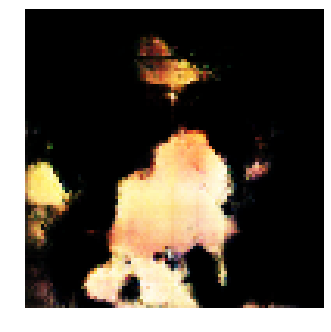


Epoch: 25420, D: -5.402, G: 3.472
Epoch: 25421, D: -5.594, G: 4.253
Epoch: 25422, D: -5.441, G: 4.535
Epoch: 25423, D: -5.02, G: 3.678
Epoch: 25424, D: -5.983, G: 3.798
Epoch: 25425, D: -6.796, G: 5.353
Epoch: 25426, D: -7.203, G: 3.433
Epoch: 25427, D: -6.382, G: 4.726
Epoch: 25428, D: -6.0, G: 3.369
Epoch: 25429, D: -4.712, G: 4.838
Epoch: 25430, D: -6.905, G: 5.911
Epoch: 25431, D: -6.372, G: 3.04
Epoch: 25432, D: -5.644, G: 3.815
Epoch: 25433, D: -6.161, G: 2.82
Epoch: 25434, D: -5.458, G: 6.347
Epoch: 25435, D: -5.111, G: 3.635
Epoch: 25436, D: -4.823, G: 3.979
Epoch: 25437, D: -4.923, G: 2.267
Epoch: 25438, D: -5.423, G: 2.58
Epoch: 25439, D: -7.405, G: 5.409


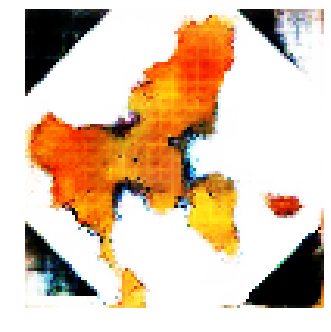


Epoch: 25440, D: -5.551, G: 4.935
Epoch: 25441, D: -5.56, G: 3.895
Epoch: 25442, D: -5.891, G: 3.241
Epoch: 25443, D: -5.634, G: 5.409
Epoch: 25444, D: -6.323, G: 3.087
Epoch: 25445, D: -6.252, G: 2.797
Epoch: 25446, D: -4.729, G: 2.089
Epoch: 25447, D: -5.681, G: 2.923
Epoch: 25448, D: -5.955, G: 4.042
Epoch: 25449, D: -5.5, G: 1.696
Epoch: 25450, D: -6.648, G: 3.543
Epoch: 25451, D: -5.576, G: 2.121
Epoch: 25452, D: -5.779, G: 4.184
Epoch: 25453, D: -6.351, G: 4.368
Epoch: 25454, D: -6.46, G: 5.711
Epoch: 25455, D: -7.647, G: 5.109
Epoch: 25456, D: -4.788, G: 2.142
Epoch: 25457, D: -6.528, G: 3.456
Epoch: 25458, D: -5.024, G: 1.966
Epoch: 25459, D: -6.026, G: 2.843


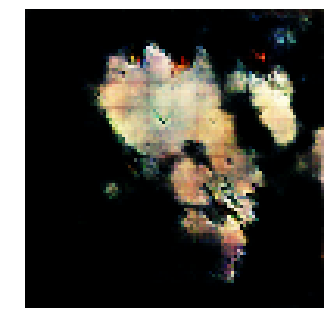


Epoch: 25460, D: -6.526, G: 4.586
Epoch: 25461, D: -6.077, G: 3.735
Epoch: 25462, D: -5.008, G: 3.866
Epoch: 25463, D: -5.851, G: 4.672
Epoch: 25464, D: -8.421, G: 2.712
Epoch: 25465, D: -5.48, G: 2.366
Epoch: 25466, D: -5.532, G: 2.454
Epoch: 25467, D: -5.339, G: 4.671
Epoch: 25468, D: -6.683, G: 0.7439
Epoch: 25469, D: -5.071, G: 3.902
Epoch: 25470, D: -7.345, G: 5.206
Epoch: 25471, D: -7.914, G: 1.941
Epoch: 25472, D: -4.796, G: 2.258
Epoch: 25473, D: -5.427, G: 4.848
Epoch: 25474, D: -5.381, G: 3.471
Epoch: 25475, D: -5.423, G: 4.23
Epoch: 25476, D: -6.348, G: 2.403
Epoch: 25477, D: -5.172, G: 4.484
Epoch: 25478, D: -5.488, G: 4.854
Epoch: 25479, D: -5.222, G: 2.082


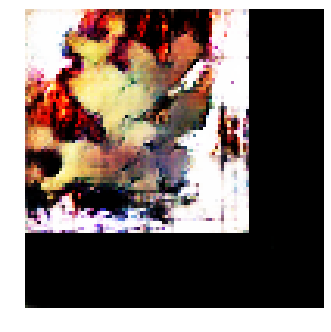


Epoch: 25480, D: -5.669, G: 4.902
Epoch: 25481, D: -6.201, G: 3.549
Epoch: 25482, D: -6.524, G: 2.593
Epoch: 25483, D: -5.936, G: 4.23
Epoch: 25484, D: -5.427, G: 5.117
Epoch: 25485, D: -5.224, G: 4.881
Epoch: 25486, D: -5.618, G: 4.432
Epoch: 25487, D: -5.632, G: 4.281
Epoch: 25488, D: -5.492, G: 3.121
Epoch: 25489, D: -6.266, G: 3.738
Epoch: 25490, D: -6.286, G: 2.946
Epoch: 25491, D: -7.761, G: 1.979
Epoch: 25492, D: -5.595, G: 3.598
Epoch: 25493, D: -5.771, G: 4.327
Epoch: 25494, D: -6.808, G: 4.922
Epoch: 25495, D: -6.818, G: 3.623
Epoch: 25496, D: -6.571, G: 3.347
Epoch: 25497, D: -5.059, G: 2.917
Epoch: 25498, D: -6.128, G: 4.148
Epoch: 25499, D: -7.03, G: 3.804


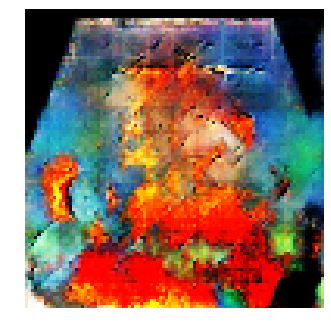


Epoch: 25500, D: -6.448, G: 4.974
Epoch: 25501, D: -5.249, G: 4.415
Epoch: 25502, D: -4.843, G: 3.042
Epoch: 25503, D: -6.869, G: 3.048
Epoch: 25504, D: -7.056, G: 3.898
Epoch: 25505, D: -5.976, G: 4.976
Epoch: 25506, D: -5.139, G: 2.886
Epoch: 25507, D: -5.588, G: 4.897
Epoch: 25508, D: -5.576, G: 3.626
Epoch: 25509, D: -5.662, G: 5.102
Epoch: 25510, D: -8.72, G: 6.088
Epoch: 25511, D: -6.551, G: 2.095
Epoch: 25512, D: -6.466, G: 3.244
Epoch: 25513, D: -6.802, G: 2.975
Epoch: 25514, D: -6.277, G: 4.487
Epoch: 25515, D: -7.512, G: 5.626
Epoch: 25516, D: -4.623, G: 3.764
Epoch: 25517, D: -5.761, G: 6.089
Epoch: 25518, D: -6.844, G: 3.182
Epoch: 25519, D: -6.439, G: 3.958


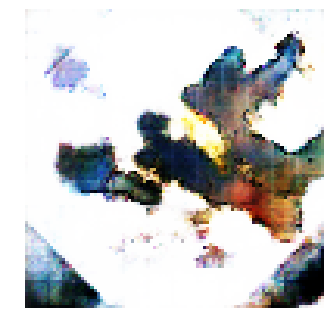


Epoch: 25520, D: -5.045, G: 4.427
Epoch: 25521, D: -7.294, G: 4.84
Epoch: 25522, D: -6.15, G: 3.911
Epoch: 25523, D: -6.97, G: 3.569
Epoch: 25524, D: -5.02, G: 2.577
Epoch: 25525, D: -6.617, G: 3.217
Epoch: 25526, D: -4.607, G: 5.297
Epoch: 25527, D: -6.009, G: 4.758
Epoch: 25528, D: -6.507, G: 2.638
Epoch: 25529, D: -6.497, G: 2.763
Epoch: 25530, D: -5.449, G: 3.953
Epoch: 25531, D: -6.961, G: 4.579
Epoch: 25532, D: -6.112, G: 3.937
Epoch: 25533, D: -6.471, G: 4.993
Epoch: 25534, D: -6.557, G: 4.533
Epoch: 25535, D: -5.65, G: 4.359
Epoch: 25536, D: -5.8, G: 5.601
Epoch: 25537, D: -5.433, G: 3.026
Epoch: 25538, D: -4.409, G: 3.146
Epoch: 25539, D: -5.413, G: 5.67


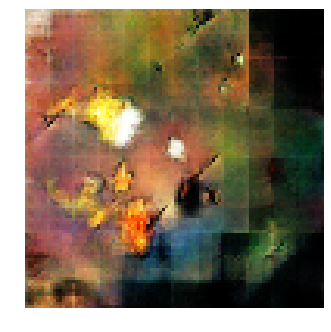


Epoch: 25540, D: -6.428, G: 3.101
Epoch: 25541, D: -5.043, G: 4.666
Epoch: 25542, D: -6.282, G: 4.766
Epoch: 25543, D: -5.285, G: 3.67
Epoch: 25544, D: -6.246, G: 4.497
Epoch: 25545, D: -7.646, G: 4.1
Epoch: 25546, D: -6.384, G: 2.229
Epoch: 25547, D: -6.253, G: 1.99
Epoch: 25548, D: -5.888, G: 4.968
Epoch: 25549, D: -5.522, G: 1.44
Epoch: 25550, D: -6.823, G: 4.098
Epoch: 25551, D: -6.061, G: 3.028
Epoch: 25552, D: -5.457, G: 4.46
Epoch: 25553, D: -5.953, G: 2.616
Epoch: 25554, D: -6.52, G: 2.146
Epoch: 25555, D: -7.769, G: 2.8
Epoch: 25556, D: -5.757, G: 4.884
Epoch: 25557, D: -6.992, G: 4.459
Epoch: 25558, D: -5.644, G: 4.021
Epoch: 25559, D: -5.747, G: 5.442


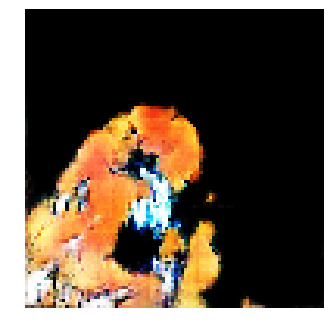


Epoch: 25560, D: -6.541, G: 5.217
Epoch: 25561, D: -6.098, G: 5.893
Epoch: 25562, D: -5.679, G: 5.592
Epoch: 25563, D: -6.827, G: 3.811
Epoch: 25564, D: -7.204, G: 4.421
Epoch: 25565, D: -5.694, G: 2.433
Epoch: 25566, D: -6.088, G: 2.19
Epoch: 25567, D: -7.371, G: 4.424
Epoch: 25568, D: -5.415, G: 4.94
Epoch: 25569, D: -6.893, G: 5.968
Epoch: 25570, D: -5.915, G: 6.615
Epoch: 25571, D: -5.711, G: 2.574
Epoch: 25572, D: -6.351, G: 5.937
Epoch: 25573, D: -5.19, G: 4.127
Epoch: 25574, D: -5.536, G: 4.998
Epoch: 25575, D: -4.331, G: 6.103
Epoch: 25576, D: -6.183, G: 4.774
Epoch: 25577, D: -7.273, G: 4.46
Epoch: 25578, D: -4.795, G: 2.331
Epoch: 25579, D: -5.884, G: 2.963


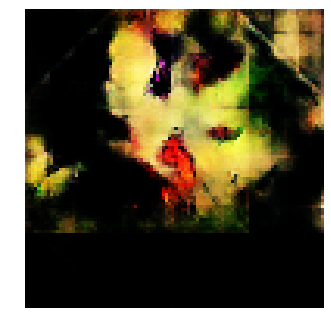


Epoch: 25580, D: -6.923, G: 2.753
Epoch: 25581, D: -4.74, G: 3.634
Epoch: 25582, D: -5.069, G: 3.39
Epoch: 25583, D: -6.622, G: 5.515
Epoch: 25584, D: -5.815, G: 3.981
Epoch: 25585, D: -5.662, G: 3.677
Epoch: 25586, D: -6.38, G: 4.111
Epoch: 25587, D: -6.423, G: 4.999
Epoch: 25588, D: -4.667, G: 4.962
Epoch: 25589, D: -6.606, G: 4.809
Epoch: 25590, D: -5.672, G: 2.973
Epoch: 25591, D: -5.222, G: 3.884
Epoch: 25592, D: -6.1, G: 3.883
Epoch: 25593, D: -5.386, G: 2.531
Epoch: 25594, D: -6.239, G: 4.0
Epoch: 25595, D: -6.379, G: 2.641
Epoch: 25596, D: -6.184, G: 4.423
Epoch: 25597, D: -5.844, G: 3.863
Epoch: 25598, D: -6.435, G: 3.188
Epoch: 25599, D: -7.098, G: 2.426


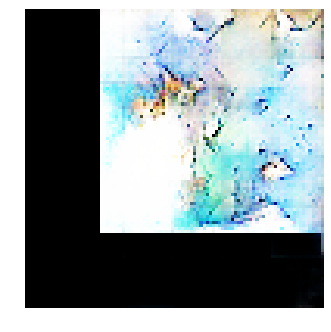


Epoch: 25600, D: -5.563, G: 2.833
Epoch: 25601, D: -6.633, G: 5.965
Epoch: 25602, D: -5.15, G: 2.929
Epoch: 25603, D: -6.06, G: 3.051
Epoch: 25604, D: -6.452, G: 2.369
Epoch: 25605, D: -5.997, G: 3.706
Epoch: 25606, D: -5.507, G: 3.688
Epoch: 25607, D: -6.854, G: 5.736
Epoch: 25608, D: -6.149, G: 4.863
Epoch: 25609, D: -5.647, G: 2.89
Epoch: 25610, D: -6.649, G: 3.115
Epoch: 25611, D: -5.552, G: 3.802
Epoch: 25612, D: -5.776, G: 3.879
Epoch: 25613, D: -5.751, G: 3.964
Epoch: 25614, D: -5.954, G: 2.071
Epoch: 25615, D: -6.841, G: 5.005
Epoch: 25616, D: -7.274, G: 3.274
Epoch: 25617, D: -5.693, G: 4.968
Epoch: 25618, D: -4.791, G: 4.591
Epoch: 25619, D: -5.223, G: 3.362


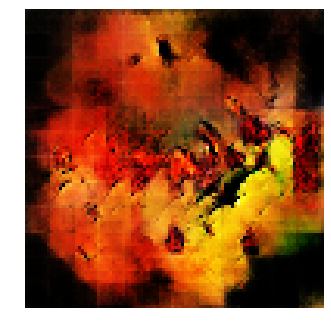


Epoch: 25620, D: -5.448, G: 3.536
Epoch: 25621, D: -6.218, G: 3.982
Epoch: 25622, D: -7.169, G: 3.039
Epoch: 25623, D: -5.359, G: 1.995
Epoch: 25624, D: -5.42, G: 3.992
Epoch: 25625, D: -5.891, G: 2.628
Epoch: 25626, D: -7.126, G: 4.242
Epoch: 25627, D: -4.772, G: 2.616
Epoch: 25628, D: -6.476, G: 3.136
Epoch: 25629, D: -5.793, G: 4.699
Epoch: 25630, D: -5.497, G: 3.454
Epoch: 25631, D: -5.716, G: 3.924
Epoch: 25632, D: -6.377, G: 2.641
Epoch: 25633, D: -6.822, G: 3.056
Epoch: 25634, D: -6.849, G: 3.084
Epoch: 25635, D: -6.399, G: 4.068
Epoch: 25636, D: -6.554, G: 2.697
Epoch: 25637, D: -6.108, G: 3.277
Epoch: 25638, D: -7.44, G: 3.21
Epoch: 25639, D: -6.255, G: 1.541


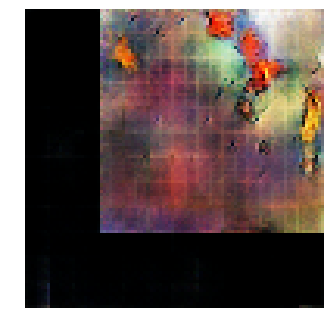


Epoch: 25640, D: -5.988, G: 6.0
Epoch: 25641, D: -8.496, G: 6.125
Epoch: 25642, D: -5.253, G: 5.074
Epoch: 25643, D: -6.765, G: 3.362
Epoch: 25644, D: -8.49, G: 2.793
Epoch: 25645, D: -5.73, G: 2.084
Epoch: 25646, D: -4.372, G: 3.112
Epoch: 25647, D: -6.141, G: 5.282
Epoch: 25648, D: -6.169, G: 4.652
Epoch: 25649, D: -7.211, G: 6.516
Epoch: 25650, D: -5.638, G: 4.561
Epoch: 25651, D: -5.842, G: 3.887
Epoch: 25652, D: -6.559, G: 3.728
Epoch: 25653, D: -6.563, G: 3.577
Epoch: 25654, D: -6.626, G: 3.422
Epoch: 25655, D: -6.704, G: 3.96
Epoch: 25656, D: -6.745, G: 3.235
Epoch: 25657, D: -4.747, G: 4.028
Epoch: 25658, D: -6.29, G: 4.874
Epoch: 25659, D: -7.801, G: 5.958


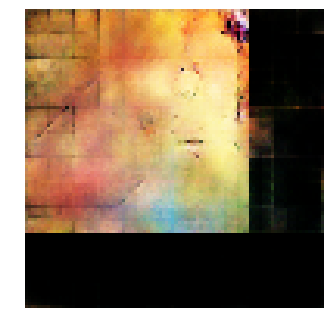


Epoch: 25660, D: -5.621, G: 4.705
Epoch: 25661, D: -5.215, G: 4.32
Epoch: 25662, D: -3.594, G: 2.358
Epoch: 25663, D: -5.554, G: 3.348
Epoch: 25664, D: -4.986, G: 4.629
Epoch: 25665, D: -4.685, G: 6.047
Epoch: 25666, D: -5.762, G: 4.582
Epoch: 25667, D: -6.351, G: 5.027
Epoch: 25668, D: -6.439, G: 2.885
Epoch: 25669, D: -6.942, G: 5.299
Epoch: 25670, D: -5.99, G: 2.729
Epoch: 25671, D: -5.115, G: 3.283
Epoch: 25672, D: -6.379, G: 3.934
Epoch: 25673, D: -5.5, G: 4.515
Epoch: 25674, D: -6.96, G: 3.193
Epoch: 25675, D: -7.094, G: 3.137
Epoch: 25676, D: -5.481, G: 2.022
Epoch: 25677, D: -6.398, G: 2.422
Epoch: 25678, D: -6.126, G: 2.7
Epoch: 25679, D: -7.341, G: 5.166


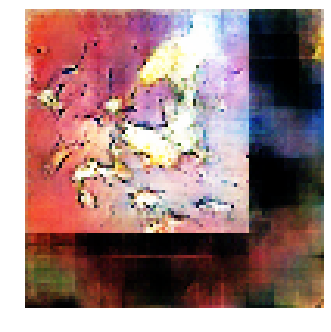


Epoch: 25680, D: -5.404, G: 1.827
Epoch: 25681, D: -5.896, G: 4.174
Epoch: 25682, D: -6.007, G: 3.724
Epoch: 25683, D: -6.041, G: 1.511
Epoch: 25684, D: -7.36, G: 2.877
Epoch: 25685, D: -6.135, G: 2.599
Epoch: 25686, D: -5.909, G: 3.596
Epoch: 25687, D: -5.681, G: 4.609
Epoch: 25688, D: -7.387, G: 2.347
Epoch: 25689, D: -5.823, G: 2.465
Epoch: 25690, D: -8.255, G: 5.204
Epoch: 25691, D: -5.928, G: 2.939
Epoch: 25692, D: -7.141, G: 2.142
Epoch: 25693, D: -6.256, G: 5.405
Epoch: 25694, D: -6.666, G: 5.539
Epoch: 25695, D: -5.299, G: 4.559
Epoch: 25696, D: -5.906, G: 3.888
Epoch: 25697, D: -7.701, G: 4.345
Epoch: 25698, D: -6.616, G: 3.034
Epoch: 25699, D: -5.899, G: 4.939


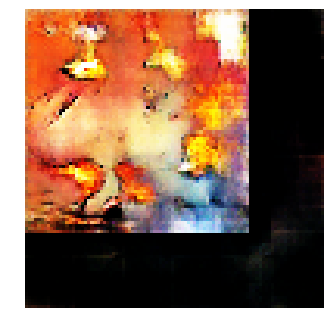


Epoch: 25700, D: -5.075, G: 2.949
Epoch: 25701, D: -5.413, G: 2.495
Epoch: 25702, D: -5.367, G: 5.112
Epoch: 25703, D: -5.568, G: 4.78
Epoch: 25704, D: -5.929, G: 4.375
Epoch: 25705, D: -5.591, G: 2.491
Epoch: 25706, D: -6.882, G: 5.871
Epoch: 25707, D: -7.009, G: 2.843
Epoch: 25708, D: -5.656, G: 5.728
Epoch: 25709, D: -6.053, G: 4.368
Epoch: 25710, D: -5.85, G: 3.385
Epoch: 25711, D: -6.424, G: 3.934
Epoch: 25712, D: -5.889, G: 5.721
Epoch: 25713, D: -6.43, G: 2.468
Epoch: 25714, D: -6.456, G: 6.131
Epoch: 25715, D: -4.864, G: 4.531
Epoch: 25716, D: -5.622, G: 5.05
Epoch: 25717, D: -6.628, G: 5.438
Epoch: 25718, D: -4.922, G: 3.527
Epoch: 25719, D: -5.013, G: 4.228


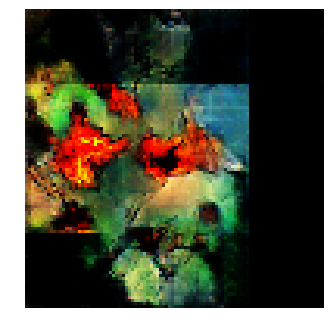


Epoch: 25720, D: -5.995, G: 3.696
Epoch: 25721, D: -5.901, G: 1.75
Epoch: 25722, D: -7.205, G: 4.273
Epoch: 25723, D: -5.836, G: 6.447
Epoch: 25724, D: -7.008, G: 3.581
Epoch: 25725, D: -7.078, G: 5.376
Epoch: 25726, D: -5.927, G: 1.619
Epoch: 25727, D: -6.516, G: 2.178
Epoch: 25728, D: -6.311, G: 5.451
Epoch: 25729, D: -6.567, G: 5.176
Epoch: 25730, D: -7.514, G: 4.082
Epoch: 25731, D: -7.785, G: 5.296
Epoch: 25732, D: -6.648, G: 5.444
Epoch: 25733, D: -5.991, G: 2.607
Epoch: 25734, D: -5.499, G: 5.077
Epoch: 25735, D: -5.558, G: 5.551
Epoch: 25736, D: -5.249, G: 4.776
Epoch: 25737, D: -6.343, G: 3.636
Epoch: 25738, D: -6.637, G: 2.842
Epoch: 25739, D: -5.32, G: 5.077


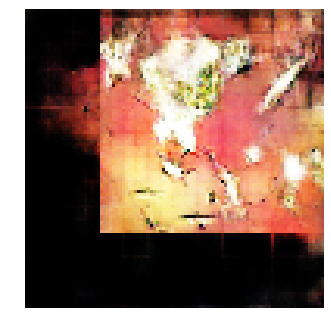


Epoch: 25740, D: -5.206, G: 2.615
Epoch: 25741, D: -6.588, G: 3.224
Epoch: 25742, D: -4.504, G: 2.136
Epoch: 25743, D: -5.221, G: 4.837
Epoch: 25744, D: -6.244, G: 3.82
Epoch: 25745, D: -5.675, G: 5.439
Epoch: 25746, D: -8.265, G: 5.454
Epoch: 25747, D: -6.582, G: 4.14
Epoch: 25748, D: -5.587, G: 3.35
Epoch: 25749, D: -6.154, G: 4.626
Epoch: 25750, D: -7.241, G: 3.215
Epoch: 25751, D: -5.625, G: 5.789
Epoch: 25752, D: -7.319, G: 2.129
Epoch: 25753, D: -6.204, G: 4.626
Epoch: 25754, D: -5.621, G: 4.959
Epoch: 25755, D: -6.136, G: 4.038
Epoch: 25756, D: -6.042, G: 4.624
Epoch: 25757, D: -5.009, G: 3.75
Epoch: 25758, D: -7.153, G: 4.897
Epoch: 25759, D: -5.294, G: 5.371


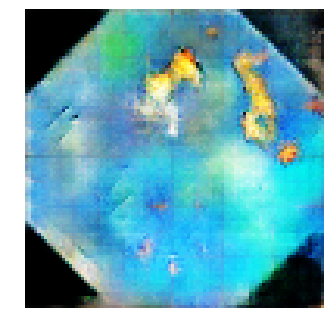


Epoch: 25760, D: -5.848, G: 4.814
Epoch: 25761, D: -4.399, G: 5.657
Epoch: 25762, D: -5.654, G: 2.586
Epoch: 25763, D: -5.811, G: 3.352
Epoch: 25764, D: -6.103, G: 3.231
Epoch: 25765, D: -6.33, G: 3.699
Epoch: 25766, D: -6.373, G: 4.907
Epoch: 25767, D: -6.478, G: 6.021
Epoch: 25768, D: -5.856, G: 3.754
Epoch: 25769, D: -5.524, G: 3.998
Epoch: 25770, D: -5.046, G: 2.719
Epoch: 25771, D: -5.337, G: 4.198
Epoch: 25772, D: -5.7, G: 2.355
Epoch: 25773, D: -5.312, G: 3.857
Epoch: 25774, D: -5.517, G: 3.828
Epoch: 25775, D: -5.525, G: 3.246
Epoch: 25776, D: -6.517, G: 5.2
Epoch: 25777, D: -6.242, G: 4.193
Epoch: 25778, D: -6.333, G: 4.101
Epoch: 25779, D: -5.385, G: 4.409


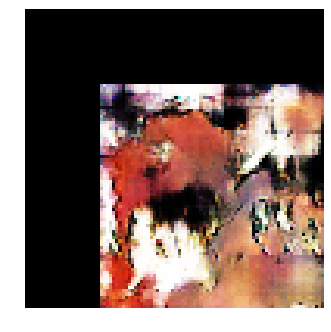


Epoch: 25780, D: -6.314, G: 4.631
Epoch: 25781, D: -7.598, G: 4.877
Epoch: 25782, D: -6.97, G: 2.495
Epoch: 25783, D: -7.328, G: 2.613
Epoch: 25784, D: -6.301, G: 2.73
Epoch: 25785, D: -5.761, G: 2.93
Epoch: 25786, D: -6.888, G: 5.026
Epoch: 25787, D: -6.31, G: 4.166
Epoch: 25788, D: -6.145, G: 4.982
Epoch: 25789, D: -6.21, G: 3.15
Epoch: 25790, D: -5.402, G: 2.195
Epoch: 25791, D: -4.937, G: 2.682
Epoch: 25792, D: -6.627, G: 3.036
Epoch: 25793, D: -7.73, G: 3.937
Epoch: 25794, D: -7.648, G: 4.304
Epoch: 25795, D: -5.967, G: 4.835
Epoch: 25796, D: -7.416, G: 2.647
Epoch: 25797, D: -6.245, G: 4.678
Epoch: 25798, D: -4.568, G: 2.901
Epoch: 25799, D: -5.236, G: 3.466


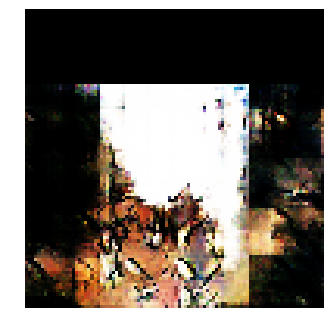


Epoch: 25800, D: -5.488, G: 3.895
Epoch: 25801, D: -5.893, G: 3.319
Epoch: 25802, D: -5.661, G: 2.488
Epoch: 25803, D: -5.836, G: 3.8
Epoch: 25804, D: -6.476, G: 4.305
Epoch: 25805, D: -5.358, G: 4.449
Epoch: 25806, D: -5.645, G: 5.069
Epoch: 25807, D: -5.864, G: 3.988
Epoch: 25808, D: -5.629, G: 3.995
Epoch: 25809, D: -5.738, G: 3.809
Epoch: 25810, D: -7.227, G: 5.212
Epoch: 25811, D: -6.839, G: 2.186
Epoch: 25812, D: -6.749, G: 5.059
Epoch: 25813, D: -6.25, G: 3.771
Epoch: 25814, D: -6.226, G: 3.596
Epoch: 25815, D: -6.358, G: 4.1
Epoch: 25816, D: -6.958, G: 2.274
Epoch: 25817, D: -7.095, G: 3.314
Epoch: 25818, D: -6.862, G: 4.964
Epoch: 25819, D: -5.263, G: 4.661


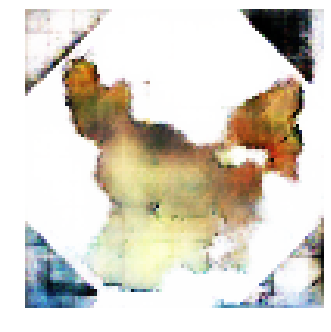


Epoch: 25820, D: -5.448, G: 6.61
Epoch: 25821, D: -5.913, G: 3.98
Epoch: 25822, D: -6.764, G: 5.083
Epoch: 25823, D: -6.463, G: 3.869
Epoch: 25824, D: -6.898, G: 3.61
Epoch: 25825, D: -6.751, G: 2.115
Epoch: 25826, D: -5.712, G: 4.46
Epoch: 25827, D: -6.08, G: 4.622
Epoch: 25828, D: -5.605, G: 3.575
Epoch: 25829, D: -6.779, G: 2.233
Epoch: 25830, D: -5.266, G: 4.603
Epoch: 25831, D: -6.075, G: 3.395
Epoch: 25832, D: -7.508, G: 5.587
Epoch: 25833, D: -5.364, G: 1.139
Epoch: 25834, D: -6.123, G: 2.755
Epoch: 25835, D: -6.009, G: 1.656
Epoch: 25836, D: -5.762, G: 3.349
Epoch: 25837, D: -6.303, G: 3.953
Epoch: 25838, D: -5.642, G: 3.528
Epoch: 25839, D: -7.398, G: 2.642


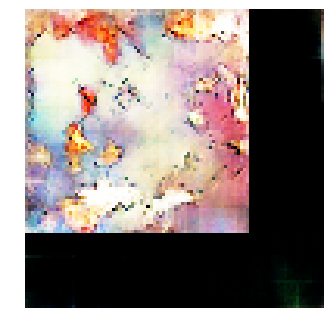


Epoch: 25840, D: -5.991, G: 2.479
Epoch: 25841, D: -5.752, G: 2.534
Epoch: 25842, D: -6.336, G: 3.864
Epoch: 25843, D: -6.471, G: 4.224
Epoch: 25844, D: -3.979, G: 3.079
Epoch: 25845, D: -4.608, G: 3.345
Epoch: 25846, D: -6.064, G: 3.755
Epoch: 25847, D: -5.991, G: 3.148
Epoch: 25848, D: -6.356, G: 3.067
Epoch: 25849, D: -6.27, G: 2.262
Epoch: 25850, D: -4.352, G: 6.517
Epoch: 25851, D: -6.3, G: 2.651
Epoch: 25852, D: -4.508, G: 4.058
Epoch: 25853, D: -5.225, G: 4.292
Epoch: 25854, D: -6.821, G: 3.941
Epoch: 25855, D: -4.203, G: 3.881
Epoch: 25856, D: -6.0, G: 2.364
Epoch: 25857, D: -6.992, G: 4.348
Epoch: 25858, D: -6.664, G: 4.82
Epoch: 25859, D: -5.326, G: 4.594


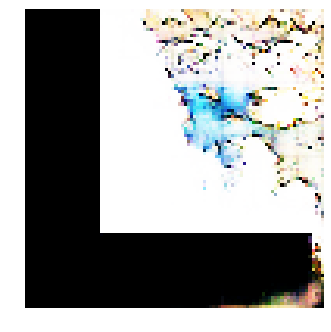


Epoch: 25860, D: -6.831, G: 4.274
Epoch: 25861, D: -7.307, G: 2.432
Epoch: 25862, D: -6.266, G: 4.037
Epoch: 25863, D: -6.4, G: 4.786
Epoch: 25864, D: -5.45, G: 3.222
Epoch: 25865, D: -7.62, G: 3.811
Epoch: 25866, D: -5.271, G: 3.884
Epoch: 25867, D: -3.691, G: 3.737
Epoch: 25868, D: -6.101, G: 4.997
Epoch: 25869, D: -6.058, G: 2.59
Epoch: 25870, D: -6.76, G: 3.792
Epoch: 25871, D: -5.327, G: 4.566
Epoch: 25872, D: -6.715, G: 5.277
Epoch: 25873, D: -6.407, G: 5.339
Epoch: 25874, D: -6.411, G: 4.31
Epoch: 25875, D: -5.781, G: 1.842
Epoch: 25876, D: -6.116, G: 5.343
Epoch: 25877, D: -5.832, G: 3.388
Epoch: 25878, D: -6.9, G: 3.876
Epoch: 25879, D: -5.442, G: 4.833


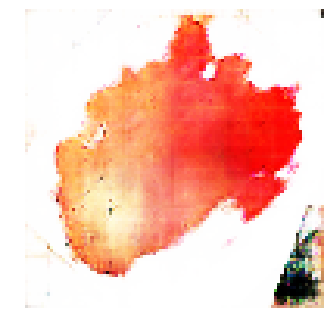


Epoch: 25880, D: -5.876, G: 4.264
Epoch: 25881, D: -5.712, G: 5.594
Epoch: 25882, D: -5.171, G: 4.285
Epoch: 25883, D: -6.143, G: 5.755
Epoch: 25884, D: -5.354, G: 3.279
Epoch: 25885, D: -6.367, G: 3.756
Epoch: 25886, D: -5.616, G: 3.783
Epoch: 25887, D: -6.48, G: 2.542
Epoch: 25888, D: -5.089, G: 3.674
Epoch: 25889, D: -5.598, G: 3.384
Epoch: 25890, D: -6.676, G: 3.665
Epoch: 25891, D: -6.088, G: 3.821
Epoch: 25892, D: -5.42, G: 3.626
Epoch: 25893, D: -6.988, G: 4.989
Epoch: 25894, D: -6.577, G: 4.933
Epoch: 25895, D: -6.089, G: 5.96
Epoch: 25896, D: -8.576, G: 6.002
Epoch: 25897, D: -5.495, G: 4.278
Epoch: 25898, D: -5.45, G: 1.768
Epoch: 25899, D: -5.316, G: 4.678


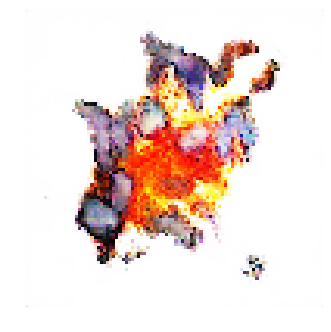


Epoch: 25900, D: -6.567, G: 4.016
Epoch: 25901, D: -6.443, G: 5.408
Epoch: 25902, D: -6.306, G: 3.442
Epoch: 25903, D: -6.006, G: 3.732
Epoch: 25904, D: -8.018, G: 2.37
Epoch: 25905, D: -7.281, G: 2.118
Epoch: 25906, D: -7.935, G: 3.912
Epoch: 25907, D: -5.905, G: 4.709
Epoch: 25908, D: -6.238, G: 4.057
Epoch: 25909, D: -5.684, G: 3.753
Epoch: 25910, D: -5.285, G: 5.084
Epoch: 25911, D: -5.638, G: 4.951
Epoch: 25912, D: -5.712, G: 4.159
Epoch: 25913, D: -5.345, G: 4.198
Epoch: 25914, D: -5.732, G: 4.224
Epoch: 25915, D: -6.963, G: 4.474
Epoch: 25916, D: -6.833, G: 3.79
Epoch: 25917, D: -6.406, G: 2.476
Epoch: 25918, D: -6.597, G: 3.355
Epoch: 25919, D: -5.993, G: 4.623


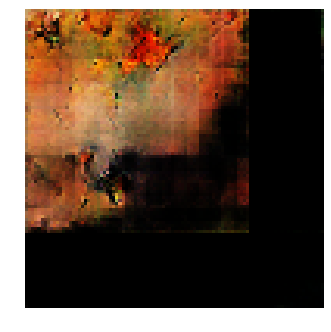


Epoch: 25920, D: -5.117, G: 5.124
Epoch: 25921, D: -5.305, G: 1.891
Epoch: 25922, D: -6.431, G: 3.699
Epoch: 25923, D: -4.582, G: 2.419
Epoch: 25924, D: -6.784, G: 2.679
Epoch: 25925, D: -7.17, G: 1.704
Epoch: 25926, D: -5.504, G: 2.465
Epoch: 25927, D: -6.061, G: 4.455
Epoch: 25928, D: -5.63, G: 3.381
Epoch: 25929, D: -7.089, G: 3.528
Epoch: 25930, D: -6.562, G: 2.491
Epoch: 25931, D: -5.622, G: 4.536
Epoch: 25932, D: -5.357, G: 4.577
Epoch: 25933, D: -6.689, G: 4.588
Epoch: 25934, D: -5.912, G: 5.084
Epoch: 25935, D: -5.506, G: 3.893
Epoch: 25936, D: -5.663, G: 2.941
Epoch: 25937, D: -6.446, G: 3.721
Epoch: 25938, D: -5.457, G: 3.24
Epoch: 25939, D: -5.376, G: 3.146


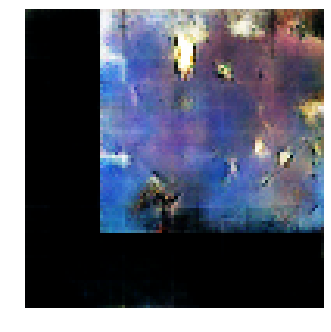


Epoch: 25940, D: -7.133, G: 3.961
Epoch: 25941, D: -6.7, G: 3.049
Epoch: 25942, D: -5.941, G: 4.517
Epoch: 25943, D: -5.958, G: 4.165
Epoch: 25944, D: -6.2, G: 4.71
Epoch: 25945, D: -6.532, G: 3.097
Epoch: 25946, D: -6.817, G: 3.597
Epoch: 25947, D: -6.507, G: 3.22
Epoch: 25948, D: -5.584, G: 5.365
Epoch: 25949, D: -5.114, G: 3.793
Epoch: 25950, D: -8.141, G: 5.028
Epoch: 25951, D: -5.727, G: 3.707
Epoch: 25952, D: -7.133, G: 3.571
Epoch: 25953, D: -6.305, G: 3.549
Epoch: 25954, D: -5.723, G: 3.868
Epoch: 25955, D: -5.315, G: 3.357
Epoch: 25956, D: -5.605, G: 3.72
Epoch: 25957, D: -5.302, G: 2.883
Epoch: 25958, D: -6.9, G: 4.241
Epoch: 25959, D: -6.225, G: 3.204


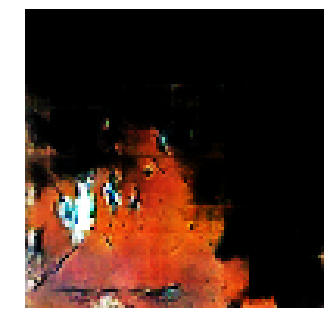


Epoch: 25960, D: -6.256, G: 6.308
Epoch: 25961, D: -5.279, G: 3.357
Epoch: 25962, D: -5.579, G: 5.379
Epoch: 25963, D: -5.093, G: 2.537
Epoch: 25964, D: -6.321, G: 5.039
Epoch: 25965, D: -5.527, G: 2.596
Epoch: 25966, D: -6.75, G: 3.584
Epoch: 25967, D: -6.528, G: 4.586
Epoch: 25968, D: -5.752, G: 4.057
Epoch: 25969, D: -4.772, G: 4.646
Epoch: 25970, D: -6.334, G: 5.12
Epoch: 25971, D: -8.013, G: 4.644
Epoch: 25972, D: -7.267, G: 3.593
Epoch: 25973, D: -5.193, G: 4.603
Epoch: 25974, D: -5.879, G: 1.84
Epoch: 25975, D: -5.819, G: 3.012
Epoch: 25976, D: -5.085, G: 0.6137
Epoch: 25977, D: -5.4, G: 4.655
Epoch: 25978, D: -5.48, G: 4.268
Epoch: 25979, D: -5.906, G: 3.024


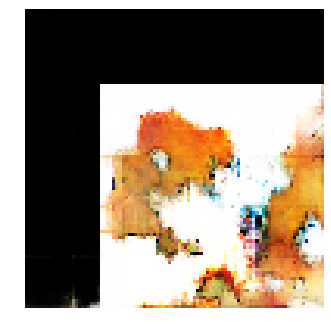


Epoch: 25980, D: -6.173, G: 8.063
Epoch: 25981, D: -4.832, G: 3.645
Epoch: 25982, D: -6.207, G: 2.671
Epoch: 25983, D: -6.005, G: 3.084
Epoch: 25984, D: -5.474, G: 4.029
Epoch: 25985, D: -5.661, G: 1.911
Epoch: 25986, D: -7.402, G: 1.859
Epoch: 25987, D: -5.522, G: 5.357
Epoch: 25988, D: -6.345, G: 5.234
Epoch: 25989, D: -6.16, G: 3.912
Epoch: 25990, D: -5.866, G: 3.502
Epoch: 25991, D: -6.04, G: 2.993
Epoch: 25992, D: -6.051, G: 6.21
Epoch: 25993, D: -7.558, G: 4.739
Epoch: 25994, D: -6.325, G: 2.59
Epoch: 25995, D: -6.333, G: 3.596
Epoch: 25996, D: -5.61, G: 2.708
Epoch: 25997, D: -5.374, G: 3.595
Epoch: 25998, D: -4.639, G: 4.97
Epoch: 25999, D: -5.941, G: 4.728


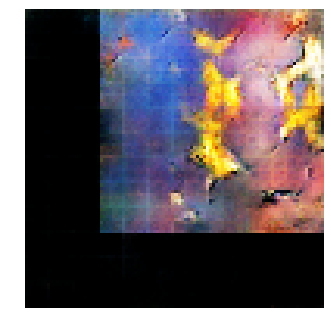


Epoch: 26000, D: -6.718, G: 2.514
Epoch: 26001, D: -6.703, G: 2.245
Epoch: 26002, D: -6.072, G: 1.001
Epoch: 26003, D: -7.021, G: 2.624
Epoch: 26004, D: -6.778, G: 1.315
Epoch: 26005, D: -5.464, G: 2.956
Epoch: 26006, D: -6.258, G: 5.481
Epoch: 26007, D: -6.648, G: 3.598
Epoch: 26008, D: -4.059, G: 4.409
Epoch: 26009, D: -6.663, G: 4.512
Epoch: 26010, D: -6.069, G: 4.224
Epoch: 26011, D: -5.999, G: 4.28
Epoch: 26012, D: -4.835, G: 4.251
Epoch: 26013, D: -5.984, G: 3.002
Epoch: 26014, D: -5.236, G: 4.73
Epoch: 26015, D: -6.409, G: 3.347
Epoch: 26016, D: -6.707, G: 2.774
Epoch: 26017, D: -7.031, G: 4.131
Epoch: 26018, D: -5.461, G: 2.478
Epoch: 26019, D: -5.174, G: 3.531


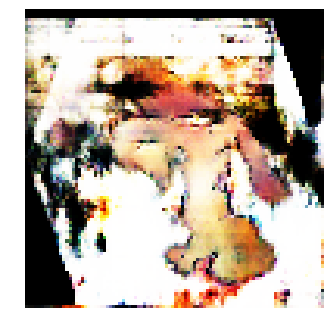


Epoch: 26020, D: -4.319, G: 2.931
Epoch: 26021, D: -6.455, G: 4.487
Epoch: 26022, D: -5.942, G: 4.647
Epoch: 26023, D: -5.439, G: 3.499
Epoch: 26024, D: -4.674, G: 5.833
Epoch: 26025, D: -7.897, G: 3.769
Epoch: 26026, D: -6.503, G: 4.917
Epoch: 26027, D: -7.082, G: 3.905
Epoch: 26028, D: -7.097, G: 2.999
Epoch: 26029, D: -4.202, G: 3.476
Epoch: 26030, D: -4.806, G: 3.754
Epoch: 26031, D: -7.156, G: 5.108
Epoch: 26032, D: -5.805, G: 3.999
Epoch: 26033, D: -6.137, G: 4.773
Epoch: 26034, D: -4.29, G: 4.394
Epoch: 26035, D: -7.407, G: 4.634
Epoch: 26036, D: -5.74, G: 4.764
Epoch: 26037, D: -4.49, G: 4.913
Epoch: 26038, D: -6.725, G: 4.845
Epoch: 26039, D: -6.94, G: 3.488


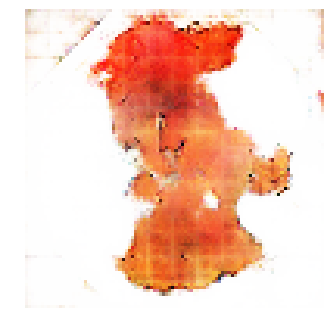


Epoch: 26040, D: -6.545, G: 4.948
Epoch: 26041, D: -5.565, G: 3.617
Epoch: 26042, D: -6.843, G: 4.548
Epoch: 26043, D: -7.394, G: 3.812
Epoch: 26044, D: -6.229, G: 2.916
Epoch: 26045, D: -5.211, G: 3.773
Epoch: 26046, D: -5.092, G: 2.629
Epoch: 26047, D: -5.795, G: 3.618
Epoch: 26048, D: -4.69, G: 3.888
Epoch: 26049, D: -5.101, G: 3.311
Epoch: 26050, D: -6.905, G: 2.007
Epoch: 26051, D: -6.705, G: 3.041
Epoch: 26052, D: -5.254, G: 3.042
Epoch: 26053, D: -6.745, G: 3.668
Epoch: 26054, D: -5.43, G: 3.923
Epoch: 26055, D: -5.655, G: 4.515
Epoch: 26056, D: -6.521, G: 3.471
Epoch: 26057, D: -5.161, G: 4.814
Epoch: 26058, D: -5.554, G: 5.499
Epoch: 26059, D: -5.841, G: 2.426


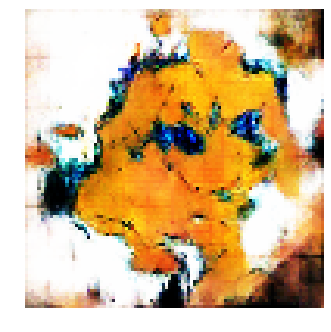


Epoch: 26060, D: -4.946, G: 3.24
Epoch: 26061, D: -6.36, G: 3.278
Epoch: 26062, D: -6.176, G: 4.117
Epoch: 26063, D: -6.936, G: 3.538
Epoch: 26064, D: -5.636, G: 3.593
Epoch: 26065, D: -5.385, G: 5.462
Epoch: 26066, D: -5.829, G: 3.52
Epoch: 26067, D: -6.485, G: 5.078
Epoch: 26068, D: -5.486, G: 4.996
Epoch: 26069, D: -5.008, G: 3.542
Epoch: 26070, D: -6.108, G: 4.326
Epoch: 26071, D: -5.452, G: 3.698
Epoch: 26072, D: -5.356, G: 4.961
Epoch: 26073, D: -5.303, G: 4.972
Epoch: 26074, D: -6.076, G: 6.497
Epoch: 26075, D: -6.811, G: 4.08
Epoch: 26076, D: -6.501, G: 2.808
Epoch: 26077, D: -5.421, G: 3.036
Epoch: 26078, D: -6.569, G: 5.573
Epoch: 26079, D: -7.231, G: 3.823


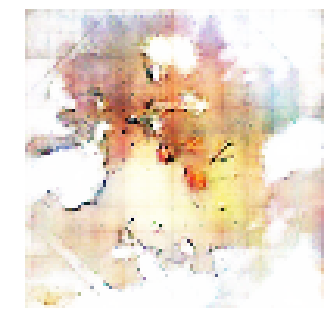


Epoch: 26080, D: -4.372, G: 2.941
Epoch: 26081, D: -5.728, G: 3.267
Epoch: 26082, D: -5.671, G: 2.59
Epoch: 26083, D: -6.492, G: 4.808
Epoch: 26084, D: -5.951, G: 1.843
Epoch: 26085, D: -6.034, G: 3.65
Epoch: 26086, D: -6.113, G: 2.879
Epoch: 26087, D: -5.673, G: 3.175
Epoch: 26088, D: -6.229, G: 3.333
Epoch: 26089, D: -5.652, G: 4.361
Epoch: 26090, D: -6.467, G: 3.537
Epoch: 26091, D: -4.775, G: 4.239
Epoch: 26092, D: -5.459, G: 3.872
Epoch: 26093, D: -5.435, G: 4.867
Epoch: 26094, D: -6.475, G: 3.03
Epoch: 26095, D: -6.369, G: 2.949
Epoch: 26096, D: -4.612, G: 3.921
Epoch: 26097, D: -7.35, G: 3.182
Epoch: 26098, D: -5.033, G: 1.468
Epoch: 26099, D: -5.871, G: 2.851


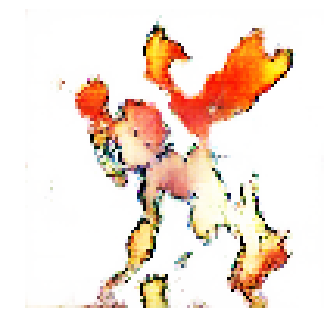


Epoch: 26100, D: -6.423, G: 2.684
Epoch: 26101, D: -6.888, G: 4.587
Epoch: 26102, D: -7.084, G: 4.786
Epoch: 26103, D: -6.621, G: 3.72
Epoch: 26104, D: -6.208, G: 5.844
Epoch: 26105, D: -5.981, G: 5.296
Epoch: 26106, D: -7.575, G: 3.274
Epoch: 26107, D: -6.818, G: 3.647
Epoch: 26108, D: -5.567, G: 4.832
Epoch: 26109, D: -5.443, G: 3.275
Epoch: 26110, D: -5.586, G: 3.634
Epoch: 26111, D: -5.6, G: 4.802
Epoch: 26112, D: -6.306, G: 4.498
Epoch: 26113, D: -5.783, G: 3.641
Epoch: 26114, D: -6.123, G: 4.122
Epoch: 26115, D: -5.151, G: 4.77
Epoch: 26116, D: -5.124, G: 5.489
Epoch: 26117, D: -4.84, G: 4.23
Epoch: 26118, D: -5.069, G: 6.935
Epoch: 26119, D: -5.442, G: 2.968


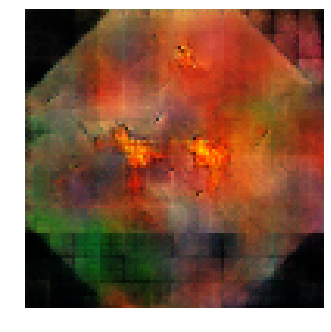


Epoch: 26120, D: -5.974, G: 3.062
Epoch: 26121, D: -5.404, G: 2.901
Epoch: 26122, D: -4.584, G: 3.505
Epoch: 26123, D: -5.445, G: 3.999
Epoch: 26124, D: -6.297, G: 3.617
Epoch: 26125, D: -6.422, G: 3.056
Epoch: 26126, D: -5.779, G: 3.393
Epoch: 26127, D: -6.399, G: 2.505
Epoch: 26128, D: -5.342, G: 3.293
Epoch: 26129, D: -7.608, G: 3.415
Epoch: 26130, D: -5.875, G: 2.748
Epoch: 26131, D: -6.585, G: 4.816
Epoch: 26132, D: -6.741, G: 4.097
Epoch: 26133, D: -6.539, G: 3.335
Epoch: 26134, D: -6.673, G: 2.531
Epoch: 26135, D: -6.97, G: 4.743
Epoch: 26136, D: -5.802, G: 3.212
Epoch: 26137, D: -5.459, G: 2.821
Epoch: 26138, D: -6.034, G: 3.572
Epoch: 26139, D: -6.225, G: 3.222


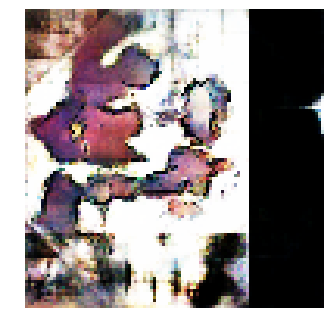


Epoch: 26140, D: -5.733, G: 4.09
Epoch: 26141, D: -5.718, G: 3.342
Epoch: 26142, D: -5.526, G: 4.744
Epoch: 26143, D: -7.398, G: 5.134
Epoch: 26144, D: -6.351, G: 1.491
Epoch: 26145, D: -5.118, G: 2.915
Epoch: 26146, D: -6.474, G: 2.327
Epoch: 26147, D: -5.975, G: 5.363
Epoch: 26148, D: -5.857, G: 5.577
Epoch: 26149, D: -6.914, G: 3.957
Epoch: 26150, D: -5.033, G: 4.01
Epoch: 26151, D: -6.172, G: 5.293
Epoch: 26152, D: -7.226, G: 3.391
Epoch: 26153, D: -5.682, G: 3.567
Epoch: 26154, D: -5.328, G: 5.413
Epoch: 26155, D: -5.845, G: 4.668
Epoch: 26156, D: -6.774, G: 2.672
Epoch: 26157, D: -5.631, G: 3.168
Epoch: 26158, D: -5.02, G: 4.186
Epoch: 26159, D: -4.07, G: 1.445


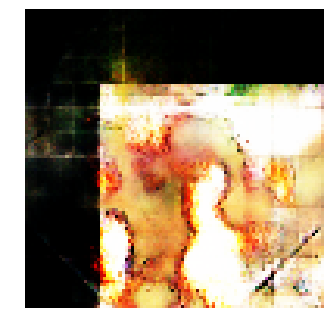


Epoch: 26160, D: -6.635, G: 4.572
Epoch: 26161, D: -7.17, G: 3.251
Epoch: 26162, D: -5.395, G: 2.272
Epoch: 26163, D: -6.15, G: 3.525
Epoch: 26164, D: -5.105, G: 3.547
Epoch: 26165, D: -7.568, G: 4.415
Epoch: 26166, D: -4.958, G: 1.814
Epoch: 26167, D: -5.692, G: 2.666
Epoch: 26168, D: -5.857, G: 5.112
Epoch: 26169, D: -6.194, G: 2.954
Epoch: 26170, D: -5.791, G: 4.061
Epoch: 26171, D: -6.152, G: 5.585
Epoch: 26172, D: -5.098, G: 3.236
Epoch: 26173, D: -5.357, G: 2.986
Epoch: 26174, D: -5.979, G: 3.859
Epoch: 26175, D: -5.393, G: 3.52
Epoch: 26176, D: -7.073, G: 3.341
Epoch: 26177, D: -6.101, G: 2.453
Epoch: 26178, D: -6.865, G: 3.52
Epoch: 26179, D: -5.043, G: 3.525


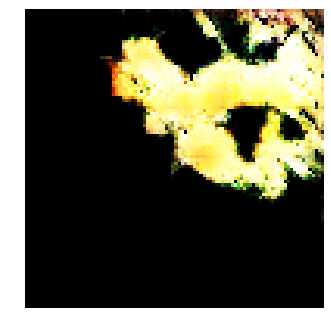


Epoch: 26180, D: -5.217, G: 3.921
Epoch: 26181, D: -7.89, G: 2.772
Epoch: 26182, D: -5.957, G: 2.141
Epoch: 26183, D: -6.003, G: 4.69
Epoch: 26184, D: -6.444, G: 4.678
Epoch: 26185, D: -5.29, G: 4.513
Epoch: 26186, D: -5.552, G: 5.229
Epoch: 26187, D: -6.773, G: 4.214
Epoch: 26188, D: -6.845, G: 3.261
Epoch: 26189, D: -6.047, G: 3.044
Epoch: 26190, D: -5.359, G: 4.278
Epoch: 26191, D: -7.061, G: 1.403
Epoch: 26192, D: -6.887, G: 6.46
Epoch: 26193, D: -5.769, G: 3.878
Epoch: 26194, D: -6.737, G: 4.938
Epoch: 26195, D: -7.233, G: 3.138
Epoch: 26196, D: -8.282, G: 3.946
Epoch: 26197, D: -5.334, G: 4.593
Epoch: 26198, D: -5.46, G: 4.143
Epoch: 26199, D: -7.064, G: 4.937


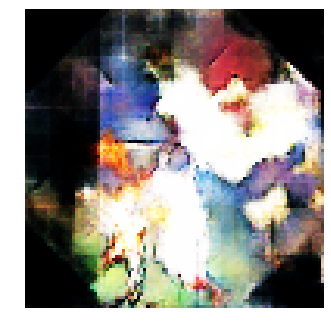


Epoch: 26200, D: -5.873, G: 3.58
Epoch: 26201, D: -5.102, G: 2.683
Epoch: 26202, D: -4.866, G: 4.725
Epoch: 26203, D: -7.6, G: 3.329
Epoch: 26204, D: -5.734, G: 4.311
Epoch: 26205, D: -5.189, G: 3.845
Epoch: 26206, D: -5.515, G: 4.022
Epoch: 26207, D: -7.127, G: 3.861
Epoch: 26208, D: -5.96, G: 3.778
Epoch: 26209, D: -6.64, G: 4.585
Epoch: 26210, D: -4.784, G: 3.213
Epoch: 26211, D: -4.545, G: 2.971
Epoch: 26212, D: -5.31, G: 5.681
Epoch: 26213, D: -5.853, G: 3.354
Epoch: 26214, D: -5.936, G: 2.995
Epoch: 26215, D: -6.785, G: 3.102
Epoch: 26216, D: -4.769, G: 4.943
Epoch: 26217, D: -6.417, G: 3.421
Epoch: 26218, D: -5.162, G: 4.899
Epoch: 26219, D: -5.253, G: 2.403


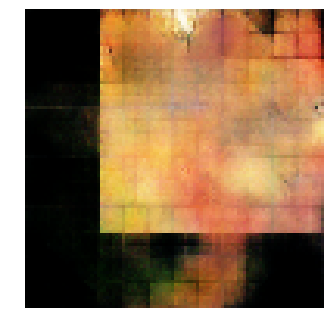


Epoch: 26220, D: -6.344, G: 4.753
Epoch: 26221, D: -6.523, G: 5.158
Epoch: 26222, D: -6.536, G: 3.159
Epoch: 26223, D: -5.641, G: 4.696
Epoch: 26224, D: -5.409, G: 2.398
Epoch: 26225, D: -5.31, G: 3.814
Epoch: 26226, D: -7.419, G: 2.92
Epoch: 26227, D: -6.347, G: 2.993
Epoch: 26228, D: -5.862, G: 4.599
Epoch: 26229, D: -5.963, G: 3.171
Epoch: 26230, D: -6.258, G: 3.485
Epoch: 26231, D: -5.441, G: 3.169
Epoch: 26232, D: -4.377, G: 3.626
Epoch: 26233, D: -4.301, G: 4.868
Epoch: 26234, D: -5.777, G: 3.739
Epoch: 26235, D: -4.898, G: 3.187
Epoch: 26236, D: -5.749, G: 4.592
Epoch: 26237, D: -6.737, G: 4.228
Epoch: 26238, D: -5.688, G: 3.284
Epoch: 26239, D: -6.426, G: 3.034


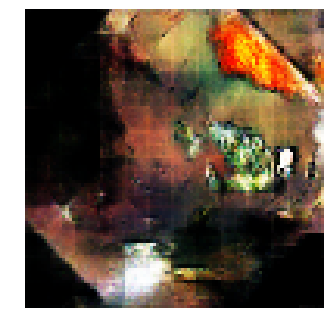


Epoch: 26240, D: -7.077, G: 3.657
Epoch: 26241, D: -6.356, G: 2.923
Epoch: 26242, D: -6.861, G: 3.416
Epoch: 26243, D: -4.653, G: 3.899
Epoch: 26244, D: -5.687, G: 3.629
Epoch: 26245, D: -5.72, G: 4.362
Epoch: 26246, D: -6.567, G: 3.696
Epoch: 26247, D: -5.968, G: 3.113
Epoch: 26248, D: -5.899, G: 3.705
Epoch: 26249, D: -5.645, G: 3.015
Epoch: 26250, D: -5.893, G: 3.596
Epoch: 26251, D: -5.342, G: 3.92
Epoch: 26252, D: -5.553, G: 4.242
Epoch: 26253, D: -4.034, G: 3.312
Epoch: 26254, D: -6.564, G: 5.086
Epoch: 26255, D: -5.121, G: 0.9064
Epoch: 26256, D: -6.916, G: 3.506
Epoch: 26257, D: -4.963, G: 3.392
Epoch: 26258, D: -6.219, G: 2.291
Epoch: 26259, D: -5.239, G: 4.207


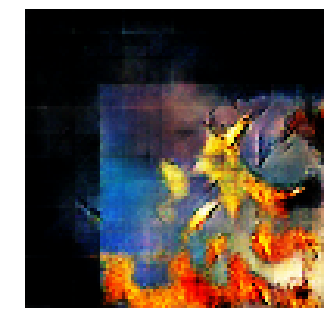


Epoch: 26260, D: -5.939, G: 3.13
Epoch: 26261, D: -5.183, G: 2.202
Epoch: 26262, D: -5.462, G: 2.605
Epoch: 26263, D: -6.769, G: 3.098
Epoch: 26264, D: -5.406, G: 5.451
Epoch: 26265, D: -6.714, G: 4.168
Epoch: 26266, D: -5.853, G: 3.869
Epoch: 26267, D: -5.092, G: 3.943
Epoch: 26268, D: -4.954, G: 3.176
Epoch: 26269, D: -6.829, G: 4.717
Epoch: 26270, D: -7.04, G: 2.165
Epoch: 26271, D: -6.265, G: 3.693
Epoch: 26272, D: -7.352, G: 4.442
Epoch: 26273, D: -4.222, G: 2.921
Epoch: 26274, D: -4.518, G: 3.413
Epoch: 26275, D: -5.78, G: 3.286
Epoch: 26276, D: -6.928, G: 3.683
Epoch: 26277, D: -5.977, G: 3.166
Epoch: 26278, D: -5.679, G: 3.55
Epoch: 26279, D: -6.296, G: 4.668


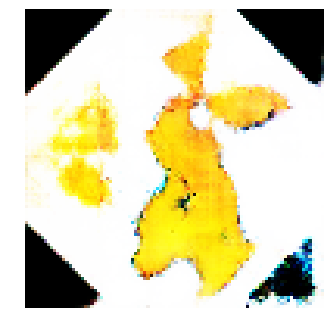


Epoch: 26280, D: -6.332, G: 3.517
Epoch: 26281, D: -6.385, G: 3.232
Epoch: 26282, D: -6.574, G: 3.711
Epoch: 26283, D: -5.731, G: 3.085
Epoch: 26284, D: -6.917, G: 3.467
Epoch: 26285, D: -5.083, G: 4.319
Epoch: 26286, D: -6.619, G: 1.798
Epoch: 26287, D: -5.587, G: 2.921
Epoch: 26288, D: -7.1, G: 3.016
Epoch: 26289, D: -7.347, G: 2.839
Epoch: 26290, D: -5.264, G: 4.159
Epoch: 26291, D: -6.254, G: 3.059
Epoch: 26292, D: -5.88, G: 3.376
Epoch: 26293, D: -5.794, G: 1.673
Epoch: 26294, D: -5.52, G: 0.6086
Epoch: 26295, D: -6.673, G: 4.959
Epoch: 26296, D: -5.931, G: 3.217
Epoch: 26297, D: -5.897, G: 5.022
Epoch: 26298, D: -6.628, G: 5.274
Epoch: 26299, D: -5.565, G: 4.419


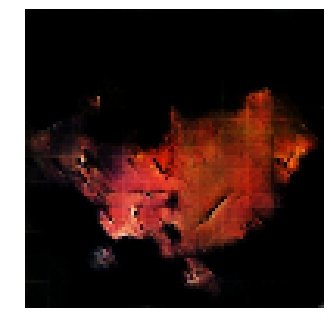


Epoch: 26300, D: -8.518, G: 4.006
Epoch: 26301, D: -6.146, G: 3.094
Epoch: 26302, D: -4.766, G: 2.985
Epoch: 26303, D: -7.07, G: 1.739
Epoch: 26304, D: -5.683, G: 3.732
Epoch: 26305, D: -5.747, G: 3.498
Epoch: 26306, D: -6.832, G: 3.927
Epoch: 26307, D: -7.087, G: 1.728
Epoch: 26308, D: -6.693, G: 1.976
Epoch: 26309, D: -6.124, G: 1.315
Epoch: 26310, D: -5.679, G: 3.355
Epoch: 26311, D: -6.609, G: 2.94
Epoch: 26312, D: -5.425, G: 3.352
Epoch: 26313, D: -6.033, G: 2.335
Epoch: 26314, D: -5.262, G: 3.425
Epoch: 26315, D: -6.059, G: 5.461
Epoch: 26316, D: -6.474, G: 3.355
Epoch: 26317, D: -5.854, G: 5.124
Epoch: 26318, D: -5.666, G: 4.182
Epoch: 26319, D: -6.083, G: 6.147


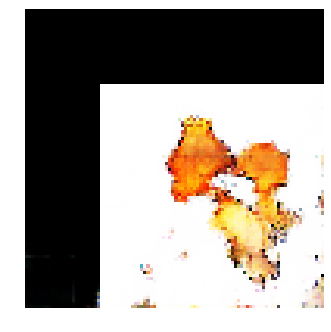


Epoch: 26320, D: -6.331, G: 4.411
Epoch: 26321, D: -6.527, G: 4.292
Epoch: 26322, D: -6.407, G: 2.937
Epoch: 26323, D: -6.956, G: 3.199
Epoch: 26324, D: -5.492, G: 4.584
Epoch: 26325, D: -6.032, G: 3.415
Epoch: 26326, D: -5.859, G: 2.768
Epoch: 26327, D: -6.097, G: 4.227
Epoch: 26328, D: -6.985, G: 4.001
Epoch: 26329, D: -4.957, G: 2.666
Epoch: 26330, D: -6.746, G: 2.769
Epoch: 26331, D: -5.976, G: 4.421
Epoch: 26332, D: -5.553, G: 0.8504
Epoch: 26333, D: -6.448, G: 3.952
Epoch: 26334, D: -6.099, G: 3.157
Epoch: 26335, D: -6.668, G: 5.559
Epoch: 26336, D: -5.807, G: 1.95
Epoch: 26337, D: -5.722, G: 3.645
Epoch: 26338, D: -6.916, G: 5.426
Epoch: 26339, D: -6.527, G: 3.009


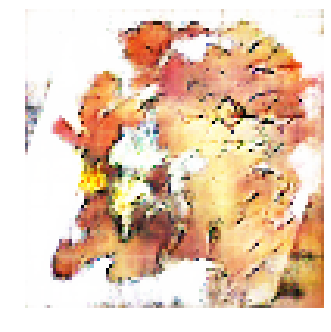


Epoch: 26340, D: -6.404, G: 5.189
Epoch: 26341, D: -6.322, G: 4.119
Epoch: 26342, D: -6.128, G: 3.385
Epoch: 26343, D: -5.751, G: 1.856
Epoch: 26344, D: -6.471, G: 5.115
Epoch: 26345, D: -3.994, G: 6.048
Epoch: 26346, D: -7.979, G: 4.265
Epoch: 26347, D: -6.228, G: 3.114
Epoch: 26348, D: -7.043, G: 4.447
Epoch: 26349, D: -5.992, G: 4.65
Epoch: 26350, D: -4.652, G: 4.4
Epoch: 26351, D: -6.919, G: 5.096
Epoch: 26352, D: -5.726, G: 4.005
Epoch: 26353, D: -5.965, G: 1.826
Epoch: 26354, D: -6.368, G: 5.005
Epoch: 26355, D: -6.512, G: 3.884
Epoch: 26356, D: -5.752, G: 3.624
Epoch: 26357, D: -5.21, G: 3.194
Epoch: 26358, D: -6.519, G: 3.799
Epoch: 26359, D: -4.57, G: 4.648


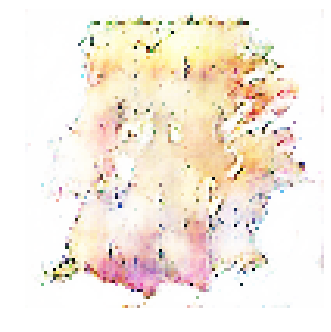


Epoch: 26360, D: -6.047, G: 4.026
Epoch: 26361, D: -5.436, G: 3.491
Epoch: 26362, D: -7.26, G: 4.027
Epoch: 26363, D: -5.014, G: 4.147
Epoch: 26364, D: -5.92, G: 3.131
Epoch: 26365, D: -7.63, G: 3.505
Epoch: 26366, D: -5.207, G: 5.848
Epoch: 26367, D: -6.519, G: 6.13
Epoch: 26368, D: -5.886, G: 4.603
Epoch: 26369, D: -4.549, G: 2.965
Epoch: 26370, D: -5.618, G: 2.519
Epoch: 26371, D: -5.966, G: 4.149
Epoch: 26372, D: -6.742, G: 4.137
Epoch: 26373, D: -7.242, G: 2.613
Epoch: 26374, D: -7.225, G: 3.296
Epoch: 26375, D: -6.286, G: 5.432
Epoch: 26376, D: -5.641, G: 4.225
Epoch: 26377, D: -5.803, G: 5.392
Epoch: 26378, D: -6.372, G: 3.829
Epoch: 26379, D: -5.276, G: 1.862


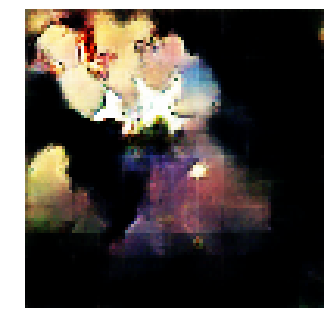


Epoch: 26380, D: -6.618, G: 3.494
Epoch: 26381, D: -5.473, G: 2.978
Epoch: 26382, D: -6.505, G: 4.617
Epoch: 26383, D: -5.359, G: 2.351
Epoch: 26384, D: -6.018, G: 3.568
Epoch: 26385, D: -6.555, G: 2.319
Epoch: 26386, D: -6.329, G: 2.581
Epoch: 26387, D: -6.114, G: 2.933
Epoch: 26388, D: -6.28, G: 4.357
Epoch: 26389, D: -6.011, G: 3.264
Epoch: 26390, D: -4.518, G: 2.473
Epoch: 26391, D: -5.073, G: 2.017
Epoch: 26392, D: -7.607, G: 2.294
Epoch: 26393, D: -5.366, G: 4.048
Epoch: 26394, D: -6.017, G: 3.404
Epoch: 26395, D: -6.466, G: 3.371
Epoch: 26396, D: -6.114, G: 2.615
Epoch: 26397, D: -6.669, G: 3.359
Epoch: 26398, D: -5.582, G: 4.991
Epoch: 26399, D: -6.689, G: 2.471


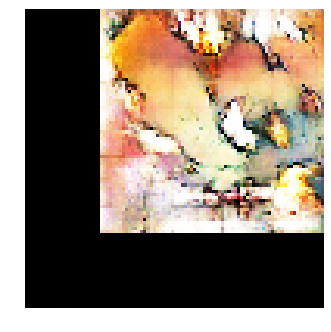


Epoch: 26400, D: -6.492, G: 3.406
Epoch: 26401, D: -5.705, G: 4.569
Epoch: 26402, D: -6.548, G: 2.923
Epoch: 26403, D: -6.62, G: 4.949
Epoch: 26404, D: -7.386, G: 3.527
Epoch: 26405, D: -4.959, G: 3.801
Epoch: 26406, D: -4.36, G: 3.865
Epoch: 26407, D: -5.669, G: 4.444
Epoch: 26408, D: -5.708, G: 4.389
Epoch: 26409, D: -6.323, G: 4.45
Epoch: 26410, D: -6.163, G: 4.626
Epoch: 26411, D: -6.067, G: 3.669
Epoch: 26412, D: -5.108, G: 4.425
Epoch: 26413, D: -5.063, G: 2.737
Epoch: 26414, D: -5.984, G: 2.428
Epoch: 26415, D: -6.616, G: 3.976
Epoch: 26416, D: -7.168, G: 4.288
Epoch: 26417, D: -6.633, G: 1.469
Epoch: 26418, D: -5.905, G: 3.363
Epoch: 26419, D: -6.405, G: 4.324


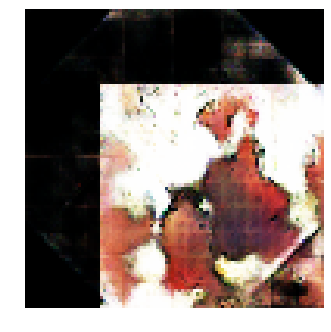


Epoch: 26420, D: -5.008, G: 4.154
Epoch: 26421, D: -6.041, G: 4.291
Epoch: 26422, D: -4.552, G: 3.754
Epoch: 26423, D: -5.812, G: 2.576
Epoch: 26424, D: -6.336, G: 3.214
Epoch: 26425, D: -6.466, G: 3.737
Epoch: 26426, D: -6.525, G: 3.138
Epoch: 26427, D: -5.49, G: 5.93
Epoch: 26428, D: -6.23, G: 5.064
Epoch: 26429, D: -5.84, G: 3.743
Epoch: 26430, D: -5.876, G: 2.415
Epoch: 26431, D: -5.977, G: 4.156
Epoch: 26432, D: -6.722, G: 3.859
Epoch: 26433, D: -6.467, G: 3.753
Epoch: 26434, D: -6.807, G: 3.423
Epoch: 26435, D: -6.254, G: 4.457
Epoch: 26436, D: -5.37, G: 2.195
Epoch: 26437, D: -6.519, G: 3.987
Epoch: 26438, D: -7.519, G: 3.781
Epoch: 26439, D: -6.524, G: 3.336


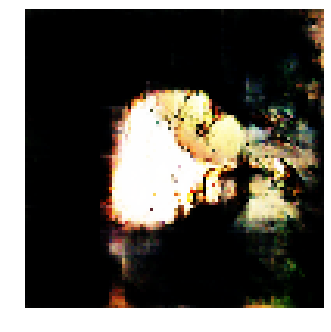


Epoch: 26440, D: -5.687, G: 4.749
Epoch: 26441, D: -5.381, G: 3.524
Epoch: 26442, D: -4.025, G: 4.879
Epoch: 26443, D: -6.787, G: 6.1
Epoch: 26444, D: -5.655, G: 2.489
Epoch: 26445, D: -5.279, G: 4.504
Epoch: 26446, D: -6.275, G: 1.797
Epoch: 26447, D: -6.814, G: 2.431
Epoch: 26448, D: -6.637, G: 2.993
Epoch: 26449, D: -5.515, G: 3.998
Epoch: 26450, D: -5.888, G: 4.053
Epoch: 26451, D: -6.128, G: 5.077
Epoch: 26452, D: -6.597, G: 3.299
Epoch: 26453, D: -6.861, G: 5.404
Epoch: 26454, D: -5.992, G: 4.76
Epoch: 26455, D: -5.902, G: 4.97
Epoch: 26456, D: -5.765, G: 3.795
Epoch: 26457, D: -6.938, G: 4.918
Epoch: 26458, D: -6.217, G: 3.019
Epoch: 26459, D: -4.491, G: 2.468


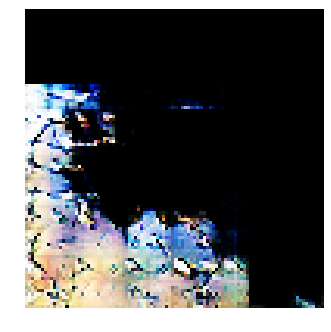


Epoch: 26460, D: -5.0, G: 4.33
Epoch: 26461, D: -5.496, G: 3.324
Epoch: 26462, D: -5.639, G: 4.424
Epoch: 26463, D: -4.96, G: 3.674
Epoch: 26464, D: -5.269, G: 4.675
Epoch: 26465, D: -5.618, G: 5.22
Epoch: 26466, D: -5.201, G: 3.372
Epoch: 26467, D: -5.511, G: 5.32
Epoch: 26468, D: -6.424, G: 4.804
Epoch: 26469, D: -6.941, G: 3.724
Epoch: 26470, D: -4.141, G: 3.636
Epoch: 26471, D: -5.498, G: 4.947
Epoch: 26472, D: -6.328, G: 4.281
Epoch: 26473, D: -5.333, G: 5.368
Epoch: 26474, D: -6.449, G: 3.112
Epoch: 26475, D: -6.136, G: 4.349
Epoch: 26476, D: -6.679, G: 3.116
Epoch: 26477, D: -6.359, G: 2.652
Epoch: 26478, D: -6.862, G: 3.648
Epoch: 26479, D: -5.308, G: 2.967


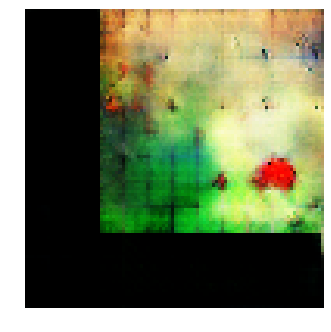


Epoch: 26480, D: -6.215, G: 4.106
Epoch: 26481, D: -5.547, G: 3.556
Epoch: 26482, D: -5.311, G: 4.035
Epoch: 26483, D: -6.064, G: 2.218
Epoch: 26484, D: -5.635, G: 4.943
Epoch: 26485, D: -5.975, G: 2.726
Epoch: 26486, D: -5.957, G: 4.095
Epoch: 26487, D: -5.503, G: 3.972
Epoch: 26488, D: -5.468, G: 4.511
Epoch: 26489, D: -7.02, G: 2.598
Epoch: 26490, D: -7.458, G: 2.461
Epoch: 26491, D: -4.906, G: 3.677
Epoch: 26492, D: -4.598, G: 4.103
Epoch: 26493, D: -6.477, G: 2.914
Epoch: 26494, D: -5.409, G: 3.901
Epoch: 26495, D: -6.118, G: 3.376
Epoch: 26496, D: -6.428, G: 2.163
Epoch: 26497, D: -7.176, G: 3.541
Epoch: 26498, D: -4.808, G: 1.395
Epoch: 26499, D: -5.923, G: 5.702


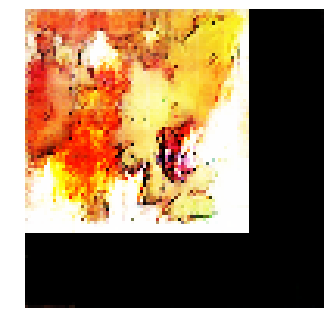


Epoch: 26500, D: -6.726, G: 5.395
Epoch: 26501, D: -6.928, G: 3.74
Epoch: 26502, D: -5.24, G: 3.757
Epoch: 26503, D: -6.286, G: 3.881
Epoch: 26504, D: -5.684, G: 5.008
Epoch: 26505, D: -6.433, G: 2.69
Epoch: 26506, D: -5.275, G: 5.626
Epoch: 26507, D: -6.39, G: 2.747
Epoch: 26508, D: -5.807, G: 1.87
Epoch: 26509, D: -4.76, G: 4.801
Epoch: 26510, D: -5.057, G: 3.801
Epoch: 26511, D: -5.873, G: 2.509
Epoch: 26512, D: -6.74, G: 3.305
Epoch: 26513, D: -7.182, G: 4.873
Epoch: 26514, D: -6.927, G: 3.046
Epoch: 26515, D: -7.11, G: 2.836
Epoch: 26516, D: -5.531, G: 3.967
Epoch: 26517, D: -5.358, G: 2.277
Epoch: 26518, D: -5.409, G: 1.864
Epoch: 26519, D: -6.581, G: 2.708


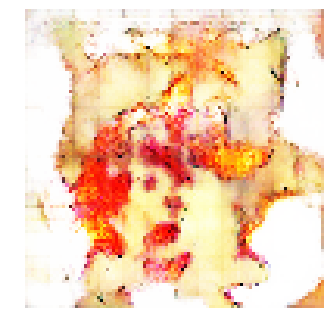


Epoch: 26520, D: -7.519, G: 3.06
Epoch: 26521, D: -4.894, G: 2.854
Epoch: 26522, D: -6.322, G: 4.083
Epoch: 26523, D: -5.875, G: 2.811
Epoch: 26524, D: -5.691, G: 4.998
Epoch: 26525, D: -6.518, G: 3.055
Epoch: 26526, D: -5.53, G: 2.965
Epoch: 26527, D: -5.13, G: 2.737
Epoch: 26528, D: -6.279, G: 3.744
Epoch: 26529, D: -6.22, G: 3.823
Epoch: 26530, D: -6.463, G: 2.954
Epoch: 26531, D: -5.412, G: 3.152
Epoch: 26532, D: -6.474, G: 5.977
Epoch: 26533, D: -6.089, G: 3.42
Epoch: 26534, D: -5.532, G: 4.692
Epoch: 26535, D: -5.29, G: 4.873
Epoch: 26536, D: -6.239, G: 3.082
Epoch: 26537, D: -6.433, G: 4.542
Epoch: 26538, D: -5.927, G: 3.056
Epoch: 26539, D: -6.123, G: 3.021


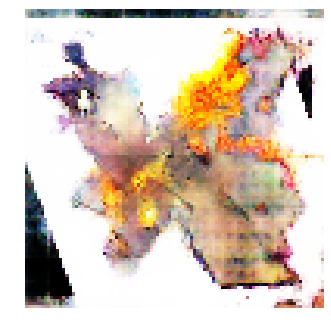


Epoch: 26540, D: -6.23, G: 5.184
Epoch: 26541, D: -6.005, G: 2.66
Epoch: 26542, D: -6.658, G: 6.139
Epoch: 26543, D: -6.971, G: 4.119
Epoch: 26544, D: -5.577, G: 3.238
Epoch: 26545, D: -6.941, G: 4.735
Epoch: 26546, D: -5.784, G: 1.894
Epoch: 26547, D: -6.09, G: 3.428
Epoch: 26548, D: -6.489, G: 3.119
Epoch: 26549, D: -6.642, G: 2.516
Epoch: 26550, D: -6.778, G: 3.33
Epoch: 26551, D: -4.996, G: 5.949
Epoch: 26552, D: -6.885, G: 5.521
Epoch: 26553, D: -8.0, G: 2.701
Epoch: 26554, D: -6.322, G: 3.968
Epoch: 26555, D: -6.512, G: 3.169
Epoch: 26556, D: -4.963, G: 2.694
Epoch: 26557, D: -5.037, G: 4.752
Epoch: 26558, D: -6.758, G: 1.671
Epoch: 26559, D: -7.07, G: 3.71


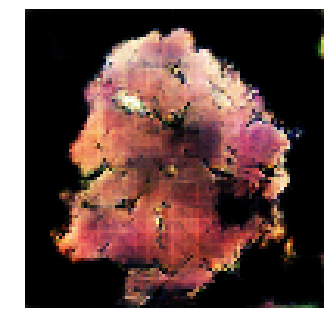


Epoch: 26560, D: -6.973, G: 6.062
Epoch: 26561, D: -6.313, G: 2.278
Epoch: 26562, D: -5.726, G: 4.782
Epoch: 26563, D: -5.971, G: 4.629
Epoch: 26564, D: -5.309, G: 4.699
Epoch: 26565, D: -5.149, G: 3.219
Epoch: 26566, D: -5.448, G: 3.423
Epoch: 26567, D: -5.947, G: 3.213
Epoch: 26568, D: -5.919, G: 3.432
Epoch: 26569, D: -4.646, G: 4.557
Epoch: 26570, D: -5.546, G: 4.657
Epoch: 26571, D: -7.324, G: 4.151
Epoch: 26572, D: -5.21, G: 3.637
Epoch: 26573, D: -4.853, G: 3.528
Epoch: 26574, D: -6.328, G: 4.615
Epoch: 26575, D: -5.938, G: 4.941
Epoch: 26576, D: -6.807, G: 4.123
Epoch: 26577, D: -4.834, G: 4.368
Epoch: 26578, D: -4.786, G: 2.75
Epoch: 26579, D: -5.883, G: 3.653


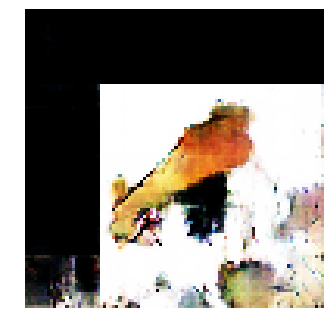


Epoch: 26580, D: -5.806, G: 6.331
Epoch: 26581, D: -5.057, G: 5.834
Epoch: 26582, D: -6.226, G: 4.538
Epoch: 26583, D: -6.76, G: 6.002
Epoch: 26584, D: -4.936, G: 4.279
Epoch: 26585, D: -6.243, G: 4.245
Epoch: 26586, D: -5.536, G: 3.916
Epoch: 26587, D: -6.299, G: 2.359
Epoch: 26588, D: -6.105, G: 4.269
Epoch: 26589, D: -6.151, G: 4.561
Epoch: 26590, D: -5.284, G: 3.481
Epoch: 26591, D: -5.354, G: 5.125
Epoch: 26592, D: -5.649, G: 3.241
Epoch: 26593, D: -6.077, G: 4.275
Epoch: 26594, D: -6.414, G: 3.862
Epoch: 26595, D: -4.798, G: 4.005
Epoch: 26596, D: -6.291, G: 3.595
Epoch: 26597, D: -6.219, G: 3.422
Epoch: 26598, D: -6.223, G: 3.847
Epoch: 26599, D: -7.386, G: 4.02


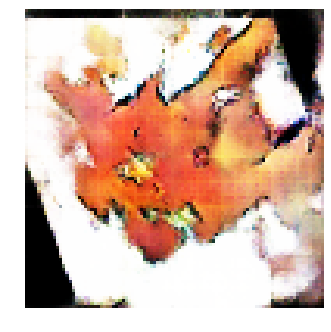


Epoch: 26600, D: -5.532, G: 3.078
Epoch: 26601, D: -5.248, G: 4.324
Epoch: 26602, D: -6.022, G: 6.375
Epoch: 26603, D: -6.125, G: 3.776
Epoch: 26604, D: -8.376, G: 5.19
Epoch: 26605, D: -4.968, G: 3.435
Epoch: 26606, D: -6.152, G: 2.711
Epoch: 26607, D: -7.455, G: 3.177
Epoch: 26608, D: -5.659, G: 1.932
Epoch: 26609, D: -5.673, G: 3.841
Epoch: 26610, D: -6.057, G: 3.361
Epoch: 26611, D: -6.353, G: 4.95
Epoch: 26612, D: -5.401, G: 4.478
Epoch: 26613, D: -6.579, G: 3.886
Epoch: 26614, D: -7.054, G: 2.78
Epoch: 26615, D: -6.859, G: 1.863
Epoch: 26616, D: -5.976, G: 3.05
Epoch: 26617, D: -5.749, G: 2.917
Epoch: 26618, D: -5.437, G: 4.478
Epoch: 26619, D: -6.163, G: 4.404


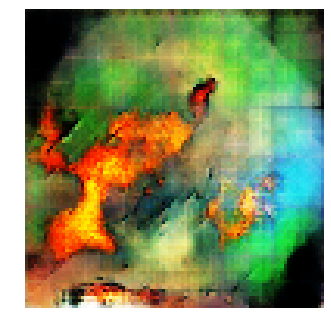


Epoch: 26620, D: -5.747, G: 3.728
Epoch: 26621, D: -5.959, G: 4.219
Epoch: 26622, D: -5.542, G: 4.659
Epoch: 26623, D: -7.615, G: 3.892
Epoch: 26624, D: -4.986, G: 4.483
Epoch: 26625, D: -6.79, G: 4.654
Epoch: 26626, D: -5.277, G: 4.114
Epoch: 26627, D: -4.473, G: 6.103
Epoch: 26628, D: -8.022, G: 3.635
Epoch: 26629, D: -6.347, G: 2.186
Epoch: 26630, D: -7.367, G: 2.826
Epoch: 26631, D: -6.027, G: 5.549
Epoch: 26632, D: -5.959, G: 2.477
Epoch: 26633, D: -4.646, G: 4.253
Epoch: 26634, D: -5.816, G: 5.699
Epoch: 26635, D: -5.474, G: 2.798
Epoch: 26636, D: -5.694, G: 3.974
Epoch: 26637, D: -5.577, G: 3.198
Epoch: 26638, D: -5.191, G: 3.313
Epoch: 26639, D: -6.512, G: 4.125


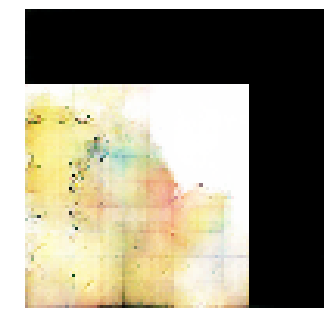


Epoch: 26640, D: -5.739, G: 3.742
Epoch: 26641, D: -5.722, G: 2.42
Epoch: 26642, D: -5.52, G: 3.476
Epoch: 26643, D: -5.527, G: 2.958
Epoch: 26644, D: -5.366, G: 1.872
Epoch: 26645, D: -5.727, G: 3.429
Epoch: 26646, D: -4.326, G: 3.049
Epoch: 26647, D: -4.939, G: 3.184
Epoch: 26648, D: -5.758, G: 3.092
Epoch: 26649, D: -6.802, G: 5.475
Epoch: 26650, D: -6.179, G: 4.835
Epoch: 26651, D: -6.54, G: 3.986
Epoch: 26652, D: -7.235, G: 2.076
Epoch: 26653, D: -6.521, G: 3.216
Epoch: 26654, D: -6.155, G: 5.53
Epoch: 26655, D: -5.912, G: 2.696
Epoch: 26656, D: -6.869, G: 3.294
Epoch: 26657, D: -5.127, G: 2.575
Epoch: 26658, D: -5.178, G: 3.272
Epoch: 26659, D: -5.952, G: 4.63


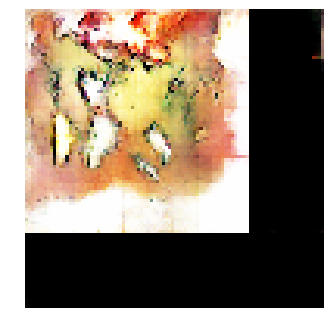


Epoch: 26660, D: -8.054, G: 2.111
Epoch: 26661, D: -5.561, G: 4.022
Epoch: 26662, D: -6.44, G: 3.573
Epoch: 26663, D: -5.527, G: 4.349
Epoch: 26664, D: -7.072, G: 1.848
Epoch: 26665, D: -5.456, G: 3.454
Epoch: 26666, D: -4.91, G: 5.355
Epoch: 26667, D: -7.983, G: 4.729
Epoch: 26668, D: -5.505, G: 2.623
Epoch: 26669, D: -5.333, G: 5.545
Epoch: 26670, D: -5.334, G: 5.024
Epoch: 26671, D: -5.092, G: 4.283
Epoch: 26672, D: -5.257, G: 2.118
Epoch: 26673, D: -5.704, G: 4.637
Epoch: 26674, D: -5.444, G: 3.523
Epoch: 26675, D: -6.189, G: 3.109
Epoch: 26676, D: -7.15, G: 2.193
Epoch: 26677, D: -6.238, G: 3.768
Epoch: 26678, D: -5.322, G: 5.177
Epoch: 26679, D: -6.248, G: 5.057


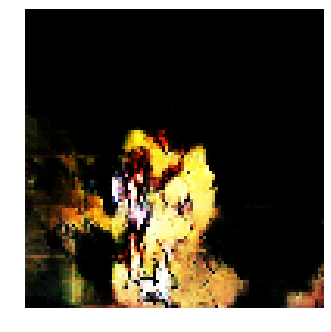


Epoch: 26680, D: -6.502, G: 3.315
Epoch: 26681, D: -6.262, G: 1.192
Epoch: 26682, D: -6.756, G: 2.973
Epoch: 26683, D: -7.25, G: 3.239
Epoch: 26684, D: -5.973, G: 5.221
Epoch: 26685, D: -5.578, G: 2.917
Epoch: 26686, D: -5.144, G: 5.873
Epoch: 26687, D: -4.031, G: 4.342
Epoch: 26688, D: -6.0, G: 4.837
Epoch: 26689, D: -6.147, G: 5.289
Epoch: 26690, D: -7.218, G: 3.052
Epoch: 26691, D: -5.429, G: 2.039
Epoch: 26692, D: -6.238, G: 4.513
Epoch: 26693, D: -7.817, G: 3.404
Epoch: 26694, D: -4.985, G: 3.7
Epoch: 26695, D: -5.727, G: 4.382
Epoch: 26696, D: -7.556, G: 3.37
Epoch: 26697, D: -5.51, G: 2.911
Epoch: 26698, D: -6.415, G: 4.19
Epoch: 26699, D: -6.624, G: 2.853


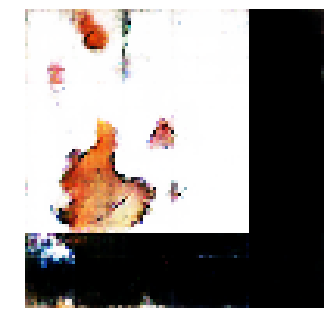


Epoch: 26700, D: -5.551, G: 3.038
Epoch: 26701, D: -5.7, G: 3.046
Epoch: 26702, D: -4.595, G: 5.273
Epoch: 26703, D: -5.289, G: 3.61
Epoch: 26704, D: -5.962, G: 3.908
Epoch: 26705, D: -4.807, G: 5.086
Epoch: 26706, D: -6.526, G: 5.561
Epoch: 26707, D: -6.158, G: 3.665
Epoch: 26708, D: -5.515, G: 5.395
Epoch: 26709, D: -4.561, G: 2.856
Epoch: 26710, D: -6.45, G: 4.674
Epoch: 26711, D: -5.479, G: 4.48
Epoch: 26712, D: -5.198, G: 5.273
Epoch: 26713, D: -5.324, G: 3.367
Epoch: 26714, D: -5.767, G: 4.582
Epoch: 26715, D: -6.608, G: 4.476
Epoch: 26716, D: -5.211, G: 2.204
Epoch: 26717, D: -5.727, G: 5.579
Epoch: 26718, D: -5.509, G: 3.608
Epoch: 26719, D: -5.964, G: 3.975


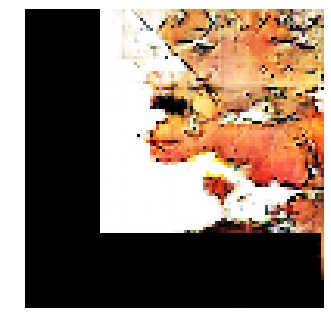


Epoch: 26720, D: -5.296, G: 2.946
Epoch: 26721, D: -6.085, G: 2.668
Epoch: 26722, D: -6.373, G: 3.891
Epoch: 26723, D: -6.671, G: 4.449
Epoch: 26724, D: -4.038, G: 4.281
Epoch: 26725, D: -7.469, G: 5.141
Epoch: 26726, D: -6.279, G: 4.459
Epoch: 26727, D: -5.737, G: 4.945
Epoch: 26728, D: -5.435, G: 5.474
Epoch: 26729, D: -6.884, G: 2.101
Epoch: 26730, D: -5.22, G: 3.379
Epoch: 26731, D: -4.087, G: 1.285
Epoch: 26732, D: -5.941, G: 4.846
Epoch: 26733, D: -6.107, G: 2.279
Epoch: 26734, D: -6.231, G: 5.47
Epoch: 26735, D: -6.594, G: 3.943
Epoch: 26736, D: -6.018, G: 1.29
Epoch: 26737, D: -4.779, G: 4.76
Epoch: 26738, D: -6.253, G: 3.491
Epoch: 26739, D: -3.982, G: 5.518


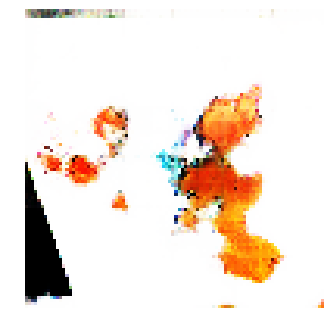


Epoch: 26740, D: -6.411, G: 5.737
Epoch: 26741, D: -5.321, G: 4.036
Epoch: 26742, D: -6.164, G: 5.417
Epoch: 26743, D: -6.474, G: 3.804
Epoch: 26744, D: -5.763, G: 0.6712
Epoch: 26745, D: -7.258, G: 3.434
Epoch: 26746, D: -6.902, G: 2.531
Epoch: 26747, D: -4.844, G: 3.005
Epoch: 26748, D: -6.229, G: 4.15
Epoch: 26749, D: -5.925, G: 4.523
Epoch: 26750, D: -6.896, G: 4.476
Epoch: 26751, D: -6.129, G: 2.825
Epoch: 26752, D: -6.584, G: 4.834
Epoch: 26753, D: -5.592, G: 3.667
Epoch: 26754, D: -6.197, G: 3.476
Epoch: 26755, D: -5.746, G: 3.093
Epoch: 26756, D: -5.993, G: 4.843
Epoch: 26757, D: -7.847, G: 3.626
Epoch: 26758, D: -6.054, G: 2.535
Epoch: 26759, D: -6.06, G: 3.702


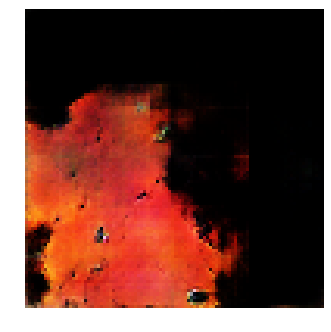


Epoch: 26760, D: -5.839, G: 6.143
Epoch: 26761, D: -5.851, G: 2.536
Epoch: 26762, D: -7.162, G: 3.777
Epoch: 26763, D: -6.904, G: 3.011
Epoch: 26764, D: -8.16, G: 5.161
Epoch: 26765, D: -7.986, G: 4.153
Epoch: 26766, D: -6.122, G: 3.101
Epoch: 26767, D: -6.794, G: 3.804
Epoch: 26768, D: -6.384, G: 4.003
Epoch: 26769, D: -6.401, G: 4.385
Epoch: 26770, D: -6.531, G: 5.064
Epoch: 26771, D: -6.743, G: 3.816
Epoch: 26772, D: -6.124, G: 3.225
Epoch: 26773, D: -5.397, G: 4.073
Epoch: 26774, D: -7.049, G: 5.032
Epoch: 26775, D: -5.302, G: 1.628
Epoch: 26776, D: -6.84, G: 2.579
Epoch: 26777, D: -5.931, G: 2.569
Epoch: 26778, D: -6.284, G: 2.329
Epoch: 26779, D: -6.015, G: 4.38


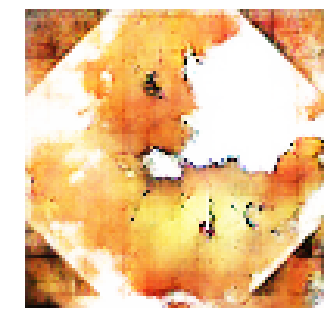


Epoch: 26780, D: -5.892, G: 5.121
Epoch: 26781, D: -6.198, G: 3.781
Epoch: 26782, D: -8.069, G: 3.286
Epoch: 26783, D: -6.656, G: 4.447
Epoch: 26784, D: -4.817, G: 5.022
Epoch: 26785, D: -6.369, G: 4.844
Epoch: 26786, D: -5.712, G: 5.609
Epoch: 26787, D: -5.965, G: 2.443
Epoch: 26788, D: -5.116, G: 4.805
Epoch: 26789, D: -6.407, G: 2.33
Epoch: 26790, D: -6.287, G: 2.551
Epoch: 26791, D: -5.896, G: 5.115
Epoch: 26792, D: -7.135, G: 2.35
Epoch: 26793, D: -6.189, G: 2.325
Epoch: 26794, D: -6.375, G: 4.032
Epoch: 26795, D: -6.535, G: 3.126
Epoch: 26796, D: -5.401, G: 4.25
Epoch: 26797, D: -5.341, G: 4.144
Epoch: 26798, D: -6.575, G: 4.758
Epoch: 26799, D: -4.394, G: 3.11


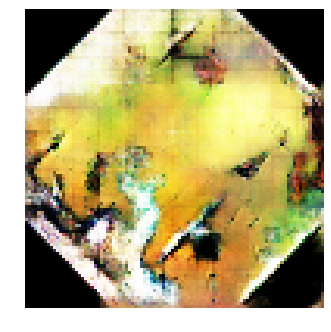


Epoch: 26800, D: -5.868, G: 5.11
Epoch: 26801, D: -8.006, G: 3.355
Epoch: 26802, D: -5.396, G: 5.259
Epoch: 26803, D: -6.856, G: 3.711
Epoch: 26804, D: -5.628, G: 5.168
Epoch: 26805, D: -6.37, G: 2.744
Epoch: 26806, D: -5.219, G: 4.089
Epoch: 26807, D: -6.389, G: 2.351
Epoch: 26808, D: -5.564, G: 3.468
Epoch: 26809, D: -5.668, G: 2.945
Epoch: 26810, D: -5.629, G: 4.406
Epoch: 26811, D: -6.694, G: 2.32
Epoch: 26812, D: -6.053, G: 3.195
Epoch: 26813, D: -5.651, G: 4.178
Epoch: 26814, D: -6.197, G: 5.679
Epoch: 26815, D: -7.177, G: 5.378
Epoch: 26816, D: -5.739, G: 5.429
Epoch: 26817, D: -7.436, G: 2.604
Epoch: 26818, D: -6.902, G: 3.474
Epoch: 26819, D: -4.582, G: 5.659


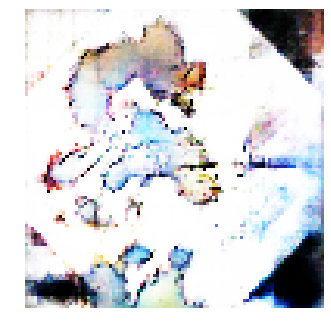


Epoch: 26820, D: -4.726, G: 3.403
Epoch: 26821, D: -5.645, G: 3.404
Epoch: 26822, D: -6.003, G: 4.763
Epoch: 26823, D: -5.796, G: 3.335
Epoch: 26824, D: -5.974, G: 3.866
Epoch: 26825, D: -7.693, G: 5.684
Epoch: 26826, D: -6.488, G: 2.819
Epoch: 26827, D: -6.767, G: 4.632
Epoch: 26828, D: -4.708, G: 2.946
Epoch: 26829, D: -6.625, G: 5.318
Epoch: 26830, D: -4.314, G: 3.541
Epoch: 26831, D: -5.566, G: 3.525
Epoch: 26832, D: -6.939, G: 5.717
Epoch: 26833, D: -7.435, G: 5.211
Epoch: 26834, D: -4.41, G: 6.16
Epoch: 26835, D: -7.479, G: 4.784
Epoch: 26836, D: -4.686, G: 6.398
Epoch: 26837, D: -5.696, G: 3.727
Epoch: 26838, D: -6.274, G: 2.635
Epoch: 26839, D: -6.426, G: 4.022


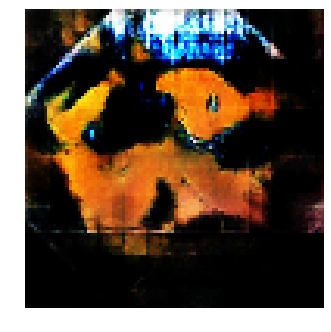


Epoch: 26840, D: -5.757, G: 4.311
Epoch: 26841, D: -4.774, G: 3.866
Epoch: 26842, D: -7.768, G: 3.799
Epoch: 26843, D: -6.238, G: 3.103
Epoch: 26844, D: -5.668, G: 1.751
Epoch: 26845, D: -5.998, G: 3.321
Epoch: 26846, D: -5.913, G: 3.701
Epoch: 26847, D: -4.757, G: 3.394
Epoch: 26848, D: -5.932, G: 4.439
Epoch: 26849, D: -7.035, G: 2.469
Epoch: 26850, D: -7.141, G: 6.422
Epoch: 26851, D: -5.727, G: 1.512
Epoch: 26852, D: -5.539, G: 3.586
Epoch: 26853, D: -6.983, G: 2.666
Epoch: 26854, D: -5.428, G: 4.745
Epoch: 26855, D: -7.656, G: 1.807
Epoch: 26856, D: -6.165, G: 4.651
Epoch: 26857, D: -5.704, G: 3.616
Epoch: 26858, D: -5.868, G: 6.836
Epoch: 26859, D: -4.828, G: 3.522


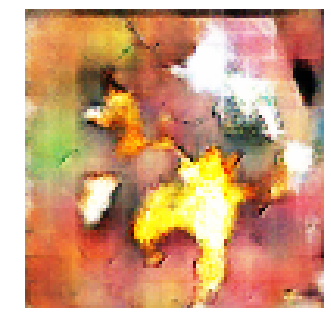


Epoch: 26860, D: -5.979, G: 3.884
Epoch: 26861, D: -5.8, G: 2.622
Epoch: 26862, D: -5.495, G: 2.748
Epoch: 26863, D: -5.853, G: 4.209
Epoch: 26864, D: -5.708, G: 3.72
Epoch: 26865, D: -5.14, G: 4.92
Epoch: 26866, D: -7.026, G: 5.521
Epoch: 26867, D: -5.675, G: 3.971
Epoch: 26868, D: -5.021, G: 4.425
Epoch: 26869, D: -4.94, G: 4.068
Epoch: 26870, D: -5.023, G: 3.851
Epoch: 26871, D: -6.005, G: 5.038
Epoch: 26872, D: -7.166, G: 3.279
Epoch: 26873, D: -5.692, G: 3.401
Epoch: 26874, D: -5.983, G: 2.866
Epoch: 26875, D: -4.831, G: 4.447
Epoch: 26876, D: -6.241, G: 4.932
Epoch: 26877, D: -5.523, G: 3.021
Epoch: 26878, D: -6.395, G: 3.899
Epoch: 26879, D: -6.749, G: 4.17


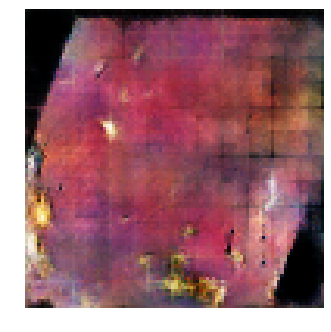


Epoch: 26880, D: -6.079, G: 3.705
Epoch: 26881, D: -6.299, G: 2.865
Epoch: 26882, D: -6.207, G: 1.943
Epoch: 26883, D: -5.634, G: 1.947
Epoch: 26884, D: -6.312, G: 2.566
Epoch: 26885, D: -5.639, G: 2.531
Epoch: 26886, D: -6.212, G: 3.643
Epoch: 26887, D: -5.491, G: 2.977
Epoch: 26888, D: -4.661, G: 3.853
Epoch: 26889, D: -5.693, G: 3.383
Epoch: 26890, D: -5.482, G: 3.125
Epoch: 26891, D: -6.626, G: 2.31
Epoch: 26892, D: -6.711, G: 0.8845
Epoch: 26893, D: -4.515, G: 2.951
Epoch: 26894, D: -5.44, G: 2.056
Epoch: 26895, D: -6.435, G: 4.46
Epoch: 26896, D: -6.941, G: 3.501
Epoch: 26897, D: -6.039, G: 2.918
Epoch: 26898, D: -6.226, G: 3.312
Epoch: 26899, D: -7.413, G: 3.51


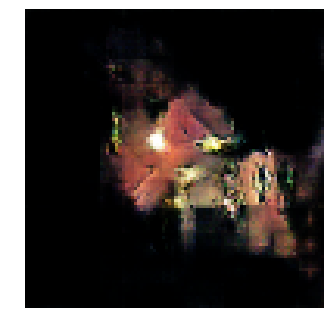


Epoch: 26900, D: -5.439, G: 3.198
Epoch: 26901, D: -6.916, G: 3.567
Epoch: 26902, D: -5.426, G: 3.961
Epoch: 26903, D: -8.199, G: 3.576
Epoch: 26904, D: -5.908, G: 5.546
Epoch: 26905, D: -5.72, G: 3.762
Epoch: 26906, D: -6.352, G: 2.445
Epoch: 26907, D: -6.354, G: 2.814
Epoch: 26908, D: -6.452, G: 4.949
Epoch: 26909, D: -6.583, G: 4.374
Epoch: 26910, D: -5.892, G: 5.829
Epoch: 26911, D: -6.563, G: 4.242
Epoch: 26912, D: -7.7, G: 3.544
Epoch: 26913, D: -7.6, G: 1.439
Epoch: 26914, D: -7.75, G: 4.474
Epoch: 26915, D: -6.524, G: 2.102
Epoch: 26916, D: -5.103, G: 4.306
Epoch: 26917, D: -5.286, G: 4.707
Epoch: 26918, D: -6.509, G: 4.29
Epoch: 26919, D: -6.95, G: 4.08


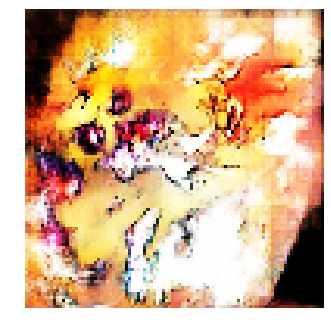


Epoch: 26920, D: -6.252, G: 5.287
Epoch: 26921, D: -5.947, G: 2.084
Epoch: 26922, D: -6.631, G: 3.172
Epoch: 26923, D: -4.82, G: 3.373
Epoch: 26924, D: -6.509, G: 3.123
Epoch: 26925, D: -5.421, G: 1.614
Epoch: 26926, D: -6.385, G: 2.764
Epoch: 26927, D: -5.694, G: 3.656
Epoch: 26928, D: -6.453, G: 3.618
Epoch: 26929, D: -7.0, G: 1.928
Epoch: 26930, D: -5.545, G: 6.072
Epoch: 26931, D: -7.01, G: 5.257
Epoch: 26932, D: -5.867, G: 5.554
Epoch: 26933, D: -6.296, G: 4.271
Epoch: 26934, D: -6.591, G: 3.894
Epoch: 26935, D: -6.86, G: 3.555
Epoch: 26936, D: -5.526, G: 3.796
Epoch: 26937, D: -7.786, G: 3.054
Epoch: 26938, D: -4.179, G: 1.717
Epoch: 26939, D: -6.74, G: 4.524


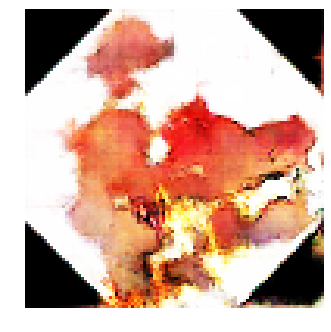


Epoch: 26940, D: -6.708, G: 4.031
Epoch: 26941, D: -5.857, G: 3.265
Epoch: 26942, D: -7.659, G: 4.055
Epoch: 26943, D: -6.76, G: 2.722
Epoch: 26944, D: -5.484, G: 5.201
Epoch: 26945, D: -6.192, G: 4.882
Epoch: 26946, D: -6.103, G: 4.381
Epoch: 26947, D: -5.172, G: 0.9453
Epoch: 26948, D: -5.676, G: 2.465
Epoch: 26949, D: -6.69, G: 2.955
Epoch: 26950, D: -5.947, G: 3.715
Epoch: 26951, D: -5.087, G: 3.809
Epoch: 26952, D: -6.689, G: 3.431
Epoch: 26953, D: -4.937, G: 4.03
Epoch: 26954, D: -5.678, G: 4.926
Epoch: 26955, D: -6.151, G: 2.888
Epoch: 26956, D: -4.553, G: 4.638
Epoch: 26957, D: -6.004, G: 4.424
Epoch: 26958, D: -4.573, G: 5.539
Epoch: 26959, D: -6.786, G: 3.901


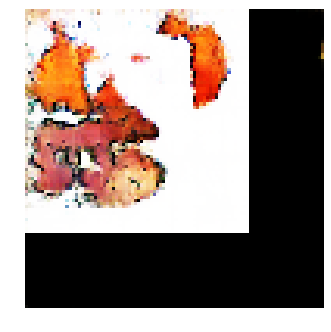


Epoch: 26960, D: -4.094, G: 2.542
Epoch: 26961, D: -5.69, G: 1.201
Epoch: 26962, D: -6.404, G: 3.829
Epoch: 26963, D: -4.971, G: 4.662
Epoch: 26964, D: -5.357, G: 4.138
Epoch: 26965, D: -5.236, G: 4.826
Epoch: 26966, D: -5.586, G: 3.739
Epoch: 26967, D: -5.824, G: 0.04838
Epoch: 26968, D: -5.696, G: 3.924
Epoch: 26969, D: -5.751, G: 2.554
Epoch: 26970, D: -6.674, G: 4.482
Epoch: 26971, D: -5.749, G: 1.888
Epoch: 26972, D: -7.04, G: 3.319
Epoch: 26973, D: -5.937, G: 2.434
Epoch: 26974, D: -6.601, G: 4.5
Epoch: 26975, D: -5.128, G: 3.211
Epoch: 26976, D: -5.135, G: 2.516
Epoch: 26977, D: -6.122, G: 5.422
Epoch: 26978, D: -5.334, G: 4.881
Epoch: 26979, D: -7.137, G: 6.113


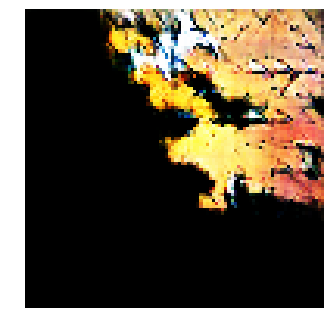


Epoch: 26980, D: -4.969, G: 3.178
Epoch: 26981, D: -5.653, G: 4.266
Epoch: 26982, D: -5.686, G: 6.033
Epoch: 26983, D: -6.005, G: 4.443
Epoch: 26984, D: -5.681, G: 3.712
Epoch: 26985, D: -6.86, G: 2.968
Epoch: 26986, D: -6.717, G: 3.787
Epoch: 26987, D: -5.748, G: 2.244
Epoch: 26988, D: -6.707, G: 4.523
Epoch: 26989, D: -5.855, G: 2.308
Epoch: 26990, D: -6.013, G: 6.247
Epoch: 26991, D: -6.231, G: 3.368
Epoch: 26992, D: -7.255, G: 3.444
Epoch: 26993, D: -7.053, G: 5.648
Epoch: 26994, D: -6.053, G: 2.465
Epoch: 26995, D: -5.429, G: 3.755
Epoch: 26996, D: -6.038, G: 4.429
Epoch: 26997, D: -7.114, G: 2.681
Epoch: 26998, D: -5.573, G: 1.737
Epoch: 26999, D: -6.119, G: 3.656


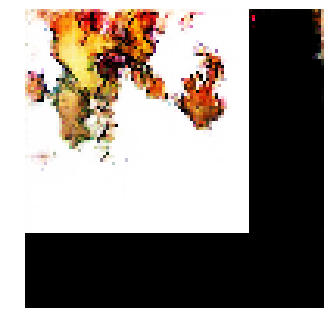


Epoch: 27000, D: -4.937, G: 3.119
Epoch: 27001, D: -6.269, G: 3.59
Epoch: 27002, D: -6.079, G: 3.006
Epoch: 27003, D: -4.934, G: 3.975
Epoch: 27004, D: -6.256, G: 4.274
Epoch: 27005, D: -6.058, G: 3.667
Epoch: 27006, D: -7.777, G: 2.092
Epoch: 27007, D: -6.361, G: 3.914
Epoch: 27008, D: -6.46, G: 3.225
Epoch: 27009, D: -5.634, G: 7.254
Epoch: 27010, D: -6.153, G: 3.057
Epoch: 27011, D: -6.091, G: 1.182
Epoch: 27012, D: -6.816, G: 2.948
Epoch: 27013, D: -5.955, G: 3.622
Epoch: 27014, D: -5.307, G: 3.739
Epoch: 27015, D: -5.345, G: 3.979
Epoch: 27016, D: -7.236, G: 5.048
Epoch: 27017, D: -5.029, G: 2.892
Epoch: 27018, D: -5.749, G: 4.15
Epoch: 27019, D: -5.588, G: 4.644


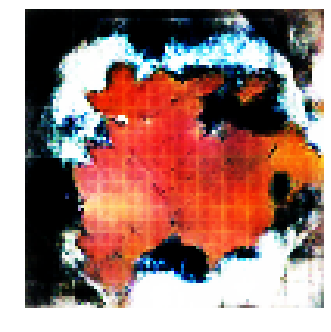


Epoch: 27020, D: -7.516, G: 4.171
Epoch: 27021, D: -7.066, G: 4.905
Epoch: 27022, D: -5.145, G: 6.448
Epoch: 27023, D: -4.979, G: 4.704
Epoch: 27024, D: -5.63, G: 4.645
Epoch: 27025, D: -6.359, G: 5.794
Epoch: 27026, D: -7.804, G: 4.381
Epoch: 27027, D: -6.428, G: 3.517
Epoch: 27028, D: -6.472, G: 3.324
Epoch: 27029, D: -5.827, G: 3.163
Epoch: 27030, D: -5.833, G: 3.665
Epoch: 27031, D: -5.324, G: 3.747
Epoch: 27032, D: -5.259, G: 4.685
Epoch: 27033, D: -5.924, G: 4.637
Epoch: 27034, D: -7.541, G: 4.929
Epoch: 27035, D: -6.213, G: 3.813
Epoch: 27036, D: -5.925, G: 5.254
Epoch: 27037, D: -6.137, G: 3.163
Epoch: 27038, D: -6.621, G: 4.686
Epoch: 27039, D: -5.839, G: 5.089


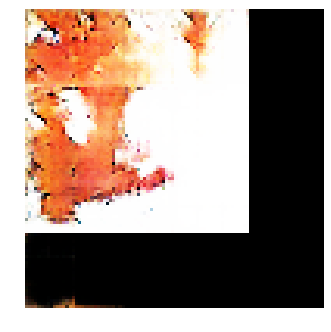


Epoch: 27040, D: -5.999, G: 3.276
Epoch: 27041, D: -5.238, G: 4.053
Epoch: 27042, D: -7.891, G: 4.015
Epoch: 27043, D: -5.716, G: 4.461
Epoch: 27044, D: -5.969, G: 4.419
Epoch: 27045, D: -6.039, G: 4.912
Epoch: 27046, D: -6.449, G: 4.938
Epoch: 27047, D: -5.608, G: 3.059
Epoch: 27048, D: -5.93, G: 4.72
Epoch: 27049, D: -6.104, G: 4.886
Epoch: 27050, D: -6.671, G: 5.14
Epoch: 27051, D: -6.258, G: 5.364
Epoch: 27052, D: -5.828, G: 5.356
Epoch: 27053, D: -6.012, G: 3.638
Epoch: 27054, D: -5.465, G: 3.732
Epoch: 27055, D: -6.193, G: 5.153
Epoch: 27056, D: -6.825, G: 4.395
Epoch: 27057, D: -5.609, G: 3.288
Epoch: 27058, D: -3.877, G: 5.236
Epoch: 27059, D: -6.917, G: 6.907


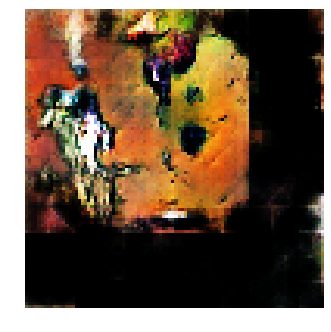


Epoch: 27060, D: -5.307, G: 3.992
Epoch: 27061, D: -6.097, G: 3.257
Epoch: 27062, D: -5.195, G: 5.315
Epoch: 27063, D: -4.426, G: 5.204
Epoch: 27064, D: -5.269, G: 3.559
Epoch: 27065, D: -5.643, G: 2.833
Epoch: 27066, D: -5.679, G: 4.656
Epoch: 27067, D: -7.12, G: 2.739
Epoch: 27068, D: -5.013, G: 5.118
Epoch: 27069, D: -5.658, G: 3.209
Epoch: 27070, D: -7.085, G: 4.166
Epoch: 27071, D: -5.859, G: 5.639
Epoch: 27072, D: -6.262, G: 3.509
Epoch: 27073, D: -6.297, G: 4.893
Epoch: 27074, D: -5.891, G: 6.055
Epoch: 27075, D: -6.174, G: 1.954
Epoch: 27076, D: -6.818, G: 4.248
Epoch: 27077, D: -6.543, G: 3.611
Epoch: 27078, D: -6.621, G: 3.829
Epoch: 27079, D: -5.163, G: 4.253


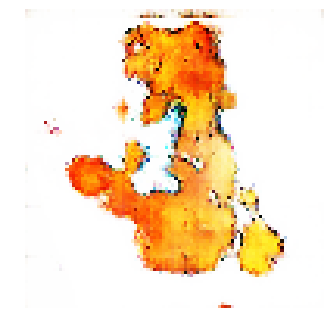


Epoch: 27080, D: -6.467, G: 2.059
Epoch: 27081, D: -5.498, G: 3.287
Epoch: 27082, D: -5.776, G: 3.356
Epoch: 27083, D: -6.71, G: 3.969
Epoch: 27084, D: -5.469, G: 3.894
Epoch: 27085, D: -6.754, G: 3.409
Epoch: 27086, D: -6.078, G: 3.263
Epoch: 27087, D: -5.93, G: 2.62
Epoch: 27088, D: -5.489, G: 4.368
Epoch: 27089, D: -5.6, G: 3.575
Epoch: 27090, D: -5.57, G: 1.86
Epoch: 27091, D: -6.68, G: 1.849
Epoch: 27092, D: -6.454, G: 2.24
Epoch: 27093, D: -5.531, G: 3.31
Epoch: 27094, D: -5.737, G: 2.756
Epoch: 27095, D: -7.276, G: 3.891
Epoch: 27096, D: -5.065, G: 2.696
Epoch: 27097, D: -7.095, G: 3.271
Epoch: 27098, D: -5.285, G: 1.835
Epoch: 27099, D: -5.211, G: 4.566


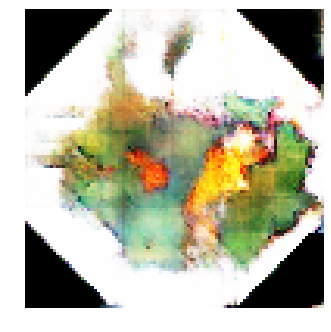


Epoch: 27100, D: -6.464, G: 4.235
Epoch: 27101, D: -5.215, G: 2.364
Epoch: 27102, D: -5.479, G: 4.453
Epoch: 27103, D: -6.133, G: 2.954
Epoch: 27104, D: -5.022, G: 3.897
Epoch: 27105, D: -6.598, G: 5.238
Epoch: 27106, D: -7.386, G: 3.039
Epoch: 27107, D: -6.55, G: 3.918
Epoch: 27108, D: -5.989, G: 5.253
Epoch: 27109, D: -6.116, G: 5.17
Epoch: 27110, D: -7.04, G: 5.176
Epoch: 27111, D: -5.908, G: 5.586
Epoch: 27112, D: -5.914, G: 3.422
Epoch: 27113, D: -6.63, G: 5.232
Epoch: 27114, D: -6.581, G: 3.422
Epoch: 27115, D: -5.508, G: 2.539
Epoch: 27116, D: -6.403, G: 4.329
Epoch: 27117, D: -6.713, G: 4.466
Epoch: 27118, D: -6.815, G: 3.917
Epoch: 27119, D: -5.619, G: 4.267


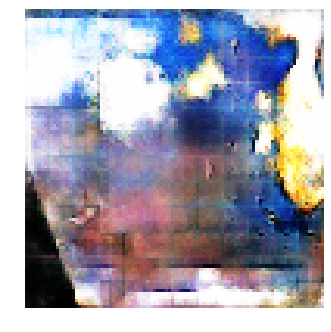


Epoch: 27120, D: -5.187, G: 3.66
Epoch: 27121, D: -6.628, G: 3.76
Epoch: 27122, D: -6.307, G: 2.949
Epoch: 27123, D: -5.118, G: 4.46
Epoch: 27124, D: -5.754, G: 3.199
Epoch: 27125, D: -7.465, G: 3.387
Epoch: 27126, D: -6.436, G: 2.243
Epoch: 27127, D: -6.019, G: 3.552
Epoch: 27128, D: -5.908, G: 4.764
Epoch: 27129, D: -6.32, G: 3.168
Epoch: 27130, D: -6.645, G: 2.053
Epoch: 27131, D: -6.554, G: 3.323
Epoch: 27132, D: -6.152, G: 2.712
Epoch: 27133, D: -6.311, G: 4.712
Epoch: 27134, D: -7.001, G: 2.745
Epoch: 27135, D: -6.38, G: 3.644
Epoch: 27136, D: -4.441, G: 2.653
Epoch: 27137, D: -5.38, G: 2.338
Epoch: 27138, D: -6.176, G: 5.834
Epoch: 27139, D: -5.273, G: 4.264


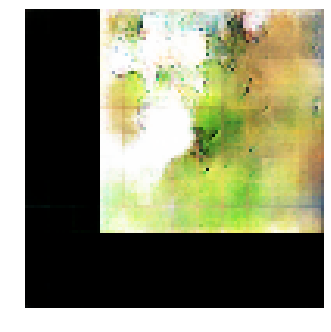


Epoch: 27140, D: -6.868, G: 5.564
Epoch: 27141, D: -5.117, G: 3.453
Epoch: 27142, D: -7.275, G: 4.325
Epoch: 27143, D: -5.901, G: 2.62
Epoch: 27144, D: -5.405, G: 4.009
Epoch: 27145, D: -6.248, G: 2.787
Epoch: 27146, D: -6.223, G: 5.35
Epoch: 27147, D: -6.535, G: 5.047
Epoch: 27148, D: -6.258, G: 5.73
Epoch: 27149, D: -5.723, G: 4.189
Epoch: 27150, D: -7.885, G: 3.025
Epoch: 27151, D: -5.194, G: 3.392
Epoch: 27152, D: -6.114, G: 5.387
Epoch: 27153, D: -6.655, G: 4.948
Epoch: 27154, D: -5.034, G: 3.844
Epoch: 27155, D: -5.777, G: 2.437
Epoch: 27156, D: -5.97, G: 2.055
Epoch: 27157, D: -5.755, G: 3.784
Epoch: 27158, D: -6.909, G: 3.778
Epoch: 27159, D: -6.548, G: 3.315


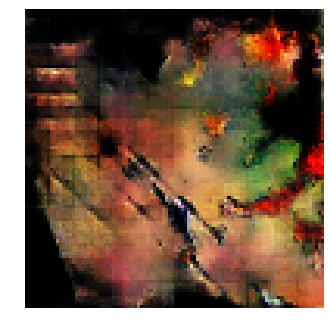


Epoch: 27160, D: -5.689, G: 3.19
Epoch: 27161, D: -5.044, G: 3.659
Epoch: 27162, D: -6.494, G: 3.669
Epoch: 27163, D: -6.292, G: 4.084
Epoch: 27164, D: -5.537, G: 5.144
Epoch: 27165, D: -6.075, G: 2.802
Epoch: 27166, D: -5.826, G: 5.066
Epoch: 27167, D: -7.608, G: 3.283
Epoch: 27168, D: -5.334, G: 4.126
Epoch: 27169, D: -6.771, G: 3.543
Epoch: 27170, D: -5.441, G: 5.409
Epoch: 27171, D: -5.231, G: 3.255
Epoch: 27172, D: -6.481, G: 5.811
Epoch: 27173, D: -6.448, G: 2.909
Epoch: 27174, D: -6.775, G: 5.512
Epoch: 27175, D: -6.452, G: 4.752
Epoch: 27176, D: -6.155, G: 7.908
Epoch: 27177, D: -5.616, G: 5.69
Epoch: 27178, D: -5.907, G: 5.945
Epoch: 27179, D: -6.442, G: 3.883


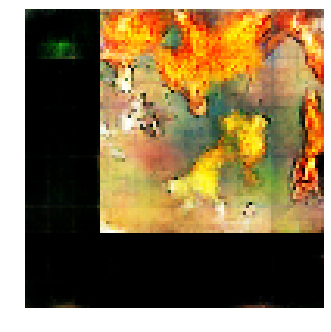


Epoch: 27180, D: -5.317, G: 3.537
Epoch: 27181, D: -5.593, G: 2.711
Epoch: 27182, D: -5.89, G: 2.596
Epoch: 27183, D: -6.815, G: 3.174
Epoch: 27184, D: -5.385, G: 2.532
Epoch: 27185, D: -5.708, G: 5.337
Epoch: 27186, D: -7.005, G: 3.663
Epoch: 27187, D: -5.659, G: 3.988
Epoch: 27188, D: -4.82, G: 4.175
Epoch: 27189, D: -6.455, G: 5.768
Epoch: 27190, D: -5.502, G: 1.753
Epoch: 27191, D: -5.696, G: 3.523
Epoch: 27192, D: -6.315, G: 3.726
Epoch: 27193, D: -6.639, G: 3.507
Epoch: 27194, D: -4.639, G: 4.551
Epoch: 27195, D: -6.693, G: 4.303
Epoch: 27196, D: -6.842, G: 3.263
Epoch: 27197, D: -6.867, G: 3.568
Epoch: 27198, D: -5.415, G: 5.917
Epoch: 27199, D: -4.941, G: 4.24


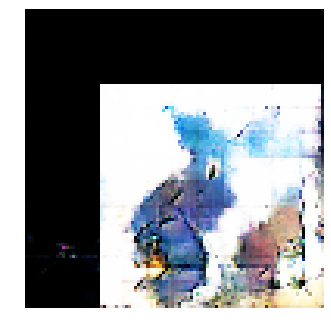


Epoch: 27200, D: -4.559, G: 5.259
Epoch: 27201, D: -6.745, G: 3.647
Epoch: 27202, D: -6.209, G: 4.509
Epoch: 27203, D: -6.385, G: 5.487
Epoch: 27204, D: -5.692, G: 3.41
Epoch: 27205, D: -7.367, G: 2.871
Epoch: 27206, D: -5.873, G: 4.017
Epoch: 27207, D: -6.117, G: 4.577
Epoch: 27208, D: -5.497, G: 2.862
Epoch: 27209, D: -7.74, G: 5.336
Epoch: 27210, D: -4.862, G: 1.993
Epoch: 27211, D: -6.057, G: 3.534
Epoch: 27212, D: -7.524, G: 3.736
Epoch: 27213, D: -7.211, G: 2.234
Epoch: 27214, D: -6.742, G: 2.377
Epoch: 27215, D: -5.913, G: 3.489
Epoch: 27216, D: -6.15, G: 5.335
Epoch: 27217, D: -5.219, G: 3.382
Epoch: 27218, D: -6.98, G: 4.481
Epoch: 27219, D: -7.235, G: 4.864


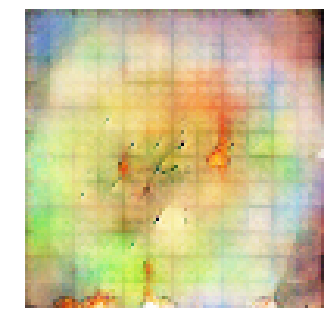


Epoch: 27220, D: -5.732, G: 3.251
Epoch: 27221, D: -5.939, G: 3.822
Epoch: 27222, D: -4.267, G: 2.808
Epoch: 27223, D: -6.315, G: 4.014
Epoch: 27224, D: -5.108, G: 3.938
Epoch: 27225, D: -5.047, G: 1.086
Epoch: 27226, D: -6.795, G: 3.602
Epoch: 27227, D: -7.718, G: 2.104
Epoch: 27228, D: -6.076, G: 3.379
Epoch: 27229, D: -4.205, G: 4.151
Epoch: 27230, D: -5.566, G: 4.791
Epoch: 27231, D: -7.027, G: 2.248
Epoch: 27232, D: -6.858, G: 4.44
Epoch: 27233, D: -6.055, G: 3.761
Epoch: 27234, D: -6.517, G: 3.071
Epoch: 27235, D: -6.019, G: 3.94
Epoch: 27236, D: -6.707, G: 3.313
Epoch: 27237, D: -5.892, G: 3.498
Epoch: 27238, D: -6.638, G: 2.783
Epoch: 27239, D: -5.595, G: 2.051


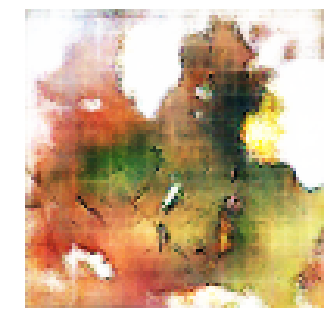


Epoch: 27240, D: -5.307, G: 4.246
Epoch: 27241, D: -5.581, G: 4.838
Epoch: 27242, D: -6.201, G: 2.621
Epoch: 27243, D: -6.636, G: 3.591
Epoch: 27244, D: -6.146, G: 2.676
Epoch: 27245, D: -4.665, G: 3.976
Epoch: 27246, D: -4.418, G: 3.107
Epoch: 27247, D: -5.76, G: 4.742
Epoch: 27248, D: -7.387, G: 2.552
Epoch: 27249, D: -5.339, G: 4.586
Epoch: 27250, D: -5.951, G: 5.063
Epoch: 27251, D: -7.195, G: 3.791
Epoch: 27252, D: -6.147, G: 1.453
Epoch: 27253, D: -5.696, G: 4.016
Epoch: 27254, D: -5.676, G: 2.058
Epoch: 27255, D: -5.535, G: 2.917
Epoch: 27256, D: -4.699, G: 3.476
Epoch: 27257, D: -5.062, G: 5.19
Epoch: 27258, D: -6.846, G: 4.315
Epoch: 27259, D: -5.273, G: 2.544


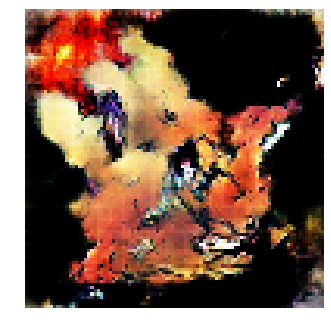


Epoch: 27260, D: -4.81, G: 3.589
Epoch: 27261, D: -6.475, G: 4.667
Epoch: 27262, D: -5.89, G: 3.397
Epoch: 27263, D: -6.801, G: 3.654
Epoch: 27264, D: -7.804, G: 3.252
Epoch: 27265, D: -5.756, G: 1.958
Epoch: 27266, D: -6.258, G: 1.64
Epoch: 27267, D: -4.676, G: 1.176
Epoch: 27268, D: -6.36, G: 4.623
Epoch: 27269, D: -6.423, G: 4.705
Epoch: 27270, D: -6.143, G: 2.514
Epoch: 27271, D: -4.729, G: 4.211
Epoch: 27272, D: -5.764, G: 4.16
Epoch: 27273, D: -5.891, G: 2.122
Epoch: 27274, D: -9.054, G: 5.443
Epoch: 27275, D: -5.803, G: 3.963
Epoch: 27276, D: -6.771, G: 4.215
Epoch: 27277, D: -5.41, G: 2.511
Epoch: 27278, D: -5.418, G: 2.552
Epoch: 27279, D: -5.428, G: 4.83


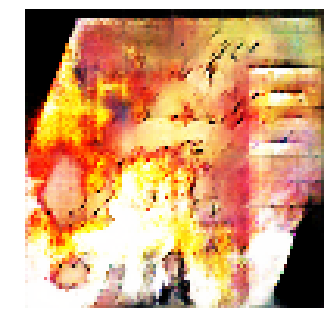


Epoch: 27280, D: -4.766, G: 4.57
Epoch: 27281, D: -6.865, G: 4.158
Epoch: 27282, D: -5.9, G: 3.12
Epoch: 27283, D: -5.502, G: 2.871
Epoch: 27284, D: -4.291, G: 5.226
Epoch: 27285, D: -6.788, G: 2.96
Epoch: 27286, D: -6.969, G: 1.844
Epoch: 27287, D: -5.79, G: 1.467
Epoch: 27288, D: -4.815, G: 3.841
Epoch: 27289, D: -5.303, G: 3.37
Epoch: 27290, D: -5.613, G: 5.238
Epoch: 27291, D: -4.09, G: 3.468
Epoch: 27292, D: -4.977, G: 2.988
Epoch: 27293, D: -5.083, G: 3.958
Epoch: 27294, D: -6.033, G: 3.082
Epoch: 27295, D: -6.185, G: 1.552
Epoch: 27296, D: -5.975, G: 3.315
Epoch: 27297, D: -6.026, G: 6.348
Epoch: 27298, D: -5.892, G: 2.975
Epoch: 27299, D: -6.056, G: 4.496


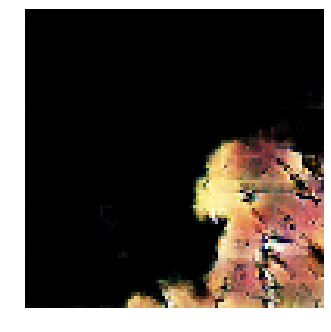


Epoch: 27300, D: -7.395, G: 4.872
Epoch: 27301, D: -5.924, G: 2.125
Epoch: 27302, D: -5.307, G: 5.988
Epoch: 27303, D: -7.457, G: 3.502
Epoch: 27304, D: -7.935, G: 3.899
Epoch: 27305, D: -5.568, G: 4.705
Epoch: 27306, D: -6.039, G: 4.549
Epoch: 27307, D: -6.488, G: 5.259
Epoch: 27308, D: -5.802, G: 3.32
Epoch: 27309, D: -5.463, G: 3.857
Epoch: 27310, D: -5.807, G: 4.277
Epoch: 27311, D: -5.777, G: 5.724
Epoch: 27312, D: -6.49, G: 3.339
Epoch: 27313, D: -6.519, G: 4.672
Epoch: 27314, D: -6.828, G: 3.402
Epoch: 27315, D: -6.25, G: 4.991
Epoch: 27316, D: -5.892, G: 4.166
Epoch: 27317, D: -5.479, G: 4.956
Epoch: 27318, D: -4.833, G: 3.991
Epoch: 27319, D: -7.763, G: 3.903


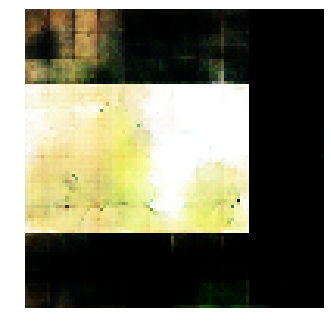


Epoch: 27320, D: -7.112, G: 3.873
Epoch: 27321, D: -5.819, G: 4.39
Epoch: 27322, D: -7.642, G: 4.252
Epoch: 27323, D: -5.576, G: 4.824
Epoch: 27324, D: -7.407, G: 3.67
Epoch: 27325, D: -6.041, G: 2.439
Epoch: 27326, D: -6.406, G: 3.083
Epoch: 27327, D: -6.465, G: 5.324
Epoch: 27328, D: -6.295, G: 4.105
Epoch: 27329, D: -6.486, G: 3.436
Epoch: 27330, D: -5.31, G: 4.729
Epoch: 27331, D: -6.086, G: 4.582
Epoch: 27332, D: -6.645, G: 3.378
Epoch: 27333, D: -5.883, G: 5.135
Epoch: 27334, D: -6.185, G: 3.391
Epoch: 27335, D: -5.927, G: 4.523
Epoch: 27336, D: -5.53, G: 4.81
Epoch: 27337, D: -5.983, G: 3.681
Epoch: 27338, D: -7.328, G: 4.124
Epoch: 27339, D: -5.125, G: 5.404


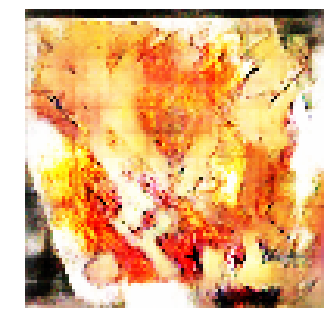


Epoch: 27340, D: -6.094, G: 6.61
Epoch: 27341, D: -6.365, G: 2.619
Epoch: 27342, D: -5.988, G: 2.852
Epoch: 27343, D: -6.431, G: 3.002
Epoch: 27344, D: -8.088, G: 4.279
Epoch: 27345, D: -5.68, G: 2.823
Epoch: 27346, D: -5.585, G: 4.301
Epoch: 27347, D: -5.728, G: 3.199
Epoch: 27348, D: -6.997, G: 3.185
Epoch: 27349, D: -6.783, G: 2.82
Epoch: 27350, D: -4.994, G: 4.381
Epoch: 27351, D: -5.748, G: 3.909
Epoch: 27352, D: -6.015, G: 4.681
Epoch: 27353, D: -5.238, G: 5.207
Epoch: 27354, D: -6.271, G: 4.843
Epoch: 27355, D: -5.678, G: 4.076
Epoch: 27356, D: -6.044, G: 3.905
Epoch: 27357, D: -5.11, G: 4.734
Epoch: 27358, D: -6.105, G: 4.325
Epoch: 27359, D: -5.573, G: 4.162


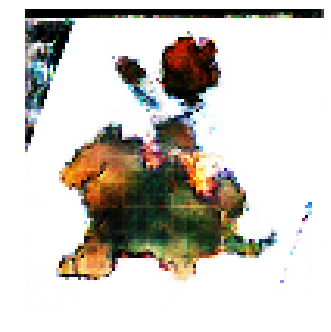


Epoch: 27360, D: -5.535, G: 3.798
Epoch: 27361, D: -7.22, G: 4.885
Epoch: 27362, D: -6.98, G: 3.555
Epoch: 27363, D: -5.796, G: 4.875
Epoch: 27364, D: -6.54, G: 2.069
Epoch: 27365, D: -6.268, G: 3.56
Epoch: 27366, D: -4.98, G: 2.714
Epoch: 27367, D: -6.355, G: 4.339
Epoch: 27368, D: -5.145, G: 2.449
Epoch: 27369, D: -6.989, G: 4.523
Epoch: 27370, D: -7.397, G: 4.373
Epoch: 27371, D: -5.809, G: 1.638
Epoch: 27372, D: -5.648, G: 3.366
Epoch: 27373, D: -6.679, G: 2.006
Epoch: 27374, D: -5.8, G: 3.441
Epoch: 27375, D: -6.464, G: 3.509
Epoch: 27376, D: -5.704, G: 4.598
Epoch: 27377, D: -5.32, G: 3.994
Epoch: 27378, D: -6.368, G: 3.92
Epoch: 27379, D: -5.243, G: 2.914


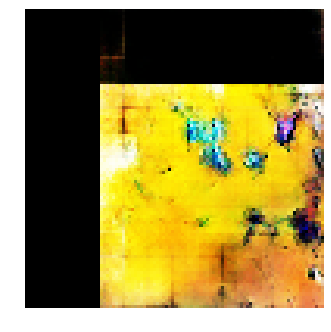


Epoch: 27380, D: -6.509, G: 3.663
Epoch: 27381, D: -6.994, G: 4.474
Epoch: 27382, D: -4.072, G: 4.16
Epoch: 27383, D: -5.918, G: 1.6
Epoch: 27384, D: -6.255, G: 3.051
Epoch: 27385, D: -5.493, G: 6.313
Epoch: 27386, D: -6.063, G: 5.602
Epoch: 27387, D: -5.571, G: 5.587
Epoch: 27388, D: -5.227, G: 2.552
Epoch: 27389, D: -5.797, G: 3.657
Epoch: 27390, D: -6.269, G: 4.603
Epoch: 27391, D: -4.342, G: 3.073
Epoch: 27392, D: -5.351, G: 3.197
Epoch: 27393, D: -6.532, G: 5.037
Epoch: 27394, D: -6.025, G: 4.3
Epoch: 27395, D: -4.151, G: 5.906
Epoch: 27396, D: -5.752, G: 3.931
Epoch: 27397, D: -6.23, G: 3.081
Epoch: 27398, D: -7.264, G: 2.547
Epoch: 27399, D: -5.204, G: 3.215


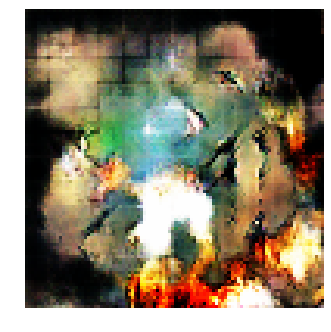


Epoch: 27400, D: -5.154, G: 4.932
Epoch: 27401, D: -5.545, G: 5.364
Epoch: 27402, D: -6.724, G: 4.801
Epoch: 27403, D: -6.287, G: 5.408
Epoch: 27404, D: -6.646, G: 2.295
Epoch: 27405, D: -5.836, G: 2.371
Epoch: 27406, D: -5.664, G: 2.601
Epoch: 27407, D: -5.108, G: 3.305
Epoch: 27408, D: -5.695, G: 4.938
Epoch: 27409, D: -5.66, G: 2.114
Epoch: 27410, D: -6.56, G: 2.917
Epoch: 27411, D: -6.205, G: 4.803
Epoch: 27412, D: -4.475, G: 6.111
Epoch: 27413, D: -5.98, G: 4.973
Epoch: 27414, D: -5.232, G: 3.096
Epoch: 27415, D: -5.707, G: 3.5
Epoch: 27416, D: -6.746, G: 4.277
Epoch: 27417, D: -6.735, G: 2.788
Epoch: 27418, D: -6.733, G: 3.782
Epoch: 27419, D: -6.988, G: 3.406


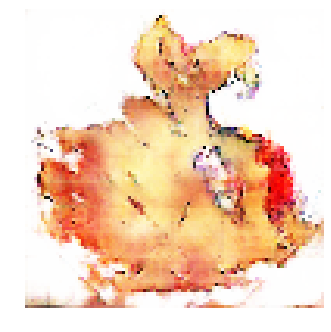


Epoch: 27420, D: -5.455, G: 4.645
Epoch: 27421, D: -5.922, G: 3.896
Epoch: 27422, D: -6.766, G: 3.68
Epoch: 27423, D: -5.413, G: 4.579
Epoch: 27424, D: -6.705, G: 3.106
Epoch: 27425, D: -6.277, G: 3.606
Epoch: 27426, D: -5.83, G: 5.001
Epoch: 27427, D: -6.189, G: 1.747
Epoch: 27428, D: -6.747, G: 3.052
Epoch: 27429, D: -7.323, G: 3.399
Epoch: 27430, D: -5.752, G: 2.504
Epoch: 27431, D: -5.445, G: 5.967
Epoch: 27432, D: -7.294, G: 4.214
Epoch: 27433, D: -6.063, G: 3.373
Epoch: 27434, D: -7.147, G: 4.731
Epoch: 27435, D: -5.778, G: 3.129
Epoch: 27436, D: -6.526, G: 3.767
Epoch: 27437, D: -6.011, G: 1.14
Epoch: 27438, D: -5.518, G: 5.102
Epoch: 27439, D: -6.259, G: 3.021


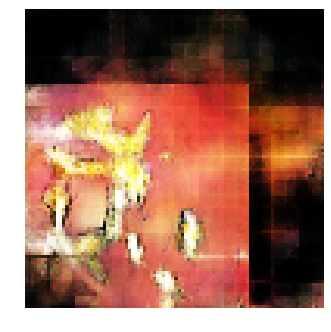


Epoch: 27440, D: -5.876, G: 4.114
Epoch: 27441, D: -5.853, G: 2.964
Epoch: 27442, D: -5.656, G: 3.311
Epoch: 27443, D: -5.616, G: 3.307
Epoch: 27444, D: -6.254, G: 3.639
Epoch: 27445, D: -6.195, G: 5.019
Epoch: 27446, D: -6.959, G: 4.689
Epoch: 27447, D: -5.708, G: 4.846
Epoch: 27448, D: -6.604, G: 4.684
Epoch: 27449, D: -5.39, G: 2.714
Epoch: 27450, D: -6.316, G: 4.411
Epoch: 27451, D: -6.396, G: 3.805
Epoch: 27452, D: -7.197, G: 3.215
Epoch: 27453, D: -5.397, G: 4.256
Epoch: 27454, D: -6.104, G: 6.553
Epoch: 27455, D: -5.636, G: 3.531
Epoch: 27456, D: -6.306, G: 4.923
Epoch: 27457, D: -6.656, G: 5.854
Epoch: 27458, D: -6.946, G: 3.255
Epoch: 27459, D: -5.6, G: 3.472


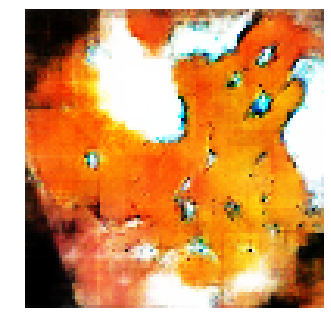


Epoch: 27460, D: -5.117, G: 2.033
Epoch: 27461, D: -6.611, G: 5.39
Epoch: 27462, D: -6.758, G: 3.749
Epoch: 27463, D: -6.88, G: 3.46
Epoch: 27464, D: -6.507, G: 3.842
Epoch: 27465, D: -6.408, G: 3.015
Epoch: 27466, D: -7.03, G: 2.374
Epoch: 27467, D: -6.398, G: 3.865
Epoch: 27468, D: -6.118, G: 3.326
Epoch: 27469, D: -6.149, G: 3.723
Epoch: 27470, D: -4.732, G: 3.515
Epoch: 27471, D: -5.176, G: 4.451
Epoch: 27472, D: -6.072, G: 6.152
Epoch: 27473, D: -6.56, G: 4.5
Epoch: 27474, D: -5.486, G: 3.793
Epoch: 27475, D: -5.772, G: 5.127
Epoch: 27476, D: -6.971, G: 5.993
Epoch: 27477, D: -6.595, G: 5.018
Epoch: 27478, D: -5.827, G: 4.781
Epoch: 27479, D: -5.226, G: 4.77


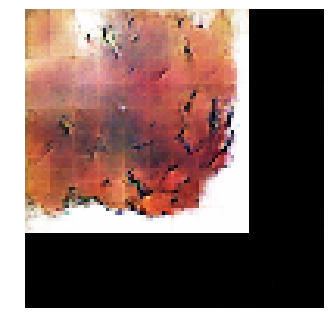


Epoch: 27480, D: -5.079, G: 3.046
Epoch: 27481, D: -5.774, G: 4.899
Epoch: 27482, D: -6.709, G: 3.535
Epoch: 27483, D: -6.328, G: 2.586
Epoch: 27484, D: -6.416, G: 3.22
Epoch: 27485, D: -5.598, G: 3.611
Epoch: 27486, D: -5.277, G: 4.522
Epoch: 27487, D: -5.372, G: 3.412
Epoch: 27488, D: -6.19, G: 4.788
Epoch: 27489, D: -6.091, G: 3.236
Epoch: 27490, D: -6.64, G: 5.714
Epoch: 27491, D: -7.044, G: 3.718
Epoch: 27492, D: -5.927, G: 3.234
Epoch: 27493, D: -6.381, G: 4.289
Epoch: 27494, D: -6.39, G: 4.068
Epoch: 27495, D: -5.679, G: 4.316
Epoch: 27496, D: -4.688, G: 2.522
Epoch: 27497, D: -5.155, G: 5.168
Epoch: 27498, D: -6.26, G: 5.557
Epoch: 27499, D: -6.908, G: 3.19


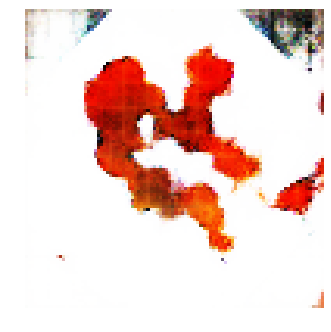


Epoch: 27500, D: -6.73, G: 3.529
Epoch: 27501, D: -6.33, G: 4.619
Epoch: 27502, D: -7.001, G: 1.816
Epoch: 27503, D: -6.535, G: 5.062
Epoch: 27504, D: -6.025, G: 4.179
Epoch: 27505, D: -5.342, G: 3.903
Epoch: 27506, D: -5.152, G: 3.259
Epoch: 27507, D: -5.537, G: 4.416
Epoch: 27508, D: -5.446, G: 3.52
Epoch: 27509, D: -5.21, G: 4.135
Epoch: 27510, D: -6.291, G: 5.613
Epoch: 27511, D: -5.445, G: 5.055
Epoch: 27512, D: -6.49, G: 3.741
Epoch: 27513, D: -7.041, G: 2.703
Epoch: 27514, D: -5.938, G: 2.71
Epoch: 27515, D: -5.244, G: 3.6
Epoch: 27516, D: -6.626, G: 3.544
Epoch: 27517, D: -3.966, G: 5.543
Epoch: 27518, D: -6.593, G: 3.802
Epoch: 27519, D: -4.797, G: 2.406


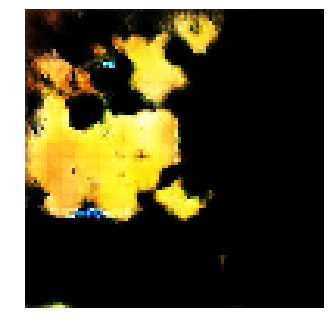


Epoch: 27520, D: -5.085, G: 4.946
Epoch: 27521, D: -4.71, G: 4.634
Epoch: 27522, D: -6.519, G: 4.603
Epoch: 27523, D: -5.419, G: 2.397
Epoch: 27524, D: -6.836, G: 4.31
Epoch: 27525, D: -6.886, G: 1.942
Epoch: 27526, D: -7.327, G: 2.476
Epoch: 27527, D: -6.194, G: 1.962
Epoch: 27528, D: -6.639, G: 3.624
Epoch: 27529, D: -6.001, G: 2.525
Epoch: 27530, D: -6.526, G: 4.318
Epoch: 27531, D: -7.535, G: 2.765
Epoch: 27532, D: -4.475, G: 3.432
Epoch: 27533, D: -4.729, G: 2.225
Epoch: 27534, D: -5.987, G: 3.816
Epoch: 27535, D: -4.713, G: 4.37
Epoch: 27536, D: -8.533, G: 3.01
Epoch: 27537, D: -6.041, G: 2.262
Epoch: 27538, D: -6.348, G: 3.145
Epoch: 27539, D: -5.669, G: 3.399


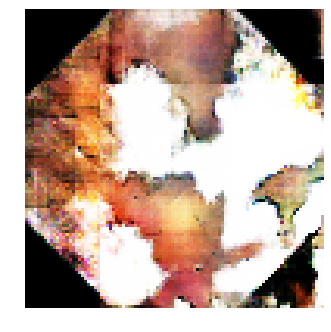


Epoch: 27540, D: -5.908, G: 4.739
Epoch: 27541, D: -7.762, G: 2.312
Epoch: 27542, D: -5.74, G: 2.0
Epoch: 27543, D: -6.817, G: 2.545
Epoch: 27544, D: -6.583, G: 5.086
Epoch: 27545, D: -5.744, G: 3.987
Epoch: 27546, D: -6.217, G: 5.312
Epoch: 27547, D: -7.408, G: 6.068
Epoch: 27548, D: -5.83, G: 5.246
Epoch: 27549, D: -6.94, G: 3.983
Epoch: 27550, D: -5.207, G: 4.244
Epoch: 27551, D: -4.872, G: 5.627
Epoch: 27552, D: -5.345, G: 3.89
Epoch: 27553, D: -5.474, G: 4.957
Epoch: 27554, D: -6.305, G: 5.233
Epoch: 27555, D: -6.047, G: 4.001
Epoch: 27556, D: -6.559, G: 5.564
Epoch: 27557, D: -5.552, G: 3.447
Epoch: 27558, D: -4.312, G: 1.516
Epoch: 27559, D: -6.626, G: 4.566


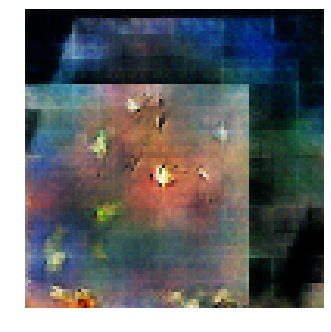


Epoch: 27560, D: -6.396, G: 4.462
Epoch: 27561, D: -6.139, G: 3.881
Epoch: 27562, D: -7.962, G: 3.198
Epoch: 27563, D: -5.253, G: 1.86
Epoch: 27564, D: -6.081, G: 4.964
Epoch: 27565, D: -5.161, G: 1.768
Epoch: 27566, D: -5.219, G: 3.624
Epoch: 27567, D: -5.274, G: 6.605
Epoch: 27568, D: -5.943, G: 4.713
Epoch: 27569, D: -6.521, G: 3.825
Epoch: 27570, D: -7.229, G: 5.545
Epoch: 27571, D: -5.585, G: 3.188
Epoch: 27572, D: -6.694, G: 4.745
Epoch: 27573, D: -5.657, G: 1.92
Epoch: 27574, D: -5.909, G: 4.509
Epoch: 27575, D: -5.919, G: 3.554
Epoch: 27576, D: -5.76, G: 3.73
Epoch: 27577, D: -6.627, G: 4.354
Epoch: 27578, D: -6.542, G: 5.063
Epoch: 27579, D: -5.974, G: 2.401


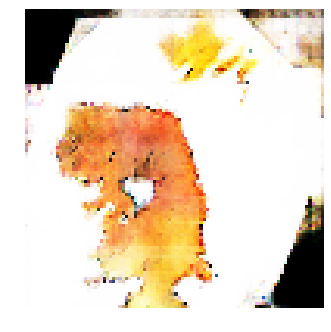


Epoch: 27580, D: -5.821, G: 5.747
Epoch: 27581, D: -6.622, G: 5.172
Epoch: 27582, D: -5.966, G: 5.063
Epoch: 27583, D: -5.864, G: 5.107
Epoch: 27584, D: -6.649, G: 6.391
Epoch: 27585, D: -4.746, G: 5.224
Epoch: 27586, D: -6.252, G: 3.477
Epoch: 27587, D: -6.277, G: 5.52
Epoch: 27588, D: -6.259, G: 5.639
Epoch: 27589, D: -4.866, G: 5.503
Epoch: 27590, D: -6.583, G: 4.871
Epoch: 27591, D: -6.351, G: 4.078
Epoch: 27592, D: -6.478, G: 4.445
Epoch: 27593, D: -4.58, G: 5.337
Epoch: 27594, D: -5.873, G: 3.529
Epoch: 27595, D: -6.236, G: 3.962
Epoch: 27596, D: -5.588, G: 4.589
Epoch: 27597, D: -7.408, G: 4.482
Epoch: 27598, D: -6.292, G: 2.157
Epoch: 27599, D: -5.516, G: 3.135


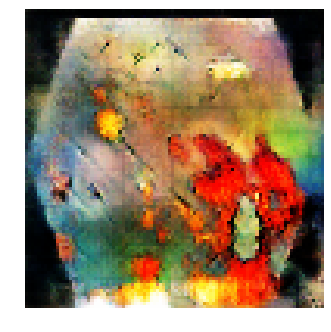


Epoch: 27600, D: -4.769, G: 2.937
Epoch: 27601, D: -6.299, G: 3.024
Epoch: 27602, D: -7.353, G: 4.829
Epoch: 27603, D: -6.26, G: 3.543
Epoch: 27604, D: -5.725, G: 2.388
Epoch: 27605, D: -6.744, G: 4.15
Epoch: 27606, D: -6.057, G: 4.128
Epoch: 27607, D: -6.689, G: 4.014
Epoch: 27608, D: -6.268, G: 3.339
Epoch: 27609, D: -7.499, G: 3.477
Epoch: 27610, D: -6.338, G: 3.455
Epoch: 27611, D: -5.245, G: 2.99
Epoch: 27612, D: -6.363, G: 3.656
Epoch: 27613, D: -5.82, G: 3.626
Epoch: 27614, D: -7.132, G: 3.599
Epoch: 27615, D: -5.985, G: 3.108
Epoch: 27616, D: -6.482, G: 5.753
Epoch: 27617, D: -6.668, G: 6.016
Epoch: 27618, D: -5.868, G: 4.526
Epoch: 27619, D: -7.064, G: 3.191


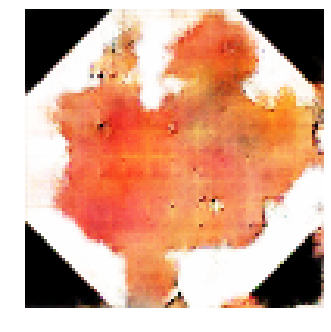


Epoch: 27620, D: -5.714, G: 2.577
Epoch: 27621, D: -5.858, G: 4.92
Epoch: 27622, D: -5.989, G: 4.585
Epoch: 27623, D: -6.84, G: 3.03
Epoch: 27624, D: -6.741, G: 3.163
Epoch: 27625, D: -5.633, G: 3.759
Epoch: 27626, D: -5.214, G: 3.744
Epoch: 27627, D: -6.301, G: 4.558
Epoch: 27628, D: -5.846, G: 4.045
Epoch: 27629, D: -7.4, G: 5.015
Epoch: 27630, D: -5.766, G: 3.923
Epoch: 27631, D: -5.398, G: 4.725
Epoch: 27632, D: -6.701, G: 2.972
Epoch: 27633, D: -6.417, G: 4.226
Epoch: 27634, D: -7.605, G: 3.85
Epoch: 27635, D: -6.636, G: 3.729
Epoch: 27636, D: -7.592, G: 2.323
Epoch: 27637, D: -7.275, G: 3.632
Epoch: 27638, D: -5.824, G: 3.36
Epoch: 27639, D: -4.83, G: 5.049


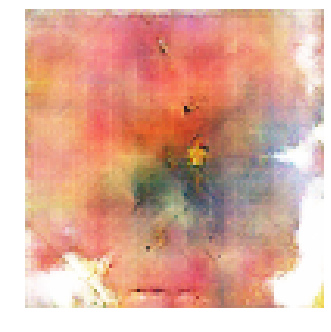


Epoch: 27640, D: -7.009, G: 3.91
Epoch: 27641, D: -7.068, G: 3.469
Epoch: 27642, D: -6.034, G: 3.051
Epoch: 27643, D: -6.786, G: 4.419
Epoch: 27644, D: -5.049, G: 4.997
Epoch: 27645, D: -6.043, G: 5.727
Epoch: 27646, D: -6.089, G: 2.079
Epoch: 27647, D: -5.929, G: 2.924
Epoch: 27648, D: -6.603, G: 3.729
Epoch: 27649, D: -5.97, G: 6.878
Epoch: 27650, D: -6.0, G: 5.279
Epoch: 27651, D: -6.4, G: 4.498
Epoch: 27652, D: -7.055, G: 5.654
Epoch: 27653, D: -5.861, G: 2.948
Epoch: 27654, D: -6.307, G: 4.945
Epoch: 27655, D: -6.635, G: 3.461
Epoch: 27656, D: -4.442, G: 4.324
Epoch: 27657, D: -5.469, G: 4.647
Epoch: 27658, D: -4.466, G: 4.957
Epoch: 27659, D: -5.782, G: 4.872


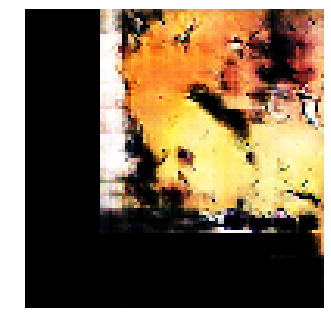


Epoch: 27660, D: -4.656, G: 3.686
Epoch: 27661, D: -6.118, G: 5.586
Epoch: 27662, D: -6.678, G: 5.936
Epoch: 27663, D: -5.63, G: 3.262
Epoch: 27664, D: -6.108, G: 5.52
Epoch: 27665, D: -6.346, G: 5.163
Epoch: 27666, D: -5.681, G: 3.993
Epoch: 27667, D: -6.447, G: 3.842
Epoch: 27668, D: -5.879, G: 0.9635
Epoch: 27669, D: -6.296, G: 2.379
Epoch: 27670, D: -6.6, G: 2.629
Epoch: 27671, D: -6.121, G: 2.683
Epoch: 27672, D: -6.283, G: 4.402
Epoch: 27673, D: -6.265, G: 3.959
Epoch: 27674, D: -7.066, G: 5.533
Epoch: 27675, D: -6.348, G: 4.481
Epoch: 27676, D: -5.537, G: 3.964
Epoch: 27677, D: -6.642, G: 4.218
Epoch: 27678, D: -5.69, G: 3.783
Epoch: 27679, D: -7.339, G: 3.602


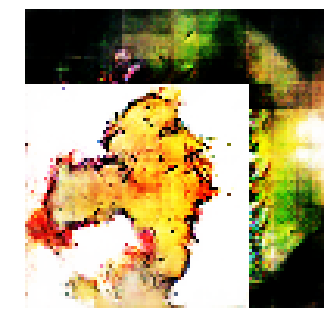


Epoch: 27680, D: -5.882, G: 3.468
Epoch: 27681, D: -5.006, G: 5.127
Epoch: 27682, D: -5.93, G: 3.044
Epoch: 27683, D: -4.892, G: 3.244
Epoch: 27684, D: -7.412, G: 4.861
Epoch: 27685, D: -6.386, G: 3.61
Epoch: 27686, D: -7.282, G: 2.638
Epoch: 27687, D: -5.855, G: 4.437
Epoch: 27688, D: -6.069, G: 2.435
Epoch: 27689, D: -5.301, G: 2.832
Epoch: 27690, D: -6.21, G: 2.278
Epoch: 27691, D: -5.45, G: 4.047
Epoch: 27692, D: -5.79, G: 3.809
Epoch: 27693, D: -5.862, G: 5.085
Epoch: 27694, D: -8.154, G: 4.71
Epoch: 27695, D: -4.112, G: 3.961
Epoch: 27696, D: -5.286, G: 6.168
Epoch: 27697, D: -5.957, G: 3.607
Epoch: 27698, D: -6.266, G: 5.337
Epoch: 27699, D: -5.58, G: 2.823


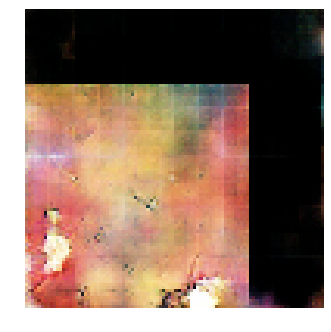


Epoch: 27700, D: -7.1, G: 2.835
Epoch: 27701, D: -5.928, G: 3.252
Epoch: 27702, D: -6.427, G: 2.919
Epoch: 27703, D: -5.832, G: 4.541
Epoch: 27704, D: -5.873, G: 3.879
Epoch: 27705, D: -7.364, G: 3.17
Epoch: 27706, D: -5.487, G: 4.099
Epoch: 27707, D: -8.696, G: 4.739
Epoch: 27708, D: -6.443, G: 3.419
Epoch: 27709, D: -6.318, G: 4.141
Epoch: 27710, D: -5.369, G: 4.501
Epoch: 27711, D: -5.457, G: 4.486
Epoch: 27712, D: -5.702, G: 3.476
Epoch: 27713, D: -5.23, G: 5.988
Epoch: 27714, D: -5.502, G: 4.93
Epoch: 27715, D: -4.921, G: 3.08
Epoch: 27716, D: -5.838, G: 5.496
Epoch: 27717, D: -6.712, G: 4.756
Epoch: 27718, D: -5.51, G: 4.9
Epoch: 27719, D: -5.653, G: 2.808


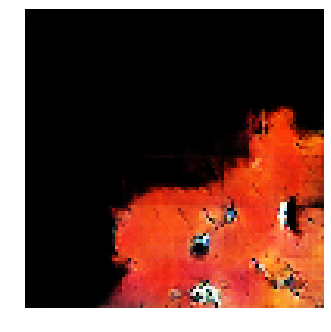


Epoch: 27720, D: -7.011, G: 4.145
Epoch: 27721, D: -5.04, G: 5.566
Epoch: 27722, D: -5.038, G: 4.089
Epoch: 27723, D: -6.458, G: 2.416
Epoch: 27724, D: -5.983, G: 6.684
Epoch: 27725, D: -6.367, G: 2.987
Epoch: 27726, D: -4.388, G: 3.055
Epoch: 27727, D: -5.452, G: 3.497
Epoch: 27728, D: -6.926, G: 2.055
Epoch: 27729, D: -5.909, G: 4.448
Epoch: 27730, D: -6.454, G: 6.488
Epoch: 27731, D: -5.974, G: 3.885
Epoch: 27732, D: -5.978, G: 5.725
Epoch: 27733, D: -5.594, G: 3.543
Epoch: 27734, D: -5.564, G: 3.004
Epoch: 27735, D: -6.793, G: 2.898
Epoch: 27736, D: -5.589, G: 3.748
Epoch: 27737, D: -5.943, G: 6.19
Epoch: 27738, D: -6.865, G: 4.443
Epoch: 27739, D: -6.738, G: 3.003


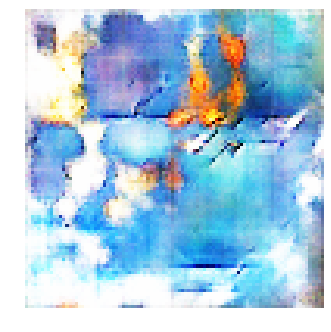


Epoch: 27740, D: -6.352, G: 4.344
Epoch: 27741, D: -5.185, G: 4.502
Epoch: 27742, D: -6.365, G: 1.868
Epoch: 27743, D: -7.216, G: 1.54
Epoch: 27744, D: -6.302, G: 3.346
Epoch: 27745, D: -7.193, G: 4.246
Epoch: 27746, D: -6.366, G: 1.934
Epoch: 27747, D: -5.307, G: 2.825
Epoch: 27748, D: -5.952, G: 4.701
Epoch: 27749, D: -5.151, G: 4.553
Epoch: 27750, D: -4.875, G: 3.055
Epoch: 27751, D: -5.788, G: 4.316
Epoch: 27752, D: -5.532, G: 3.825
Epoch: 27753, D: -6.74, G: 2.947
Epoch: 27754, D: -5.938, G: 3.108
Epoch: 27755, D: -8.599, G: 4.386
Epoch: 27756, D: -7.131, G: 3.669
Epoch: 27757, D: -6.603, G: 3.016
Epoch: 27758, D: -5.285, G: 4.991
Epoch: 27759, D: -6.468, G: 5.388


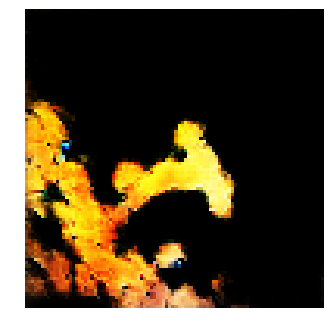


Epoch: 27760, D: -6.5, G: 4.438
Epoch: 27761, D: -6.6, G: 4.621
Epoch: 27762, D: -5.748, G: 4.077
Epoch: 27763, D: -4.264, G: 2.297
Epoch: 27764, D: -6.062, G: 3.891
Epoch: 27765, D: -5.396, G: 0.5589
Epoch: 27766, D: -5.721, G: 0.8147
Epoch: 27767, D: -5.653, G: 3.795
Epoch: 27768, D: -5.039, G: 3.051
Epoch: 27769, D: -5.944, G: 2.871
Epoch: 27770, D: -6.304, G: 3.923
Epoch: 27771, D: -6.09, G: 2.814
Epoch: 27772, D: -5.502, G: 0.7829
Epoch: 27773, D: -5.373, G: 4.8
Epoch: 27774, D: -6.627, G: 2.881
Epoch: 27775, D: -6.11, G: 1.381
Epoch: 27776, D: -5.841, G: 3.765
Epoch: 27777, D: -4.912, G: 4.518
Epoch: 27778, D: -5.519, G: 3.016
Epoch: 27779, D: -5.6, G: 3.094


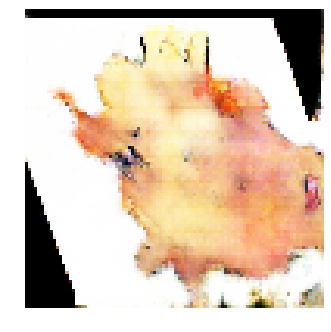


Epoch: 27780, D: -6.113, G: 2.5
Epoch: 27781, D: -7.184, G: 2.428
Epoch: 27782, D: -7.283, G: 2.798
Epoch: 27783, D: -5.679, G: 1.79
Epoch: 27784, D: -7.572, G: 4.425
Epoch: 27785, D: -6.281, G: 3.22
Epoch: 27786, D: -5.28, G: 2.866
Epoch: 27787, D: -7.549, G: 3.884
Epoch: 27788, D: -6.832, G: 1.502
Epoch: 27789, D: -5.109, G: 4.224
Epoch: 27790, D: -7.376, G: 4.556
Epoch: 27791, D: -6.619, G: 3.708
Epoch: 27792, D: -6.971, G: 3.574
Epoch: 27793, D: -5.37, G: 3.721
Epoch: 27794, D: -6.628, G: 4.689
Epoch: 27795, D: -5.818, G: 3.425
Epoch: 27796, D: -6.036, G: 4.712
Epoch: 27797, D: -6.219, G: 5.022
Epoch: 27798, D: -7.445, G: 5.361
Epoch: 27799, D: -8.053, G: 5.045


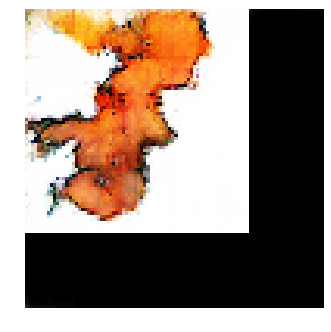


Epoch: 27800, D: -4.367, G: 5.521
Epoch: 27801, D: -5.956, G: 6.018
Epoch: 27802, D: -6.216, G: 4.155
Epoch: 27803, D: -4.63, G: 3.648
Epoch: 27804, D: -6.126, G: 3.515
Epoch: 27805, D: -6.221, G: 3.912
Epoch: 27806, D: -6.497, G: 3.493
Epoch: 27807, D: -6.221, G: 4.636
Epoch: 27808, D: -6.132, G: 4.612
Epoch: 27809, D: -5.607, G: 5.244
Epoch: 27810, D: -6.807, G: 6.209
Epoch: 27811, D: -6.231, G: 4.613
Epoch: 27812, D: -6.231, G: 4.188
Epoch: 27813, D: -6.363, G: 4.744
Epoch: 27814, D: -5.169, G: 3.651
Epoch: 27815, D: -5.256, G: 3.775
Epoch: 27816, D: -5.581, G: 4.549
Epoch: 27817, D: -5.509, G: 3.001
Epoch: 27818, D: -4.862, G: 3.136
Epoch: 27819, D: -5.087, G: 3.311


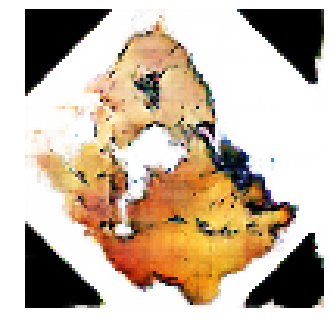


Epoch: 27820, D: -6.269, G: 4.006
Epoch: 27821, D: -5.826, G: 3.003
Epoch: 27822, D: -4.696, G: 2.972
Epoch: 27823, D: -6.778, G: 4.049
Epoch: 27824, D: -5.701, G: 2.916
Epoch: 27825, D: -5.466, G: 3.793
Epoch: 27826, D: -7.515, G: 2.957
Epoch: 27827, D: -5.687, G: 3.693
Epoch: 27828, D: -4.711, G: 5.24
Epoch: 27829, D: -6.2, G: 3.64
Epoch: 27830, D: -5.819, G: 5.541
Epoch: 27831, D: -6.459, G: 1.861
Epoch: 27832, D: -6.143, G: 4.286
Epoch: 27833, D: -5.126, G: 4.889
Epoch: 27834, D: -4.636, G: 3.775
Epoch: 27835, D: -5.229, G: 4.382
Epoch: 27836, D: -6.795, G: 2.981
Epoch: 27837, D: -5.526, G: 3.137
Epoch: 27838, D: -5.846, G: 3.721
Epoch: 27839, D: -5.437, G: 1.368


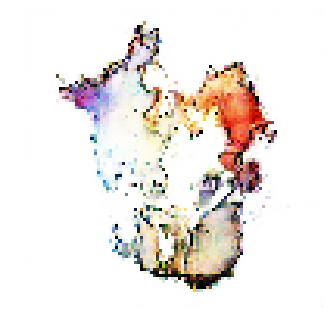


Epoch: 27840, D: -5.56, G: 4.365
Epoch: 27841, D: -5.302, G: 4.107
Epoch: 27842, D: -6.615, G: 3.509
Epoch: 27843, D: -4.306, G: 2.697
Epoch: 27844, D: -6.044, G: 5.413
Epoch: 27845, D: -8.069, G: 4.262
Epoch: 27846, D: -5.779, G: 2.761
Epoch: 27847, D: -7.285, G: 4.928
Epoch: 27848, D: -6.5, G: 3.494
Epoch: 27849, D: -5.7, G: 5.06
Epoch: 27850, D: -5.548, G: 3.997
Epoch: 27851, D: -5.437, G: 4.412
Epoch: 27852, D: -8.403, G: 1.198
Epoch: 27853, D: -5.982, G: 2.18
Epoch: 27854, D: -5.995, G: 2.091
Epoch: 27855, D: -6.337, G: 2.881
Epoch: 27856, D: -5.75, G: 2.628
Epoch: 27857, D: -6.188, G: 6.152
Epoch: 27858, D: -7.272, G: 3.834
Epoch: 27859, D: -6.342, G: 5.081


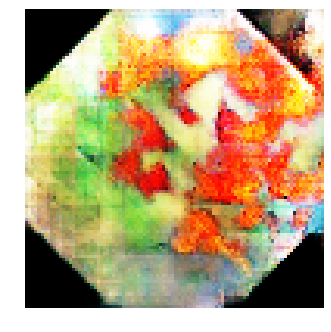


Epoch: 27860, D: -6.168, G: 1.291
Epoch: 27861, D: -6.217, G: 4.124
Epoch: 27862, D: -4.33, G: 4.327
Epoch: 27863, D: -5.185, G: 4.584
Epoch: 27864, D: -7.011, G: 3.348
Epoch: 27865, D: -5.71, G: 4.428
Epoch: 27866, D: -5.621, G: 4.102
Epoch: 27867, D: -8.315, G: 3.126
Epoch: 27868, D: -6.004, G: 0.8882
Epoch: 27869, D: -7.538, G: 2.859
Epoch: 27870, D: -5.728, G: 4.15
Epoch: 27871, D: -6.049, G: 1.93
Epoch: 27872, D: -6.534, G: 2.203
Epoch: 27873, D: -7.182, G: 3.152
Epoch: 27874, D: -5.066, G: 4.674
Epoch: 27875, D: -6.11, G: 3.271
Epoch: 27876, D: -5.447, G: 2.658
Epoch: 27877, D: -6.001, G: 3.657
Epoch: 27878, D: -4.954, G: 6.529
Epoch: 27879, D: -4.862, G: 4.729


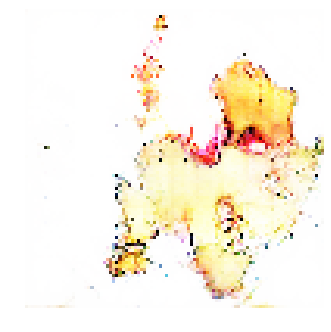


Epoch: 27880, D: -7.187, G: 4.466
Epoch: 27881, D: -5.042, G: 5.185
Epoch: 27882, D: -5.438, G: 3.767
Epoch: 27883, D: -5.702, G: 3.181
Epoch: 27884, D: -5.911, G: 2.757
Epoch: 27885, D: -6.13, G: 3.39
Epoch: 27886, D: -6.07, G: 3.875
Epoch: 27887, D: -6.308, G: 4.618
Epoch: 27888, D: -5.44, G: 3.556
Epoch: 27889, D: -5.343, G: 2.956
Epoch: 27890, D: -6.142, G: 3.789
Epoch: 27891, D: -6.956, G: 4.692
Epoch: 27892, D: -5.996, G: 3.775
Epoch: 27893, D: -7.076, G: 3.647
Epoch: 27894, D: -5.569, G: 5.988
Epoch: 27895, D: -6.034, G: 5.768
Epoch: 27896, D: -5.205, G: 5.538
Epoch: 27897, D: -6.001, G: 3.567
Epoch: 27898, D: -5.132, G: 4.794
Epoch: 27899, D: -6.436, G: 3.71


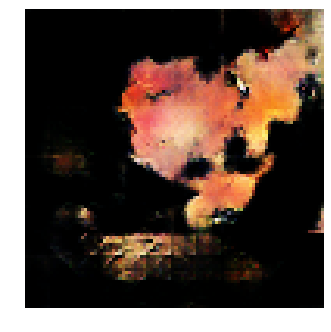


Epoch: 27900, D: -6.263, G: 4.502
Epoch: 27901, D: -7.2, G: 4.435
Epoch: 27902, D: -5.836, G: 4.432
Epoch: 27903, D: -5.84, G: 2.627
Epoch: 27904, D: -5.014, G: 5.038
Epoch: 27905, D: -5.927, G: 3.568
Epoch: 27906, D: -6.442, G: 3.766
Epoch: 27907, D: -5.692, G: 3.532
Epoch: 27908, D: -4.794, G: 4.649
Epoch: 27909, D: -6.157, G: 4.54
Epoch: 27910, D: -5.723, G: 3.071
Epoch: 27911, D: -5.647, G: 3.918
Epoch: 27912, D: -5.632, G: 3.026
Epoch: 27913, D: -6.539, G: 3.435
Epoch: 27914, D: -7.003, G: 1.645
Epoch: 27915, D: -6.512, G: 2.166
Epoch: 27916, D: -5.276, G: 4.667
Epoch: 27917, D: -6.792, G: 3.597
Epoch: 27918, D: -5.124, G: 3.382
Epoch: 27919, D: -5.14, G: 2.765


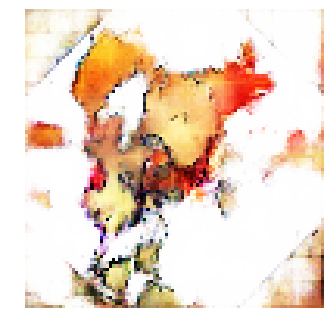


Epoch: 27920, D: -5.843, G: 5.078
Epoch: 27921, D: -5.71, G: 2.941
Epoch: 27922, D: -7.642, G: 5.181
Epoch: 27923, D: -7.317, G: 3.615
Epoch: 27924, D: -7.024, G: 5.215
Epoch: 27925, D: -6.386, G: 6.81
Epoch: 27926, D: -7.294, G: 5.485
Epoch: 27927, D: -5.951, G: 3.666
Epoch: 27928, D: -7.327, G: 3.769
Epoch: 27929, D: -6.834, G: 4.326
Epoch: 27930, D: -6.028, G: 6.125
Epoch: 27931, D: -5.023, G: 3.419
Epoch: 27932, D: -6.148, G: 4.746
Epoch: 27933, D: -6.836, G: 3.298
Epoch: 27934, D: -6.987, G: 2.93
Epoch: 27935, D: -5.924, G: 3.457
Epoch: 27936, D: -6.469, G: 3.801
Epoch: 27937, D: -6.384, G: 1.841
Epoch: 27938, D: -5.938, G: 3.911
Epoch: 27939, D: -7.967, G: 4.754


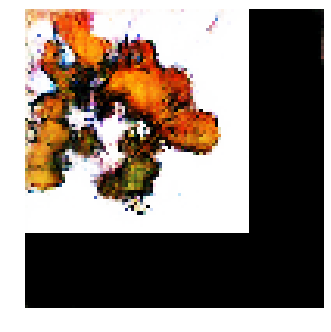


Epoch: 27940, D: -6.893, G: 3.436
Epoch: 27941, D: -6.906, G: 4.219
Epoch: 27942, D: -4.648, G: 2.232
Epoch: 27943, D: -5.361, G: 4.217
Epoch: 27944, D: -7.043, G: 3.275
Epoch: 27945, D: -8.133, G: 2.865
Epoch: 27946, D: -6.185, G: 4.747
Epoch: 27947, D: -5.094, G: 4.039
Epoch: 27948, D: -5.625, G: 5.094
Epoch: 27949, D: -4.901, G: 4.303
Epoch: 27950, D: -5.955, G: 2.532
Epoch: 27951, D: -6.379, G: 4.456
Epoch: 27952, D: -5.769, G: 3.779
Epoch: 27953, D: -5.81, G: 4.254
Epoch: 27954, D: -6.351, G: 1.802
Epoch: 27955, D: -6.653, G: 1.919
Epoch: 27956, D: -5.94, G: 2.005
Epoch: 27957, D: -4.971, G: 2.688
Epoch: 27958, D: -5.956, G: 5.095
Epoch: 27959, D: -5.68, G: 3.099


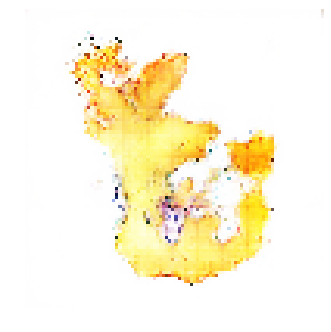


Epoch: 27960, D: -6.762, G: 3.972
Epoch: 27961, D: -6.831, G: 3.244
Epoch: 27962, D: -5.462, G: 3.882
Epoch: 27963, D: -6.763, G: 3.496
Epoch: 27964, D: -6.355, G: 1.868
Epoch: 27965, D: -6.573, G: 4.253
Epoch: 27966, D: -5.296, G: 4.908
Epoch: 27967, D: -5.245, G: 4.436
Epoch: 27968, D: -6.054, G: 5.7
Epoch: 27969, D: -5.945, G: 3.807
Epoch: 27970, D: -6.768, G: 4.593
Epoch: 27971, D: -7.009, G: 2.701
Epoch: 27972, D: -4.803, G: 4.168
Epoch: 27973, D: -5.835, G: 4.312
Epoch: 27974, D: -5.213, G: 3.425
Epoch: 27975, D: -5.332, G: 5.691
Epoch: 27976, D: -6.723, G: 3.218
Epoch: 27977, D: -6.23, G: 3.478
Epoch: 27978, D: -7.015, G: 3.981
Epoch: 27979, D: -6.159, G: 5.253


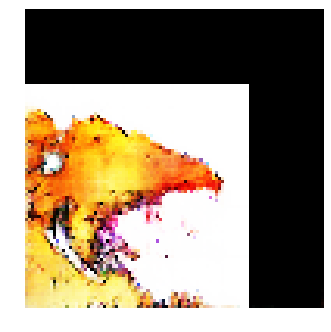


Epoch: 27980, D: -7.135, G: 5.385
Epoch: 27981, D: -5.714, G: 2.911
Epoch: 27982, D: -5.443, G: 3.199
Epoch: 27983, D: -6.328, G: 3.69
Epoch: 27984, D: -6.248, G: 4.4
Epoch: 27985, D: -5.469, G: 2.866
Epoch: 27986, D: -5.628, G: 1.743
Epoch: 27987, D: -7.058, G: 2.631
Epoch: 27988, D: -5.908, G: 2.817
Epoch: 27989, D: -4.746, G: 3.97
Epoch: 27990, D: -6.736, G: 5.093
Epoch: 27991, D: -6.646, G: 2.927
Epoch: 27992, D: -6.421, G: 4.266
Epoch: 27993, D: -6.045, G: 3.837
Epoch: 27994, D: -5.395, G: 3.454
Epoch: 27995, D: -6.87, G: 5.924
Epoch: 27996, D: -6.184, G: 3.822
Epoch: 27997, D: -4.738, G: 3.491
Epoch: 27998, D: -5.066, G: 3.933
Epoch: 27999, D: -7.118, G: 2.84


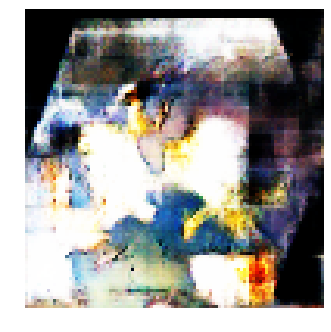


Epoch: 28000, D: -5.757, G: 2.202
Epoch: 28001, D: -5.712, G: 2.917
Epoch: 28002, D: -5.911, G: 3.671
Epoch: 28003, D: -5.815, G: 5.632
Epoch: 28004, D: -6.133, G: 3.522
Epoch: 28005, D: -6.937, G: 3.835
Epoch: 28006, D: -5.47, G: 5.456
Epoch: 28007, D: -5.968, G: 3.25
Epoch: 28008, D: -7.567, G: 5.775
Epoch: 28009, D: -7.414, G: 6.54
Epoch: 28010, D: -4.172, G: 6.011
Epoch: 28011, D: -6.52, G: 4.289
Epoch: 28012, D: -7.036, G: 5.282
Epoch: 28013, D: -6.306, G: 5.005
Epoch: 28014, D: -5.507, G: 4.31
Epoch: 28015, D: -4.866, G: 6.785
Epoch: 28016, D: -5.561, G: 3.608
Epoch: 28017, D: -5.738, G: 5.167
Epoch: 28018, D: -5.424, G: 2.347
Epoch: 28019, D: -6.017, G: 3.289


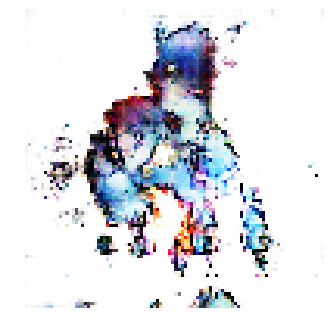


Epoch: 28020, D: -5.274, G: 4.539
Epoch: 28021, D: -6.274, G: 5.334
Epoch: 28022, D: -6.675, G: 4.626
Epoch: 28023, D: -4.923, G: 2.263
Epoch: 28024, D: -5.785, G: 3.506
Epoch: 28025, D: -6.942, G: 4.34
Epoch: 28026, D: -5.023, G: 2.651
Epoch: 28027, D: -6.133, G: 3.832
Epoch: 28028, D: -5.965, G: 3.552
Epoch: 28029, D: -5.887, G: 3.687
Epoch: 28030, D: -4.84, G: 4.271
Epoch: 28031, D: -6.724, G: 4.179
Epoch: 28032, D: -6.244, G: 1.862
Epoch: 28033, D: -6.495, G: 2.177
Epoch: 28034, D: -5.756, G: 2.82
Epoch: 28035, D: -6.736, G: 3.311
Epoch: 28036, D: -6.129, G: -0.3049
Epoch: 28037, D: -6.361, G: 5.138
Epoch: 28038, D: -5.191, G: 3.508
Epoch: 28039, D: -5.859, G: 3.409


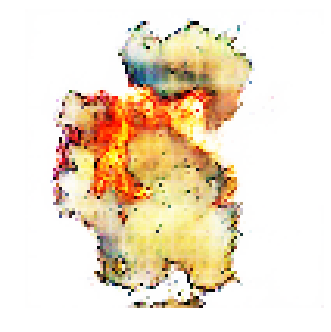


Epoch: 28040, D: -5.956, G: 4.171
Epoch: 28041, D: -6.124, G: 4.905
Epoch: 28042, D: -5.723, G: 4.582
Epoch: 28043, D: -6.037, G: 4.525
Epoch: 28044, D: -4.657, G: 3.345
Epoch: 28045, D: -6.259, G: 4.979
Epoch: 28046, D: -6.573, G: 4.655
Epoch: 28047, D: -4.748, G: 3.658
Epoch: 28048, D: -7.139, G: 4.641
Epoch: 28049, D: -5.442, G: 5.166
Epoch: 28050, D: -5.2, G: 3.114
Epoch: 28051, D: -7.424, G: 1.934
Epoch: 28052, D: -6.794, G: 5.703
Epoch: 28053, D: -4.719, G: 4.088
Epoch: 28054, D: -6.161, G: 3.049
Epoch: 28055, D: -6.108, G: 4.146
Epoch: 28056, D: -5.246, G: 4.857
Epoch: 28057, D: -6.992, G: 2.78
Epoch: 28058, D: -6.099, G: 3.447
Epoch: 28059, D: -6.44, G: 4.808


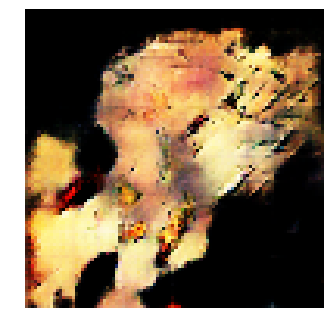


Epoch: 28060, D: -6.89, G: 4.778
Epoch: 28061, D: -6.267, G: 6.039
Epoch: 28062, D: -6.498, G: 4.7
Epoch: 28063, D: -6.68, G: 3.853
Epoch: 28064, D: -4.864, G: 4.621
Epoch: 28065, D: -5.83, G: 3.595
Epoch: 28066, D: -4.877, G: 5.552
Epoch: 28067, D: -5.65, G: 5.46
Epoch: 28068, D: -5.63, G: 4.285
Epoch: 28069, D: -5.789, G: 5.271
Epoch: 28070, D: -5.752, G: 5.395
Epoch: 28071, D: -6.136, G: 3.877
Epoch: 28072, D: -6.027, G: 4.353
Epoch: 28073, D: -5.627, G: 5.487
Epoch: 28074, D: -5.449, G: 5.025
Epoch: 28075, D: -7.055, G: 4.15
Epoch: 28076, D: -7.847, G: 4.195
Epoch: 28077, D: -6.059, G: 4.193
Epoch: 28078, D: -5.466, G: 5.846
Epoch: 28079, D: -5.537, G: 4.518


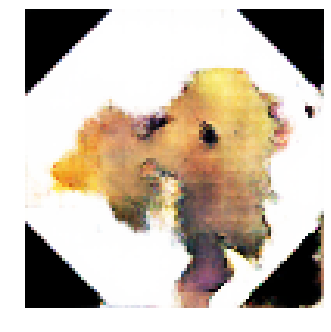


Epoch: 28080, D: -5.998, G: 3.937
Epoch: 28081, D: -6.783, G: 4.032
Epoch: 28082, D: -7.435, G: 4.189
Epoch: 28083, D: -5.863, G: 3.611
Epoch: 28084, D: -6.363, G: 5.082
Epoch: 28085, D: -6.362, G: 5.126
Epoch: 28086, D: -5.807, G: 2.553
Epoch: 28087, D: -5.013, G: 3.266
Epoch: 28088, D: -5.565, G: 4.373
Epoch: 28089, D: -7.26, G: 2.92
Epoch: 28090, D: -5.692, G: 2.456
Epoch: 28091, D: -8.008, G: 3.334
Epoch: 28092, D: -4.801, G: 3.028
Epoch: 28093, D: -5.915, G: 3.94
Epoch: 28094, D: -5.769, G: 3.418
Epoch: 28095, D: -6.301, G: 4.845
Epoch: 28096, D: -6.299, G: 4.704
Epoch: 28097, D: -6.38, G: 2.737
Epoch: 28098, D: -5.97, G: 3.867
Epoch: 28099, D: -5.987, G: 4.974


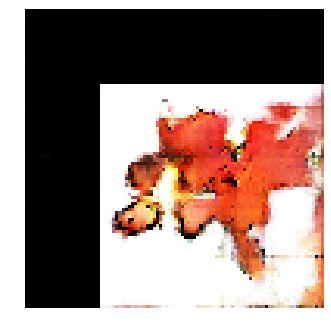


Epoch: 28100, D: -6.358, G: 3.158
Epoch: 28101, D: -7.494, G: 3.337
Epoch: 28102, D: -6.344, G: 0.7376
Epoch: 28103, D: -4.792, G: 2.266
Epoch: 28104, D: -6.025, G: 3.376
Epoch: 28105, D: -6.05, G: 4.428
Epoch: 28106, D: -5.151, G: 5.174
Epoch: 28107, D: -5.919, G: 3.727
Epoch: 28108, D: -6.468, G: 2.208
Epoch: 28109, D: -5.949, G: 3.639
Epoch: 28110, D: -5.597, G: 3.118
Epoch: 28111, D: -4.276, G: 3.726
Epoch: 28112, D: -6.62, G: 3.662
Epoch: 28113, D: -5.95, G: 2.895
Epoch: 28114, D: -7.489, G: 2.722
Epoch: 28115, D: -8.83, G: 3.387
Epoch: 28116, D: -7.094, G: 2.17
Epoch: 28117, D: -6.003, G: 2.435
Epoch: 28118, D: -5.254, G: 2.871
Epoch: 28119, D: -5.111, G: 4.498


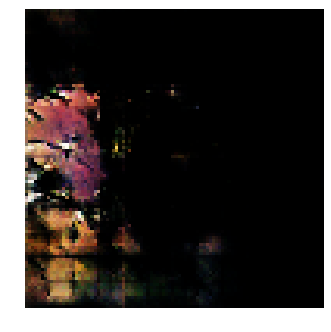


Epoch: 28120, D: -6.702, G: 5.898
Epoch: 28121, D: -5.118, G: 3.96
Epoch: 28122, D: -6.335, G: 3.363
Epoch: 28123, D: -6.012, G: 4.999
Epoch: 28124, D: -6.57, G: 3.39
Epoch: 28125, D: -5.653, G: 4.544
Epoch: 28126, D: -6.247, G: 3.441
Epoch: 28127, D: -7.338, G: 5.858
Epoch: 28128, D: -7.085, G: 5.014
Epoch: 28129, D: -5.439, G: 3.726
Epoch: 28130, D: -4.719, G: 3.284
Epoch: 28131, D: -6.557, G: 2.644
Epoch: 28132, D: -5.272, G: 4.52
Epoch: 28133, D: -5.736, G: 3.326
Epoch: 28134, D: -7.509, G: 1.67
Epoch: 28135, D: -5.47, G: 1.8
Epoch: 28136, D: -5.009, G: 4.372
Epoch: 28137, D: -5.088, G: 4.552
Epoch: 28138, D: -5.601, G: 3.892
Epoch: 28139, D: -6.1, G: 4.926


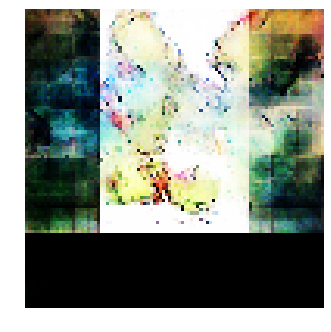


Epoch: 28140, D: -5.924, G: 5.529
Epoch: 28141, D: -7.922, G: 5.527
Epoch: 28142, D: -7.748, G: 2.232
Epoch: 28143, D: -6.244, G: 4.56
Epoch: 28144, D: -5.732, G: 4.761
Epoch: 28145, D: -5.286, G: 3.482
Epoch: 28146, D: -7.075, G: 6.164
Epoch: 28147, D: -6.509, G: 3.617
Epoch: 28148, D: -5.637, G: 5.45
Epoch: 28149, D: -5.976, G: 2.962
Epoch: 28150, D: -5.829, G: 2.871
Epoch: 28151, D: -8.426, G: 3.768
Epoch: 28152, D: -6.566, G: 5.601
Epoch: 28153, D: -4.74, G: 4.105
Epoch: 28154, D: -4.973, G: 5.726
Epoch: 28155, D: -5.968, G: 3.733
Epoch: 28156, D: -9.279, G: 2.232
Epoch: 28157, D: -6.925, G: 4.415
Epoch: 28158, D: -6.477, G: 4.053
Epoch: 28159, D: -5.471, G: 3.836


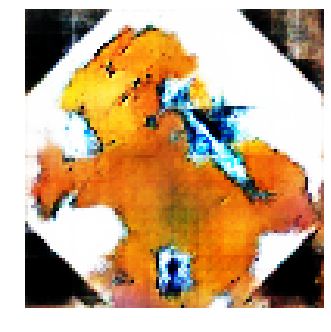


Epoch: 28160, D: -5.539, G: 3.323
Epoch: 28161, D: -5.315, G: 2.682
Epoch: 28162, D: -5.891, G: 3.111
Epoch: 28163, D: -6.447, G: 4.117
Epoch: 28164, D: -6.64, G: 2.121
Epoch: 28165, D: -6.774, G: 4.195
Epoch: 28166, D: -5.728, G: 4.527
Epoch: 28167, D: -6.187, G: 4.789
Epoch: 28168, D: -6.13, G: 4.46
Epoch: 28169, D: -5.941, G: 1.063
Epoch: 28170, D: -6.091, G: 5.349
Epoch: 28171, D: -5.365, G: 4.609
Epoch: 28172, D: -6.29, G: 3.721
Epoch: 28173, D: -5.425, G: 1.955
Epoch: 28174, D: -6.166, G: 3.107
Epoch: 28175, D: -6.506, G: 3.076
Epoch: 28176, D: -7.434, G: 4.019
Epoch: 28177, D: -4.509, G: 1.456
Epoch: 28178, D: -5.281, G: 2.014
Epoch: 28179, D: -5.16, G: 4.355


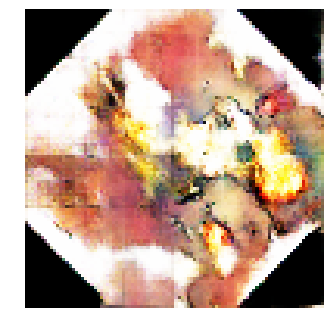


Epoch: 28180, D: -6.567, G: 5.066
Epoch: 28181, D: -7.244, G: 6.068
Epoch: 28182, D: -6.138, G: 4.891
Epoch: 28183, D: -6.614, G: 3.501
Epoch: 28184, D: -5.668, G: 3.827
Epoch: 28185, D: -4.627, G: 3.997
Epoch: 28186, D: -6.363, G: 2.747
Epoch: 28187, D: -6.236, G: 3.07
Epoch: 28188, D: -6.729, G: 3.683
Epoch: 28189, D: -5.208, G: 6.125
Epoch: 28190, D: -6.037, G: 3.789
Epoch: 28191, D: -5.107, G: 3.548
Epoch: 28192, D: -6.374, G: 4.302
Epoch: 28193, D: -5.566, G: 4.627
Epoch: 28194, D: -6.181, G: 3.455
Epoch: 28195, D: -5.467, G: 3.172
Epoch: 28196, D: -5.361, G: 3.414
Epoch: 28197, D: -6.431, G: 4.26
Epoch: 28198, D: -6.494, G: 3.963
Epoch: 28199, D: -5.9, G: 5.057


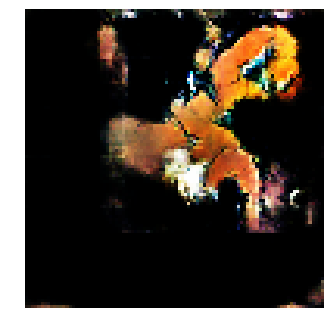


Epoch: 28200, D: -6.835, G: 4.773
Epoch: 28201, D: -6.556, G: 3.626
Epoch: 28202, D: -5.175, G: 5.853
Epoch: 28203, D: -5.917, G: 4.38
Epoch: 28204, D: -7.808, G: 2.079
Epoch: 28205, D: -6.095, G: 5.439
Epoch: 28206, D: -5.472, G: 4.867
Epoch: 28207, D: -4.851, G: 5.76
Epoch: 28208, D: -6.152, G: 3.685
Epoch: 28209, D: -7.243, G: 5.445
Epoch: 28210, D: -5.365, G: 3.382
Epoch: 28211, D: -6.206, G: 3.875
Epoch: 28212, D: -6.446, G: 2.634
Epoch: 28213, D: -5.032, G: 3.139
Epoch: 28214, D: -5.774, G: 4.713
Epoch: 28215, D: -6.202, G: 4.653
Epoch: 28216, D: -5.895, G: 4.655
Epoch: 28217, D: -6.043, G: 3.692
Epoch: 28218, D: -6.364, G: 3.487
Epoch: 28219, D: -6.243, G: 3.825


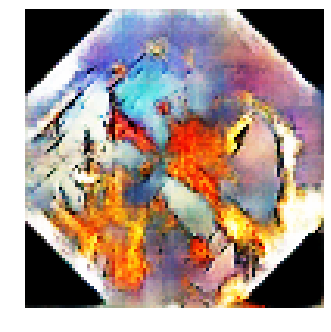


Epoch: 28220, D: -6.681, G: 4.05
Epoch: 28221, D: -6.183, G: 3.089
Epoch: 28222, D: -6.019, G: 3.449
Epoch: 28223, D: -5.759, G: 3.851
Epoch: 28224, D: -5.575, G: 5.006
Epoch: 28225, D: -7.91, G: 3.897
Epoch: 28226, D: -6.13, G: 3.27
Epoch: 28227, D: -6.802, G: 2.785
Epoch: 28228, D: -6.811, G: 4.704
Epoch: 28229, D: -6.186, G: 4.914
Epoch: 28230, D: -6.943, G: 5.659
Epoch: 28231, D: -6.513, G: 2.902
Epoch: 28232, D: -6.736, G: 3.799
Epoch: 28233, D: -5.424, G: 3.238
Epoch: 28234, D: -6.153, G: 5.567
Epoch: 28235, D: -6.489, G: 3.733
Epoch: 28236, D: -5.756, G: 4.572
Epoch: 28237, D: -5.819, G: 5.818
Epoch: 28238, D: -6.01, G: 5.496
Epoch: 28239, D: -6.448, G: 2.409


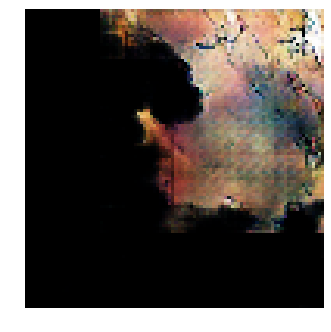


Epoch: 28240, D: -5.547, G: 5.675
Epoch: 28241, D: -5.914, G: 5.633
Epoch: 28242, D: -5.755, G: 3.454
Epoch: 28243, D: -5.907, G: 4.784
Epoch: 28244, D: -5.777, G: 3.326
Epoch: 28245, D: -7.762, G: 5.747
Epoch: 28246, D: -6.1, G: 4.808
Epoch: 28247, D: -5.5, G: 5.967
Epoch: 28248, D: -6.309, G: 6.226
Epoch: 28249, D: -7.908, G: 4.246
Epoch: 28250, D: -5.375, G: 3.514
Epoch: 28251, D: -4.258, G: 4.681
Epoch: 28252, D: -5.574, G: 5.052
Epoch: 28253, D: -6.918, G: 4.894
Epoch: 28254, D: -7.457, G: 3.714
Epoch: 28255, D: -6.795, G: 2.164
Epoch: 28256, D: -5.593, G: 6.376
Epoch: 28257, D: -4.891, G: 5.155
Epoch: 28258, D: -6.462, G: 1.774
Epoch: 28259, D: -5.336, G: 4.085


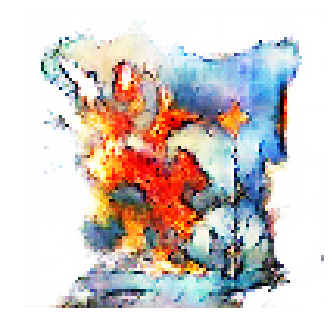


Epoch: 28260, D: -6.223, G: 3.716
Epoch: 28261, D: -6.381, G: 2.883
Epoch: 28262, D: -6.249, G: 2.747
Epoch: 28263, D: -5.326, G: 5.229
Epoch: 28264, D: -6.129, G: 3.573
Epoch: 28265, D: -6.758, G: 3.617
Epoch: 28266, D: -6.138, G: 2.303
Epoch: 28267, D: -5.3, G: 2.689
Epoch: 28268, D: -5.068, G: 3.552
Epoch: 28269, D: -4.884, G: 2.484
Epoch: 28270, D: -5.304, G: 3.953
Epoch: 28271, D: -6.344, G: 5.341
Epoch: 28272, D: -6.328, G: 3.499
Epoch: 28273, D: -6.172, G: 3.872
Epoch: 28274, D: -6.634, G: 3.611
Epoch: 28275, D: -6.011, G: 5.692
Epoch: 28276, D: -5.092, G: 4.172
Epoch: 28277, D: -5.2, G: 3.589
Epoch: 28278, D: -7.718, G: 2.784
Epoch: 28279, D: -7.316, G: 4.591


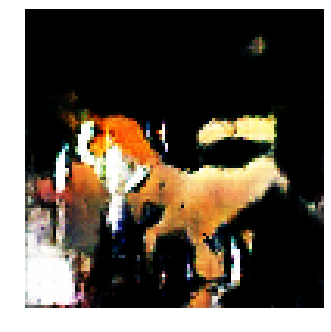


Epoch: 28280, D: -7.529, G: 3.7
Epoch: 28281, D: -6.275, G: 1.991
Epoch: 28282, D: -6.589, G: 2.785
Epoch: 28283, D: -7.325, G: 2.842
Epoch: 28284, D: -6.965, G: 3.291
Epoch: 28285, D: -7.643, G: 1.204
Epoch: 28286, D: -5.431, G: 2.922
Epoch: 28287, D: -6.309, G: 3.902
Epoch: 28288, D: -6.609, G: 3.463
Epoch: 28289, D: -5.529, G: 4.596
Epoch: 28290, D: -5.286, G: 3.868
Epoch: 28291, D: -4.402, G: 4.913
Epoch: 28292, D: -6.382, G: 2.913
Epoch: 28293, D: -5.097, G: 2.816
Epoch: 28294, D: -5.696, G: 3.148
Epoch: 28295, D: -6.556, G: 2.731
Epoch: 28296, D: -6.957, G: 4.125
Epoch: 28297, D: -5.286, G: 6.644
Epoch: 28298, D: -6.947, G: 3.033
Epoch: 28299, D: -7.403, G: 2.969


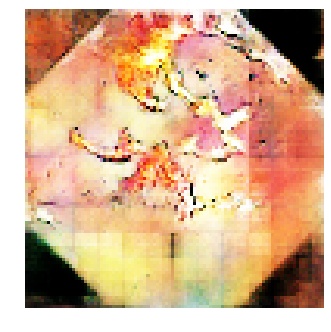


Epoch: 28300, D: -5.501, G: 4.891
Epoch: 28301, D: -5.883, G: 3.351
Epoch: 28302, D: -6.67, G: 5.006
Epoch: 28303, D: -6.094, G: 3.104
Epoch: 28304, D: -6.524, G: 3.246
Epoch: 28305, D: -5.037, G: 3.115
Epoch: 28306, D: -6.247, G: 3.383
Epoch: 28307, D: -5.723, G: 3.659
Epoch: 28308, D: -6.749, G: 3.499
Epoch: 28309, D: -6.02, G: 4.074
Epoch: 28310, D: -5.892, G: 3.995
Epoch: 28311, D: -7.309, G: 3.77
Epoch: 28312, D: -5.755, G: 3.614
Epoch: 28313, D: -6.541, G: 4.082
Epoch: 28314, D: -8.025, G: 4.083
Epoch: 28315, D: -6.308, G: 3.447
Epoch: 28316, D: -6.198, G: 4.622
Epoch: 28317, D: -7.272, G: 3.913
Epoch: 28318, D: -6.102, G: 3.444
Epoch: 28319, D: -5.385, G: 4.958


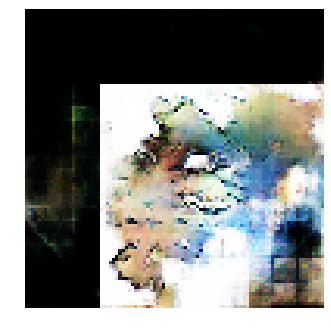


Epoch: 28320, D: -4.94, G: 4.604
Epoch: 28321, D: -4.776, G: 3.599
Epoch: 28322, D: -5.771, G: 3.508
Epoch: 28323, D: -5.439, G: 3.603
Epoch: 28324, D: -6.55, G: 3.58
Epoch: 28325, D: -6.861, G: 3.748
Epoch: 28326, D: -6.54, G: 3.22
Epoch: 28327, D: -7.375, G: 2.639
Epoch: 28328, D: -8.508, G: 3.476
Epoch: 28329, D: -5.256, G: 2.724
Epoch: 28330, D: -6.262, G: 4.116
Epoch: 28331, D: -7.003, G: 2.925
Epoch: 28332, D: -4.021, G: 4.825
Epoch: 28333, D: -5.455, G: 3.63
Epoch: 28334, D: -6.21, G: 3.317
Epoch: 28335, D: -6.003, G: 1.626
Epoch: 28336, D: -4.696, G: 4.777
Epoch: 28337, D: -6.026, G: 3.012
Epoch: 28338, D: -7.822, G: 4.109
Epoch: 28339, D: -6.264, G: 4.316


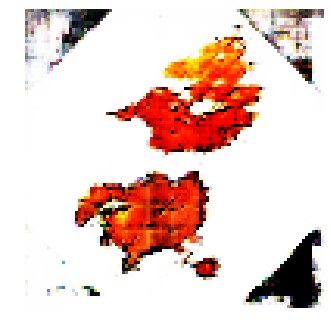


Epoch: 28340, D: -7.706, G: 4.895
Epoch: 28341, D: -6.203, G: 4.22
Epoch: 28342, D: -5.514, G: 3.512
Epoch: 28343, D: -6.843, G: 2.204
Epoch: 28344, D: -6.358, G: 3.219
Epoch: 28345, D: -5.816, G: 5.201
Epoch: 28346, D: -5.295, G: 4.425
Epoch: 28347, D: -6.699, G: 4.128
Epoch: 28348, D: -5.758, G: 2.195
Epoch: 28349, D: -7.298, G: 4.012
Epoch: 28350, D: -6.261, G: 3.508
Epoch: 28351, D: -6.394, G: 6.146
Epoch: 28352, D: -5.775, G: 4.636
Epoch: 28353, D: -6.28, G: 4.343
Epoch: 28354, D: -5.915, G: 2.905
Epoch: 28355, D: -5.405, G: 5.021
Epoch: 28356, D: -5.805, G: 2.437
Epoch: 28357, D: -6.438, G: 3.7
Epoch: 28358, D: -5.766, G: 4.458
Epoch: 28359, D: -5.74, G: 4.652


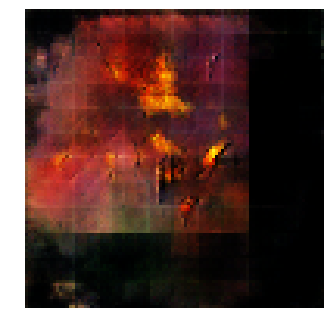


Epoch: 28360, D: -5.565, G: 5.008
Epoch: 28361, D: -6.289, G: 3.47
Epoch: 28362, D: -7.308, G: 3.27
Epoch: 28363, D: -8.358, G: 5.354
Epoch: 28364, D: -6.141, G: 3.712
Epoch: 28365, D: -6.314, G: 6.754
Epoch: 28366, D: -6.011, G: 4.756
Epoch: 28367, D: -6.331, G: 2.146
Epoch: 28368, D: -6.075, G: 2.799
Epoch: 28369, D: -6.076, G: 4.107
Epoch: 28370, D: -6.213, G: 3.043
Epoch: 28371, D: -5.102, G: 3.734
Epoch: 28372, D: -6.318, G: 4.192
Epoch: 28373, D: -5.727, G: 3.179
Epoch: 28374, D: -7.299, G: 3.037
Epoch: 28375, D: -6.789, G: 1.907
Epoch: 28376, D: -7.238, G: 3.261
Epoch: 28377, D: -5.192, G: 3.41
Epoch: 28378, D: -6.251, G: 4.637
Epoch: 28379, D: -7.245, G: 3.176


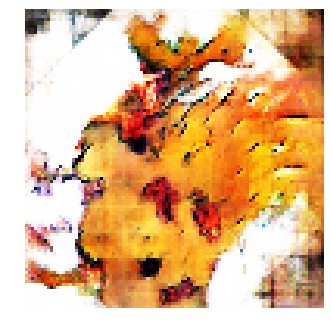


Epoch: 28380, D: -5.06, G: 3.328
Epoch: 28381, D: -5.73, G: 4.09
Epoch: 28382, D: -6.779, G: 3.692
Epoch: 28383, D: -6.855, G: 5.894
Epoch: 28384, D: -6.154, G: 2.925
Epoch: 28385, D: -6.738, G: 8.394
Epoch: 28386, D: -6.027, G: 5.983
Epoch: 28387, D: -6.938, G: 3.477
Epoch: 28388, D: -5.907, G: 6.282
Epoch: 28389, D: -5.34, G: 5.509
Epoch: 28390, D: -6.935, G: 6.685
Epoch: 28391, D: -6.105, G: 3.715
Epoch: 28392, D: -7.184, G: 6.466
Epoch: 28393, D: -6.305, G: 3.629
Epoch: 28394, D: -5.956, G: 4.039
Epoch: 28395, D: -6.556, G: 3.785
Epoch: 28396, D: -7.41, G: 4.562
Epoch: 28397, D: -5.954, G: 5.373
Epoch: 28398, D: -7.063, G: 3.582
Epoch: 28399, D: -6.224, G: 4.094


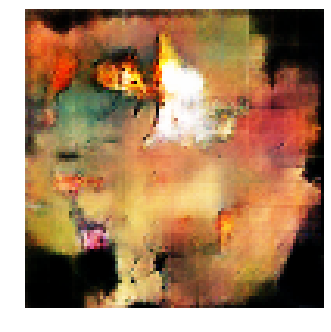


Epoch: 28400, D: -6.581, G: 4.079
Epoch: 28401, D: -6.467, G: 4.947
Epoch: 28402, D: -5.935, G: 2.568
Epoch: 28403, D: -6.331, G: 3.754
Epoch: 28404, D: -6.89, G: 4.731
Epoch: 28405, D: -6.356, G: 1.563
Epoch: 28406, D: -5.801, G: 4.138
Epoch: 28407, D: -7.51, G: 3.47
Epoch: 28408, D: -4.843, G: 2.024
Epoch: 28409, D: -6.089, G: 3.355
Epoch: 28410, D: -5.977, G: 4.079
Epoch: 28411, D: -5.08, G: 4.429
Epoch: 28412, D: -7.002, G: 4.991
Epoch: 28413, D: -6.496, G: 3.015
Epoch: 28414, D: -5.884, G: 4.534
Epoch: 28415, D: -6.447, G: 2.837
Epoch: 28416, D: -6.447, G: 8.319
Epoch: 28417, D: -7.107, G: 4.03
Epoch: 28418, D: -6.617, G: 2.191
Epoch: 28419, D: -5.16, G: 3.445


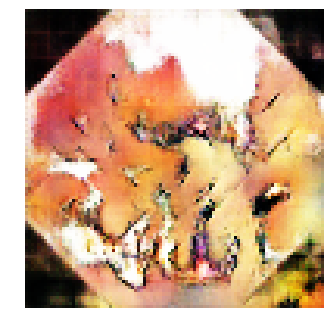


Epoch: 28420, D: -5.861, G: 3.994
Epoch: 28421, D: -5.341, G: 4.794
Epoch: 28422, D: -5.846, G: 5.025
Epoch: 28423, D: -4.952, G: 2.183
Epoch: 28424, D: -5.406, G: 2.155
Epoch: 28425, D: -5.474, G: 2.11
Epoch: 28426, D: -5.457, G: 4.513
Epoch: 28427, D: -6.445, G: 4.682
Epoch: 28428, D: -5.002, G: 3.019
Epoch: 28429, D: -6.063, G: 2.18
Epoch: 28430, D: -6.233, G: 3.12
Epoch: 28431, D: -6.073, G: 2.662
Epoch: 28432, D: -6.205, G: 1.577
Epoch: 28433, D: -5.119, G: 2.347
Epoch: 28434, D: -6.148, G: 3.919
Epoch: 28435, D: -5.769, G: 2.899
Epoch: 28436, D: -5.523, G: 4.099
Epoch: 28437, D: -4.503, G: 4.523
Epoch: 28438, D: -6.419, G: 2.877
Epoch: 28439, D: -5.916, G: 3.716


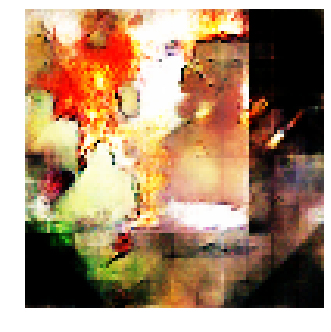


Epoch: 28440, D: -5.405, G: 4.178
Epoch: 28441, D: -6.701, G: 3.789
Epoch: 28442, D: -6.1, G: 2.772
Epoch: 28443, D: -7.147, G: 4.116
Epoch: 28444, D: -5.263, G: 2.747
Epoch: 28445, D: -6.58, G: 2.27
Epoch: 28446, D: -5.301, G: 4.492
Epoch: 28447, D: -5.692, G: 4.534
Epoch: 28448, D: -5.143, G: 3.517
Epoch: 28449, D: -7.001, G: 3.631
Epoch: 28450, D: -7.306, G: 3.978
Epoch: 28451, D: -6.705, G: 3.619
Epoch: 28452, D: -5.643, G: 4.195
Epoch: 28453, D: -5.58, G: 3.29
Epoch: 28454, D: -6.042, G: 3.503
Epoch: 28455, D: -5.955, G: 3.415
Epoch: 28456, D: -6.225, G: 5.613
Epoch: 28457, D: -6.061, G: 3.293
Epoch: 28458, D: -5.54, G: 4.478
Epoch: 28459, D: -7.353, G: 4.632


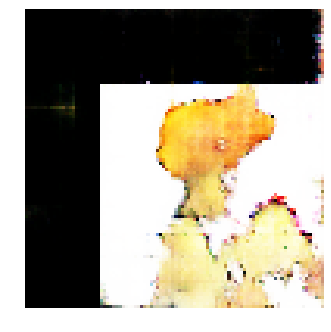


Epoch: 28460, D: -5.907, G: 5.679
Epoch: 28461, D: -5.548, G: 6.192
Epoch: 28462, D: -5.296, G: 5.846
Epoch: 28463, D: -5.962, G: 5.149
Epoch: 28464, D: -5.997, G: 3.64
Epoch: 28465, D: -4.962, G: 4.133
Epoch: 28466, D: -5.713, G: 5.317
Epoch: 28467, D: -7.175, G: 5.093
Epoch: 28468, D: -6.946, G: 4.839
Epoch: 28469, D: -6.829, G: 3.902
Epoch: 28470, D: -5.809, G: 4.68
Epoch: 28471, D: -6.04, G: 4.298
Epoch: 28472, D: -3.963, G: 5.249
Epoch: 28473, D: -6.462, G: 3.686
Epoch: 28474, D: -6.34, G: 5.968
Epoch: 28475, D: -7.005, G: 5.977
Epoch: 28476, D: -6.08, G: 5.0
Epoch: 28477, D: -6.534, G: 3.855
Epoch: 28478, D: -6.902, G: 4.783
Epoch: 28479, D: -4.529, G: 2.267


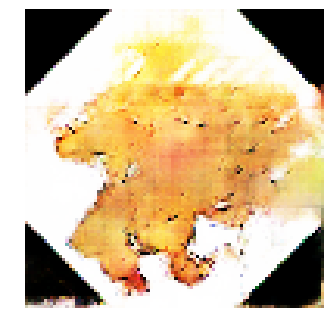


Epoch: 28480, D: -4.977, G: 3.873
Epoch: 28481, D: -6.375, G: 4.247
Epoch: 28482, D: -5.05, G: 3.995
Epoch: 28483, D: -6.344, G: 4.191
Epoch: 28484, D: -5.897, G: 3.712
Epoch: 28485, D: -6.118, G: 4.117
Epoch: 28486, D: -6.7, G: 3.18
Epoch: 28487, D: -6.326, G: 3.307
Epoch: 28488, D: -6.202, G: 2.891
Epoch: 28489, D: -5.215, G: 2.39
Epoch: 28490, D: -6.824, G: 3.791
Epoch: 28491, D: -4.898, G: 3.621
Epoch: 28492, D: -5.411, G: 3.628
Epoch: 28493, D: -6.38, G: 5.103
Epoch: 28494, D: -6.676, G: 3.272
Epoch: 28495, D: -5.445, G: 4.16
Epoch: 28496, D: -6.832, G: 2.611
Epoch: 28497, D: -6.83, G: 4.446
Epoch: 28498, D: -6.69, G: 1.108
Epoch: 28499, D: -6.801, G: 1.167


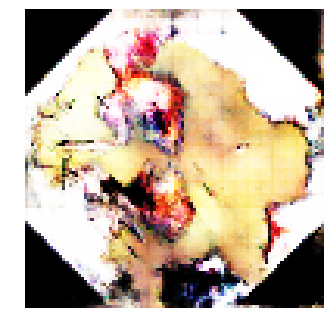


Epoch: 28500, D: -6.426, G: 2.33
Epoch: 28501, D: -6.759, G: 4.549
Epoch: 28502, D: -5.791, G: 1.735
Epoch: 28503, D: -4.96, G: 2.623
Epoch: 28504, D: -6.125, G: 5.008
Epoch: 28505, D: -4.945, G: 4.565
Epoch: 28506, D: -6.903, G: 3.697
Epoch: 28507, D: -5.378, G: 3.656
Epoch: 28508, D: -4.983, G: 3.202
Epoch: 28509, D: -6.516, G: 3.807
Epoch: 28510, D: -5.666, G: 4.437
Epoch: 28511, D: -5.704, G: 4.081
Epoch: 28512, D: -6.717, G: 4.081
Epoch: 28513, D: -5.131, G: 2.65
Epoch: 28514, D: -5.318, G: 2.7
Epoch: 28515, D: -5.846, G: 4.86
Epoch: 28516, D: -5.072, G: 3.62
Epoch: 28517, D: -6.469, G: 2.78
Epoch: 28518, D: -5.926, G: 5.157
Epoch: 28519, D: -4.975, G: 3.672


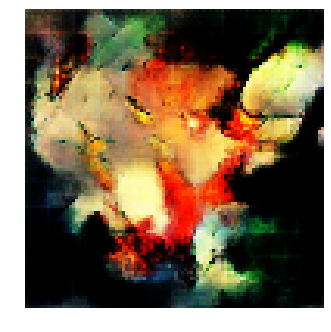


Epoch: 28520, D: -6.894, G: 5.015
Epoch: 28521, D: -5.681, G: 4.672
Epoch: 28522, D: -5.837, G: 5.11
Epoch: 28523, D: -6.729, G: 2.174
Epoch: 28524, D: -6.641, G: 4.073
Epoch: 28525, D: -5.265, G: 2.03
Epoch: 28526, D: -5.812, G: 3.401
Epoch: 28527, D: -5.213, G: 5.449
Epoch: 28528, D: -6.517, G: 6.307
Epoch: 28529, D: -6.458, G: 4.954
Epoch: 28530, D: -5.712, G: 5.859
Epoch: 28531, D: -5.82, G: 3.19
Epoch: 28532, D: -4.923, G: 4.94
Epoch: 28533, D: -7.146, G: 3.284
Epoch: 28534, D: -6.208, G: 3.962
Epoch: 28535, D: -5.24, G: 5.655
Epoch: 28536, D: -6.49, G: 5.741
Epoch: 28537, D: -5.516, G: 3.744
Epoch: 28538, D: -5.298, G: 2.735
Epoch: 28539, D: -5.276, G: 3.402


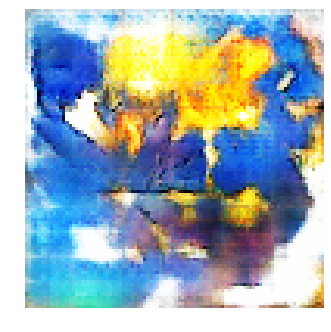


Epoch: 28540, D: -5.091, G: 2.979
Epoch: 28541, D: -5.504, G: 4.343
Epoch: 28542, D: -6.985, G: 4.133
Epoch: 28543, D: -5.798, G: 4.783
Epoch: 28544, D: -6.335, G: 4.155
Epoch: 28545, D: -5.978, G: 4.233
Epoch: 28546, D: -6.203, G: 3.594
Epoch: 28547, D: -6.069, G: 4.412
Epoch: 28548, D: -6.778, G: 2.904
Epoch: 28549, D: -7.549, G: 3.472
Epoch: 28550, D: -5.801, G: 5.117
Epoch: 28551, D: -6.862, G: 2.908
Epoch: 28552, D: -4.805, G: 3.545
Epoch: 28553, D: -6.995, G: 3.292
Epoch: 28554, D: -6.594, G: 4.332
Epoch: 28555, D: -6.273, G: 4.827
Epoch: 28556, D: -6.963, G: 3.034
Epoch: 28557, D: -5.58, G: 3.6
Epoch: 28558, D: -6.774, G: 2.62
Epoch: 28559, D: -6.416, G: 1.993


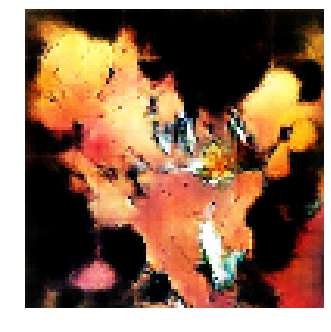


Epoch: 28560, D: -6.723, G: 4.768
Epoch: 28561, D: -6.324, G: 3.872
Epoch: 28562, D: -7.068, G: 2.557
Epoch: 28563, D: -6.022, G: 4.31
Epoch: 28564, D: -6.014, G: 2.717
Epoch: 28565, D: -5.257, G: 3.153
Epoch: 28566, D: -5.112, G: 4.313
Epoch: 28567, D: -5.891, G: 3.782
Epoch: 28568, D: -6.322, G: 2.884
Epoch: 28569, D: -5.338, G: 3.61
Epoch: 28570, D: -5.664, G: 3.25
Epoch: 28571, D: -5.423, G: 3.204
Epoch: 28572, D: -5.804, G: 3.159
Epoch: 28573, D: -6.682, G: 2.911
Epoch: 28574, D: -7.563, G: 2.773
Epoch: 28575, D: -6.129, G: 0.706
Epoch: 28576, D: -4.807, G: 5.557
Epoch: 28577, D: -6.663, G: 3.838
Epoch: 28578, D: -5.987, G: 2.134
Epoch: 28579, D: -6.28, G: 3.155


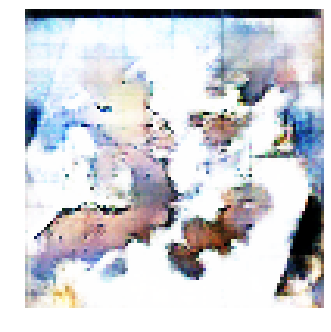


Epoch: 28580, D: -5.84, G: 3.733
Epoch: 28581, D: -5.794, G: 3.805
Epoch: 28582, D: -5.371, G: 3.663
Epoch: 28583, D: -5.404, G: 4.036
Epoch: 28584, D: -6.049, G: 2.045
Epoch: 28585, D: -6.864, G: 2.781
Epoch: 28586, D: -7.286, G: 4.019
Epoch: 28587, D: -5.472, G: 2.529
Epoch: 28588, D: -6.522, G: 4.015
Epoch: 28589, D: -6.492, G: 3.465
Epoch: 28590, D: -6.985, G: 3.362
Epoch: 28591, D: -6.924, G: 2.675
Epoch: 28592, D: -6.859, G: 0.6103
Epoch: 28593, D: -5.657, G: 4.412
Epoch: 28594, D: -5.18, G: 4.516
Epoch: 28595, D: -5.094, G: 5.483
Epoch: 28596, D: -5.1, G: 2.801
Epoch: 28597, D: -6.443, G: 3.16
Epoch: 28598, D: -6.061, G: 1.812
Epoch: 28599, D: -5.713, G: 2.01


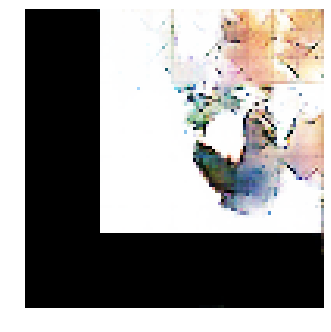


Epoch: 28600, D: -5.83, G: 3.713
Epoch: 28601, D: -5.293, G: 6.099
Epoch: 28602, D: -6.219, G: 3.435
Epoch: 28603, D: -6.459, G: 5.348
Epoch: 28604, D: -5.468, G: 4.212
Epoch: 28605, D: -6.908, G: 2.5
Epoch: 28606, D: -6.42, G: 2.161
Epoch: 28607, D: -4.278, G: 3.76
Epoch: 28608, D: -7.966, G: 4.363
Epoch: 28609, D: -6.088, G: 2.627
Epoch: 28610, D: -6.783, G: 4.826
Epoch: 28611, D: -6.113, G: 2.963
Epoch: 28612, D: -5.853, G: 3.737
Epoch: 28613, D: -5.268, G: 3.532
Epoch: 28614, D: -5.854, G: 6.085
Epoch: 28615, D: -4.96, G: 4.806
Epoch: 28616, D: -5.84, G: 4.087
Epoch: 28617, D: -6.217, G: 2.61
Epoch: 28618, D: -4.786, G: 4.3
Epoch: 28619, D: -5.313, G: 4.8


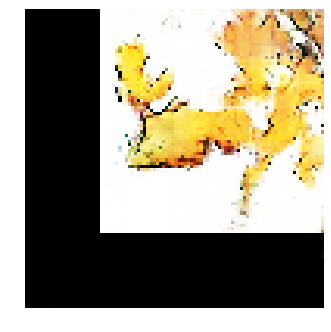


Epoch: 28620, D: -7.341, G: 5.358
Epoch: 28621, D: -6.497, G: 5.015
Epoch: 28622, D: -6.889, G: 4.712
Epoch: 28623, D: -5.644, G: 6.009
Epoch: 28624, D: -7.064, G: 3.203
Epoch: 28625, D: -5.391, G: 3.716
Epoch: 28626, D: -6.575, G: 4.974
Epoch: 28627, D: -5.89, G: 3.812
Epoch: 28628, D: -6.162, G: 4.912
Epoch: 28629, D: -6.113, G: 4.739
Epoch: 28630, D: -5.083, G: 2.297
Epoch: 28631, D: -5.881, G: 4.881
Epoch: 28632, D: -7.027, G: 2.455
Epoch: 28633, D: -6.629, G: 4.169
Epoch: 28634, D: -7.249, G: 5.617
Epoch: 28635, D: -5.404, G: 2.251
Epoch: 28636, D: -6.702, G: 4.773
Epoch: 28637, D: -5.947, G: 4.628
Epoch: 28638, D: -5.099, G: 5.808
Epoch: 28639, D: -6.448, G: 1.511


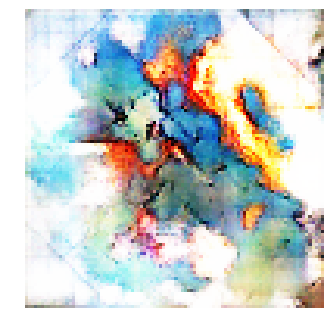


Epoch: 28640, D: -5.975, G: 2.004
Epoch: 28641, D: -5.034, G: 3.052
Epoch: 28642, D: -3.624, G: 5.336
Epoch: 28643, D: -5.256, G: 3.036
Epoch: 28644, D: -6.537, G: 3.827
Epoch: 28645, D: -6.832, G: 3.387
Epoch: 28646, D: -8.27, G: 4.222
Epoch: 28647, D: -5.642, G: 2.335
Epoch: 28648, D: -6.442, G: 4.763
Epoch: 28649, D: -5.67, G: 5.366
Epoch: 28650, D: -5.583, G: 2.332
Epoch: 28651, D: -5.601, G: 2.281
Epoch: 28652, D: -6.182, G: 4.197
Epoch: 28653, D: -5.442, G: 5.649
Epoch: 28654, D: -5.375, G: 3.953
Epoch: 28655, D: -7.669, G: 3.709
Epoch: 28656, D: -5.309, G: 3.29
Epoch: 28657, D: -6.234, G: 0.8486
Epoch: 28658, D: -5.302, G: 5.411
Epoch: 28659, D: -5.623, G: 4.495


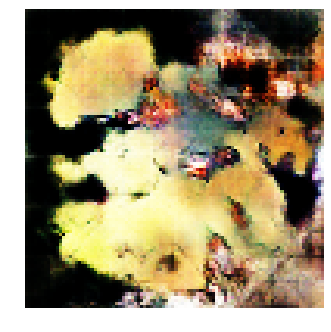


Epoch: 28660, D: -6.562, G: 4.959
Epoch: 28661, D: -5.647, G: 5.708
Epoch: 28662, D: -5.936, G: 5.388
Epoch: 28663, D: -6.561, G: 4.018
Epoch: 28664, D: -7.522, G: 3.786
Epoch: 28665, D: -4.967, G: 4.312
Epoch: 28666, D: -4.65, G: 4.076
Epoch: 28667, D: -5.981, G: 4.32
Epoch: 28668, D: -7.155, G: 4.064
Epoch: 28669, D: -6.166, G: 3.69
Epoch: 28670, D: -5.987, G: 4.724
Epoch: 28671, D: -6.898, G: 4.155
Epoch: 28672, D: -6.024, G: 5.583
Epoch: 28673, D: -5.235, G: 4.335
Epoch: 28674, D: -5.642, G: 4.636
Epoch: 28675, D: -5.989, G: 3.832
Epoch: 28676, D: -7.034, G: 5.501
Epoch: 28677, D: -7.086, G: 4.201
Epoch: 28678, D: -5.554, G: 6.856
Epoch: 28679, D: -5.954, G: 6.339


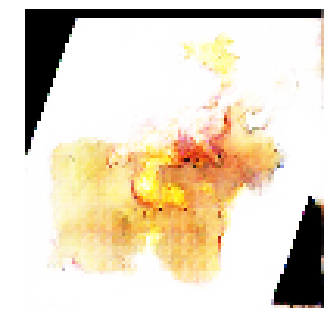


Epoch: 28680, D: -6.372, G: 3.426
Epoch: 28681, D: -6.794, G: 5.305
Epoch: 28682, D: -6.207, G: 1.427
Epoch: 28683, D: -5.216, G: 4.639
Epoch: 28684, D: -6.185, G: 6.09
Epoch: 28685, D: -5.931, G: 4.252
Epoch: 28686, D: -5.893, G: 5.8
Epoch: 28687, D: -7.472, G: 3.029
Epoch: 28688, D: -5.579, G: 6.056
Epoch: 28689, D: -6.456, G: 3.275
Epoch: 28690, D: -5.74, G: 2.829
Epoch: 28691, D: -5.0, G: 4.064
Epoch: 28692, D: -6.486, G: 5.14
Epoch: 28693, D: -5.741, G: 2.696
Epoch: 28694, D: -5.53, G: 2.917
Epoch: 28695, D: -5.013, G: 3.722
Epoch: 28696, D: -5.145, G: 3.841
Epoch: 28697, D: -6.662, G: 3.503
Epoch: 28698, D: -6.901, G: 3.244
Epoch: 28699, D: -6.271, G: 3.605


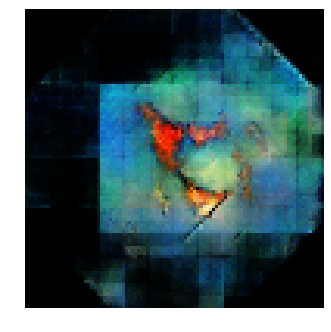


Epoch: 28700, D: -7.608, G: 3.694
Epoch: 28701, D: -7.707, G: 4.339
Epoch: 28702, D: -6.762, G: 4.3
Epoch: 28703, D: -5.623, G: 5.311
Epoch: 28704, D: -5.767, G: 4.141
Epoch: 28705, D: -5.782, G: 2.969
Epoch: 28706, D: -6.062, G: 4.932
Epoch: 28707, D: -5.603, G: 3.776
Epoch: 28708, D: -6.201, G: 3.92
Epoch: 28709, D: -5.271, G: 3.388
Epoch: 28710, D: -4.518, G: 4.417
Epoch: 28711, D: -6.292, G: 4.089
Epoch: 28712, D: -6.598, G: 3.843
Epoch: 28713, D: -6.697, G: 3.914
Epoch: 28714, D: -5.717, G: 5.05
Epoch: 28715, D: -7.072, G: 3.383
Epoch: 28716, D: -6.363, G: 5.065
Epoch: 28717, D: -7.777, G: 4.212
Epoch: 28718, D: -5.373, G: 4.308
Epoch: 28719, D: -6.486, G: 3.287


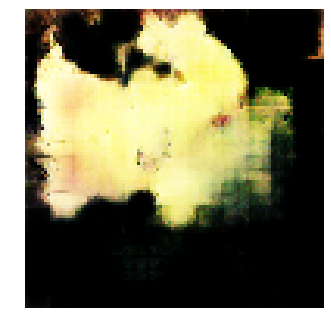


Epoch: 28720, D: -5.7, G: 3.488
Epoch: 28721, D: -5.386, G: 3.463
Epoch: 28722, D: -5.711, G: 2.295
Epoch: 28723, D: -5.738, G: 4.413
Epoch: 28724, D: -5.913, G: 3.585
Epoch: 28725, D: -5.636, G: 3.192
Epoch: 28726, D: -8.02, G: 3.808
Epoch: 28727, D: -6.897, G: 1.077
Epoch: 28728, D: -6.566, G: 2.033
Epoch: 28729, D: -7.445, G: 2.881
Epoch: 28730, D: -5.212, G: 4.273
Epoch: 28731, D: -6.194, G: 4.632
Epoch: 28732, D: -6.157, G: 4.74
Epoch: 28733, D: -5.645, G: 2.89
Epoch: 28734, D: -5.552, G: 5.242
Epoch: 28735, D: -6.945, G: 3.733
Epoch: 28736, D: -6.023, G: 4.118
Epoch: 28737, D: -6.602, G: 2.925
Epoch: 28738, D: -5.241, G: 2.463
Epoch: 28739, D: -6.068, G: 4.804


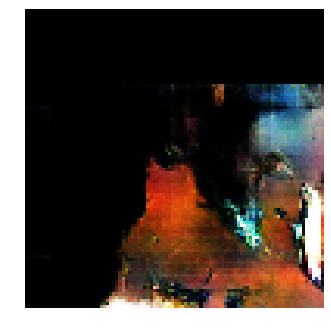


Epoch: 28740, D: -6.712, G: 4.755
Epoch: 28741, D: -5.198, G: 4.285
Epoch: 28742, D: -7.05, G: 4.049
Epoch: 28743, D: -5.309, G: 3.831
Epoch: 28744, D: -5.48, G: 4.063
Epoch: 28745, D: -7.109, G: 4.842
Epoch: 28746, D: -5.357, G: 3.292
Epoch: 28747, D: -5.547, G: 4.901
Epoch: 28748, D: -5.875, G: 3.673
Epoch: 28749, D: -6.128, G: 5.422
Epoch: 28750, D: -6.667, G: 4.101
Epoch: 28751, D: -5.818, G: 3.388
Epoch: 28752, D: -5.666, G: 5.403
Epoch: 28753, D: -5.653, G: 3.732
Epoch: 28754, D: -5.987, G: 2.333
Epoch: 28755, D: -6.175, G: 3.703
Epoch: 28756, D: -6.43, G: 2.721
Epoch: 28757, D: -6.29, G: 2.864
Epoch: 28758, D: -5.857, G: 2.235
Epoch: 28759, D: -7.919, G: 4.594


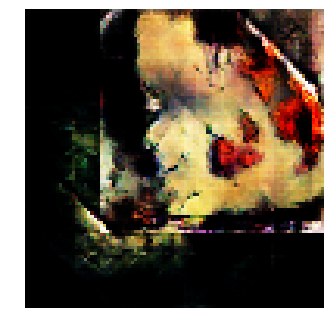


Epoch: 28760, D: -6.275, G: 2.835
Epoch: 28761, D: -6.087, G: 1.638
Epoch: 28762, D: -6.132, G: 4.427
Epoch: 28763, D: -6.175, G: 3.462
Epoch: 28764, D: -5.336, G: 2.608
Epoch: 28765, D: -6.868, G: 3.596
Epoch: 28766, D: -6.41, G: 2.122
Epoch: 28767, D: -7.343, G: 2.892
Epoch: 28768, D: -6.219, G: 0.3888
Epoch: 28769, D: -5.429, G: 3.238
Epoch: 28770, D: -5.906, G: 5.229
Epoch: 28771, D: -6.826, G: 2.614
Epoch: 28772, D: -6.981, G: 5.844
Epoch: 28773, D: -7.366, G: 5.952
Epoch: 28774, D: -5.957, G: 2.609
Epoch: 28775, D: -5.091, G: 4.412
Epoch: 28776, D: -6.43, G: 4.44
Epoch: 28777, D: -5.406, G: 2.097
Epoch: 28778, D: -5.323, G: 3.418
Epoch: 28779, D: -6.335, G: 3.908


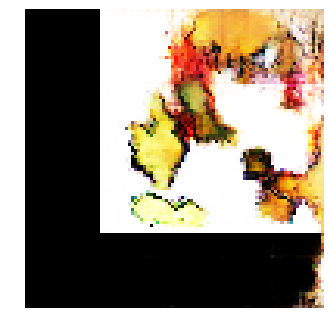


Epoch: 28780, D: -6.746, G: 4.697
Epoch: 28781, D: -6.043, G: 4.077
Epoch: 28782, D: -6.772, G: 2.636
Epoch: 28783, D: -6.496, G: 5.044
Epoch: 28784, D: -5.848, G: 2.824
Epoch: 28785, D: -5.036, G: 4.653
Epoch: 28786, D: -5.406, G: 6.347
Epoch: 28787, D: -5.245, G: 2.908
Epoch: 28788, D: -6.072, G: 5.156
Epoch: 28789, D: -5.422, G: 3.693
Epoch: 28790, D: -4.348, G: 3.763
Epoch: 28791, D: -5.447, G: 3.631
Epoch: 28792, D: -5.711, G: 3.201
Epoch: 28793, D: -5.744, G: 3.523
Epoch: 28794, D: -6.361, G: 3.661
Epoch: 28795, D: -6.31, G: 2.791
Epoch: 28796, D: -6.368, G: 2.296
Epoch: 28797, D: -6.49, G: 2.97
Epoch: 28798, D: -6.471, G: 4.87
Epoch: 28799, D: -6.919, G: 6.555


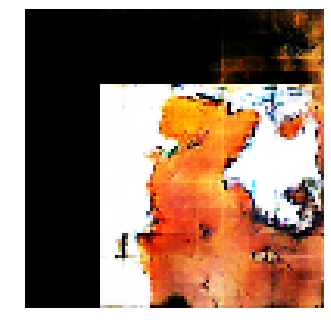


Epoch: 28800, D: -6.578, G: 4.286
Epoch: 28801, D: -6.516, G: 2.395
Epoch: 28802, D: -5.872, G: 3.358
Epoch: 28803, D: -4.92, G: 3.421
Epoch: 28804, D: -6.624, G: 3.066
Epoch: 28805, D: -5.776, G: 2.253
Epoch: 28806, D: -5.379, G: 2.947
Epoch: 28807, D: -7.674, G: 3.582
Epoch: 28808, D: -5.785, G: 4.007
Epoch: 28809, D: -6.478, G: 5.094
Epoch: 28810, D: -5.23, G: 5.492
Epoch: 28811, D: -5.079, G: 3.743
Epoch: 28812, D: -6.274, G: 2.167
Epoch: 28813, D: -7.976, G: 2.887
Epoch: 28814, D: -7.076, G: 3.154
Epoch: 28815, D: -5.322, G: 3.986
Epoch: 28816, D: -6.339, G: 5.548
Epoch: 28817, D: -5.067, G: 4.728
Epoch: 28818, D: -5.387, G: 2.854
Epoch: 28819, D: -5.951, G: 4.347


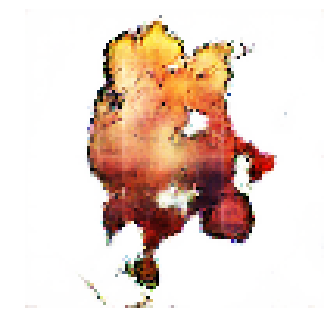


Epoch: 28820, D: -7.182, G: 4.281
Epoch: 28821, D: -6.291, G: 4.776
Epoch: 28822, D: -6.404, G: 4.419
Epoch: 28823, D: -4.099, G: 2.399
Epoch: 28824, D: -5.992, G: 4.162
Epoch: 28825, D: -5.851, G: 2.769
Epoch: 28826, D: -5.978, G: 3.487
Epoch: 28827, D: -6.045, G: 3.801
Epoch: 28828, D: -7.86, G: 3.195
Epoch: 28829, D: -7.068, G: 1.709
Epoch: 28830, D: -4.543, G: 3.1
Epoch: 28831, D: -6.109, G: 3.688
Epoch: 28832, D: -6.608, G: 4.13
Epoch: 28833, D: -6.713, G: 3.954
Epoch: 28834, D: -8.005, G: 3.316
Epoch: 28835, D: -6.879, G: 4.562
Epoch: 28836, D: -6.78, G: 3.076
Epoch: 28837, D: -6.007, G: 3.661
Epoch: 28838, D: -5.433, G: 4.24
Epoch: 28839, D: -5.044, G: 4.677


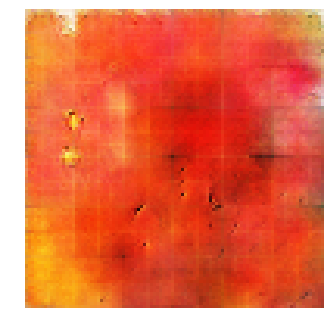


Epoch: 28840, D: -6.043, G: 2.903
Epoch: 28841, D: -4.8, G: 3.961
Epoch: 28842, D: -5.989, G: 3.398
Epoch: 28843, D: -7.86, G: 4.541
Epoch: 28844, D: -6.649, G: 1.892
Epoch: 28845, D: -5.792, G: 4.094
Epoch: 28846, D: -5.639, G: 3.453
Epoch: 28847, D: -5.926, G: 2.851
Epoch: 28848, D: -6.416, G: 2.991
Epoch: 28849, D: -5.772, G: 1.353
Epoch: 28850, D: -5.014, G: 2.773
Epoch: 28851, D: -5.792, G: 2.888
Epoch: 28852, D: -6.559, G: 3.281
Epoch: 28853, D: -5.765, G: 3.223
Epoch: 28854, D: -7.07, G: 4.476
Epoch: 28855, D: -5.753, G: 3.095
Epoch: 28856, D: -6.223, G: 3.661
Epoch: 28857, D: -5.756, G: 2.421
Epoch: 28858, D: -5.015, G: 2.148
Epoch: 28859, D: -7.982, G: 3.568


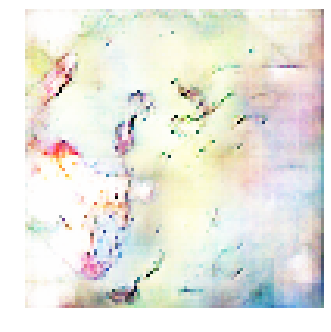


Epoch: 28860, D: -7.098, G: 3.713
Epoch: 28861, D: -5.683, G: 5.686
Epoch: 28862, D: -6.008, G: 3.758
Epoch: 28863, D: -4.481, G: 4.095
Epoch: 28864, D: -5.796, G: 3.732
Epoch: 28865, D: -6.681, G: 2.864
Epoch: 28866, D: -7.059, G: 2.92
Epoch: 28867, D: -5.393, G: 3.984
Epoch: 28868, D: -5.758, G: 2.346
Epoch: 28869, D: -5.09, G: 4.013
Epoch: 28870, D: -6.549, G: 3.18
Epoch: 28871, D: -6.432, G: 6.416
Epoch: 28872, D: -5.809, G: 4.713
Epoch: 28873, D: -5.919, G: 3.753
Epoch: 28874, D: -5.927, G: 4.104
Epoch: 28875, D: -5.755, G: 5.788
Epoch: 28876, D: -4.83, G: 3.384
Epoch: 28877, D: -6.635, G: 3.572
Epoch: 28878, D: -6.203, G: 2.462
Epoch: 28879, D: -6.156, G: 3.791


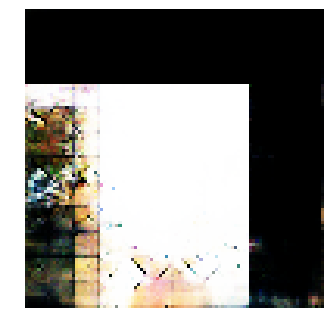


Epoch: 28880, D: -5.679, G: 4.311
Epoch: 28881, D: -4.729, G: 2.862
Epoch: 28882, D: -6.116, G: 3.352
Epoch: 28883, D: -5.931, G: 3.593
Epoch: 28884, D: -7.508, G: 1.917
Epoch: 28885, D: -5.049, G: 3.791
Epoch: 28886, D: -6.641, G: 2.797
Epoch: 28887, D: -6.065, G: 3.688
Epoch: 28888, D: -5.288, G: 6.14
Epoch: 28889, D: -6.561, G: 3.993
Epoch: 28890, D: -6.514, G: 4.784
Epoch: 28891, D: -6.63, G: 3.813
Epoch: 28892, D: -5.426, G: 4.753
Epoch: 28893, D: -4.774, G: 4.863
Epoch: 28894, D: -5.664, G: 4.717
Epoch: 28895, D: -5.204, G: 3.724
Epoch: 28896, D: -4.033, G: 3.873
Epoch: 28897, D: -6.098, G: 4.592
Epoch: 28898, D: -5.883, G: 3.33
Epoch: 28899, D: -7.575, G: 4.495


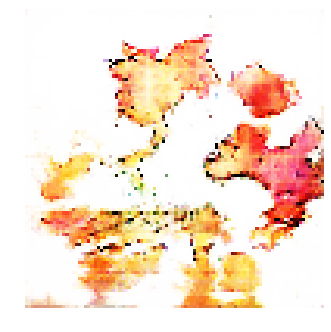


Epoch: 28900, D: -6.06, G: 2.721
Epoch: 28901, D: -4.337, G: 2.415
Epoch: 28902, D: -6.594, G: 4.367
Epoch: 28903, D: -5.759, G: 1.817
Epoch: 28904, D: -7.167, G: 4.344
Epoch: 28905, D: -5.571, G: 2.307
Epoch: 28906, D: -6.189, G: 3.367
Epoch: 28907, D: -5.627, G: 7.373
Epoch: 28908, D: -6.534, G: 4.335
Epoch: 28909, D: -6.4, G: 3.573
Epoch: 28910, D: -7.451, G: 5.633
Epoch: 28911, D: -6.609, G: 3.593
Epoch: 28912, D: -7.149, G: 3.271
Epoch: 28913, D: -6.94, G: 5.068
Epoch: 28914, D: -6.472, G: 3.196
Epoch: 28915, D: -5.171, G: 4.599
Epoch: 28916, D: -7.667, G: 5.204
Epoch: 28917, D: -6.638, G: 4.094
Epoch: 28918, D: -3.898, G: 3.514
Epoch: 28919, D: -6.713, G: 3.093


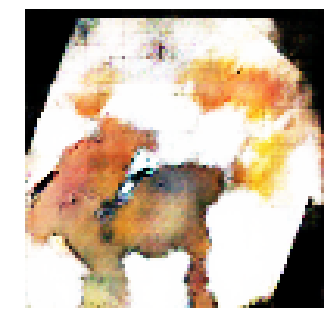


Epoch: 28920, D: -6.173, G: 4.279
Epoch: 28921, D: -5.203, G: 3.625
Epoch: 28922, D: -5.688, G: 3.578
Epoch: 28923, D: -5.645, G: 5.753
Epoch: 28924, D: -6.128, G: 2.521
Epoch: 28925, D: -5.628, G: 2.463
Epoch: 28926, D: -5.046, G: 3.277
Epoch: 28927, D: -6.086, G: 3.186
Epoch: 28928, D: -4.736, G: 4.407
Epoch: 28929, D: -6.282, G: 3.219
Epoch: 28930, D: -5.48, G: 4.233
Epoch: 28931, D: -6.473, G: 2.988
Epoch: 28932, D: -6.91, G: 4.096
Epoch: 28933, D: -6.715, G: 1.087
Epoch: 28934, D: -7.056, G: 3.483
Epoch: 28935, D: -5.947, G: 2.56
Epoch: 28936, D: -7.127, G: 3.097
Epoch: 28937, D: -5.894, G: 3.334
Epoch: 28938, D: -6.1, G: 4.324
Epoch: 28939, D: -7.155, G: 4.212


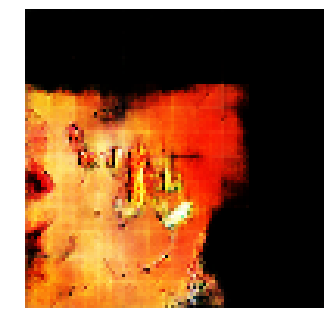


Epoch: 28940, D: -5.417, G: 4.441
Epoch: 28941, D: -5.818, G: 3.538
Epoch: 28942, D: -6.198, G: 5.539
Epoch: 28943, D: -5.15, G: 2.823
Epoch: 28944, D: -7.922, G: 4.838
Epoch: 28945, D: -6.583, G: 5.196
Epoch: 28946, D: -6.335, G: 3.118
Epoch: 28947, D: -7.751, G: 3.235
Epoch: 28948, D: -4.777, G: 2.371
Epoch: 28949, D: -7.971, G: 5.309
Epoch: 28950, D: -5.556, G: 4.082
Epoch: 28951, D: -7.216, G: 3.113
Epoch: 28952, D: -6.334, G: 2.697
Epoch: 28953, D: -7.824, G: 2.478
Epoch: 28954, D: -7.683, G: 2.835
Epoch: 28955, D: -6.228, G: 6.381
Epoch: 28956, D: -6.502, G: 3.666
Epoch: 28957, D: -6.763, G: 4.072
Epoch: 28958, D: -7.179, G: 4.711
Epoch: 28959, D: -5.065, G: 4.85


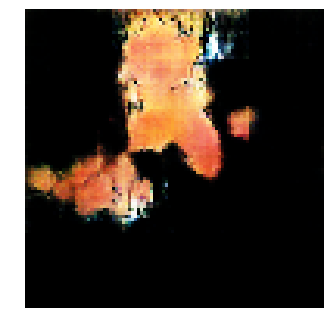


Epoch: 28960, D: -5.56, G: 2.271
Epoch: 28961, D: -5.971, G: 4.222
Epoch: 28962, D: -6.751, G: 4.68
Epoch: 28963, D: -6.839, G: 4.71
Epoch: 28964, D: -5.105, G: 3.633
Epoch: 28965, D: -5.487, G: 2.687
Epoch: 28966, D: -5.29, G: 5.136
Epoch: 28967, D: -5.808, G: 3.249
Epoch: 28968, D: -5.676, G: 4.058
Epoch: 28969, D: -5.606, G: 4.801
Epoch: 28970, D: -7.58, G: 3.738
Epoch: 28971, D: -5.692, G: 3.192
Epoch: 28972, D: -6.453, G: 3.89
Epoch: 28973, D: -5.247, G: 4.595
Epoch: 28974, D: -5.852, G: 3.967
Epoch: 28975, D: -6.953, G: 3.563
Epoch: 28976, D: -5.95, G: 3.855
Epoch: 28977, D: -6.986, G: 2.629
Epoch: 28978, D: -6.677, G: 4.374
Epoch: 28979, D: -5.835, G: 5.665


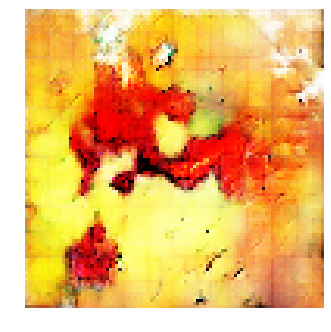


Epoch: 28980, D: -5.486, G: 4.137
Epoch: 28981, D: -5.091, G: 3.526
Epoch: 28982, D: -5.297, G: 3.025
Epoch: 28983, D: -7.546, G: 5.157
Epoch: 28984, D: -6.276, G: 5.237
Epoch: 28985, D: -6.268, G: 4.531
Epoch: 28986, D: -5.678, G: 3.087
Epoch: 28987, D: -6.011, G: 5.077
Epoch: 28988, D: -6.408, G: 4.831
Epoch: 28989, D: -5.74, G: 1.686
Epoch: 28990, D: -5.207, G: 4.137
Epoch: 28991, D: -6.716, G: 3.385
Epoch: 28992, D: -5.446, G: 3.827
Epoch: 28993, D: -6.687, G: 3.235
Epoch: 28994, D: -6.596, G: 4.637
Epoch: 28995, D: -6.932, G: 6.342
Epoch: 28996, D: -6.6, G: 3.647
Epoch: 28997, D: -6.103, G: 3.435
Epoch: 28998, D: -6.801, G: 3.636
Epoch: 28999, D: -7.4, G: 4.72


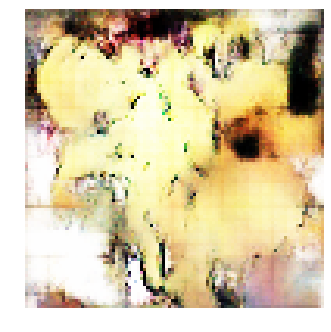


Epoch: 29000, D: -7.951, G: 2.895
Epoch: 29001, D: -5.732, G: 3.92
Epoch: 29002, D: -6.322, G: 4.566
Epoch: 29003, D: -7.744, G: 6.087
Epoch: 29004, D: -5.497, G: 3.604
Epoch: 29005, D: -7.178, G: 5.193
Epoch: 29006, D: -5.769, G: 4.403
Epoch: 29007, D: -5.266, G: 4.497
Epoch: 29008, D: -6.47, G: 3.624
Epoch: 29009, D: -6.58, G: 3.93
Epoch: 29010, D: -6.356, G: 3.921
Epoch: 29011, D: -4.548, G: 3.002
Epoch: 29012, D: -5.673, G: 3.039
Epoch: 29013, D: -4.603, G: 3.413
Epoch: 29014, D: -6.664, G: 3.222
Epoch: 29015, D: -7.336, G: 2.169
Epoch: 29016, D: -5.644, G: 5.647
Epoch: 29017, D: -7.66, G: 2.28
Epoch: 29018, D: -6.442, G: 2.004
Epoch: 29019, D: -5.754, G: 3.264


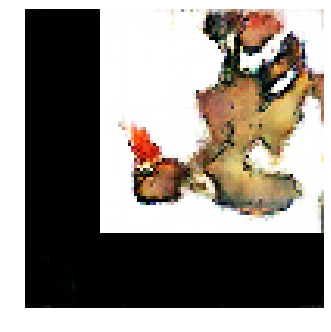


Epoch: 29020, D: -7.456, G: 4.892
Epoch: 29021, D: -6.937, G: 3.734
Epoch: 29022, D: -4.677, G: 4.026
Epoch: 29023, D: -4.761, G: 4.479
Epoch: 29024, D: -4.888, G: 3.085
Epoch: 29025, D: -8.404, G: 3.874
Epoch: 29026, D: -7.393, G: 2.89
Epoch: 29027, D: -5.004, G: 5.164
Epoch: 29028, D: -5.04, G: 4.623
Epoch: 29029, D: -5.832, G: 6.637
Epoch: 29030, D: -5.861, G: 4.979
Epoch: 29031, D: -6.009, G: 4.742
Epoch: 29032, D: -5.476, G: 2.216
Epoch: 29033, D: -5.828, G: 4.504
Epoch: 29034, D: -6.228, G: 3.122
Epoch: 29035, D: -6.05, G: 3.617
Epoch: 29036, D: -6.734, G: 3.37
Epoch: 29037, D: -5.659, G: 5.103
Epoch: 29038, D: -7.155, G: 6.177
Epoch: 29039, D: -5.901, G: 2.771


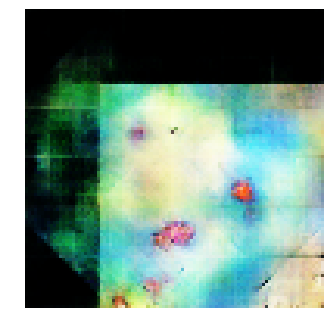


Epoch: 29040, D: -6.484, G: 5.827
Epoch: 29041, D: -4.745, G: 4.983
Epoch: 29042, D: -5.638, G: 4.686
Epoch: 29043, D: -5.819, G: 5.948
Epoch: 29044, D: -5.409, G: 3.0
Epoch: 29045, D: -6.654, G: 4.579
Epoch: 29046, D: -6.106, G: 5.138
Epoch: 29047, D: -7.578, G: 3.127
Epoch: 29048, D: -4.986, G: 1.27
Epoch: 29049, D: -6.869, G: 4.414
Epoch: 29050, D: -7.108, G: 2.692
Epoch: 29051, D: -6.113, G: 4.745
Epoch: 29052, D: -5.869, G: 3.417
Epoch: 29053, D: -6.309, G: 3.545
Epoch: 29054, D: -7.814, G: 6.469
Epoch: 29055, D: -5.703, G: 4.42
Epoch: 29056, D: -4.937, G: 3.65
Epoch: 29057, D: -5.809, G: 5.797
Epoch: 29058, D: -6.073, G: 4.889
Epoch: 29059, D: -6.84, G: 4.632


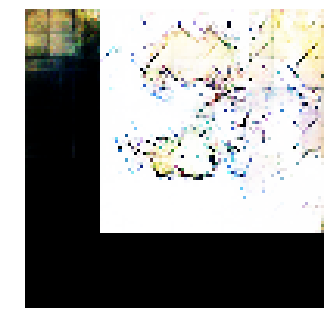


Epoch: 29060, D: -6.358, G: 3.102
Epoch: 29061, D: -5.925, G: 4.487
Epoch: 29062, D: -6.245, G: 4.197
Epoch: 29063, D: -7.162, G: 3.934
Epoch: 29064, D: -6.829, G: 5.306
Epoch: 29065, D: -7.517, G: 2.965
Epoch: 29066, D: -6.255, G: 2.448
Epoch: 29067, D: -6.418, G: 4.04
Epoch: 29068, D: -5.773, G: 3.123
Epoch: 29069, D: -5.441, G: 3.747
Epoch: 29070, D: -7.423, G: 3.336
Epoch: 29071, D: -6.389, G: 3.074
Epoch: 29072, D: -5.124, G: 5.719
Epoch: 29073, D: -6.232, G: 5.422
Epoch: 29074, D: -5.263, G: 4.507
Epoch: 29075, D: -5.079, G: 5.144
Epoch: 29076, D: -7.737, G: 4.489
Epoch: 29077, D: -6.83, G: 3.985
Epoch: 29078, D: -5.864, G: 4.703
Epoch: 29079, D: -6.435, G: 5.469


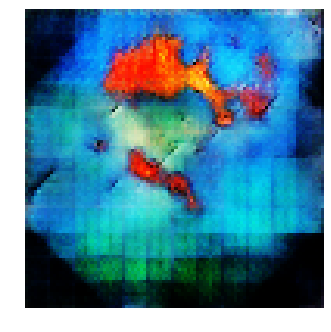


Epoch: 29080, D: -5.822, G: 0.646
Epoch: 29081, D: -7.053, G: 1.894
Epoch: 29082, D: -5.915, G: 4.039
Epoch: 29083, D: -5.895, G: 4.644
Epoch: 29084, D: -6.148, G: 3.442
Epoch: 29085, D: -7.15, G: 4.539
Epoch: 29086, D: -7.618, G: 3.604
Epoch: 29087, D: -6.304, G: 4.226
Epoch: 29088, D: -6.424, G: 3.698
Epoch: 29089, D: -6.549, G: 3.424
Epoch: 29090, D: -5.594, G: 2.516
Epoch: 29091, D: -6.496, G: 4.867
Epoch: 29092, D: -5.42, G: 3.707
Epoch: 29093, D: -5.902, G: 1.706
Epoch: 29094, D: -4.621, G: 5.418
Epoch: 29095, D: -5.706, G: 4.169
Epoch: 29096, D: -6.735, G: 3.48
Epoch: 29097, D: -7.53, G: 3.371
Epoch: 29098, D: -6.484, G: 5.57
Epoch: 29099, D: -6.479, G: 3.718


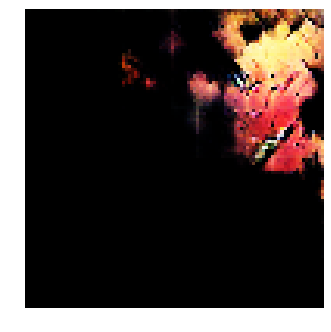


Epoch: 29100, D: -5.817, G: 5.771
Epoch: 29101, D: -5.682, G: 4.64
Epoch: 29102, D: -5.919, G: 3.811
Epoch: 29103, D: -6.861, G: 3.637
Epoch: 29104, D: -4.851, G: 4.054
Epoch: 29105, D: -7.596, G: 4.398
Epoch: 29106, D: -6.915, G: 3.506
Epoch: 29107, D: -5.479, G: 3.359
Epoch: 29108, D: -5.54, G: 2.871
Epoch: 29109, D: -5.535, G: 2.096
Epoch: 29110, D: -5.888, G: 4.98
Epoch: 29111, D: -4.91, G: 4.119
Epoch: 29112, D: -6.494, G: 3.731
Epoch: 29113, D: -5.581, G: 3.009
Epoch: 29114, D: -6.152, G: 3.865
Epoch: 29115, D: -4.811, G: 6.268
Epoch: 29116, D: -5.12, G: 2.449
Epoch: 29117, D: -5.425, G: 4.1
Epoch: 29118, D: -6.109, G: 3.571
Epoch: 29119, D: -6.459, G: 5.212


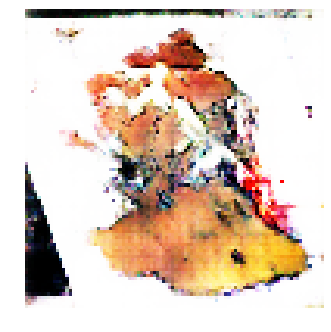


Epoch: 29120, D: -6.111, G: 3.951
Epoch: 29121, D: -4.964, G: 3.243
Epoch: 29122, D: -5.244, G: 7.262
Epoch: 29123, D: -7.43, G: 4.998
Epoch: 29124, D: -5.728, G: 5.312
Epoch: 29125, D: -5.688, G: 3.355
Epoch: 29126, D: -6.63, G: 3.205
Epoch: 29127, D: -5.062, G: 4.602
Epoch: 29128, D: -6.919, G: 4.247
Epoch: 29129, D: -6.102, G: 3.402
Epoch: 29130, D: -6.156, G: 4.084
Epoch: 29131, D: -5.097, G: 5.753
Epoch: 29132, D: -5.082, G: 4.117
Epoch: 29133, D: -5.034, G: 1.565
Epoch: 29134, D: -5.992, G: 2.782
Epoch: 29135, D: -5.277, G: 3.487
Epoch: 29136, D: -6.828, G: 3.994
Epoch: 29137, D: -6.324, G: 4.423
Epoch: 29138, D: -6.766, G: 2.684
Epoch: 29139, D: -5.713, G: 5.345


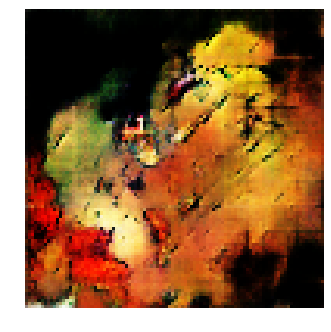


Epoch: 29140, D: -6.151, G: 4.053
Epoch: 29141, D: -5.393, G: 4.631
Epoch: 29142, D: -4.974, G: 3.773
Epoch: 29143, D: -5.446, G: 5.817
Epoch: 29144, D: -4.747, G: 3.507
Epoch: 29145, D: -6.814, G: 4.93
Epoch: 29146, D: -5.782, G: 4.465
Epoch: 29147, D: -6.232, G: 5.827
Epoch: 29148, D: -6.865, G: 5.463
Epoch: 29149, D: -5.175, G: 2.823
Epoch: 29150, D: -6.103, G: 3.691
Epoch: 29151, D: -5.048, G: 3.042
Epoch: 29152, D: -6.017, G: 3.129
Epoch: 29153, D: -5.168, G: 4.631
Epoch: 29154, D: -7.424, G: 3.678
Epoch: 29155, D: -6.588, G: 2.555
Epoch: 29156, D: -6.066, G: 4.734
Epoch: 29157, D: -5.92, G: 3.853
Epoch: 29158, D: -7.318, G: 5.126
Epoch: 29159, D: -6.637, G: 4.505


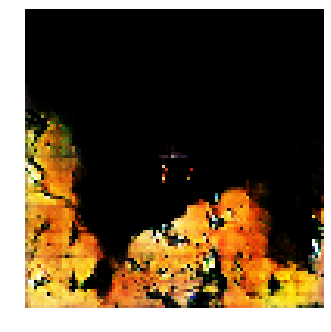


Epoch: 29160, D: -5.999, G: 0.5788
Epoch: 29161, D: -6.202, G: 2.234
Epoch: 29162, D: -7.107, G: 4.127
Epoch: 29163, D: -5.224, G: 5.597
Epoch: 29164, D: -6.114, G: 3.973
Epoch: 29165, D: -6.723, G: 4.73
Epoch: 29166, D: -5.684, G: 5.365
Epoch: 29167, D: -6.261, G: 5.012
Epoch: 29168, D: -4.901, G: 4.82
Epoch: 29169, D: -6.42, G: 4.898
Epoch: 29170, D: -6.432, G: 4.367
Epoch: 29171, D: -6.772, G: 3.807
Epoch: 29172, D: -5.904, G: 6.163
Epoch: 29173, D: -6.407, G: 4.364
Epoch: 29174, D: -5.952, G: 4.023
Epoch: 29175, D: -6.513, G: 3.205
Epoch: 29176, D: -6.381, G: 2.815
Epoch: 29177, D: -7.245, G: 4.723
Epoch: 29178, D: -5.145, G: 3.751
Epoch: 29179, D: -5.634, G: 3.939


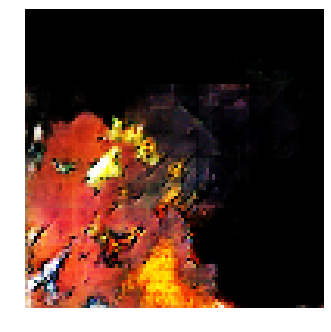


Epoch: 29180, D: -6.424, G: 3.94
Epoch: 29181, D: -4.932, G: 4.64
Epoch: 29182, D: -5.585, G: 2.078
Epoch: 29183, D: -5.745, G: 4.897
Epoch: 29184, D: -5.62, G: 2.084
Epoch: 29185, D: -6.643, G: 1.7
Epoch: 29186, D: -7.88, G: 4.065
Epoch: 29187, D: -5.473, G: 5.939
Epoch: 29188, D: -8.009, G: 3.741
Epoch: 29189, D: -5.264, G: 1.302
Epoch: 29190, D: -7.234, G: 3.319
Epoch: 29191, D: -5.615, G: 1.753
Epoch: 29192, D: -6.32, G: 3.574
Epoch: 29193, D: -4.682, G: 2.806
Epoch: 29194, D: -5.896, G: 5.696
Epoch: 29195, D: -5.825, G: 2.745
Epoch: 29196, D: -4.792, G: 5.068
Epoch: 29197, D: -5.942, G: 3.572
Epoch: 29198, D: -6.008, G: 3.585
Epoch: 29199, D: -5.92, G: 3.233


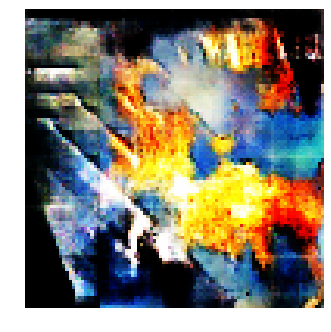


Epoch: 29200, D: -6.986, G: 4.66
Epoch: 29201, D: -6.723, G: 5.332
Epoch: 29202, D: -5.779, G: 4.05
Epoch: 29203, D: -4.736, G: 3.618
Epoch: 29204, D: -7.125, G: 3.965
Epoch: 29205, D: -5.0, G: 1.136
Epoch: 29206, D: -5.498, G: 3.282
Epoch: 29207, D: -6.398, G: 3.488
Epoch: 29208, D: -5.794, G: 3.576
Epoch: 29209, D: -5.846, G: 6.737
Epoch: 29210, D: -7.069, G: 3.569
Epoch: 29211, D: -4.636, G: 2.901
Epoch: 29212, D: -5.625, G: 4.187
Epoch: 29213, D: -6.385, G: 2.878
Epoch: 29214, D: -5.94, G: 4.034
Epoch: 29215, D: -6.761, G: 2.994
Epoch: 29216, D: -8.958, G: 3.118
Epoch: 29217, D: -5.962, G: 3.234
Epoch: 29218, D: -4.937, G: 4.742
Epoch: 29219, D: -5.454, G: 4.324


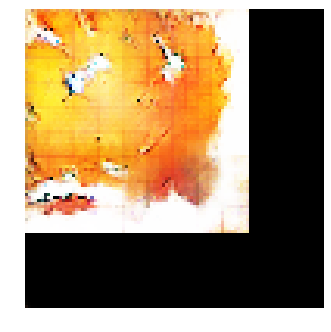


Epoch: 29220, D: -5.373, G: 4.682
Epoch: 29221, D: -4.726, G: 4.724
Epoch: 29222, D: -5.335, G: 5.229
Epoch: 29223, D: -5.815, G: 4.69
Epoch: 29224, D: -7.248, G: 3.889
Epoch: 29225, D: -4.183, G: 2.936
Epoch: 29226, D: -6.871, G: 3.283
Epoch: 29227, D: -8.504, G: 6.519
Epoch: 29228, D: -7.731, G: 5.296
Epoch: 29229, D: -6.504, G: 6.134
Epoch: 29230, D: -6.506, G: 5.6
Epoch: 29231, D: -7.326, G: 4.842
Epoch: 29232, D: -6.454, G: 4.65
Epoch: 29233, D: -6.436, G: 5.468
Epoch: 29234, D: -5.725, G: 3.789
Epoch: 29235, D: -6.279, G: 6.298
Epoch: 29236, D: -5.461, G: 4.586
Epoch: 29237, D: -5.817, G: 2.565
Epoch: 29238, D: -5.889, G: 6.182
Epoch: 29239, D: -6.306, G: 3.296


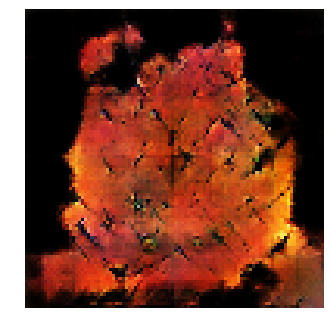


Epoch: 29240, D: -6.448, G: 6.235
Epoch: 29241, D: -5.873, G: 3.354
Epoch: 29242, D: -7.35, G: 6.155
Epoch: 29243, D: -5.406, G: 2.752
Epoch: 29244, D: -6.055, G: 5.53
Epoch: 29245, D: -8.272, G: 4.953
Epoch: 29246, D: -6.426, G: 4.686
Epoch: 29247, D: -5.693, G: 4.197
Epoch: 29248, D: -5.776, G: 4.074
Epoch: 29249, D: -5.774, G: 3.618
Epoch: 29250, D: -5.734, G: 5.629
Epoch: 29251, D: -6.539, G: 3.704
Epoch: 29252, D: -6.279, G: 2.684
Epoch: 29253, D: -5.69, G: 3.389
Epoch: 29254, D: -6.51, G: 4.303
Epoch: 29255, D: -3.829, G: 3.084
Epoch: 29256, D: -5.28, G: 3.421
Epoch: 29257, D: -4.835, G: 1.925
Epoch: 29258, D: -7.407, G: 4.859
Epoch: 29259, D: -6.721, G: 1.696


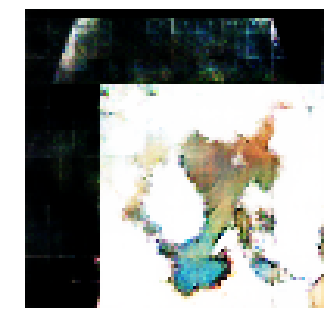


Epoch: 29260, D: -6.535, G: 4.077
Epoch: 29261, D: -5.775, G: 2.248
Epoch: 29262, D: -6.189, G: 2.081
Epoch: 29263, D: -7.169, G: 3.512
Epoch: 29264, D: -6.474, G: 3.037
Epoch: 29265, D: -7.028, G: 2.347
Epoch: 29266, D: -8.056, G: 4.013
Epoch: 29267, D: -5.799, G: 3.518
Epoch: 29268, D: -4.675, G: 3.062
Epoch: 29269, D: -5.235, G: 4.105
Epoch: 29270, D: -6.146, G: 1.687
Epoch: 29271, D: -5.937, G: 3.384
Epoch: 29272, D: -6.215, G: 2.576
Epoch: 29273, D: -5.825, G: 3.459
Epoch: 29274, D: -6.152, G: 2.373
Epoch: 29275, D: -7.427, G: 4.01
Epoch: 29276, D: -5.731, G: 3.384
Epoch: 29277, D: -5.556, G: 3.982
Epoch: 29278, D: -6.473, G: 1.951
Epoch: 29279, D: -8.819, G: 2.21


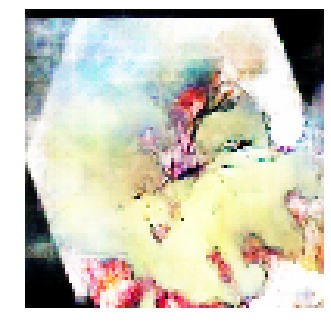


Epoch: 29280, D: -5.622, G: 1.828
Epoch: 29281, D: -6.187, G: 3.77
Epoch: 29282, D: -6.507, G: 2.104
Epoch: 29283, D: -5.989, G: 1.332
Epoch: 29284, D: -5.371, G: 3.21
Epoch: 29285, D: -4.221, G: 3.777
Epoch: 29286, D: -6.173, G: 5.489
Epoch: 29287, D: -6.033, G: 3.874
Epoch: 29288, D: -5.381, G: 2.868
Epoch: 29289, D: -6.601, G: 3.545
Epoch: 29290, D: -9.037, G: 2.475
Epoch: 29291, D: -6.567, G: 3.953
Epoch: 29292, D: -5.575, G: 3.186
Epoch: 29293, D: -6.445, G: 4.233
Epoch: 29294, D: -6.393, G: 3.949
Epoch: 29295, D: -6.896, G: 2.014
Epoch: 29296, D: -6.891, G: 1.349
Epoch: 29297, D: -6.048, G: 3.611
Epoch: 29298, D: -6.54, G: 4.065
Epoch: 29299, D: -6.456, G: 2.7


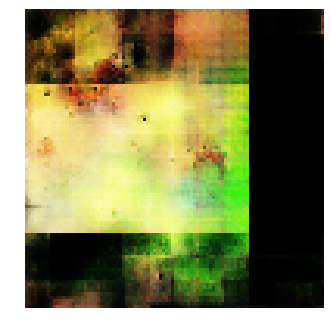


Epoch: 29300, D: -7.257, G: 5.266
Epoch: 29301, D: -5.888, G: 3.509
Epoch: 29302, D: -6.264, G: 4.635
Epoch: 29303, D: -5.712, G: 2.522
Epoch: 29304, D: -6.381, G: 3.919
Epoch: 29305, D: -5.431, G: 5.87
Epoch: 29306, D: -4.917, G: 4.97
Epoch: 29307, D: -5.552, G: 4.607
Epoch: 29308, D: -5.1, G: 5.56
Epoch: 29309, D: -5.504, G: 3.766
Epoch: 29310, D: -6.253, G: 3.197
Epoch: 29311, D: -6.461, G: 3.22
Epoch: 29312, D: -4.857, G: 3.554
Epoch: 29313, D: -6.067, G: 4.116
Epoch: 29314, D: -6.623, G: 5.124
Epoch: 29315, D: -5.795, G: 4.508
Epoch: 29316, D: -6.255, G: 3.726
Epoch: 29317, D: -7.55, G: 5.489
Epoch: 29318, D: -7.472, G: 1.099
Epoch: 29319, D: -6.021, G: 2.144


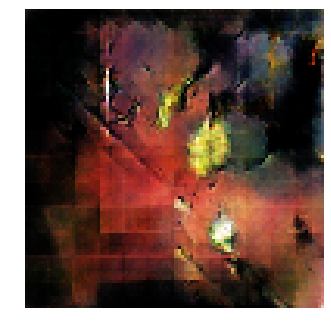


Epoch: 29320, D: -5.506, G: 2.431
Epoch: 29321, D: -5.251, G: 4.081
Epoch: 29322, D: -6.327, G: 2.543
Epoch: 29323, D: -6.561, G: 2.881
Epoch: 29324, D: -6.079, G: 3.118
Epoch: 29325, D: -5.442, G: 4.101
Epoch: 29326, D: -6.488, G: 4.191
Epoch: 29327, D: -6.025, G: 2.359
Epoch: 29328, D: -6.077, G: 2.525
Epoch: 29329, D: -6.114, G: 4.516
Epoch: 29330, D: -4.862, G: 4.076
Epoch: 29331, D: -5.949, G: 5.428
Epoch: 29332, D: -6.396, G: 4.886
Epoch: 29333, D: -6.783, G: 4.47
Epoch: 29334, D: -6.485, G: 3.223
Epoch: 29335, D: -6.387, G: 1.596
Epoch: 29336, D: -5.424, G: 2.228
Epoch: 29337, D: -6.395, G: 3.23
Epoch: 29338, D: -6.44, G: 3.741
Epoch: 29339, D: -6.63, G: 2.711


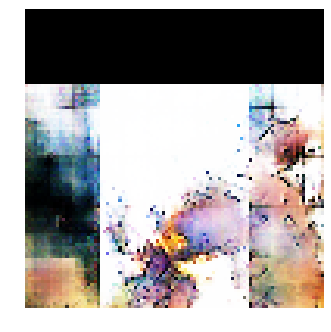


Epoch: 29340, D: -5.985, G: 4.865
Epoch: 29341, D: -5.998, G: 4.235
Epoch: 29342, D: -5.396, G: 3.358
Epoch: 29343, D: -6.506, G: 3.711
Epoch: 29344, D: -4.743, G: 2.205
Epoch: 29345, D: -5.443, G: 4.863
Epoch: 29346, D: -4.321, G: 4.722
Epoch: 29347, D: -6.678, G: 3.771
Epoch: 29348, D: -5.429, G: 3.185
Epoch: 29349, D: -7.537, G: 3.001
Epoch: 29350, D: -3.903, G: 3.158
Epoch: 29351, D: -4.023, G: 4.92
Epoch: 29352, D: -5.422, G: 4.803
Epoch: 29353, D: -6.22, G: 6.16
Epoch: 29354, D: -6.434, G: 6.008
Epoch: 29355, D: -7.448, G: 3.225
Epoch: 29356, D: -6.189, G: 3.517
Epoch: 29357, D: -5.185, G: 5.464
Epoch: 29358, D: -5.784, G: 2.738
Epoch: 29359, D: -7.034, G: 2.362


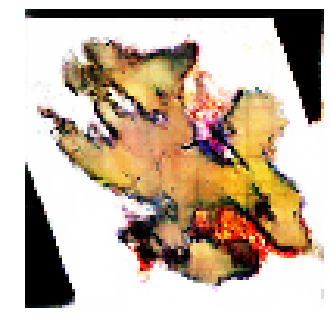


Epoch: 29360, D: -7.828, G: 3.341
Epoch: 29361, D: -5.532, G: 5.15
Epoch: 29362, D: -5.782, G: 3.439
Epoch: 29363, D: -5.598, G: 4.76
Epoch: 29364, D: -6.504, G: 3.705
Epoch: 29365, D: -7.133, G: 3.813
Epoch: 29366, D: -6.429, G: 5.501
Epoch: 29367, D: -6.592, G: 4.645
Epoch: 29368, D: -6.234, G: 4.483
Epoch: 29369, D: -5.084, G: 3.514
Epoch: 29370, D: -4.944, G: 4.98
Epoch: 29371, D: -6.514, G: 5.023
Epoch: 29372, D: -4.956, G: 5.936
Epoch: 29373, D: -6.637, G: 4.684
Epoch: 29374, D: -5.551, G: 5.187
Epoch: 29375, D: -5.626, G: 5.828
Epoch: 29376, D: -7.362, G: 2.732
Epoch: 29377, D: -7.018, G: 4.798
Epoch: 29378, D: -5.445, G: 4.33
Epoch: 29379, D: -7.356, G: 2.474


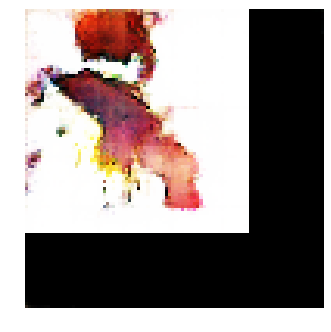


Epoch: 29380, D: -6.162, G: 4.178
Epoch: 29381, D: -4.74, G: 3.625
Epoch: 29382, D: -4.929, G: 3.249
Epoch: 29383, D: -7.008, G: 3.069
Epoch: 29384, D: -6.22, G: 1.873
Epoch: 29385, D: -7.715, G: 4.029
Epoch: 29386, D: -6.794, G: 2.895
Epoch: 29387, D: -7.49, G: 3.74
Epoch: 29388, D: -4.231, G: 4.552
Epoch: 29389, D: -5.279, G: 5.174
Epoch: 29390, D: -4.382, G: 2.787
Epoch: 29391, D: -5.533, G: 4.723
Epoch: 29392, D: -6.519, G: 4.891
Epoch: 29393, D: -7.065, G: 4.765
Epoch: 29394, D: -6.528, G: 3.036
Epoch: 29395, D: -7.77, G: 3.322
Epoch: 29396, D: -6.119, G: 2.201
Epoch: 29397, D: -5.382, G: 6.002
Epoch: 29398, D: -6.231, G: 4.57
Epoch: 29399, D: -6.114, G: 3.856


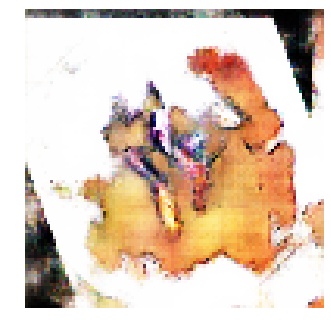


Epoch: 29400, D: -6.248, G: 4.758
Epoch: 29401, D: -5.253, G: 3.917
Epoch: 29402, D: -6.346, G: 4.215
Epoch: 29403, D: -6.838, G: 3.62
Epoch: 29404, D: -5.723, G: 5.408
Epoch: 29405, D: -5.846, G: 3.939
Epoch: 29406, D: -7.629, G: 3.515
Epoch: 29407, D: -6.679, G: 3.766
Epoch: 29408, D: -6.812, G: 2.334
Epoch: 29409, D: -5.699, G: 3.033
Epoch: 29410, D: -7.324, G: 4.372
Epoch: 29411, D: -5.962, G: 1.876
Epoch: 29412, D: -6.528, G: 2.979
Epoch: 29413, D: -7.319, G: 3.636
Epoch: 29414, D: -7.023, G: 2.812
Epoch: 29415, D: -6.209, G: 3.617
Epoch: 29416, D: -5.887, G: 4.298
Epoch: 29417, D: -3.827, G: 3.008
Epoch: 29418, D: -6.9, G: 4.631
Epoch: 29419, D: -7.121, G: 3.409


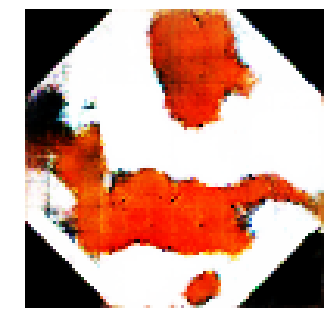


Epoch: 29420, D: -6.009, G: 4.019
Epoch: 29421, D: -4.572, G: 3.662
Epoch: 29422, D: -6.593, G: 3.467
Epoch: 29423, D: -5.515, G: 4.192
Epoch: 29424, D: -6.052, G: 4.72
Epoch: 29425, D: -6.511, G: 4.853
Epoch: 29426, D: -8.34, G: 2.997
Epoch: 29427, D: -6.176, G: 3.404
Epoch: 29428, D: -6.344, G: 5.636
Epoch: 29429, D: -7.386, G: 6.171
Epoch: 29430, D: -5.906, G: 6.95
Epoch: 29431, D: -6.916, G: 5.015
Epoch: 29432, D: -5.44, G: 4.811
Epoch: 29433, D: -5.851, G: 4.502
Epoch: 29434, D: -6.416, G: 5.29
Epoch: 29435, D: -5.57, G: 5.195
Epoch: 29436, D: -5.593, G: 3.377
Epoch: 29437, D: -5.479, G: 3.855
Epoch: 29438, D: -4.737, G: 4.156
Epoch: 29439, D: -5.828, G: 4.427


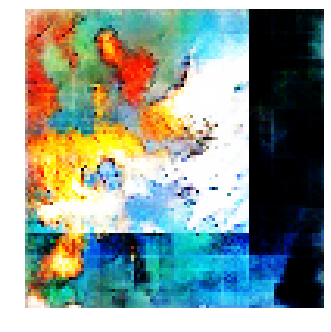


Epoch: 29440, D: -5.41, G: 4.123
Epoch: 29441, D: -6.039, G: 3.266
Epoch: 29442, D: -6.208, G: 5.715
Epoch: 29443, D: -5.74, G: 4.881
Epoch: 29444, D: -5.898, G: 4.519
Epoch: 29445, D: -4.952, G: 3.44
Epoch: 29446, D: -5.592, G: 4.219
Epoch: 29447, D: -7.563, G: 4.062
Epoch: 29448, D: -6.791, G: 4.348
Epoch: 29449, D: -5.972, G: 4.764
Epoch: 29450, D: -4.378, G: 4.556
Epoch: 29451, D: -6.311, G: 3.699
Epoch: 29452, D: -6.719, G: 5.643
Epoch: 29453, D: -4.975, G: 2.102
Epoch: 29454, D: -5.403, G: 1.666
Epoch: 29455, D: -5.82, G: 4.338
Epoch: 29456, D: -6.772, G: 0.6149
Epoch: 29457, D: -4.678, G: 1.357
Epoch: 29458, D: -5.801, G: 2.47
Epoch: 29459, D: -7.241, G: 3.955


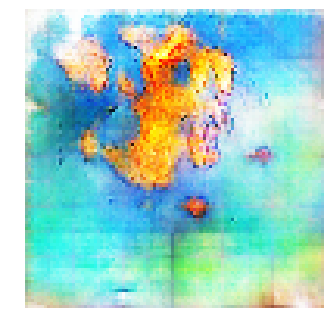


Epoch: 29460, D: -7.011, G: 3.871
Epoch: 29461, D: -6.294, G: 2.462
Epoch: 29462, D: -6.715, G: 2.82
Epoch: 29463, D: -5.985, G: 5.012
Epoch: 29464, D: -5.482, G: 4.767
Epoch: 29465, D: -6.813, G: 3.099
Epoch: 29466, D: -6.657, G: 4.406
Epoch: 29467, D: -5.267, G: 3.045
Epoch: 29468, D: -4.785, G: 2.922
Epoch: 29469, D: -8.393, G: 4.366
Epoch: 29470, D: -7.009, G: 2.767
Epoch: 29471, D: -4.898, G: 3.151
Epoch: 29472, D: -5.835, G: 4.321
Epoch: 29473, D: -6.067, G: 4.209
Epoch: 29474, D: -6.041, G: 6.034
Epoch: 29475, D: -5.922, G: 4.075
Epoch: 29476, D: -6.065, G: 3.107
Epoch: 29477, D: -6.514, G: 6.017
Epoch: 29478, D: -7.355, G: 2.539
Epoch: 29479, D: -6.134, G: 1.881


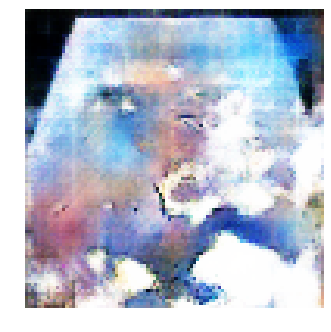


Epoch: 29480, D: -6.053, G: 3.33
Epoch: 29481, D: -5.7, G: 3.357
Epoch: 29482, D: -6.052, G: 3.748
Epoch: 29483, D: -5.294, G: 1.795
Epoch: 29484, D: -6.67, G: 4.758
Epoch: 29485, D: -5.687, G: 3.905
Epoch: 29486, D: -6.484, G: 4.558
Epoch: 29487, D: -4.465, G: 1.707
Epoch: 29488, D: -5.344, G: 3.734
Epoch: 29489, D: -5.203, G: 1.432
Epoch: 29490, D: -3.965, G: 5.186
Epoch: 29491, D: -4.815, G: 5.567
Epoch: 29492, D: -5.712, G: 3.799
Epoch: 29493, D: -6.379, G: 2.505
Epoch: 29494, D: -5.675, G: 5.047
Epoch: 29495, D: -4.319, G: 4.805
Epoch: 29496, D: -6.956, G: 3.625
Epoch: 29497, D: -5.837, G: 3.867
Epoch: 29498, D: -7.281, G: 2.266
Epoch: 29499, D: -6.185, G: 3.064


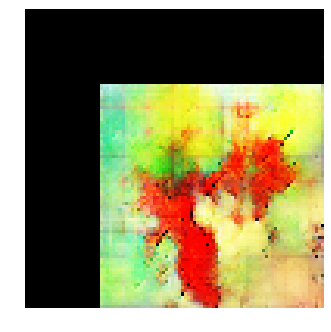


Epoch: 29500, D: -6.233, G: 3.897
Epoch: 29501, D: -5.612, G: 1.912
Epoch: 29502, D: -4.535, G: 4.161
Epoch: 29503, D: -6.267, G: 3.346
Epoch: 29504, D: -4.943, G: 3.354
Epoch: 29505, D: -6.129, G: 2.223
Epoch: 29506, D: -5.887, G: 4.442
Epoch: 29507, D: -5.447, G: 3.284
Epoch: 29508, D: -6.444, G: 5.193
Epoch: 29509, D: -5.317, G: 5.099
Epoch: 29510, D: -6.598, G: 4.493
Epoch: 29511, D: -6.723, G: 2.011
Epoch: 29512, D: -5.238, G: 3.241
Epoch: 29513, D: -6.992, G: 3.914
Epoch: 29514, D: -4.805, G: 5.332
Epoch: 29515, D: -6.589, G: 4.737
Epoch: 29516, D: -6.542, G: 5.076
Epoch: 29517, D: -6.875, G: 5.073
Epoch: 29518, D: -6.023, G: 3.893
Epoch: 29519, D: -5.303, G: 3.406


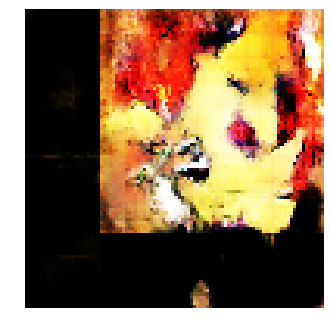


Epoch: 29520, D: -5.861, G: 4.483
Epoch: 29521, D: -6.135, G: 3.361
Epoch: 29522, D: -5.305, G: 2.677
Epoch: 29523, D: -5.81, G: 3.495
Epoch: 29524, D: -6.177, G: 3.28
Epoch: 29525, D: -5.881, G: 2.531
Epoch: 29526, D: -5.517, G: 1.58
Epoch: 29527, D: -5.985, G: 3.945
Epoch: 29528, D: -5.982, G: 4.196
Epoch: 29529, D: -6.095, G: 4.111
Epoch: 29530, D: -5.603, G: 2.425
Epoch: 29531, D: -5.893, G: 3.503
Epoch: 29532, D: -6.414, G: 0.4909
Epoch: 29533, D: -6.823, G: 3.135
Epoch: 29534, D: -5.599, G: 4.9
Epoch: 29535, D: -4.925, G: 5.012
Epoch: 29536, D: -7.266, G: 4.896
Epoch: 29537, D: -6.646, G: 0.9705
Epoch: 29538, D: -5.784, G: 3.19
Epoch: 29539, D: -6.125, G: 2.958


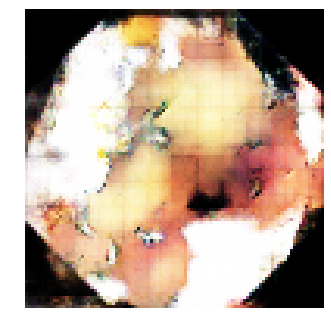


Epoch: 29540, D: -5.708, G: 4.003
Epoch: 29541, D: -5.827, G: 5.304
Epoch: 29542, D: -6.862, G: 3.669
Epoch: 29543, D: -5.664, G: 2.966
Epoch: 29544, D: -5.388, G: 4.959
Epoch: 29545, D: -6.17, G: 5.745
Epoch: 29546, D: -7.319, G: 3.166
Epoch: 29547, D: -7.928, G: 5.376
Epoch: 29548, D: -6.351, G: 2.973
Epoch: 29549, D: -6.31, G: 5.571
Epoch: 29550, D: -6.854, G: 4.632
Epoch: 29551, D: -5.058, G: 4.504
Epoch: 29552, D: -5.964, G: 4.698
Epoch: 29553, D: -6.063, G: 4.261
Epoch: 29554, D: -7.405, G: 3.298
Epoch: 29555, D: -6.132, G: 4.571
Epoch: 29556, D: -6.233, G: 5.953
Epoch: 29557, D: -5.22, G: 3.373
Epoch: 29558, D: -6.721, G: 5.86
Epoch: 29559, D: -6.96, G: 4.939


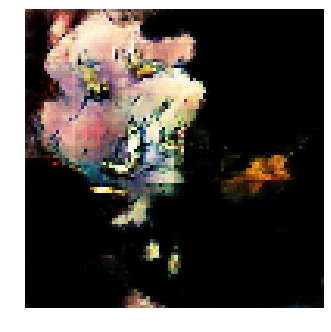


Epoch: 29560, D: -6.339, G: 3.535
Epoch: 29561, D: -6.048, G: 3.572
Epoch: 29562, D: -6.278, G: 3.923
Epoch: 29563, D: -4.801, G: 5.363
Epoch: 29564, D: -6.127, G: 3.722
Epoch: 29565, D: -6.967, G: 2.449
Epoch: 29566, D: -5.426, G: 3.369
Epoch: 29567, D: -4.603, G: 5.355
Epoch: 29568, D: -5.266, G: 6.09
Epoch: 29569, D: -6.884, G: 4.944
Epoch: 29570, D: -4.912, G: 4.403
Epoch: 29571, D: -5.745, G: 3.723
Epoch: 29572, D: -6.951, G: 3.583
Epoch: 29573, D: -5.538, G: 2.117
Epoch: 29574, D: -5.831, G: 5.137
Epoch: 29575, D: -6.429, G: 4.171
Epoch: 29576, D: -6.305, G: 2.5
Epoch: 29577, D: -7.107, G: 4.641
Epoch: 29578, D: -5.772, G: 3.593
Epoch: 29579, D: -6.358, G: 4.079


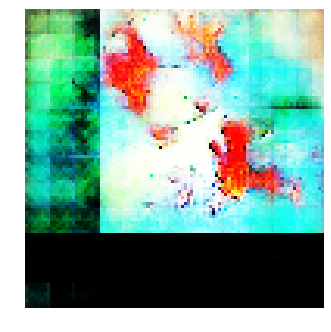


Epoch: 29580, D: -6.536, G: 4.143
Epoch: 29581, D: -5.364, G: 3.771
Epoch: 29582, D: -6.064, G: 5.292
Epoch: 29583, D: -5.904, G: 3.907
Epoch: 29584, D: -7.871, G: 3.31
Epoch: 29585, D: -6.133, G: 4.362
Epoch: 29586, D: -5.435, G: 3.614
Epoch: 29587, D: -6.064, G: 3.827
Epoch: 29588, D: -6.884, G: 2.216
Epoch: 29589, D: -7.028, G: 2.241
Epoch: 29590, D: -6.806, G: 3.082
Epoch: 29591, D: -5.159, G: 4.465
Epoch: 29592, D: -6.067, G: 5.005
Epoch: 29593, D: -5.755, G: 3.596
Epoch: 29594, D: -5.236, G: 5.155
Epoch: 29595, D: -5.259, G: 3.366
Epoch: 29596, D: -5.423, G: 3.191
Epoch: 29597, D: -5.556, G: 3.269
Epoch: 29598, D: -6.363, G: 3.397
Epoch: 29599, D: -6.218, G: 4.821


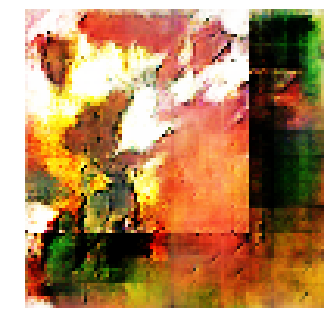


Epoch: 29600, D: -6.041, G: 2.541
Epoch: 29601, D: -6.644, G: 2.938
Epoch: 29602, D: -7.144, G: 4.298
Epoch: 29603, D: -4.887, G: 3.434
Epoch: 29604, D: -8.2, G: 3.472
Epoch: 29605, D: -6.469, G: 3.359
Epoch: 29606, D: -7.091, G: 3.973
Epoch: 29607, D: -5.816, G: 3.123
Epoch: 29608, D: -5.627, G: 3.993
Epoch: 29609, D: -5.421, G: 3.822
Epoch: 29610, D: -5.285, G: 3.173
Epoch: 29611, D: -6.52, G: 3.924
Epoch: 29612, D: -6.32, G: 4.021
Epoch: 29613, D: -7.39, G: 2.253
Epoch: 29614, D: -5.827, G: 3.928
Epoch: 29615, D: -6.053, G: 4.982
Epoch: 29616, D: -7.297, G: 4.47
Epoch: 29617, D: -6.686, G: 4.259
Epoch: 29618, D: -6.727, G: 3.057
Epoch: 29619, D: -6.639, G: 4.621


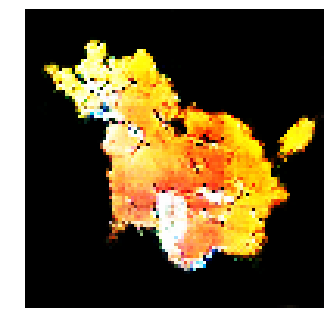


Epoch: 29620, D: -5.758, G: 6.233
Epoch: 29621, D: -5.671, G: 5.312
Epoch: 29622, D: -6.655, G: 3.919
Epoch: 29623, D: -6.471, G: 4.338
Epoch: 29624, D: -5.354, G: 6.059
Epoch: 29625, D: -7.243, G: 5.06
Epoch: 29626, D: -7.058, G: 4.959
Epoch: 29627, D: -6.012, G: 5.616
Epoch: 29628, D: -6.309, G: 5.464
Epoch: 29629, D: -5.374, G: 3.81
Epoch: 29630, D: -7.533, G: 4.051
Epoch: 29631, D: -6.122, G: 4.15
Epoch: 29632, D: -6.525, G: 4.521
Epoch: 29633, D: -6.612, G: 5.47
Epoch: 29634, D: -5.002, G: 3.734
Epoch: 29635, D: -6.332, G: 3.557
Epoch: 29636, D: -6.718, G: 1.387
Epoch: 29637, D: -4.955, G: 4.022
Epoch: 29638, D: -6.119, G: 4.207
Epoch: 29639, D: -4.144, G: 3.823


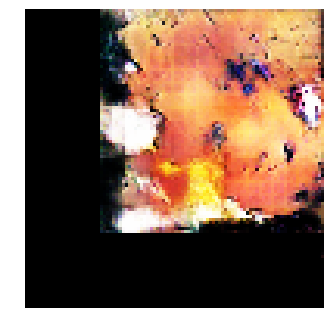


Epoch: 29640, D: -5.59, G: 4.876
Epoch: 29641, D: -6.267, G: 5.717
Epoch: 29642, D: -6.492, G: 4.018
Epoch: 29643, D: -5.597, G: 3.725
Epoch: 29644, D: -6.145, G: 4.716
Epoch: 29645, D: -7.149, G: 2.362
Epoch: 29646, D: -6.567, G: 3.839
Epoch: 29647, D: -6.623, G: 4.44
Epoch: 29648, D: -6.194, G: 3.239
Epoch: 29649, D: -5.529, G: 3.448
Epoch: 29650, D: -5.158, G: 3.223
Epoch: 29651, D: -6.025, G: 3.725
Epoch: 29652, D: -6.205, G: 3.323
Epoch: 29653, D: -6.059, G: 4.261
Epoch: 29654, D: -6.699, G: 5.009
Epoch: 29655, D: -7.125, G: 4.667
Epoch: 29656, D: -6.085, G: 4.602
Epoch: 29657, D: -6.954, G: 4.036
Epoch: 29658, D: -6.845, G: 3.029
Epoch: 29659, D: -6.141, G: 2.368


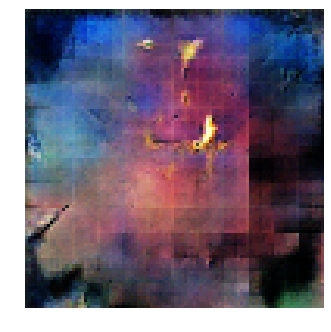


Epoch: 29660, D: -5.87, G: 3.954
Epoch: 29661, D: -5.391, G: 3.069
Epoch: 29662, D: -5.255, G: 6.982
Epoch: 29663, D: -7.543, G: 3.729
Epoch: 29664, D: -5.18, G: 2.23
Epoch: 29665, D: -5.925, G: 4.12
Epoch: 29666, D: -7.273, G: 4.336
Epoch: 29667, D: -5.867, G: 6.014
Epoch: 29668, D: -5.127, G: 4.332
Epoch: 29669, D: -6.922, G: 5.343
Epoch: 29670, D: -6.918, G: 3.041
Epoch: 29671, D: -6.143, G: 3.168
Epoch: 29672, D: -7.139, G: 2.775
Epoch: 29673, D: -6.864, G: 4.86
Epoch: 29674, D: -5.779, G: 3.687
Epoch: 29675, D: -6.01, G: 5.553
Epoch: 29676, D: -6.199, G: 5.386
Epoch: 29677, D: -5.022, G: 3.644
Epoch: 29678, D: -6.699, G: 3.05
Epoch: 29679, D: -6.606, G: 2.968


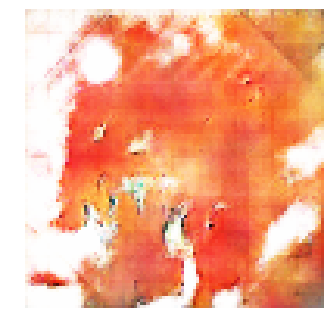


Epoch: 29680, D: -5.63, G: 2.723
Epoch: 29681, D: -6.375, G: 4.128
Epoch: 29682, D: -5.759, G: 3.892
Epoch: 29683, D: -5.926, G: 2.941
Epoch: 29684, D: -5.528, G: 3.892
Epoch: 29685, D: -8.136, G: 5.327
Epoch: 29686, D: -5.372, G: 3.361
Epoch: 29687, D: -7.53, G: 3.739
Epoch: 29688, D: -6.518, G: 1.734
Epoch: 29689, D: -6.655, G: 3.362
Epoch: 29690, D: -8.048, G: 2.152
Epoch: 29691, D: -5.635, G: 2.984
Epoch: 29692, D: -5.973, G: 4.148
Epoch: 29693, D: -5.982, G: 3.921
Epoch: 29694, D: -5.901, G: 4.873
Epoch: 29695, D: -5.632, G: 3.786
Epoch: 29696, D: -6.373, G: 3.561
Epoch: 29697, D: -6.894, G: 3.377
Epoch: 29698, D: -7.669, G: 4.549
Epoch: 29699, D: -6.19, G: 4.063


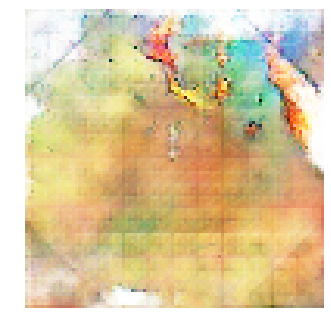


Epoch: 29700, D: -5.598, G: 5.959
Epoch: 29701, D: -5.59, G: 4.692
Epoch: 29702, D: -5.227, G: 4.585
Epoch: 29703, D: -5.605, G: 5.331
Epoch: 29704, D: -7.53, G: 4.508
Epoch: 29705, D: -6.679, G: 3.635
Epoch: 29706, D: -7.209, G: 2.556
Epoch: 29707, D: -6.309, G: 4.048
Epoch: 29708, D: -7.052, G: 6.665
Epoch: 29709, D: -5.453, G: 6.182
Epoch: 29710, D: -5.396, G: 3.17
Epoch: 29711, D: -7.059, G: 3.332
Epoch: 29712, D: -5.664, G: 4.333
Epoch: 29713, D: -5.778, G: 4.363
Epoch: 29714, D: -7.164, G: 4.585
Epoch: 29715, D: -6.025, G: 2.987
Epoch: 29716, D: -6.168, G: 2.46
Epoch: 29717, D: -6.052, G: 3.02
Epoch: 29718, D: -5.721, G: 4.492
Epoch: 29719, D: -5.362, G: 1.631


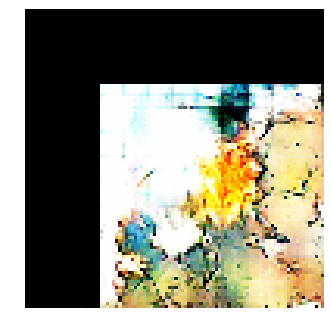


Epoch: 29720, D: -6.149, G: 2.257
Epoch: 29721, D: -5.934, G: 3.285
Epoch: 29722, D: -5.751, G: 5.184
Epoch: 29723, D: -5.587, G: 5.108
Epoch: 29724, D: -6.797, G: 3.441
Epoch: 29725, D: -4.967, G: 4.021
Epoch: 29726, D: -4.926, G: 4.003
Epoch: 29727, D: -7.014, G: 2.67
Epoch: 29728, D: -5.775, G: 2.797
Epoch: 29729, D: -6.494, G: 2.992
Epoch: 29730, D: -6.395, G: 3.304
Epoch: 29731, D: -6.651, G: 4.235
Epoch: 29732, D: -4.977, G: 4.622
Epoch: 29733, D: -4.971, G: 4.075
Epoch: 29734, D: -5.22, G: 2.49
Epoch: 29735, D: -6.681, G: 4.207
Epoch: 29736, D: -5.084, G: 2.224
Epoch: 29737, D: -6.928, G: 5.812
Epoch: 29738, D: -4.751, G: 5.107
Epoch: 29739, D: -5.007, G: 3.934


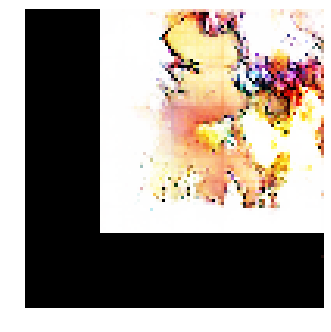


Epoch: 29740, D: -6.165, G: 4.213
Epoch: 29741, D: -5.405, G: 4.16
Epoch: 29742, D: -5.543, G: 3.803
Epoch: 29743, D: -5.646, G: 4.383
Epoch: 29744, D: -6.009, G: 5.08
Epoch: 29745, D: -4.212, G: 2.611
Epoch: 29746, D: -5.406, G: 3.711
Epoch: 29747, D: -6.421, G: 3.981
Epoch: 29748, D: -7.656, G: 4.166
Epoch: 29749, D: -7.124, G: 4.881
Epoch: 29750, D: -6.284, G: 3.181
Epoch: 29751, D: -5.969, G: 3.776
Epoch: 29752, D: -5.731, G: 2.89
Epoch: 29753, D: -6.385, G: 3.743
Epoch: 29754, D: -6.176, G: 2.356
Epoch: 29755, D: -5.728, G: 2.241
Epoch: 29756, D: -6.221, G: 4.105
Epoch: 29757, D: -5.274, G: 3.44
Epoch: 29758, D: -6.772, G: 2.878
Epoch: 29759, D: -5.894, G: 2.304


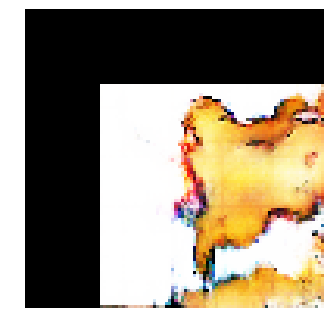


Epoch: 29760, D: -6.129, G: 3.828
Epoch: 29761, D: -5.482, G: 3.492
Epoch: 29762, D: -7.404, G: 5.644
Epoch: 29763, D: -5.465, G: 2.97
Epoch: 29764, D: -5.432, G: 4.828
Epoch: 29765, D: -6.447, G: 3.431
Epoch: 29766, D: -7.369, G: 4.548
Epoch: 29767, D: -5.265, G: 2.468
Epoch: 29768, D: -7.777, G: 4.761
Epoch: 29769, D: -5.836, G: 2.007
Epoch: 29770, D: -5.936, G: 2.388
Epoch: 29771, D: -6.43, G: 4.231
Epoch: 29772, D: -8.305, G: 3.272
Epoch: 29773, D: -6.114, G: 3.45
Epoch: 29774, D: -6.45, G: 2.828
Epoch: 29775, D: -6.279, G: 4.416
Epoch: 29776, D: -6.896, G: 3.911
Epoch: 29777, D: -6.2, G: 3.586
Epoch: 29778, D: -5.019, G: 4.261
Epoch: 29779, D: -6.374, G: 3.517


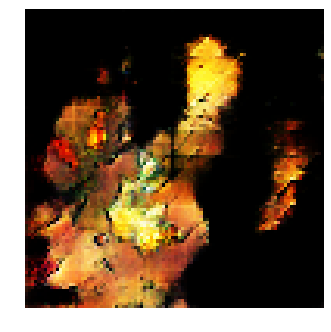


Epoch: 29780, D: -5.5, G: 4.476
Epoch: 29781, D: -6.094, G: 3.378
Epoch: 29782, D: -5.492, G: 4.098
Epoch: 29783, D: -6.528, G: 4.847
Epoch: 29784, D: -5.28, G: 5.102
Epoch: 29785, D: -5.76, G: 5.874
Epoch: 29786, D: -6.146, G: 4.352
Epoch: 29787, D: -7.542, G: 4.379
Epoch: 29788, D: -6.258, G: 4.558
Epoch: 29789, D: -6.517, G: 3.821
Epoch: 29790, D: -4.967, G: 4.244
Epoch: 29791, D: -6.216, G: 4.43
Epoch: 29792, D: -7.539, G: 3.962
Epoch: 29793, D: -5.319, G: 3.557
Epoch: 29794, D: -5.109, G: 4.445
Epoch: 29795, D: -6.615, G: 2.176
Epoch: 29796, D: -6.122, G: 4.539
Epoch: 29797, D: -6.8, G: 3.591
Epoch: 29798, D: -5.731, G: 2.605
Epoch: 29799, D: -6.586, G: 3.641


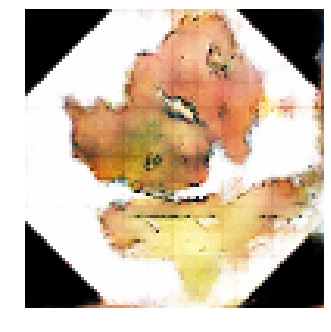


Epoch: 29800, D: -5.138, G: 3.589
Epoch: 29801, D: -5.192, G: 3.848
Epoch: 29802, D: -7.015, G: 5.416
Epoch: 29803, D: -6.538, G: 3.446
Epoch: 29804, D: -6.533, G: 1.792
Epoch: 29805, D: -4.661, G: 6.433
Epoch: 29806, D: -5.969, G: 5.166
Epoch: 29807, D: -6.524, G: 3.479
Epoch: 29808, D: -6.363, G: 3.808
Epoch: 29809, D: -7.189, G: 2.947
Epoch: 29810, D: -4.797, G: 4.08
Epoch: 29811, D: -5.852, G: 3.31
Epoch: 29812, D: -6.362, G: 4.33
Epoch: 29813, D: -6.656, G: 4.19
Epoch: 29814, D: -6.326, G: 3.632
Epoch: 29815, D: -5.555, G: 4.008
Epoch: 29816, D: -5.324, G: 3.53
Epoch: 29817, D: -6.687, G: 4.757
Epoch: 29818, D: -6.368, G: 1.285
Epoch: 29819, D: -7.204, G: 1.125


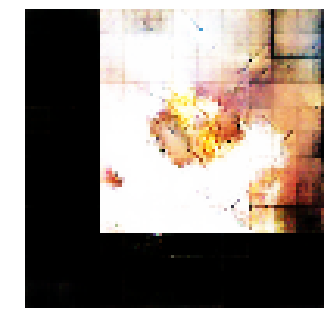


Epoch: 29820, D: -7.846, G: 3.744
Epoch: 29821, D: -5.824, G: 4.954
Epoch: 29822, D: -5.269, G: 3.305
Epoch: 29823, D: -6.402, G: 4.916
Epoch: 29824, D: -7.822, G: 4.889
Epoch: 29825, D: -5.612, G: 2.213
Epoch: 29826, D: -5.562, G: 5.81
Epoch: 29827, D: -5.989, G: 4.142
Epoch: 29828, D: -5.588, G: 4.837
Epoch: 29829, D: -6.379, G: 2.751
Epoch: 29830, D: -6.703, G: 5.062
Epoch: 29831, D: -5.4, G: 3.014
Epoch: 29832, D: -7.379, G: 4.163
Epoch: 29833, D: -6.814, G: 4.191
Epoch: 29834, D: -4.959, G: 1.645
Epoch: 29835, D: -5.441, G: 4.357
Epoch: 29836, D: -4.239, G: 3.601
Epoch: 29837, D: -8.076, G: 3.468
Epoch: 29838, D: -6.098, G: 3.249
Epoch: 29839, D: -4.44, G: 4.935


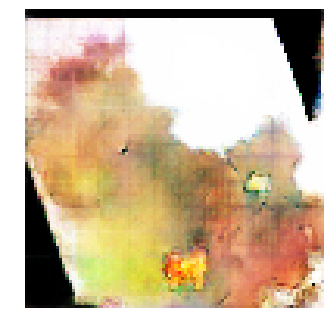


Epoch: 29840, D: -6.862, G: 4.232
Epoch: 29841, D: -5.823, G: 3.753
Epoch: 29842, D: -8.138, G: 2.903
Epoch: 29843, D: -6.654, G: 4.376
Epoch: 29844, D: -5.829, G: 7.402
Epoch: 29845, D: -6.743, G: 5.101
Epoch: 29846, D: -5.889, G: 3.236
Epoch: 29847, D: -5.888, G: 2.826
Epoch: 29848, D: -5.528, G: 3.987
Epoch: 29849, D: -5.489, G: 6.688
Epoch: 29850, D: -5.662, G: 3.474
Epoch: 29851, D: -8.385, G: 1.93
Epoch: 29852, D: -6.35, G: 3.28
Epoch: 29853, D: -5.63, G: 3.176
Epoch: 29854, D: -4.607, G: 1.51
Epoch: 29855, D: -5.388, G: 4.801
Epoch: 29856, D: -5.844, G: 4.019
Epoch: 29857, D: -5.907, G: 4.528
Epoch: 29858, D: -4.899, G: 4.76
Epoch: 29859, D: -7.924, G: 3.874


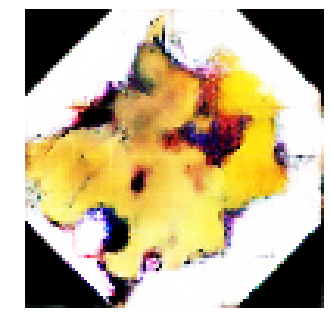


Epoch: 29860, D: -6.775, G: 5.373
Epoch: 29861, D: -6.356, G: 3.953
Epoch: 29862, D: -7.097, G: 4.51
Epoch: 29863, D: -4.849, G: 4.757
Epoch: 29864, D: -5.716, G: 5.015
Epoch: 29865, D: -5.159, G: 3.057
Epoch: 29866, D: -5.309, G: 4.34
Epoch: 29867, D: -5.605, G: 5.602
Epoch: 29868, D: -7.233, G: 3.303
Epoch: 29869, D: -4.403, G: 1.918
Epoch: 29870, D: -5.6, G: 3.209
Epoch: 29871, D: -6.785, G: 3.643
Epoch: 29872, D: -8.128, G: 4.913
Epoch: 29873, D: -6.361, G: 3.102
Epoch: 29874, D: -5.969, G: 2.948
Epoch: 29875, D: -7.544, G: 3.299
Epoch: 29876, D: -5.899, G: 2.993
Epoch: 29877, D: -5.586, G: 4.052
Epoch: 29878, D: -5.848, G: 4.934
Epoch: 29879, D: -6.719, G: 2.217


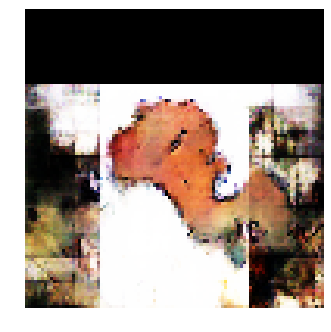


Epoch: 29880, D: -3.36, G: 4.575
Epoch: 29881, D: -5.357, G: 3.754
Epoch: 29882, D: -6.821, G: 2.786
Epoch: 29883, D: -6.276, G: 3.507
Epoch: 29884, D: -6.565, G: 1.965
Epoch: 29885, D: -5.419, G: 2.436
Epoch: 29886, D: -5.506, G: 6.25
Epoch: 29887, D: -6.958, G: 2.964
Epoch: 29888, D: -6.357, G: 3.284
Epoch: 29889, D: -6.694, G: 4.838
Epoch: 29890, D: -6.669, G: 3.038
Epoch: 29891, D: -5.2, G: 6.251
Epoch: 29892, D: -5.966, G: 5.536
Epoch: 29893, D: -5.317, G: 3.81
Epoch: 29894, D: -5.733, G: 4.282
Epoch: 29895, D: -4.999, G: 4.508
Epoch: 29896, D: -6.078, G: 3.502
Epoch: 29897, D: -5.67, G: 4.962
Epoch: 29898, D: -5.811, G: 4.268
Epoch: 29899, D: -5.572, G: 1.683


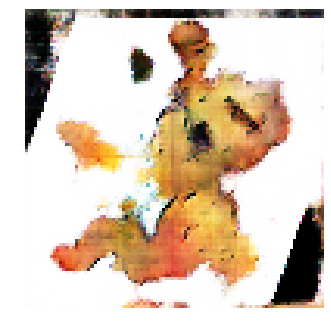


Epoch: 29900, D: -6.672, G: 4.391
Epoch: 29901, D: -6.97, G: 0.8649
Epoch: 29902, D: -5.578, G: 2.814
Epoch: 29903, D: -6.603, G: 3.591
Epoch: 29904, D: -5.275, G: 3.219
Epoch: 29905, D: -6.56, G: 3.554
Epoch: 29906, D: -5.01, G: 3.789
Epoch: 29907, D: -5.768, G: 3.218
Epoch: 29908, D: -6.618, G: 4.68
Epoch: 29909, D: -5.26, G: 2.619
Epoch: 29910, D: -5.804, G: 4.244
Epoch: 29911, D: -7.565, G: 4.669
Epoch: 29912, D: -5.707, G: 3.448
Epoch: 29913, D: -5.633, G: 5.213
Epoch: 29914, D: -6.908, G: 4.669
Epoch: 29915, D: -5.77, G: 3.517
Epoch: 29916, D: -5.978, G: 7.27
Epoch: 29917, D: -6.082, G: 5.093
Epoch: 29918, D: -5.6, G: 5.061
Epoch: 29919, D: -7.084, G: 5.474


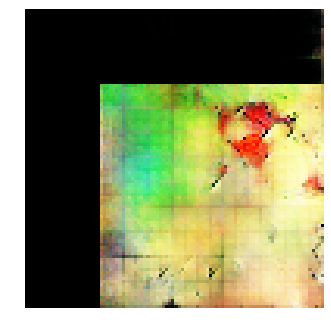


Epoch: 29920, D: -7.068, G: 5.398
Epoch: 29921, D: -7.064, G: 6.276
Epoch: 29922, D: -6.525, G: 4.807
Epoch: 29923, D: -5.065, G: 4.646
Epoch: 29924, D: -6.215, G: 3.686
Epoch: 29925, D: -6.476, G: 5.459
Epoch: 29926, D: -7.129, G: 3.594
Epoch: 29927, D: -5.362, G: 3.844
Epoch: 29928, D: -4.614, G: 4.392
Epoch: 29929, D: -6.557, G: 3.927
Epoch: 29930, D: -6.026, G: 4.588
Epoch: 29931, D: -6.859, G: 3.875
Epoch: 29932, D: -5.943, G: 3.878
Epoch: 29933, D: -6.591, G: 5.053
Epoch: 29934, D: -5.797, G: 4.902
Epoch: 29935, D: -4.769, G: 2.448
Epoch: 29936, D: -6.33, G: 3.61
Epoch: 29937, D: -5.507, G: 1.119
Epoch: 29938, D: -5.953, G: 3.85
Epoch: 29939, D: -5.378, G: 5.512


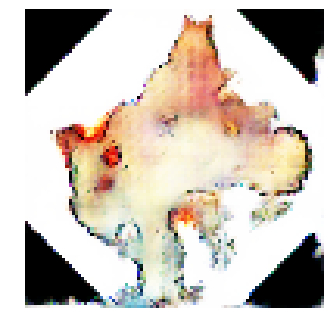


Epoch: 29940, D: -6.523, G: 4.596
Epoch: 29941, D: -6.882, G: 4.369
Epoch: 29942, D: -6.197, G: 3.719
Epoch: 29943, D: -4.954, G: 3.981
Epoch: 29944, D: -6.226, G: 5.704
Epoch: 29945, D: -6.546, G: 4.123
Epoch: 29946, D: -6.497, G: 2.952
Epoch: 29947, D: -6.724, G: 3.382
Epoch: 29948, D: -6.022, G: 3.305
Epoch: 29949, D: -5.845, G: 3.787
Epoch: 29950, D: -5.346, G: 4.798
Epoch: 29951, D: -5.23, G: 3.813
Epoch: 29952, D: -6.913, G: 3.152
Epoch: 29953, D: -5.398, G: 2.878
Epoch: 29954, D: -5.665, G: 4.302
Epoch: 29955, D: -4.66, G: 2.535
Epoch: 29956, D: -5.769, G: 2.036
Epoch: 29957, D: -7.006, G: 4.748
Epoch: 29958, D: -5.078, G: 4.293
Epoch: 29959, D: -7.302, G: 4.377


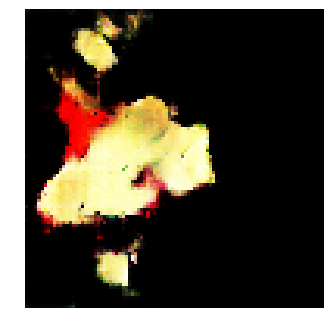


Epoch: 29960, D: -6.314, G: 3.59
Epoch: 29961, D: -5.571, G: 2.798
Epoch: 29962, D: -5.596, G: 4.373
Epoch: 29963, D: -5.949, G: 3.158
Epoch: 29964, D: -5.82, G: 2.432
Epoch: 29965, D: -6.373, G: 4.445
Epoch: 29966, D: -5.372, G: 2.781
Epoch: 29967, D: -6.339, G: 4.062
Epoch: 29968, D: -5.519, G: 3.142
Epoch: 29969, D: -5.559, G: 3.719
Epoch: 29970, D: -5.29, G: 4.072
Epoch: 29971, D: -6.94, G: 3.014
Epoch: 29972, D: -6.972, G: 2.698
Epoch: 29973, D: -6.798, G: 4.797
Epoch: 29974, D: -6.502, G: 4.746
Epoch: 29975, D: -5.65, G: 3.941
Epoch: 29976, D: -5.228, G: 3.638
Epoch: 29977, D: -6.753, G: 4.158
Epoch: 29978, D: -5.877, G: 5.158
Epoch: 29979, D: -4.877, G: 3.145


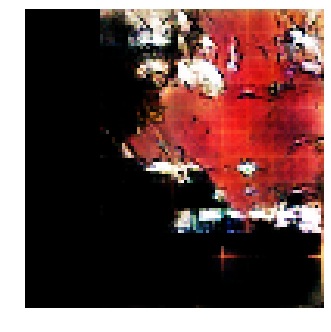


Epoch: 29980, D: -5.495, G: 2.309
Epoch: 29981, D: -5.563, G: 3.574
Epoch: 29982, D: -5.428, G: 0.9513
Epoch: 29983, D: -6.812, G: 3.399
Epoch: 29984, D: -6.301, G: 3.445
Epoch: 29985, D: -6.689, G: 4.704
Epoch: 29986, D: -5.88, G: 4.285
Epoch: 29987, D: -5.591, G: 2.801
Epoch: 29988, D: -5.869, G: 5.639
Epoch: 29989, D: -6.298, G: 4.094
Epoch: 29990, D: -5.32, G: 4.277
Epoch: 29991, D: -5.573, G: 2.431
Epoch: 29992, D: -5.606, G: 3.182
Epoch: 29993, D: -5.67, G: 3.453
Epoch: 29994, D: -6.211, G: 3.776
Epoch: 29995, D: -5.464, G: 2.106
Epoch: 29996, D: -5.346, G: 3.638
Epoch: 29997, D: -5.928, G: 4.375
Epoch: 29998, D: -5.463, G: 3.465
Epoch: 29999, D: -7.297, G: 4.067


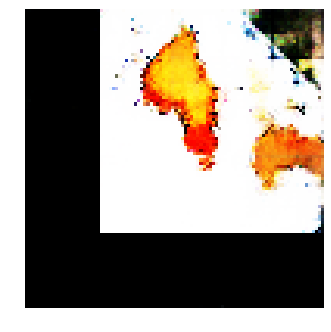


Epoch: 30000, D: -7.56, G: 2.944
Epoch: 30001, D: -5.925, G: 4.318
Epoch: 30002, D: -7.68, G: 2.849
Epoch: 30003, D: -5.185, G: 3.873
Epoch: 30004, D: -5.533, G: 4.788
Epoch: 30005, D: -6.546, G: 5.234
Epoch: 30006, D: -5.473, G: 3.743
Epoch: 30007, D: -6.095, G: 4.767
Epoch: 30008, D: -5.323, G: 4.023
Epoch: 30009, D: -6.352, G: 3.862
Epoch: 30010, D: -4.608, G: 5.538
Epoch: 30011, D: -5.837, G: 4.666
Epoch: 30012, D: -6.626, G: 3.72
Epoch: 30013, D: -7.836, G: 3.151
Epoch: 30014, D: -6.065, G: 2.752
Epoch: 30015, D: -6.418, G: 2.904
Epoch: 30016, D: -4.759, G: 3.548
Epoch: 30017, D: -6.761, G: 4.297
Epoch: 30018, D: -6.431, G: 4.532
Epoch: 30019, D: -7.287, G: 4.116


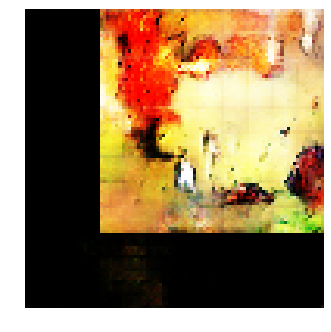


Epoch: 30020, D: -5.252, G: 2.155
Epoch: 30021, D: -4.925, G: 4.397
Epoch: 30022, D: -5.805, G: 6.555
Epoch: 30023, D: -6.03, G: 3.838
Epoch: 30024, D: -6.686, G: 4.297
Epoch: 30025, D: -4.257, G: 4.22
Epoch: 30026, D: -6.019, G: 4.407
Epoch: 30027, D: -6.619, G: 2.405
Epoch: 30028, D: -5.375, G: 3.949
Epoch: 30029, D: -6.225, G: 3.923
Epoch: 30030, D: -5.427, G: 4.26
Epoch: 30031, D: -6.231, G: 3.49
Epoch: 30032, D: -5.687, G: 3.091
Epoch: 30033, D: -4.148, G: 3.019
Epoch: 30034, D: -6.369, G: 3.052
Epoch: 30035, D: -5.659, G: 3.833
Epoch: 30036, D: -5.851, G: 3.289
Epoch: 30037, D: -4.302, G: 2.694
Epoch: 30038, D: -5.494, G: 4.57
Epoch: 30039, D: -6.457, G: 4.452


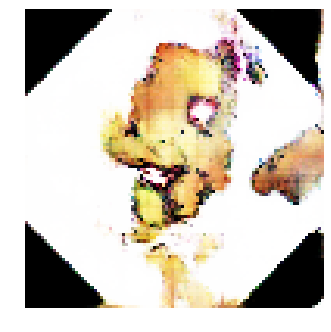


Epoch: 30040, D: -7.128, G: 4.611
Epoch: 30041, D: -6.768, G: 3.391
Epoch: 30042, D: -5.787, G: 4.785
Epoch: 30043, D: -5.886, G: 4.63
Epoch: 30044, D: -4.591, G: 3.771
Epoch: 30045, D: -7.629, G: 5.601
Epoch: 30046, D: -7.857, G: 3.023
Epoch: 30047, D: -5.766, G: 4.439
Epoch: 30048, D: -7.017, G: 3.177
Epoch: 30049, D: -5.378, G: 4.807
Epoch: 30050, D: -5.624, G: 4.533
Epoch: 30051, D: -6.935, G: 4.634
Epoch: 30052, D: -6.803, G: 5.802
Epoch: 30053, D: -4.981, G: 5.249
Epoch: 30054, D: -5.4, G: 6.907
Epoch: 30055, D: -5.684, G: 6.346
Epoch: 30056, D: -4.615, G: 3.913
Epoch: 30057, D: -6.03, G: 5.017
Epoch: 30058, D: -5.724, G: 2.037
Epoch: 30059, D: -8.171, G: 2.652


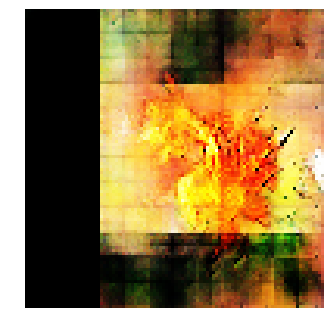


Epoch: 30060, D: -7.199, G: 2.374
Epoch: 30061, D: -6.688, G: 6.436
Epoch: 30062, D: -5.979, G: 4.01
Epoch: 30063, D: -5.431, G: 5.574
Epoch: 30064, D: -6.015, G: 4.032
Epoch: 30065, D: -7.379, G: 3.092
Epoch: 30066, D: -6.447, G: 3.237
Epoch: 30067, D: -4.506, G: 3.148
Epoch: 30068, D: -5.513, G: 5.663
Epoch: 30069, D: -6.607, G: 5.615
Epoch: 30070, D: -6.032, G: 3.28
Epoch: 30071, D: -4.836, G: 4.683
Epoch: 30072, D: -4.895, G: 1.886
Epoch: 30073, D: -6.419, G: 3.74
Epoch: 30074, D: -5.343, G: 3.025
Epoch: 30075, D: -5.093, G: 3.724
Epoch: 30076, D: -6.001, G: 4.276
Epoch: 30077, D: -6.449, G: 3.417
Epoch: 30078, D: -7.104, G: 2.851
Epoch: 30079, D: -6.123, G: 3.82


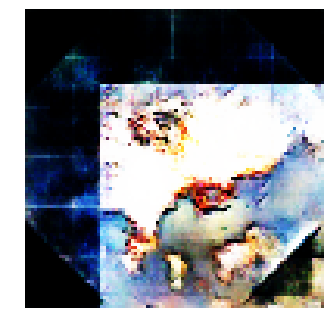


Epoch: 30080, D: -6.558, G: 4.691
Epoch: 30081, D: -6.301, G: 1.637
Epoch: 30082, D: -7.025, G: 2.245
Epoch: 30083, D: -5.009, G: 2.831
Epoch: 30084, D: -5.537, G: 2.999
Epoch: 30085, D: -5.579, G: 5.295
Epoch: 30086, D: -5.746, G: 4.967
Epoch: 30087, D: -6.288, G: 3.557
Epoch: 30088, D: -6.665, G: 3.998
Epoch: 30089, D: -5.748, G: 5.414
Epoch: 30090, D: -5.475, G: 4.905
Epoch: 30091, D: -4.79, G: 4.21
Epoch: 30092, D: -6.161, G: 4.883
Epoch: 30093, D: -6.014, G: 5.448
Epoch: 30094, D: -5.779, G: 3.297
Epoch: 30095, D: -6.601, G: 3.589
Epoch: 30096, D: -5.421, G: 4.828
Epoch: 30097, D: -5.739, G: 2.706
Epoch: 30098, D: -4.538, G: 3.85
Epoch: 30099, D: -6.223, G: 1.633


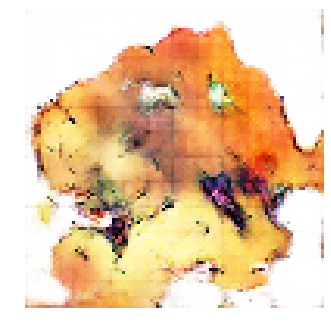


Epoch: 30100, D: -3.995, G: 3.859
Epoch: 30101, D: -5.965, G: 3.764
Epoch: 30102, D: -6.652, G: 3.745
Epoch: 30103, D: -7.387, G: 4.613
Epoch: 30104, D: -5.951, G: 3.145
Epoch: 30105, D: -6.319, G: 3.761
Epoch: 30106, D: -7.467, G: 4.77
Epoch: 30107, D: -6.583, G: 3.878
Epoch: 30108, D: -5.641, G: 3.015
Epoch: 30109, D: -5.264, G: 3.36
Epoch: 30110, D: -5.461, G: 4.57
Epoch: 30111, D: -5.734, G: 3.033
Epoch: 30112, D: -5.191, G: 4.937
Epoch: 30113, D: -5.869, G: 4.1
Epoch: 30114, D: -5.922, G: 5.281
Epoch: 30115, D: -6.901, G: 3.992
Epoch: 30116, D: -5.669, G: 5.498
Epoch: 30117, D: -7.19, G: 4.484
Epoch: 30118, D: -6.167, G: 3.392
Epoch: 30119, D: -6.97, G: 4.545


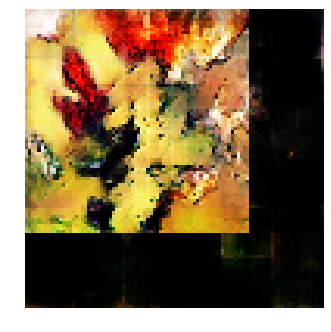


Epoch: 30120, D: -6.28, G: 3.384
Epoch: 30121, D: -4.437, G: 3.511
Epoch: 30122, D: -6.199, G: 5.04
Epoch: 30123, D: -4.702, G: 4.322
Epoch: 30124, D: -5.942, G: 4.573
Epoch: 30125, D: -4.674, G: 3.761
Epoch: 30126, D: -5.734, G: 6.152
Epoch: 30127, D: -6.377, G: 3.59
Epoch: 30128, D: -5.715, G: 4.652
Epoch: 30129, D: -6.777, G: 4.353
Epoch: 30130, D: -4.606, G: 4.914
Epoch: 30131, D: -6.505, G: 4.217
Epoch: 30132, D: -6.14, G: 4.239
Epoch: 30133, D: -6.935, G: 4.614
Epoch: 30134, D: -5.041, G: 4.36
Epoch: 30135, D: -5.541, G: 3.971
Epoch: 30136, D: -5.963, G: 4.804
Epoch: 30137, D: -5.359, G: 3.789
Epoch: 30138, D: -6.129, G: 3.95
Epoch: 30139, D: -5.647, G: 4.965


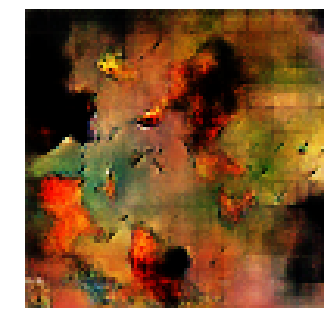


Epoch: 30140, D: -5.874, G: 3.055
Epoch: 30141, D: -5.728, G: 5.656
Epoch: 30142, D: -5.733, G: 3.57
Epoch: 30143, D: -7.149, G: 6.256
Epoch: 30144, D: -6.283, G: 3.957
Epoch: 30145, D: -7.302, G: 4.395
Epoch: 30146, D: -5.997, G: 3.995
Epoch: 30147, D: -7.154, G: 4.682
Epoch: 30148, D: -6.419, G: 3.34
Epoch: 30149, D: -7.486, G: 3.517
Epoch: 30150, D: -6.248, G: 3.558
Epoch: 30151, D: -5.042, G: 3.746
Epoch: 30152, D: -4.888, G: 5.349
Epoch: 30153, D: -4.703, G: 4.212
Epoch: 30154, D: -6.399, G: 4.574
Epoch: 30155, D: -5.938, G: 4.497
Epoch: 30156, D: -4.94, G: 4.336
Epoch: 30157, D: -5.733, G: 3.71
Epoch: 30158, D: -8.226, G: 4.218
Epoch: 30159, D: -6.656, G: 2.645


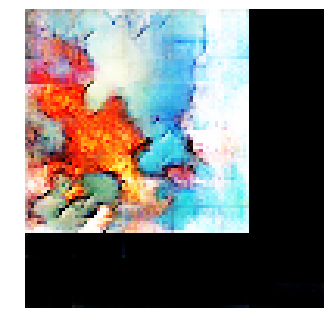


Epoch: 30160, D: -6.543, G: 3.479
Epoch: 30161, D: -4.12, G: 3.238
Epoch: 30162, D: -5.344, G: 5.301
Epoch: 30163, D: -7.443, G: 3.082
Epoch: 30164, D: -4.676, G: 1.921
Epoch: 30165, D: -5.221, G: 5.406
Epoch: 30166, D: -6.869, G: 4.906
Epoch: 30167, D: -4.645, G: 3.336
Epoch: 30168, D: -4.825, G: 5.123
Epoch: 30169, D: -6.243, G: 3.966
Epoch: 30170, D: -5.815, G: 4.845
Epoch: 30171, D: -5.872, G: 3.433
Epoch: 30172, D: -6.578, G: 3.688
Epoch: 30173, D: -6.633, G: 0.9832
Epoch: 30174, D: -6.68, G: 4.627
Epoch: 30175, D: -5.427, G: 4.122
Epoch: 30176, D: -6.606, G: 1.973
Epoch: 30177, D: -6.538, G: 3.733
Epoch: 30178, D: -6.0, G: 3.979
Epoch: 30179, D: -5.185, G: 3.734


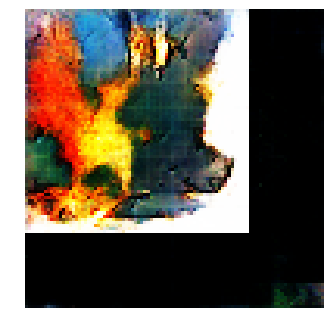


Epoch: 30180, D: -5.877, G: 4.081
Epoch: 30181, D: -4.93, G: 4.247
Epoch: 30182, D: -5.673, G: 3.861
Epoch: 30183, D: -7.53, G: 3.09
Epoch: 30184, D: -5.001, G: 4.613
Epoch: 30185, D: -6.07, G: 3.62
Epoch: 30186, D: -7.803, G: 3.023
Epoch: 30187, D: -5.495, G: 1.505
Epoch: 30188, D: -7.428, G: 3.347
Epoch: 30189, D: -5.368, G: 3.71
Epoch: 30190, D: -6.168, G: 3.71
Epoch: 30191, D: -6.167, G: 2.448
Epoch: 30192, D: -5.758, G: 4.411
Epoch: 30193, D: -6.355, G: 4.643
Epoch: 30194, D: -7.266, G: 5.704
Epoch: 30195, D: -6.792, G: 5.177
Epoch: 30196, D: -7.045, G: 3.957
Epoch: 30197, D: -6.082, G: 3.781
Epoch: 30198, D: -7.304, G: 4.566
Epoch: 30199, D: -5.03, G: 2.97


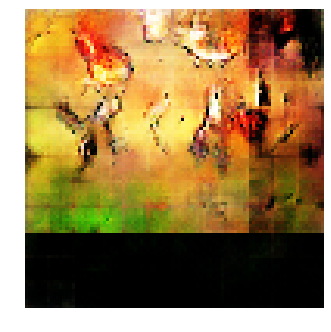


Epoch: 30200, D: -5.489, G: 4.298
Epoch: 30201, D: -5.452, G: 3.072
Epoch: 30202, D: -7.283, G: 4.875
Epoch: 30203, D: -6.703, G: 2.684
Epoch: 30204, D: -7.674, G: 3.899
Epoch: 30205, D: -5.588, G: 1.65
Epoch: 30206, D: -4.864, G: 1.734
Epoch: 30207, D: -6.179, G: 4.171
Epoch: 30208, D: -5.751, G: 4.154
Epoch: 30209, D: -5.112, G: 4.354
Epoch: 30210, D: -5.754, G: 2.024
Epoch: 30211, D: -7.152, G: 4.004
Epoch: 30212, D: -4.942, G: 4.184
Epoch: 30213, D: -6.439, G: 4.646
Epoch: 30214, D: -5.07, G: 3.879
Epoch: 30215, D: -6.81, G: 2.295
Epoch: 30216, D: -6.936, G: 3.608
Epoch: 30217, D: -5.565, G: 3.53
Epoch: 30218, D: -6.334, G: 4.293
Epoch: 30219, D: -8.343, G: 2.697


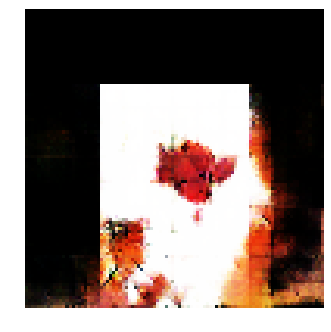


Epoch: 30220, D: -6.194, G: 2.813
Epoch: 30221, D: -4.574, G: 4.563
Epoch: 30222, D: -5.859, G: 3.256
Epoch: 30223, D: -5.389, G: 2.898
Epoch: 30224, D: -5.407, G: 2.06
Epoch: 30225, D: -4.501, G: 4.425
Epoch: 30226, D: -6.603, G: 4.491
Epoch: 30227, D: -6.965, G: 4.11
Epoch: 30228, D: -7.612, G: 4.456
Epoch: 30229, D: -6.412, G: 1.711
Epoch: 30230, D: -5.377, G: 2.745
Epoch: 30231, D: -5.471, G: 3.247
Epoch: 30232, D: -5.701, G: 3.626
Epoch: 30233, D: -5.674, G: 2.851
Epoch: 30234, D: -5.924, G: 2.465
Epoch: 30235, D: -5.503, G: 3.943
Epoch: 30236, D: -7.208, G: 4.587
Epoch: 30237, D: -6.27, G: 1.764
Epoch: 30238, D: -6.701, G: 4.369
Epoch: 30239, D: -4.771, G: 3.355


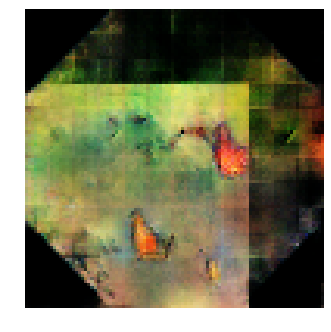


Epoch: 30240, D: -5.969, G: 5.517
Epoch: 30241, D: -5.89, G: 2.113
Epoch: 30242, D: -5.853, G: 2.74
Epoch: 30243, D: -7.623, G: 2.889
Epoch: 30244, D: -6.666, G: 2.966
Epoch: 30245, D: -5.97, G: 3.362
Epoch: 30246, D: -6.196, G: 3.799
Epoch: 30247, D: -5.499, G: 4.79
Epoch: 30248, D: -6.378, G: 3.565
Epoch: 30249, D: -6.849, G: 3.751
Epoch: 30250, D: -5.482, G: 3.475
Epoch: 30251, D: -6.787, G: 2.022
Epoch: 30252, D: -6.383, G: 4.651
Epoch: 30253, D: -7.753, G: 5.205
Epoch: 30254, D: -6.709, G: 3.984
Epoch: 30255, D: -6.304, G: 2.943
Epoch: 30256, D: -6.924, G: 2.881
Epoch: 30257, D: -6.044, G: 4.185
Epoch: 30258, D: -5.212, G: 3.052
Epoch: 30259, D: -6.378, G: 4.484


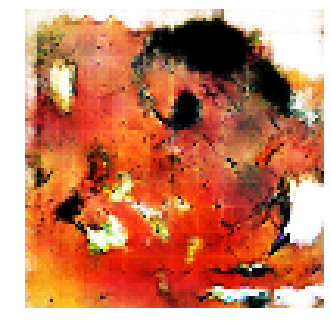


Epoch: 30260, D: -5.797, G: 4.055
Epoch: 30261, D: -7.112, G: 4.207
Epoch: 30262, D: -5.734, G: 2.176
Epoch: 30263, D: -6.272, G: 1.912
Epoch: 30264, D: -5.697, G: 4.506
Epoch: 30265, D: -6.286, G: 2.165
Epoch: 30266, D: -6.601, G: 2.07
Epoch: 30267, D: -6.263, G: 2.832
Epoch: 30268, D: -5.285, G: 2.173
Epoch: 30269, D: -7.243, G: 4.722
Epoch: 30270, D: -5.559, G: 3.422
Epoch: 30271, D: -5.95, G: 4.385
Epoch: 30272, D: -7.398, G: 4.121
Epoch: 30273, D: -5.156, G: 3.904
Epoch: 30274, D: -6.291, G: 3.737
Epoch: 30275, D: -6.017, G: 0.5903
Epoch: 30276, D: -6.822, G: 4.909
Epoch: 30277, D: -5.959, G: 3.235
Epoch: 30278, D: -6.344, G: 2.273
Epoch: 30279, D: -5.858, G: 3.415


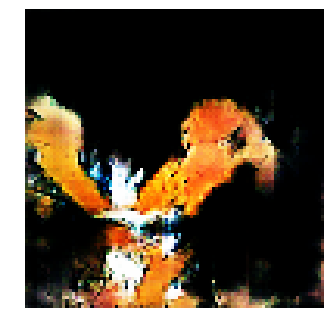


Epoch: 30280, D: -8.021, G: 5.516
Epoch: 30281, D: -5.357, G: 4.374
Epoch: 30282, D: -5.368, G: 5.155
Epoch: 30283, D: -5.837, G: 4.857
Epoch: 30284, D: -5.007, G: 4.546
Epoch: 30285, D: -6.044, G: 5.141
Epoch: 30286, D: -6.923, G: 3.185
Epoch: 30287, D: -6.238, G: 2.961
Epoch: 30288, D: -7.196, G: 5.706
Epoch: 30289, D: -5.914, G: 3.809
Epoch: 30290, D: -6.454, G: 3.479
Epoch: 30291, D: -6.217, G: 4.362
Epoch: 30292, D: -5.898, G: 4.615
Epoch: 30293, D: -5.332, G: 4.499
Epoch: 30294, D: -5.008, G: 3.398
Epoch: 30295, D: -6.907, G: 3.675
Epoch: 30296, D: -6.536, G: 5.661
Epoch: 30297, D: -6.235, G: 5.44
Epoch: 30298, D: -6.787, G: 4.334
Epoch: 30299, D: -7.959, G: 4.043


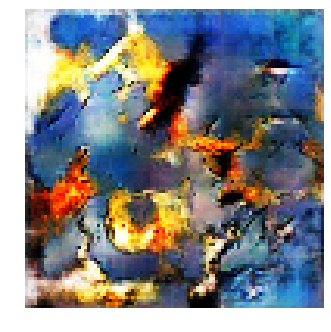


Epoch: 30300, D: -5.42, G: 3.223
Epoch: 30301, D: -6.152, G: 6.073
Epoch: 30302, D: -7.165, G: 5.327
Epoch: 30303, D: -4.829, G: 3.815
Epoch: 30304, D: -5.044, G: 4.964
Epoch: 30305, D: -5.256, G: 4.004
Epoch: 30306, D: -6.481, G: 3.076
Epoch: 30307, D: -5.892, G: 5.009
Epoch: 30308, D: -6.239, G: 3.757
Epoch: 30309, D: -6.353, G: 3.442
Epoch: 30310, D: -5.447, G: 3.976
Epoch: 30311, D: -6.462, G: 4.687
Epoch: 30312, D: -5.831, G: 2.451
Epoch: 30313, D: -5.905, G: 3.24
Epoch: 30314, D: -4.722, G: 3.965
Epoch: 30315, D: -6.539, G: 5.104
Epoch: 30316, D: -6.462, G: 3.377
Epoch: 30317, D: -6.918, G: 4.048
Epoch: 30318, D: -6.064, G: 5.072
Epoch: 30319, D: -7.49, G: 5.024


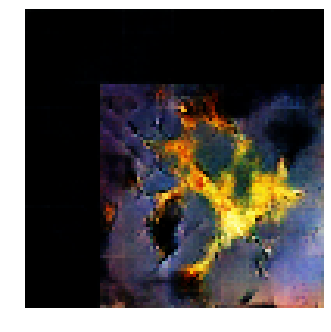


Epoch: 30320, D: -6.251, G: 3.76
Epoch: 30321, D: -6.051, G: 4.694
Epoch: 30322, D: -6.301, G: 2.309
Epoch: 30323, D: -4.63, G: 4.508
Epoch: 30324, D: -7.973, G: 3.52
Epoch: 30325, D: -6.607, G: 5.381
Epoch: 30326, D: -6.053, G: 1.87
Epoch: 30327, D: -6.141, G: 3.28
Epoch: 30328, D: -6.919, G: 2.063
Epoch: 30329, D: -6.138, G: 3.781
Epoch: 30330, D: -5.217, G: 3.749
Epoch: 30331, D: -6.753, G: 5.671
Epoch: 30332, D: -7.216, G: 5.553
Epoch: 30333, D: -5.693, G: 2.48
Epoch: 30334, D: -7.091, G: 4.95
Epoch: 30335, D: -6.925, G: 4.362
Epoch: 30336, D: -5.701, G: 3.657
Epoch: 30337, D: -6.006, G: 4.834
Epoch: 30338, D: -6.053, G: 4.606
Epoch: 30339, D: -6.098, G: 4.884


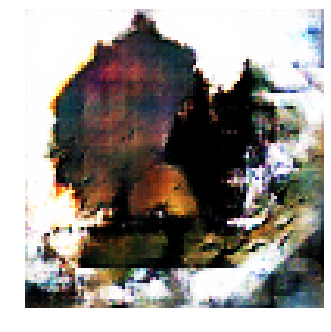


Epoch: 30340, D: -6.232, G: 3.618
Epoch: 30341, D: -6.263, G: 3.709
Epoch: 30342, D: -5.983, G: 5.64
Epoch: 30343, D: -7.115, G: 4.494
Epoch: 30344, D: -6.488, G: 2.248
Epoch: 30345, D: -5.016, G: 4.246
Epoch: 30346, D: -5.974, G: 4.283
Epoch: 30347, D: -5.607, G: 5.743
Epoch: 30348, D: -6.347, G: 7.162
Epoch: 30349, D: -5.723, G: 4.804
Epoch: 30350, D: -6.435, G: 4.593
Epoch: 30351, D: -7.589, G: 3.083
Epoch: 30352, D: -6.357, G: 4.15
Epoch: 30353, D: -6.302, G: 6.345
Epoch: 30354, D: -5.82, G: 5.699
Epoch: 30355, D: -7.021, G: 4.652
Epoch: 30356, D: -7.01, G: 3.353
Epoch: 30357, D: -5.606, G: 2.847
Epoch: 30358, D: -5.99, G: 3.859
Epoch: 30359, D: -7.049, G: 4.981


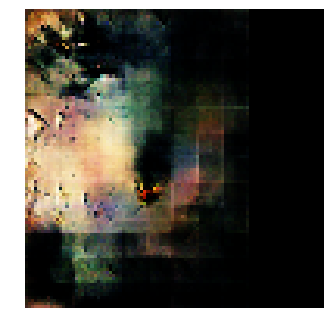


Epoch: 30360, D: -6.224, G: 2.993
Epoch: 30361, D: -7.043, G: 3.678
Epoch: 30362, D: -7.478, G: 2.395
Epoch: 30363, D: -7.104, G: 4.649
Epoch: 30364, D: -5.366, G: 3.071
Epoch: 30365, D: -5.491, G: 3.977
Epoch: 30366, D: -5.891, G: 2.419
Epoch: 30367, D: -6.833, G: 1.544
Epoch: 30368, D: -6.102, G: 3.523
Epoch: 30369, D: -5.708, G: 2.301
Epoch: 30370, D: -6.634, G: 4.178
Epoch: 30371, D: -5.981, G: 4.999
Epoch: 30372, D: -4.404, G: 4.58
Epoch: 30373, D: -5.294, G: 5.867
Epoch: 30374, D: -7.146, G: 4.336
Epoch: 30375, D: -6.402, G: 4.646
Epoch: 30376, D: -6.455, G: 4.041
Epoch: 30377, D: -6.967, G: 3.367
Epoch: 30378, D: -5.904, G: 3.989
Epoch: 30379, D: -6.389, G: 2.878


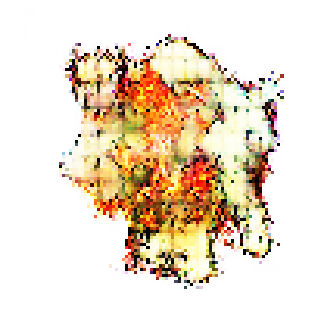


Epoch: 30380, D: -7.254, G: 2.947
Epoch: 30381, D: -6.313, G: 1.092
Epoch: 30382, D: -7.105, G: 2.399
Epoch: 30383, D: -6.107, G: 3.901
Epoch: 30384, D: -6.795, G: 1.431
Epoch: 30385, D: -5.373, G: 3.679
Epoch: 30386, D: -6.534, G: 2.195
Epoch: 30387, D: -5.607, G: 2.309
Epoch: 30388, D: -7.076, G: 2.287
Epoch: 30389, D: -6.799, G: 4.611
Epoch: 30390, D: -5.889, G: 2.833
Epoch: 30391, D: -7.425, G: 4.895
Epoch: 30392, D: -7.319, G: 2.033
Epoch: 30393, D: -8.031, G: 3.686
Epoch: 30394, D: -7.031, G: 3.713
Epoch: 30395, D: -6.066, G: 3.87
Epoch: 30396, D: -5.273, G: 3.641
Epoch: 30397, D: -5.913, G: 4.449
Epoch: 30398, D: -5.251, G: 2.545
Epoch: 30399, D: -6.33, G: 2.555


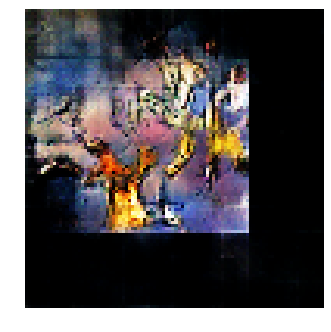


Epoch: 30400, D: -4.613, G: 3.314
Epoch: 30401, D: -4.997, G: 6.259
Epoch: 30402, D: -5.543, G: 2.565
Epoch: 30403, D: -5.227, G: 3.122
Epoch: 30404, D: -5.962, G: 4.377
Epoch: 30405, D: -5.512, G: 2.862
Epoch: 30406, D: -6.925, G: 4.671
Epoch: 30407, D: -5.004, G: 5.649
Epoch: 30408, D: -6.065, G: 3.934
Epoch: 30409, D: -6.603, G: 3.461
Epoch: 30410, D: -7.207, G: 5.27
Epoch: 30411, D: -6.424, G: 6.024
Epoch: 30412, D: -5.932, G: 4.54
Epoch: 30413, D: -6.908, G: 4.929
Epoch: 30414, D: -5.108, G: 3.416
Epoch: 30415, D: -5.252, G: 3.141
Epoch: 30416, D: -5.938, G: 6.411
Epoch: 30417, D: -6.65, G: 4.04
Epoch: 30418, D: -5.246, G: 3.894
Epoch: 30419, D: -6.185, G: 2.045


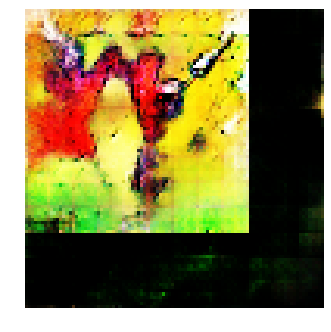


Epoch: 30420, D: -6.484, G: 2.305
Epoch: 30421, D: -6.312, G: 2.183
Epoch: 30422, D: -5.718, G: 1.754
Epoch: 30423, D: -5.545, G: 2.025
Epoch: 30424, D: -6.078, G: 1.902
Epoch: 30425, D: -5.855, G: 5.312
Epoch: 30426, D: -6.362, G: 2.616
Epoch: 30427, D: -5.202, G: 3.988
Epoch: 30428, D: -6.841, G: 4.509
Epoch: 30429, D: -6.086, G: 3.886
Epoch: 30430, D: -5.572, G: 3.509
Epoch: 30431, D: -5.547, G: 2.881
Epoch: 30432, D: -6.024, G: 4.261
Epoch: 30433, D: -6.153, G: 2.362
Epoch: 30434, D: -7.338, G: 4.51
Epoch: 30435, D: -5.989, G: 1.408
Epoch: 30436, D: -6.307, G: 4.144
Epoch: 30437, D: -5.548, G: 3.557
Epoch: 30438, D: -6.12, G: 3.158
Epoch: 30439, D: -5.348, G: 2.506


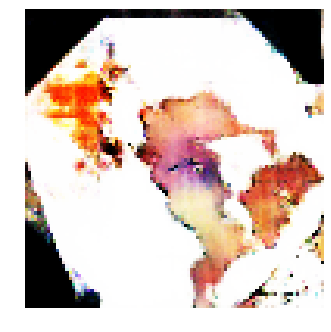


Epoch: 30440, D: -5.59, G: 4.115
Epoch: 30441, D: -6.387, G: 2.803
Epoch: 30442, D: -5.363, G: 4.758
Epoch: 30443, D: -5.75, G: 3.392
Epoch: 30444, D: -6.569, G: 4.992
Epoch: 30445, D: -5.973, G: 1.456
Epoch: 30446, D: -5.285, G: 2.077
Epoch: 30447, D: -5.931, G: 5.395
Epoch: 30448, D: -6.619, G: 4.308
Epoch: 30449, D: -5.98, G: 6.148
Epoch: 30450, D: -5.35, G: 2.429
Epoch: 30451, D: -5.505, G: 3.515
Epoch: 30452, D: -6.321, G: 4.468
Epoch: 30453, D: -6.878, G: 1.497
Epoch: 30454, D: -6.516, G: 4.15
Epoch: 30455, D: -7.21, G: 4.862
Epoch: 30456, D: -5.488, G: 3.488
Epoch: 30457, D: -6.125, G: 3.821
Epoch: 30458, D: -6.4, G: 4.417
Epoch: 30459, D: -6.471, G: 4.751


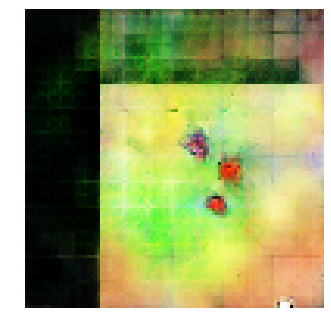


Epoch: 30460, D: -5.059, G: 4.824
Epoch: 30461, D: -7.74, G: 6.179
Epoch: 30462, D: -5.359, G: 4.758
Epoch: 30463, D: -6.32, G: 4.302
Epoch: 30464, D: -5.114, G: 3.097
Epoch: 30465, D: -6.233, G: 4.557
Epoch: 30466, D: -5.903, G: 3.775
Epoch: 30467, D: -4.967, G: 2.406
Epoch: 30468, D: -6.449, G: 4.32
Epoch: 30469, D: -5.891, G: 3.202
Epoch: 30470, D: -6.945, G: 2.8
Epoch: 30471, D: -5.705, G: 5.42
Epoch: 30472, D: -6.314, G: 4.752
Epoch: 30473, D: -5.954, G: 2.787
Epoch: 30474, D: -5.82, G: 3.153
Epoch: 30475, D: -6.332, G: 3.756
Epoch: 30476, D: -7.61, G: 3.795
Epoch: 30477, D: -6.441, G: 2.255
Epoch: 30478, D: -7.133, G: 2.918
Epoch: 30479, D: -6.23, G: 4.64


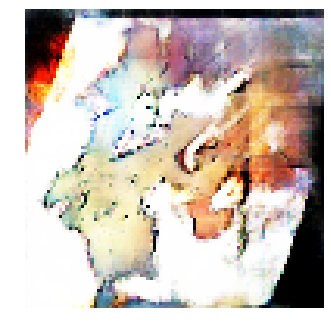


Epoch: 30480, D: -6.016, G: 1.165
Epoch: 30481, D: -7.177, G: 4.787
Epoch: 30482, D: -5.433, G: 3.997
Epoch: 30483, D: -6.943, G: 2.42
Epoch: 30484, D: -8.073, G: 1.588
Epoch: 30485, D: -6.648, G: 2.77
Epoch: 30486, D: -7.644, G: 2.24
Epoch: 30487, D: -5.873, G: 2.85
Epoch: 30488, D: -5.845, G: 5.546
Epoch: 30489, D: -7.049, G: 5.899
Epoch: 30490, D: -6.021, G: 4.096
Epoch: 30491, D: -6.857, G: 4.801
Epoch: 30492, D: -6.654, G: 4.699
Epoch: 30493, D: -6.388, G: 5.774
Epoch: 30494, D: -7.587, G: 2.439
Epoch: 30495, D: -4.563, G: 4.464
Epoch: 30496, D: -5.493, G: 4.109
Epoch: 30497, D: -6.668, G: 3.616
Epoch: 30498, D: -5.288, G: 4.536
Epoch: 30499, D: -7.809, G: 5.061


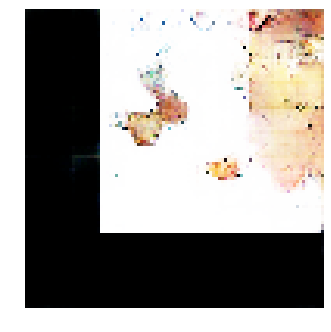


Epoch: 30500, D: -5.937, G: 2.677
Epoch: 30501, D: -6.528, G: 2.509
Epoch: 30502, D: -6.295, G: 5.884
Epoch: 30503, D: -5.922, G: 6.832
Epoch: 30504, D: -5.108, G: 4.97
Epoch: 30505, D: -5.514, G: 6.59
Epoch: 30506, D: -6.005, G: 4.044
Epoch: 30507, D: -5.958, G: 4.007
Epoch: 30508, D: -7.439, G: 4.404
Epoch: 30509, D: -5.601, G: 4.185
Epoch: 30510, D: -5.022, G: 5.665
Epoch: 30511, D: -9.111, G: 4.649
Epoch: 30512, D: -5.989, G: 4.968
Epoch: 30513, D: -5.405, G: 3.746
Epoch: 30514, D: -8.237, G: 4.306
Epoch: 30515, D: -4.208, G: 2.053
Epoch: 30516, D: -7.205, G: 3.68
Epoch: 30517, D: -4.826, G: 2.451
Epoch: 30518, D: -6.01, G: 4.777
Epoch: 30519, D: -5.698, G: 4.158


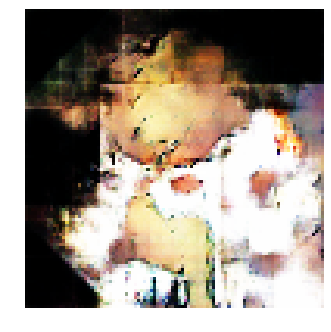


Epoch: 30520, D: -5.689, G: 3.835
Epoch: 30521, D: -5.855, G: 2.369
Epoch: 30522, D: -6.537, G: 4.231
Epoch: 30523, D: -8.599, G: 4.111
Epoch: 30524, D: -6.026, G: 2.482
Epoch: 30525, D: -6.387, G: 2.886
Epoch: 30526, D: -5.152, G: 5.139
Epoch: 30527, D: -5.607, G: 2.338
Epoch: 30528, D: -5.655, G: 3.055
Epoch: 30529, D: -5.949, G: 5.343
Epoch: 30530, D: -6.708, G: 3.836
Epoch: 30531, D: -5.961, G: 3.133
Epoch: 30532, D: -6.362, G: 3.923
Epoch: 30533, D: -6.823, G: 3.318
Epoch: 30534, D: -7.182, G: 3.466
Epoch: 30535, D: -6.181, G: 1.261
Epoch: 30536, D: -5.422, G: 5.8
Epoch: 30537, D: -5.162, G: 2.659
Epoch: 30538, D: -6.401, G: 3.107
Epoch: 30539, D: -6.627, G: 1.738


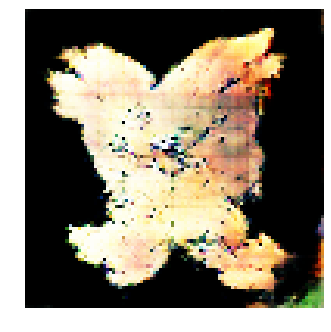


Epoch: 30540, D: -5.039, G: 4.062
Epoch: 30541, D: -6.712, G: 4.855
Epoch: 30542, D: -7.355, G: 2.929
Epoch: 30543, D: -6.482, G: 3.164
Epoch: 30544, D: -5.978, G: 3.437
Epoch: 30545, D: -6.781, G: 4.163
Epoch: 30546, D: -5.232, G: 3.312
Epoch: 30547, D: -5.442, G: 3.58
Epoch: 30548, D: -5.465, G: 5.743
Epoch: 30549, D: -5.61, G: 4.193
Epoch: 30550, D: -6.891, G: 2.242
Epoch: 30551, D: -6.116, G: 4.768
Epoch: 30552, D: -6.926, G: 5.885
Epoch: 30553, D: -6.19, G: 4.644
Epoch: 30554, D: -6.219, G: 4.446
Epoch: 30555, D: -5.983, G: 4.558
Epoch: 30556, D: -6.186, G: 4.695
Epoch: 30557, D: -6.129, G: 3.635
Epoch: 30558, D: -5.943, G: 4.148
Epoch: 30559, D: -5.372, G: 4.374


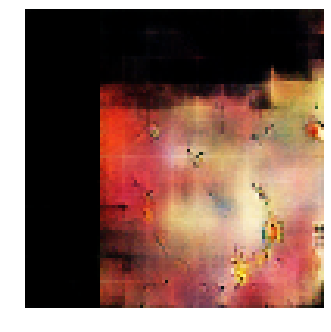


Epoch: 30560, D: -5.804, G: 3.713
Epoch: 30561, D: -6.025, G: 4.652
Epoch: 30562, D: -5.631, G: 2.648
Epoch: 30563, D: -5.575, G: 3.152
Epoch: 30564, D: -6.413, G: 4.916
Epoch: 30565, D: -6.095, G: 3.227
Epoch: 30566, D: -6.226, G: 3.5
Epoch: 30567, D: -6.324, G: 3.85
Epoch: 30568, D: -5.766, G: 4.596
Epoch: 30569, D: -6.755, G: 3.306
Epoch: 30570, D: -6.302, G: 4.456
Epoch: 30571, D: -7.12, G: 2.85
Epoch: 30572, D: -6.282, G: 4.683
Epoch: 30573, D: -7.259, G: 3.407
Epoch: 30574, D: -6.086, G: 4.098
Epoch: 30575, D: -7.123, G: 6.123
Epoch: 30576, D: -5.619, G: 5.926
Epoch: 30577, D: -6.64, G: 4.592
Epoch: 30578, D: -5.348, G: 2.636
Epoch: 30579, D: -5.512, G: 4.072


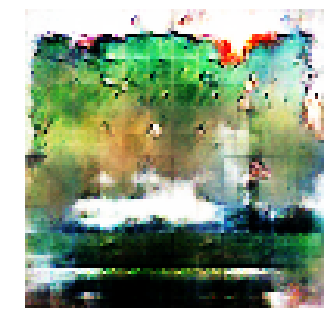


Epoch: 30580, D: -6.709, G: 5.068
Epoch: 30581, D: -4.235, G: 2.331
Epoch: 30582, D: -5.646, G: 4.159
Epoch: 30583, D: -6.678, G: 4.758
Epoch: 30584, D: -8.226, G: 2.978
Epoch: 30585, D: -5.021, G: 4.53
Epoch: 30586, D: -5.466, G: 4.179
Epoch: 30587, D: -7.097, G: 4.487
Epoch: 30588, D: -5.487, G: 2.648
Epoch: 30589, D: -5.377, G: 4.741
Epoch: 30590, D: -4.563, G: 4.84
Epoch: 30591, D: -7.089, G: 4.53
Epoch: 30592, D: -6.711, G: 3.525
Epoch: 30593, D: -6.585, G: 4.062
Epoch: 30594, D: -5.056, G: 4.194
Epoch: 30595, D: -5.51, G: 3.467
Epoch: 30596, D: -5.38, G: 4.252
Epoch: 30597, D: -6.257, G: 4.113
Epoch: 30598, D: -5.78, G: 3.714
Epoch: 30599, D: -6.27, G: 3.965


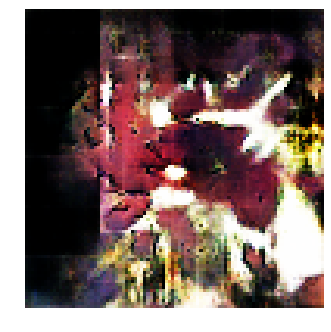


Epoch: 30600, D: -7.113, G: 3.496
Epoch: 30601, D: -6.6, G: 3.676
Epoch: 30602, D: -6.264, G: 3.525
Epoch: 30603, D: -5.075, G: 2.984
Epoch: 30604, D: -7.041, G: 3.928
Epoch: 30605, D: -6.37, G: 4.21
Epoch: 30606, D: -6.686, G: 4.146
Epoch: 30607, D: -6.814, G: 4.287
Epoch: 30608, D: -6.278, G: 3.189
Epoch: 30609, D: -5.384, G: 2.231
Epoch: 30610, D: -4.428, G: 3.047
Epoch: 30611, D: -6.123, G: 4.488
Epoch: 30612, D: -6.528, G: 4.467
Epoch: 30613, D: -6.125, G: 3.58
Epoch: 30614, D: -6.556, G: 1.876
Epoch: 30615, D: -5.809, G: 4.154
Epoch: 30616, D: -6.253, G: 4.616
Epoch: 30617, D: -5.19, G: 3.244
Epoch: 30618, D: -5.808, G: 3.702
Epoch: 30619, D: -7.679, G: 4.429


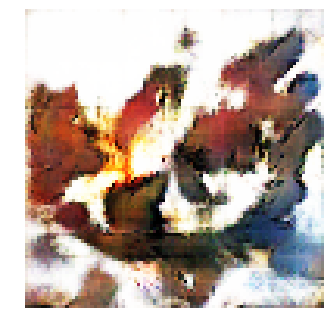


Epoch: 30620, D: -4.742, G: 2.387
Epoch: 30621, D: -5.934, G: 4.162
Epoch: 30622, D: -6.661, G: 2.663
Epoch: 30623, D: -6.74, G: 3.717
Epoch: 30624, D: -6.189, G: 3.109
Epoch: 30625, D: -6.506, G: 2.835
Epoch: 30626, D: -6.369, G: 1.326
Epoch: 30627, D: -6.594, G: 3.704
Epoch: 30628, D: -5.857, G: 3.632
Epoch: 30629, D: -6.931, G: 3.976
Epoch: 30630, D: -5.733, G: 2.879
Epoch: 30631, D: -5.742, G: 3.286
Epoch: 30632, D: -6.354, G: 2.022
Epoch: 30633, D: -5.034, G: 2.814
Epoch: 30634, D: -6.438, G: 4.484
Epoch: 30635, D: -6.383, G: 2.856
Epoch: 30636, D: -5.537, G: 2.563
Epoch: 30637, D: -5.845, G: 3.012
Epoch: 30638, D: -6.335, G: 4.148
Epoch: 30639, D: -5.735, G: 4.532


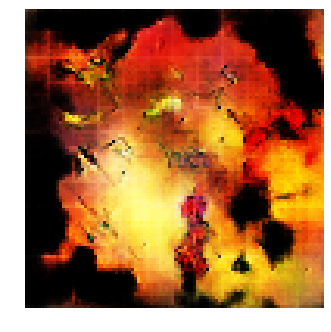


Epoch: 30640, D: -6.89, G: 3.999
Epoch: 30641, D: -6.4, G: 2.809
Epoch: 30642, D: -5.705, G: 5.233
Epoch: 30643, D: -6.548, G: 3.241
Epoch: 30644, D: -6.698, G: 4.681
Epoch: 30645, D: -6.986, G: 2.818
Epoch: 30646, D: -5.741, G: 3.896
Epoch: 30647, D: -6.314, G: 3.103
Epoch: 30648, D: -5.133, G: 6.688
Epoch: 30649, D: -5.521, G: 2.998
Epoch: 30650, D: -7.013, G: 3.889
Epoch: 30651, D: -5.277, G: 5.001
Epoch: 30652, D: -5.014, G: 4.903
Epoch: 30653, D: -7.5, G: 4.891
Epoch: 30654, D: -5.715, G: 3.732
Epoch: 30655, D: -5.21, G: 3.948
Epoch: 30656, D: -6.525, G: 3.584
Epoch: 30657, D: -5.095, G: 3.672
Epoch: 30658, D: -6.099, G: 4.055
Epoch: 30659, D: -6.229, G: 6.36


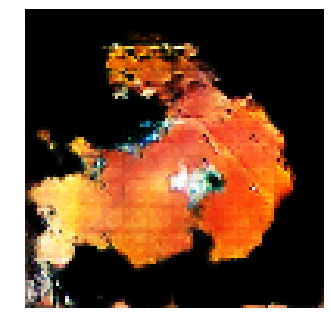


Epoch: 30660, D: -5.752, G: 3.838
Epoch: 30661, D: -6.412, G: 4.455
Epoch: 30662, D: -6.43, G: 5.152
Epoch: 30663, D: -5.662, G: 6.544
Epoch: 30664, D: -5.063, G: 4.612
Epoch: 30665, D: -5.904, G: 3.971
Epoch: 30666, D: -6.869, G: 6.188
Epoch: 30667, D: -7.702, G: 5.127
Epoch: 30668, D: -6.426, G: 3.552
Epoch: 30669, D: -7.07, G: 3.276
Epoch: 30670, D: -5.069, G: 5.329
Epoch: 30671, D: -7.795, G: 4.676
Epoch: 30672, D: -5.787, G: 3.399
Epoch: 30673, D: -6.854, G: 5.098
Epoch: 30674, D: -4.904, G: 6.061
Epoch: 30675, D: -5.218, G: 3.323
Epoch: 30676, D: -6.403, G: 3.59
Epoch: 30677, D: -4.633, G: 3.007
Epoch: 30678, D: -5.929, G: 2.477
Epoch: 30679, D: -5.548, G: 3.394


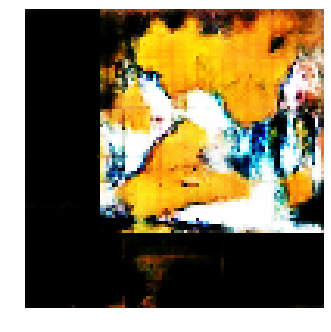


Epoch: 30680, D: -6.073, G: 4.411
Epoch: 30681, D: -7.241, G: 3.988
Epoch: 30682, D: -6.139, G: 2.184
Epoch: 30683, D: -5.28, G: 5.292
Epoch: 30684, D: -6.317, G: 6.052
Epoch: 30685, D: -6.473, G: 2.999
Epoch: 30686, D: -5.203, G: 4.383
Epoch: 30687, D: -6.931, G: 3.053
Epoch: 30688, D: -6.833, G: 4.151
Epoch: 30689, D: -6.53, G: 4.027
Epoch: 30690, D: -6.926, G: 4.05
Epoch: 30691, D: -6.044, G: 4.51
Epoch: 30692, D: -6.367, G: 2.576
Epoch: 30693, D: -4.922, G: 3.346
Epoch: 30694, D: -5.84, G: 1.431
Epoch: 30695, D: -6.076, G: 2.606
Epoch: 30696, D: -6.176, G: 1.576
Epoch: 30697, D: -6.745, G: 3.025
Epoch: 30698, D: -8.456, G: 2.813
Epoch: 30699, D: -5.975, G: 4.609


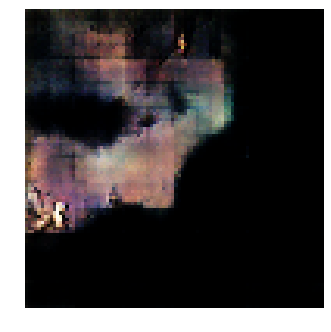


Epoch: 30700, D: -6.191, G: 5.804
Epoch: 30701, D: -4.537, G: 3.881
Epoch: 30702, D: -6.619, G: 2.518
Epoch: 30703, D: -6.287, G: 4.73
Epoch: 30704, D: -5.89, G: 4.532
Epoch: 30705, D: -7.744, G: 4.377
Epoch: 30706, D: -7.238, G: 4.307
Epoch: 30707, D: -6.616, G: 3.255
Epoch: 30708, D: -5.911, G: 5.351
Epoch: 30709, D: -7.793, G: 3.535
Epoch: 30710, D: -8.407, G: 5.806
Epoch: 30711, D: -5.124, G: 3.433
Epoch: 30712, D: -4.519, G: 3.304
Epoch: 30713, D: -5.26, G: 2.765
Epoch: 30714, D: -6.54, G: 2.434
Epoch: 30715, D: -5.616, G: 3.396
Epoch: 30716, D: -6.824, G: 6.004
Epoch: 30717, D: -5.208, G: 4.523
Epoch: 30718, D: -7.342, G: 3.606
Epoch: 30719, D: -5.898, G: 2.252


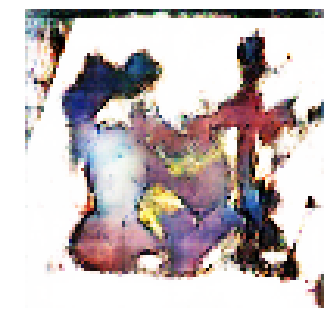


Epoch: 30720, D: -5.94, G: 5.463
Epoch: 30721, D: -5.049, G: 3.794
Epoch: 30722, D: -6.59, G: 3.656
Epoch: 30723, D: -5.267, G: 4.944
Epoch: 30724, D: -5.707, G: 3.272
Epoch: 30725, D: -6.732, G: 3.786
Epoch: 30726, D: -6.052, G: 2.652
Epoch: 30727, D: -6.919, G: 4.975
Epoch: 30728, D: -8.384, G: 3.926
Epoch: 30729, D: -7.005, G: 2.897
Epoch: 30730, D: -4.832, G: 2.688
Epoch: 30731, D: -6.808, G: 3.294
Epoch: 30732, D: -6.832, G: 3.176
Epoch: 30733, D: -5.676, G: 4.308
Epoch: 30734, D: -6.017, G: 4.031
Epoch: 30735, D: -5.638, G: 3.539
Epoch: 30736, D: -6.349, G: 0.8325
Epoch: 30737, D: -5.827, G: 4.676
Epoch: 30738, D: -4.964, G: 2.39
Epoch: 30739, D: -5.888, G: 2.335


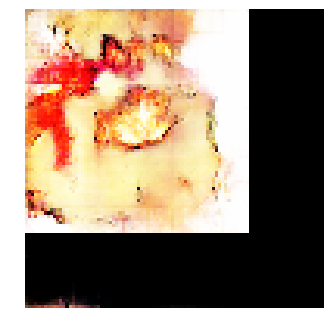


Epoch: 30740, D: -6.624, G: 4.811
Epoch: 30741, D: -5.978, G: 3.436
Epoch: 30742, D: -6.594, G: 3.546
Epoch: 30743, D: -6.539, G: 1.36
Epoch: 30744, D: -5.984, G: 5.321
Epoch: 30745, D: -6.092, G: 4.813
Epoch: 30746, D: -5.696, G: 3.178
Epoch: 30747, D: -5.003, G: 2.9
Epoch: 30748, D: -5.127, G: 4.662
Epoch: 30749, D: -6.28, G: 4.274
Epoch: 30750, D: -5.449, G: 3.883
Epoch: 30751, D: -6.847, G: 3.766
Epoch: 30752, D: -6.271, G: 2.565
Epoch: 30753, D: -5.523, G: 3.736
Epoch: 30754, D: -5.459, G: 2.163
Epoch: 30755, D: -6.277, G: 2.989
Epoch: 30756, D: -6.124, G: 2.773
Epoch: 30757, D: -7.485, G: 4.746
Epoch: 30758, D: -6.494, G: 4.459
Epoch: 30759, D: -6.849, G: 3.918


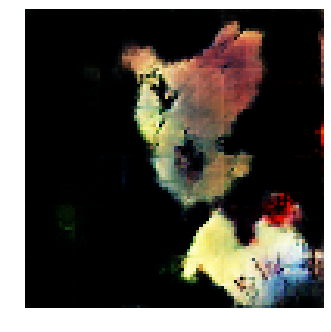


Epoch: 30760, D: -5.67, G: 2.675
Epoch: 30761, D: -4.594, G: 4.302
Epoch: 30762, D: -6.116, G: 3.505
Epoch: 30763, D: -6.364, G: 3.324
Epoch: 30764, D: -6.67, G: 4.729
Epoch: 30765, D: -4.457, G: 4.694
Epoch: 30766, D: -6.074, G: 4.67
Epoch: 30767, D: -5.786, G: 2.562
Epoch: 30768, D: -5.151, G: 3.715
Epoch: 30769, D: -6.889, G: 3.732
Epoch: 30770, D: -5.709, G: 2.882
Epoch: 30771, D: -7.079, G: 3.594
Epoch: 30772, D: -6.343, G: 2.87
Epoch: 30773, D: -6.298, G: 3.722
Epoch: 30774, D: -5.709, G: 3.256
Epoch: 30775, D: -5.623, G: 3.693
Epoch: 30776, D: -5.545, G: 2.739
Epoch: 30777, D: -7.608, G: 2.856
Epoch: 30778, D: -6.674, G: 1.816
Epoch: 30779, D: -7.947, G: 3.346


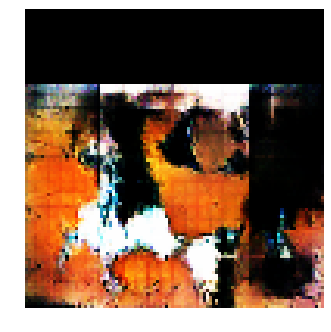


Epoch: 30780, D: -6.599, G: 2.425
Epoch: 30781, D: -6.169, G: 3.907
Epoch: 30782, D: -5.901, G: 6.3
Epoch: 30783, D: -5.867, G: 5.061
Epoch: 30784, D: -5.497, G: 3.936
Epoch: 30785, D: -6.847, G: 4.021
Epoch: 30786, D: -6.408, G: 3.541
Epoch: 30787, D: -6.504, G: 1.358
Epoch: 30788, D: -7.764, G: 3.753
Epoch: 30789, D: -7.298, G: 5.609
Epoch: 30790, D: -6.485, G: 4.721
Epoch: 30791, D: -6.559, G: 3.72
Epoch: 30792, D: -6.183, G: 3.231
Epoch: 30793, D: -5.58, G: 4.248
Epoch: 30794, D: -5.818, G: 4.385
Epoch: 30795, D: -6.709, G: 3.763
Epoch: 30796, D: -6.014, G: 4.24
Epoch: 30797, D: -5.715, G: 5.234
Epoch: 30798, D: -5.995, G: 2.769
Epoch: 30799, D: -6.608, G: 4.747


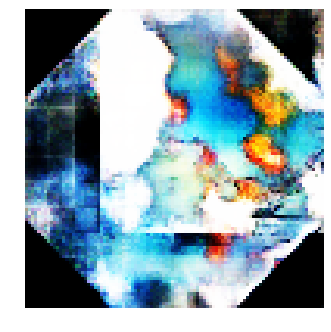


Epoch: 30800, D: -5.895, G: 2.15
Epoch: 30801, D: -7.452, G: 6.345
Epoch: 30802, D: -6.86, G: 5.36
Epoch: 30803, D: -5.112, G: 4.639
Epoch: 30804, D: -5.692, G: 4.894
Epoch: 30805, D: -6.488, G: 6.098
Epoch: 30806, D: -6.575, G: 3.486
Epoch: 30807, D: -7.777, G: 2.258
Epoch: 30808, D: -4.968, G: 5.188
Epoch: 30809, D: -7.041, G: 5.82
Epoch: 30810, D: -6.821, G: 6.014
Epoch: 30811, D: -5.532, G: 3.858
Epoch: 30812, D: -4.444, G: 4.744
Epoch: 30813, D: -5.38, G: 3.987
Epoch: 30814, D: -6.665, G: 3.182
Epoch: 30815, D: -5.876, G: 3.31
Epoch: 30816, D: -5.959, G: 5.144
Epoch: 30817, D: -5.078, G: 5.804
Epoch: 30818, D: -6.66, G: 5.397
Epoch: 30819, D: -7.848, G: 6.104


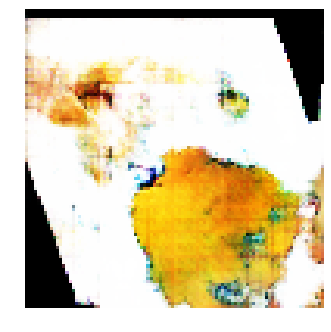


Epoch: 30820, D: -5.808, G: 3.441
Epoch: 30821, D: -5.161, G: 5.615
Epoch: 30822, D: -6.974, G: 4.578
Epoch: 30823, D: -6.038, G: 3.725
Epoch: 30824, D: -6.42, G: 3.866
Epoch: 30825, D: -6.778, G: 3.288
Epoch: 30826, D: -7.998, G: 3.708
Epoch: 30827, D: -5.622, G: 3.463
Epoch: 30828, D: -6.643, G: 5.944
Epoch: 30829, D: -5.623, G: 4.741
Epoch: 30830, D: -7.002, G: 2.969
Epoch: 30831, D: -5.513, G: 5.184
Epoch: 30832, D: -5.013, G: 3.843
Epoch: 30833, D: -6.491, G: 5.448
Epoch: 30834, D: -6.907, G: 2.771
Epoch: 30835, D: -4.726, G: 2.054
Epoch: 30836, D: -6.812, G: 3.157
Epoch: 30837, D: -5.384, G: 4.476
Epoch: 30838, D: -5.803, G: 4.827
Epoch: 30839, D: -4.655, G: 0.9508


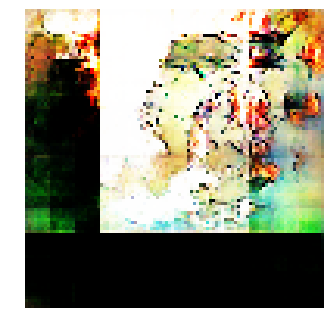


Epoch: 30840, D: -5.281, G: 2.802
Epoch: 30841, D: -6.656, G: 4.285
Epoch: 30842, D: -6.579, G: 3.466
Epoch: 30843, D: -6.089, G: 5.014
Epoch: 30844, D: -5.851, G: 3.966
Epoch: 30845, D: -4.192, G: 4.399
Epoch: 30846, D: -6.375, G: 3.914
Epoch: 30847, D: -5.786, G: 3.115
Epoch: 30848, D: -5.661, G: 3.313
Epoch: 30849, D: -6.651, G: 1.255
Epoch: 30850, D: -6.786, G: 3.954
Epoch: 30851, D: -5.966, G: 1.278
Epoch: 30852, D: -5.895, G: 4.511
Epoch: 30853, D: -7.2, G: 3.639
Epoch: 30854, D: -5.661, G: 4.039
Epoch: 30855, D: -5.652, G: 3.923
Epoch: 30856, D: -6.884, G: 4.548
Epoch: 30857, D: -6.045, G: 4.971
Epoch: 30858, D: -6.395, G: 3.027
Epoch: 30859, D: -5.793, G: 3.891


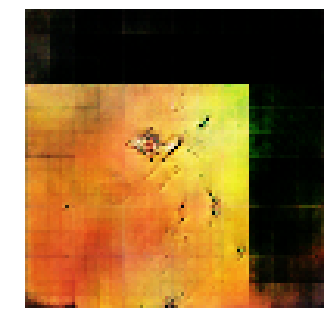


Epoch: 30860, D: -6.364, G: 4.763
Epoch: 30861, D: -6.193, G: 3.103
Epoch: 30862, D: -5.719, G: 5.047
Epoch: 30863, D: -6.758, G: 5.394
Epoch: 30864, D: -6.179, G: 2.516
Epoch: 30865, D: -5.868, G: 3.175
Epoch: 30866, D: -7.388, G: 5.666
Epoch: 30867, D: -5.71, G: 4.191
Epoch: 30868, D: -7.546, G: 3.655
Epoch: 30869, D: -6.19, G: 4.767
Epoch: 30870, D: -6.437, G: 2.908
Epoch: 30871, D: -6.395, G: 3.378
Epoch: 30872, D: -5.232, G: 4.946
Epoch: 30873, D: -7.391, G: 5.576
Epoch: 30874, D: -6.046, G: 4.066
Epoch: 30875, D: -6.417, G: 3.73
Epoch: 30876, D: -7.603, G: 3.504
Epoch: 30877, D: -6.039, G: 3.693
Epoch: 30878, D: -5.605, G: 4.452
Epoch: 30879, D: -5.859, G: 3.037


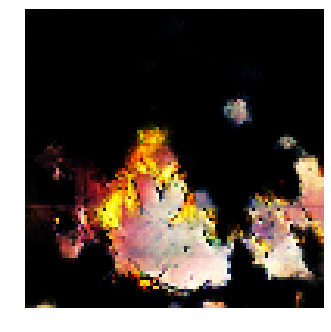


Epoch: 30880, D: -5.568, G: 3.366
Epoch: 30881, D: -5.072, G: 4.34
Epoch: 30882, D: -7.067, G: 4.217
Epoch: 30883, D: -6.31, G: 3.356
Epoch: 30884, D: -6.593, G: 5.233
Epoch: 30885, D: -6.057, G: 2.728
Epoch: 30886, D: -6.063, G: 4.22
Epoch: 30887, D: -6.995, G: 3.128
Epoch: 30888, D: -6.745, G: 3.525
Epoch: 30889, D: -5.434, G: 2.781
Epoch: 30890, D: -5.363, G: 4.763
Epoch: 30891, D: -6.092, G: 3.54
Epoch: 30892, D: -5.884, G: 3.953
Epoch: 30893, D: -5.99, G: 5.199
Epoch: 30894, D: -5.863, G: 4.172
Epoch: 30895, D: -5.598, G: 3.059
Epoch: 30896, D: -6.04, G: 4.381
Epoch: 30897, D: -6.151, G: 3.208
Epoch: 30898, D: -6.923, G: 2.854
Epoch: 30899, D: -6.695, G: 3.164


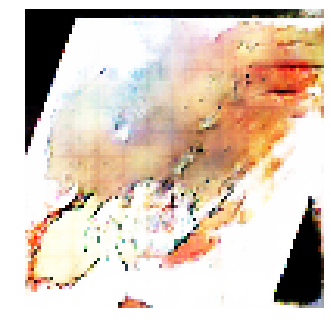


Epoch: 30900, D: -5.611, G: 4.631
Epoch: 30901, D: -5.808, G: 4.575
Epoch: 30902, D: -7.711, G: 4.652
Epoch: 30903, D: -4.386, G: 2.896
Epoch: 30904, D: -5.608, G: 5.461
Epoch: 30905, D: -6.475, G: 2.967
Epoch: 30906, D: -6.51, G: 3.902
Epoch: 30907, D: -6.51, G: 3.294
Epoch: 30908, D: -6.611, G: 4.198
Epoch: 30909, D: -6.575, G: 2.059
Epoch: 30910, D: -5.243, G: 2.743
Epoch: 30911, D: -6.383, G: 4.795
Epoch: 30912, D: -7.014, G: 3.485
Epoch: 30913, D: -6.082, G: 4.119
Epoch: 30914, D: -5.387, G: 4.429
Epoch: 30915, D: -6.922, G: 3.512
Epoch: 30916, D: -5.373, G: 4.72
Epoch: 30917, D: -8.341, G: 3.913
Epoch: 30918, D: -5.483, G: 3.445
Epoch: 30919, D: -5.419, G: 4.788


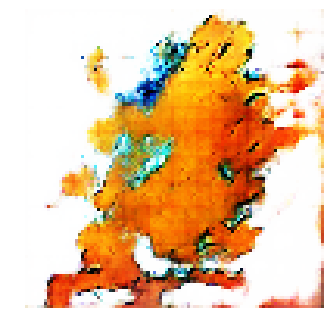


Epoch: 30920, D: -5.291, G: 2.824
Epoch: 30921, D: -5.87, G: 3.674
Epoch: 30922, D: -6.155, G: 4.796
Epoch: 30923, D: -6.253, G: 3.466
Epoch: 30924, D: -5.777, G: 3.412
Epoch: 30925, D: -5.438, G: 3.743
Epoch: 30926, D: -6.429, G: 4.134
Epoch: 30927, D: -6.413, G: 2.474
Epoch: 30928, D: -7.528, G: 6.306
Epoch: 30929, D: -5.853, G: 2.638
Epoch: 30930, D: -6.914, G: 4.066
Epoch: 30931, D: -5.218, G: 5.112
Epoch: 30932, D: -5.982, G: 2.491
Epoch: 30933, D: -6.701, G: 2.644
Epoch: 30934, D: -6.629, G: 1.967
Epoch: 30935, D: -5.34, G: 1.508
Epoch: 30936, D: -6.3, G: 3.546
Epoch: 30937, D: -6.269, G: 3.244
Epoch: 30938, D: -6.048, G: 2.202
Epoch: 30939, D: -6.035, G: 5.918


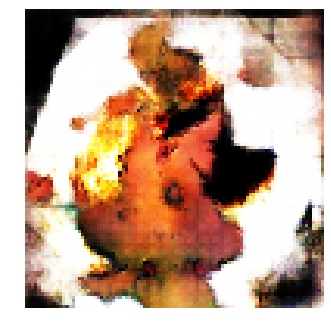


Epoch: 30940, D: -8.005, G: 3.862
Epoch: 30941, D: -5.379, G: 3.974
Epoch: 30942, D: -7.73, G: 4.296
Epoch: 30943, D: -5.382, G: 4.624
Epoch: 30944, D: -5.784, G: 4.064
Epoch: 30945, D: -6.377, G: 2.981
Epoch: 30946, D: -6.057, G: 2.543
Epoch: 30947, D: -6.707, G: 4.958
Epoch: 30948, D: -5.474, G: 3.236
Epoch: 30949, D: -7.085, G: 5.149
Epoch: 30950, D: -5.727, G: 5.581
Epoch: 30951, D: -6.201, G: 4.887
Epoch: 30952, D: -5.525, G: 3.545
Epoch: 30953, D: -6.582, G: 6.831
Epoch: 30954, D: -5.985, G: 4.304
Epoch: 30955, D: -6.745, G: 5.576
Epoch: 30956, D: -5.392, G: 3.191
Epoch: 30957, D: -6.482, G: 2.382
Epoch: 30958, D: -5.255, G: 3.455
Epoch: 30959, D: -6.248, G: 2.832


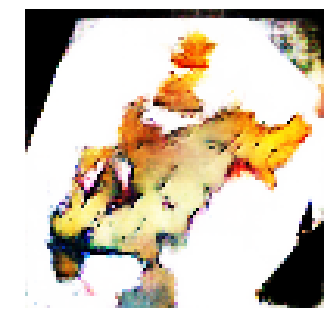


Epoch: 30960, D: -5.675, G: 4.362
Epoch: 30961, D: -5.954, G: 4.302
Epoch: 30962, D: -6.418, G: 3.245
Epoch: 30963, D: -6.577, G: 3.258
Epoch: 30964, D: -5.582, G: 4.168
Epoch: 30965, D: -5.443, G: 3.671
Epoch: 30966, D: -6.4, G: 3.349
Epoch: 30967, D: -6.656, G: 3.544
Epoch: 30968, D: -6.019, G: 3.106
Epoch: 30969, D: -5.871, G: 5.477
Epoch: 30970, D: -5.49, G: 5.563
Epoch: 30971, D: -6.235, G: 4.203
Epoch: 30972, D: -5.43, G: 3.944
Epoch: 30973, D: -5.565, G: 2.719
Epoch: 30974, D: -6.861, G: 3.575
Epoch: 30975, D: -6.524, G: 2.957
Epoch: 30976, D: -5.406, G: 3.837
Epoch: 30977, D: -7.21, G: 3.926
Epoch: 30978, D: -6.123, G: 4.742
Epoch: 30979, D: -6.12, G: 4.799


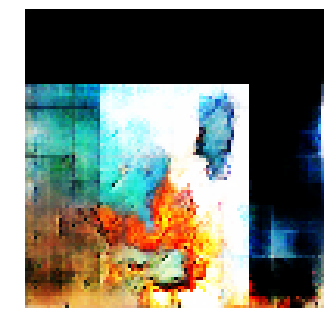


Epoch: 30980, D: -5.966, G: 4.516
Epoch: 30981, D: -6.931, G: 5.029
Epoch: 30982, D: -7.485, G: 5.624
Epoch: 30983, D: -5.787, G: 3.591
Epoch: 30984, D: -5.53, G: 6.001
Epoch: 30985, D: -5.379, G: 4.933
Epoch: 30986, D: -5.906, G: 2.017
Epoch: 30987, D: -6.149, G: 4.628
Epoch: 30988, D: -6.298, G: 4.309
Epoch: 30989, D: -5.999, G: 1.96
Epoch: 30990, D: -6.116, G: 4.432
Epoch: 30991, D: -5.225, G: 3.617
Epoch: 30992, D: -6.307, G: 2.71
Epoch: 30993, D: -6.191, G: 5.253
Epoch: 30994, D: -5.688, G: 2.406
Epoch: 30995, D: -5.934, G: 4.11
Epoch: 30996, D: -4.965, G: 4.703
Epoch: 30997, D: -5.29, G: 3.283
Epoch: 30998, D: -5.056, G: 2.876
Epoch: 30999, D: -6.021, G: 4.028


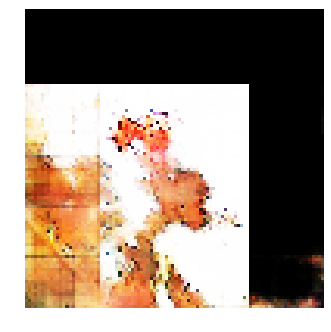


Epoch: 31000, D: -6.695, G: 1.494
Epoch: 31001, D: -6.021, G: 3.799
Epoch: 31002, D: -7.015, G: 4.614
Epoch: 31003, D: -5.584, G: 4.42
Epoch: 31004, D: -6.462, G: 3.506
Epoch: 31005, D: -6.198, G: 4.93
Epoch: 31006, D: -6.453, G: 3.633
Epoch: 31007, D: -5.508, G: 2.413
Epoch: 31008, D: -6.044, G: 2.563
Epoch: 31009, D: -5.798, G: 3.2
Epoch: 31010, D: -4.788, G: 3.768
Epoch: 31011, D: -5.721, G: 3.132
Epoch: 31012, D: -6.599, G: 3.596
Epoch: 31013, D: -5.912, G: 2.061
Epoch: 31014, D: -6.323, G: 2.469
Epoch: 31015, D: -8.141, G: 4.512
Epoch: 31016, D: -6.806, G: 3.219
Epoch: 31017, D: -6.148, G: 4.013
Epoch: 31018, D: -5.615, G: 2.971
Epoch: 31019, D: -8.786, G: 2.466


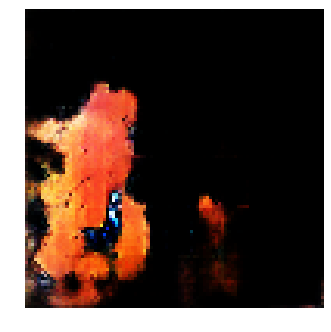


Epoch: 31020, D: -5.992, G: 4.53
Epoch: 31021, D: -7.639, G: 2.002
Epoch: 31022, D: -5.047, G: 3.313
Epoch: 31023, D: -5.797, G: 3.259
Epoch: 31024, D: -5.006, G: 2.621
Epoch: 31025, D: -8.397, G: 2.627
Epoch: 31026, D: -5.673, G: 4.388
Epoch: 31027, D: -6.633, G: 4.924
Epoch: 31028, D: -6.82, G: 2.08
Epoch: 31029, D: -5.951, G: 1.989
Epoch: 31030, D: -6.003, G: 3.812
Epoch: 31031, D: -7.308, G: 2.441
Epoch: 31032, D: -5.536, G: 5.328
Epoch: 31033, D: -5.911, G: 4.144
Epoch: 31034, D: -6.818, G: 3.185
Epoch: 31035, D: -7.673, G: 4.424
Epoch: 31036, D: -6.598, G: 4.568
Epoch: 31037, D: -7.884, G: 4.564
Epoch: 31038, D: -6.016, G: 3.477
Epoch: 31039, D: -5.361, G: 4.282


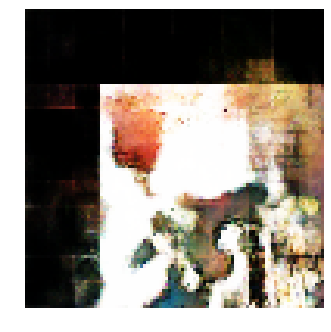


Epoch: 31040, D: -4.964, G: 3.75
Epoch: 31041, D: -7.596, G: 3.803
Epoch: 31042, D: -4.626, G: 3.985
Epoch: 31043, D: -6.467, G: 4.573
Epoch: 31044, D: -7.16, G: 4.657
Epoch: 31045, D: -4.717, G: 2.267
Epoch: 31046, D: -7.112, G: 3.686
Epoch: 31047, D: -7.179, G: 3.65
Epoch: 31048, D: -5.521, G: 1.107
Epoch: 31049, D: -6.182, G: 4.312
Epoch: 31050, D: -5.682, G: 2.957
Epoch: 31051, D: -4.517, G: 4.573
Epoch: 31052, D: -5.723, G: 3.588
Epoch: 31053, D: -6.857, G: 3.199
Epoch: 31054, D: -5.318, G: 4.235
Epoch: 31055, D: -5.484, G: 2.529
Epoch: 31056, D: -5.181, G: 3.383
Epoch: 31057, D: -6.33, G: 3.66
Epoch: 31058, D: -4.548, G: 4.232
Epoch: 31059, D: -6.548, G: 4.692


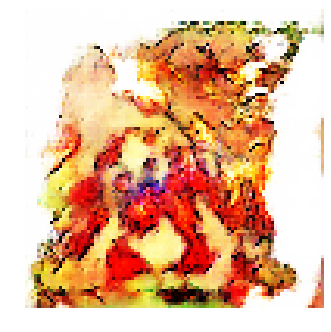


Epoch: 31060, D: -6.392, G: 2.904
Epoch: 31061, D: -6.118, G: 3.545
Epoch: 31062, D: -6.245, G: 3.788
Epoch: 31063, D: -6.719, G: 4.098
Epoch: 31064, D: -6.017, G: 4.492
Epoch: 31065, D: -5.955, G: 4.442
Epoch: 31066, D: -6.157, G: 3.343
Epoch: 31067, D: -6.563, G: 4.25
Epoch: 31068, D: -5.064, G: 3.246
Epoch: 31069, D: -5.961, G: 5.904
Epoch: 31070, D: -6.349, G: 4.529
Epoch: 31071, D: -6.708, G: 3.846
Epoch: 31072, D: -5.444, G: 3.082
Epoch: 31073, D: -6.719, G: 3.363
Epoch: 31074, D: -6.609, G: 3.819
Epoch: 31075, D: -6.599, G: 5.212
Epoch: 31076, D: -7.564, G: 5.195
Epoch: 31077, D: -5.769, G: 4.085
Epoch: 31078, D: -5.315, G: 5.175
Epoch: 31079, D: -6.608, G: 2.501


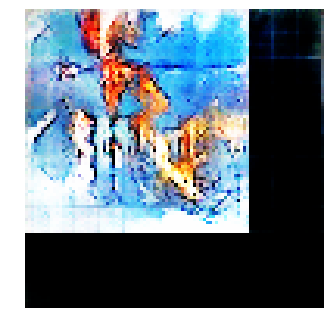


Epoch: 31080, D: -6.45, G: 4.604
Epoch: 31081, D: -7.596, G: 1.951
Epoch: 31082, D: -5.031, G: 1.578
Epoch: 31083, D: -5.473, G: 4.304
Epoch: 31084, D: -5.023, G: 4.246
Epoch: 31085, D: -5.955, G: 5.114
Epoch: 31086, D: -6.548, G: 6.33
Epoch: 31087, D: -7.038, G: 3.51
Epoch: 31088, D: -5.657, G: 3.937
Epoch: 31089, D: -6.403, G: 4.312
Epoch: 31090, D: -6.319, G: 5.463
Epoch: 31091, D: -6.069, G: 3.525
Epoch: 31092, D: -6.167, G: 2.285
Epoch: 31093, D: -4.166, G: 3.023
Epoch: 31094, D: -6.134, G: 3.923
Epoch: 31095, D: -5.075, G: 5.063
Epoch: 31096, D: -4.723, G: 3.298
Epoch: 31097, D: -6.034, G: 3.875
Epoch: 31098, D: -5.882, G: 3.707
Epoch: 31099, D: -5.984, G: 3.747


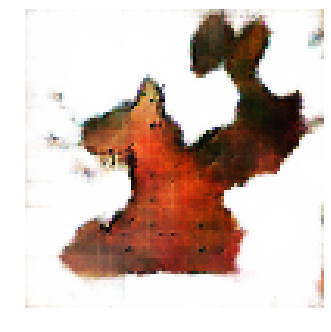


Epoch: 31100, D: -5.344, G: 5.607
Epoch: 31101, D: -5.76, G: 3.7
Epoch: 31102, D: -6.196, G: 2.478
Epoch: 31103, D: -7.126, G: 1.851
Epoch: 31104, D: -5.637, G: 3.665
Epoch: 31105, D: -5.052, G: 3.932
Epoch: 31106, D: -4.391, G: 4.274
Epoch: 31107, D: -6.859, G: 3.256
Epoch: 31108, D: -6.825, G: 5.246
Epoch: 31109, D: -6.358, G: 3.783
Epoch: 31110, D: -5.901, G: 1.693
Epoch: 31111, D: -5.954, G: 3.97
Epoch: 31112, D: -6.982, G: 3.293
Epoch: 31113, D: -4.676, G: 3.505
Epoch: 31114, D: -7.08, G: 4.127
Epoch: 31115, D: -5.936, G: 3.774
Epoch: 31116, D: -5.548, G: 4.522
Epoch: 31117, D: -6.133, G: 3.251
Epoch: 31118, D: -6.582, G: 4.227
Epoch: 31119, D: -5.752, G: 4.183


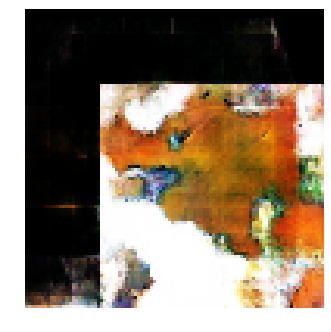


Epoch: 31120, D: -6.748, G: 4.397
Epoch: 31121, D: -5.028, G: 3.33
Epoch: 31122, D: -5.127, G: 2.462
Epoch: 31123, D: -6.739, G: 2.674
Epoch: 31124, D: -7.314, G: 4.557
Epoch: 31125, D: -7.211, G: 3.194
Epoch: 31126, D: -5.45, G: 2.599
Epoch: 31127, D: -7.802, G: 2.939
Epoch: 31128, D: -7.839, G: 6.896
Epoch: 31129, D: -5.676, G: 4.373
Epoch: 31130, D: -5.923, G: 5.054


In [0]:
#with tf.Session() as sess:
sess = tf.Session()
saver = tf.train.Saver()
#sess.run(tf.global_variables_initializer())
#print('Initialization done!')


#Test saving and loading
#save_path = saver.save(sess, 'drive/Pokemon/Checkpoints/model.ckpt')
ckpt = tf.train.latest_checkpoint('drive/Pokemon_Fire/Final_Checkpoints')
print(ckpt)
saver.restore(sess,ckpt)
print('Restored!')

run_a_gan(sess,G_train_step,G_loss,D_train_step,D_loss,G_extra_step,D_extra_step,saver,num_epoch=12000)
 
save_inputs ={"isTrain":isTrain}
save_outputs = {"generator/generator_out":G_sample}

tf.saved_model.simple_save(sess, 'drive/Pokemon_Fire/Saved_model_Final',save_inputs,save_outputs)

In [0]:
save_inputs ={"isTrain":isTrain}
save_outputs = {"generator/generator_out":G_sample}

tf.saved_model.simple_save(sess, 'drive/Pokemon/Saved_modelGP',save_inputs,save_outputs)

In [0]:
!ln -sf /opt/bin/nvidia-smi /usr/bin/nvidia-smi
!pip install gputil
!pip install psutil
!pip install humanize
import psutil
import humanize
import os
import GPUtil as GPU
GPUs = GPU.getGPUs()
# XXX: only one GPU on Colab and isn’t guaranteed
gpu = GPUs[0]
def printm():
  process = psutil.Process(os.getpid())
  print("Gen RAM Free: " + humanize.naturalsize( psutil.virtual_memory().available ), " | Proc size: " + humanize.naturalsize( process.memory_info().rss))
  print("GPU RAM Free: {0:.0f}MB | Used: {1:.0f}MB | Util {2:3.0f}% | Total {3:.0f}MB".format(gpu.memoryFree, gpu.memoryUsed, gpu.memoryUtil*100, gpu.memoryTotal))
printm()

Gen RAM Free: 10.4 GB  | Proc size: 5.2 GB
GPU RAM Free: 503MB | Used: 10936MB | Util  96% | Total 11439MB


In [0]:
!ps ax | grep python

   82 ?        Sl     0:10 /usr/bin/python2 /usr/local/bin/jupyter-notebook -y --no-browser --log-level=DEBUG --debug --NotebookApp.allow_origin="*" --NotebookApp.log_format="%(message)s" --NotebookApp.disable_check_xsrf=True --NotebookApp.token= --Session.key="" --Session.keyfile="" --ContentsManager.untitled_directory="Untitled Folder" --ContentsManager.untitled_file="Untitled File" --ContentsManager.untitled_notebook="Untitled Notebook" --KernelManager.autorestart=True --MultiKernelManager.default_kernel_name="python2" --ip="172.28.0.2" --port=9000 --port-retries=0 --notebook-dir="/content" --NotebookApp.base_url=/tun/m/gpu-1oh0mpcgklgqc/
   90 ?        Ssl  223:25 /usr/bin/python3 -m ipykernel_launcher -f /content/.local/share/jupyter/runtime/kernel-14d934e3-be51-46ed-9bdb-cf6fa1f8fa07.json
24021 ?        Ssl    0:10 /usr/bin/python3 -m ipykernel_launcher -f /content/.local/share/jupyter/runtime/kernel-bd5eb725-93eb-4089-b928-3dc6365a54c7.json
30723 pts/0    Ss+    0:00 /bin/sh -c 

In [0]:
!kill -9 90

In [0]:
#Clear everything
!kill -9 -1

In [0]:
sess.close()